In [ ]:
# import pandas as pd
# import numpy as np
# from sklearn.preprocessing import LabelEncoder
# from sklearn.metrics import f1_score, accuracy_score, confusion_matrix
# import matplotlib.pyplot as plt
# import tensorflow as tf
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, Bidirectional, Reshape
# from tensorflow.keras.callbacks import EarlyStopping

# # -------- PARAMETERS & PATHS --------
# TRAIN_PATH   = '/kaggle/input/data-btc/fix/train.csv'
# VAL_PATH     = '/kaggle/input/data-btc/fix/val.csv'
# WINDOW_SIZE  = 48    # number of past timesteps per sample (adjust as needed)
# BATCH_SIZE   = 64
# EPOCHS       = 50
# PATIENCE     = 10

# # -------- LOAD DATA --------
# df_train = pd.read_csv(TRAIN_PATH, parse_dates=['timestamp'])
# df_val   = pd.read_csv(VAL_PATH,   parse_dates=['timestamp'])

# # -------- LABEL & FEATURE COLUMNS --------
# HORIZONS   = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
# LABEL_COLS = [f'label_{h}' for h in HORIZONS]
# FEATURE_COLS = [c for c in df_train.columns 
#                 if c not in LABEL_COLS + ['timestamp','close_time']]

# # -------- ENCODE LABELS (stabil, up, down → 0,1,2 → one-hot) --------
# le = LabelEncoder()
# # fit on flattened labels from training set
# le.fit(df_train[LABEL_COLS].values.ravel())

# def encode_labels(df):
#     arr = df[LABEL_COLS].apply(lambda col: le.transform(col)).values
#     onehots = []
#     for i in range(arr.shape[1]):  # one per horizon
#         ohe = tf.keras.utils.to_categorical(arr[:, i], num_classes=3)
#         onehots.append(ohe)
#     # stack horizons as axis=1 to get shape (n_samples, n_horizons, 3)
#     return np.stack(onehots, axis=1)

# y_train_ohe = encode_labels(df_train)
# y_val_ohe   = encode_labels(df_val)

# # -------- SLIDING-WINDOW SEQUENCES --------
# def make_sequences(df, feature_cols, labels_ohe, window):
#     X, y = [], []
#     data_f = df[feature_cols].values
#     for i in range(len(df) - window):
#         X.append(data_f[i : i + window])
#         y.append(labels_ohe[i + window])
#     return np.stack(X), np.stack(y)

# X_train, y_train = make_sequences(df_train, FEATURE_COLS, y_train_ohe, WINDOW_SIZE)
# X_val,   y_val   = make_sequences(df_val,   FEATURE_COLS, y_val_ohe,   WINDOW_SIZE)

# n_features = X_train.shape[2]
# n_horizons = y_train.shape[1]  # should be len(HORIZONS)

# # -------- MODEL DEFINITION --------
# inp = Input(shape=(WINDOW_SIZE, n_features), name='input_seq')
# x   = Bidirectional(LSTM(64, return_sequences=True))(inp)
# x   = Dropout(0.2)(x)
# x   = LSTM(32)(x)
# x   = Dropout(0.2)(x)
# x   = Dense(32, activation='relu')(x)
# # produce n_horizons*3 logits, then reshape to (n_horizons, 3)
# out = Dense(n_horizons * 3, activation='softmax')(x)
# out = Reshape((n_horizons, 3), name='multi_out')(out)

# model = Model(inputs=inp, outputs=out)
# model.compile(
#     loss='categorical_crossentropy',
#     optimizer='adam',
#     metrics=['accuracy']
# )
# model.summary()

# # -------- TRAINING --------
# es = EarlyStopping(monitor='val_loss', patience=PATIENCE, restore_best_weights=True)
# history = model.fit(
#     X_train, y_train,
#     validation_data=(X_val, y_val),
#     epochs=EPOCHS,
#     batch_size=BATCH_SIZE,
#     callbacks=[es],
#     verbose=2
# )

# # -------- EVALUATION per Horizon --------
# y_pred_prob = model.predict(X_val, batch_size=BATCH_SIZE)
# y_pred = np.argmax(y_pred_prob, axis=2)  # shape = (n_samples, n_horizons)
# y_true = np.argmax(y_val,      axis=2)

# for idx, h in enumerate(HORIZONS):
#     true_h = y_true[:, idx]
#     pred_h = y_pred[:, idx]
#     f1   = f1_score(true_h, pred_h, average='macro')
#     acc  = accuracy_score(true_h, pred_h)
#     cm   = confusion_matrix(true_h, pred_h)
#     print(f'Horizon {h}: F1(macro)={f1:.4f}, Acc={acc:.4f}')

#     # plot 3×3 confusion matrix
#     fig, ax = plt.subplots(figsize=(4,4))
#     im = ax.imshow(cm, cmap=plt.cm.Blues)
#     ax.set_xticks([0,1,2]); ax.set_xticklabels(le.classes_)
#     ax.set_yticks([0,1,2]); ax.set_yticklabels(le.classes_)
#     ax.set_xlabel('Predicted'); ax.set_ylabel('True')
#     ax.set_title(f'Confusion Matrix [{h}]')
#     thresh = cm.max() / 2
#     for i in range(3):
#         for j in range(3):
#             ax.text(j, i, cm[i, j],
#                     ha='center', va='center',
#                     color='white' if cm[i, j] > thresh else 'black')
#     plt.show()


In [ ]:
# import pandas as pd
# import numpy as np
# from sklearn.preprocessing import LabelEncoder
# from sklearn.utils.class_weight import compute_class_weight
# from sklearn.metrics import f1_score, accuracy_score, confusion_matrix
# import matplotlib.pyplot as plt
# import tensorflow as tf
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import (
#     Input, LSTM, Dense, Dropout, Bidirectional,
#     Reshape, Activation, Permute, Multiply, Lambda,
#     Flatten, RepeatVector
# )
# from tensorflow.keras.callbacks import EarlyStopping
# import tensorflow.keras.backend as K

# # -------- PARAMETERS & PATHS --------
# TRAIN_PATH   = '/kaggle/input/data-btc/fix/train.csv'
# VAL_PATH     = '/kaggle/input/data-btc/fix/val.csv'
# WINDOW_SIZE  = 24    # jumlah past timesteps per sample (ubah sesuai eksperimen)
# VAR_THRESH   = 0.01  # threshold variansi untuk filter fitur
# BATCH_SIZE   = 64
# EPOCHS       = 50
# PATIENCE     = 5

# # -------- LOAD DATA --------
# df_train = pd.read_csv(TRAIN_PATH, parse_dates=['timestamp'])
# df_val   = pd.read_csv(VAL_PATH,   parse_dates=['timestamp'])

# # -------- LABEL & FEATURE COLUMNS --------
# HORIZONS   = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
# LABEL_COLS = [f'label_{h}' for h in HORIZONS]
# all_features = [c for c in df_train.columns if c not in LABEL_COLS + ['timestamp','close_time']]

# # -------- VARIANCE FILTER --------
# variances = df_train[all_features].var()
# selected_features = variances[variances >= VAR_THRESH].index.tolist()
# print(f"{len(all_features) - len(selected_features)} fitur dibuang karena variansi < {VAR_THRESH}")
# FEATURE_COLS = selected_features

# # -------- ENCODE LABELS --------
# le = LabelEncoder()
# le.fit(df_train[LABEL_COLS].values.ravel())

# def encode_labels(df):
#     arr = df[LABEL_COLS].apply(lambda col: le.transform(col)).values
#     onehots = []
#     for i in range(arr.shape[1]):
#         ohe = tf.keras.utils.to_categorical(arr[:, i], num_classes=3)
#         onehots.append(ohe)
#     return np.stack(onehots, axis=1)

# y_train_ohe = encode_labels(df_train)
# y_val_ohe   = encode_labels(df_val)

# # -------- COMPUTE CLASS WEIGHTS --------
# flat_labels = df_train[LABEL_COLS].apply(lambda col: le.transform(col)).values.flatten()
# class_weights_array = compute_class_weight('balanced', classes=[0,1,2], y=flat_labels)
# class_weights = dict(enumerate(class_weights_array))
# print("Class weights:", class_weights)

# def weighted_cce(weights):
#     weights = K.constant(weights)
#     def loss_fn(y_true, y_pred):
#         unweighted = tf.keras.losses.categorical_crossentropy(y_true, y_pred)
#         w = K.sum(y_true * weights, axis=-1)
#         return unweighted * w
#     return loss_fn

# # -------- SLIDING-WINDOW SEQUENCES --------
# def make_sequences(df, feature_cols, labels_ohe, window):
#     X, y = [], []
#     data_f = df[feature_cols].values
#     for i in range(len(df) - window):
#         X.append(data_f[i:i+window])
#         y.append(labels_ohe[i+window])
#     return np.stack(X), np.stack(y)

# X_train, y_train = make_sequences(df_train, FEATURE_COLS, y_train_ohe, WINDOW_SIZE)
# X_val,   y_val   = make_sequences(df_val,   FEATURE_COLS, y_val_ohe,   WINDOW_SIZE)

# n_features = X_train.shape[2]
# n_horizons = y_train.shape[1]

# # -------- ATTENTION LAYER FUNCTION --------
# def temporal_attention(inputs):
#     e = Dense(1, activation='tanh')(inputs)            # (batch, timesteps, 1)
#     e = Flatten()(e)                                   # (batch, timesteps)
#     alpha = Activation('softmax')(e)                   # (batch, timesteps)
#     alpha = RepeatVector(inputs.shape[-1])(alpha)      # (batch, features, timesteps)
#     alpha = Permute((2,1))(alpha)                      # (batch, timesteps, features)
#     context = Multiply()([inputs, alpha])              # (batch, timesteps, features)
#     context = Lambda(lambda x: K.sum(x, axis=1))(context)  # (batch, features)
#     return context

# # -------- MODEL DEFINITION --------
# inp = Input(shape=(WINDOW_SIZE, n_features), name='input_seq')
# x   = Bidirectional(LSTM(64, return_sequences=True))(inp)
# x   = Dropout(0.2)(x)
# attn_out = temporal_attention(x)    # (batch, 128)
# x2  = Dense(32, activation='relu')(attn_out)
# x2  = Dropout(0.2)(x2)
# out = Dense(n_horizons * 3, activation='softmax')(x2)
# out = Reshape((n_horizons, 3), name='multi_out')(out)

# model = Model(inputs=inp, outputs=out)
# model.compile(
#     loss=weighted_cce(class_weights_array),
#     optimizer='adam',
#     metrics=['accuracy']
# )
# model.summary()

# # -------- TRAINING --------
# es = EarlyStopping(monitor='val_loss', patience=PATIENCE, restore_best_weights=True)
# history = model.fit(
#     X_train, y_train,
#     validation_data=(X_val, y_val),
#     epochs=EPOCHS,
#     batch_size=BATCH_SIZE,
#     callbacks=[es],
#     verbose=2
# )

# # -------- EVALUATION per Horizon --------
# y_pred_prob = model.predict(X_val, batch_size=BATCH_SIZE)
# y_pred = np.argmax(y_pred_prob, axis=2)
# y_true = np.argmax(y_val,      axis=2)

# for idx, h in enumerate(HORIZONS):
#     true_h = y_true[:, idx]
#     pred_h = y_pred[:, idx]
#     f1   = f1_score(true_h, pred_h, average='macro')
#     acc  = accuracy_score(true_h, pred_h)
#     print(f'Horizon {h}: F1(macro)={f1:.4f}, Acc={acc:.4f}')
#     cm   = confusion_matrix(true_h, pred_h)
#     fig, ax = plt.subplots(figsize=(4,4))
#     im = ax.imshow(cm, cmap=plt.cm.Blues)
#     ax.set_xticks([0,1,2]); ax.set_xticklabels(le.classes_)
#     ax.set_yticks([0,1,2]); ax.set_yticklabels(le.classes_)
#     ax.set_title(f'Confusion Matrix [{h}]')
#     thresh = cm.max() / 2
#     for i in range(3):
#         for j in range(3):
#             ax.text(j, i, cm[i,j], ha='center', va='center',
#                     color='white' if cm[i,j]>thresh else 'black')
#     plt.show()


regresi

LSTM 1

In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping

# -------- PARAMETERS & PATHS --------
TRAIN_PATH   = '/kaggle/input/data-btc/fix/train.csv'
VAL_PATH     = '/kaggle/input/data-btc/fix/val.csv'
WINDOW_SIZE  = 48    # jumlah past timesteps per sample
BATCH_SIZE   = 64
EPOCHS       = 50
PATIENCE     = 10

# -------- LOAD & MERGE DATA --------
df_train = pd.read_csv(TRAIN_PATH, parse_dates=['timestamp'])
df_val   = pd.read_csv(VAL_PATH,   parse_dates=['timestamp'])
df_all   = pd.concat([df_train, df_val], ignore_index=True)

# -------- FEATURE & LABEL COLUMNS --------
HORIZONS   = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABEL_COLS = [f'label_{h}' for h in HORIZONS]
FEATURE_COLS = [c for c in df_all.columns 
                if c not in LABEL_COLS + ['timestamp','close_time']]

# -------- FEATURE SCALING --------
scaler = MinMaxScaler()
df_all[FEATURE_COLS] = scaler.fit_transform(df_all[FEATURE_COLS])

# -------- SLIDING-WINDOW SEQUENCES --------
def make_sequences(df, feature_cols, label_cols, window):
    X, y = [], []
    data_f = df[feature_cols].values
    data_l = df[label_cols].values
    for i in range(len(df) - window):
        X.append(data_f[i : i + window])
        y.append(data_l[i + window])
    return np.stack(X), np.stack(y)

X_all, y_all = make_sequences(df_all, FEATURE_COLS, LABEL_COLS, WINDOW_SIZE)

# -------- SPLIT KEMBALI ke TRAIN & VAL --------
n_train = len(df_train) - WINDOW_SIZE
X_train, y_train = X_all[:n_train], y_all[:n_train]
X_val,   y_val   = X_all[n_train:], y_all[n_train:]

n_features = X_train.shape[2]
n_horizons = y_train.shape[1]

# -------- MODEL DEFINITION --------
inp = Input(shape=(WINDOW_SIZE, n_features), name='input_seq')
x   = Bidirectional(LSTM(64, return_sequences=True))(inp)
x   = Dropout(0.2)(x)
x   = LSTM(32)(x)
x   = Dropout(0.2)(x)
x   = Dense(32, activation='relu')(x)
out = Dense(n_horizons, name='price_preds')(x)

model = Model(inputs=inp, outputs=out)
model.compile(
    loss='mse',
    optimizer='adam',
    metrics=[
        tf.keras.metrics.RootMeanSquaredError(name='rmse'),
        tf.keras.metrics.MeanAbsolutePercentageError(name='mape')
    ]
)
model.summary()

# -------- TRAINING (shuffle=False) --------
es = EarlyStopping(monitor='val_loss', patience=PATIENCE, restore_best_weights=True)
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=False,
    callbacks=[es],
    verbose=2
)

# -------- EVALUATION per Horizon --------
y_pred = model.predict(X_val, batch_size=BATCH_SIZE)
for idx, h in enumerate(HORIZONS):
    true = y_val[:, idx]
    pred = y_pred[:, idx]
    rmse = np.sqrt(mean_squared_error(true, pred))
    mape = mean_absolute_percentage_error(true, pred) * 100
    print(f'Horizon {h}: RMSE = {rmse:.4f}, MAPE = {mape:.2f}%')
    
    # Visualisasi sebagian
    plt.figure(figsize=(6,2))
    plt.plot(true[:100], label='Actual')
    plt.plot(pred[:100], label='Predicted')
    plt.title(f'Pred vs Actual [{h}]')
    plt.legend()
    plt.show()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_seq (InputLayer)               │ (None, 48, 161)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 48, 128)             │         115,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 48, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 32)                  │          20,608 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ price_preds (Dense)                  │ (None, 10)                  │             330 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 137,706 (537.91 KB)

 Trainable params: 137,706 (537.91 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
1003/1003 - 17s - 17ms/step - loss: 1131096960.0000 - mape: 97.2972 - rmse: 33631.7852 - val_loss: 8550438912.0000 - val_mape: 97.2049 - val_rmse: 92468.5859
Epoch 2/50
1003/1003 - 12s - 12ms/step - loss: 974709056.0000 - mape: 75.0845 - rmse: 31220.3301 - val_loss: 7842067968.0000 - val_mape: 93.0454 - val_rmse: 88555.4531
Epoch 3/50
1003/1003 - 12s - 12ms/step - loss: 798958848.0000 - mape: 56.0233 - rmse: 28265.8594 - val_loss: 7048899584.0000 - val_mape: 88.1565 - val_rmse: 83957.7266
Epoch 4/50
1003/1003 - 12s - 12ms/step - loss: 715508352.0000 - mape: 50.9972 - rmse: 26748.9883 - val_loss: 6686978560.0000 - val_mape: 85.8338 - val_rmse: 81773.9453
Epoch 5/50
1003/1003 - 12s - 12ms/step - loss: 607633536.0000 - mape: 68.4007 - rmse: 24650.2227 - val_loss: 6023140864.0000 - val_mape: 81.4021 - val_rmse: 77608.8984
Epoch 6/50
1003/1003 - 12s - 12ms/step - loss: 464774368.0000 - mape: 44.9569 - rmse: 21558.6270 - val_loss: 5226408960.0000 - val_mape: 75.7444 - val_rmse: 72

KeyboardInterrupt: 

LSTM 2

2025-06-29 09:13:04.031829: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751188384.234173      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751188384.295164      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
I0000 00:00:1751188402.204195      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Model: "lstm_td_dense_cpu_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_seq (InputLayer)    │ (None, 48, 161)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ td_dense                  │ (None, 48, 64)         │         10,368 │ input_seq[0][0]        │
│ (TimeDistributed)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 48, 64)         │              0 │ td_dense[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bilstm_1 (Bidirectional)  │ (None, 48, 256)        │        197,632 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization       │ (None, 48, 256)        │            512 │ bilstm_1[0][0]         │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 48, 256)        │              0 │ layer_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ mha (MultiHeadAttention)  │ (None, 48, 256)        │        131,712 │ dropout_1[0][0],       │
│                           │                        │                │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 48, 256)        │              0 │ dropout_1[0][0],       │
│                           │                        │                │ mha[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_1     │ (None, 48, 256)        │            512 │ add[0][0]              │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling1d  │ (None, 256)            │              0 │ layer_normalization_1… │
│ (GlobalAveragePooling1D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 64)             │         16,448 │ global_average_poolin… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 64)             │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ price_preds (Dense)       │ (None, 10)             │            650 │ dropout_3[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 357,834 (1.37 MB)

 Trainable params: 357,834 (1.37 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50


I0000 00:00:1751188419.094223      99 cuda_dnn.cc:529] Loaded cuDNN version 90300


1003/1003 - 30s - 30ms/step - loss: 0.0203 - mape: 1096.6049 - rmse: 0.1424 - val_loss: 0.1583 - val_mape: 44.6636 - val_rmse: 0.3979 - learning_rate: 0.0010
Epoch 2/50
1003/1003 - 19s - 19ms/step - loss: 0.0413 - mape: 7544.4331 - rmse: 0.2031 - val_loss: 0.1981 - val_mape: 50.1719 - val_rmse: 0.4451 - learning_rate: 0.0010
Epoch 3/50
1003/1003 - 18s - 18ms/step - loss: 0.0393 - mape: 6852.7876 - rmse: 0.1983 - val_loss: 0.2042 - val_mape: 50.9627 - val_rmse: 0.4519 - learning_rate: 0.0010
Epoch 4/50
1003/1003 - 19s - 19ms/step - loss: 0.0391 - mape: 6754.7593 - rmse: 0.1978 - val_loss: 0.2061 - val_mape: 51.2000 - val_rmse: 0.4539 - learning_rate: 0.0010
Epoch 5/50
1003/1003 - 19s - 19ms/step - loss: 0.0391 - mape: 6725.3701 - rmse: 0.1977 - val_loss: 0.2067 - val_mape: 51.2830 - val_rmse: 0.4547 - learning_rate: 0.0010
Epoch 6/50
1003/1003 - 19s - 18ms/step - loss: 0.0391 - mape: 6715.0771 - rmse: 0.1977 - val_loss: 0.2069 - val_mape: 51.3136 - val_rmse: 0.4549 - learning_rate: 0.00

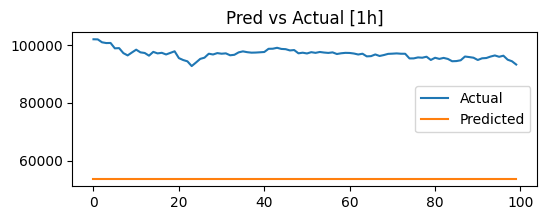

Horizon 2h: RMSE = 41048.8533, MAPE = 42.16%


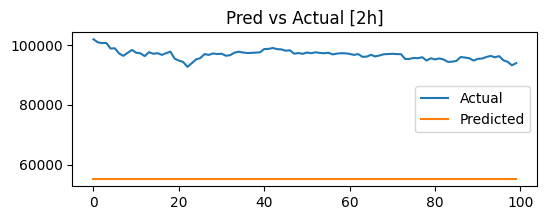

Horizon 3h: RMSE = 40736.4191, MAPE = 41.83%


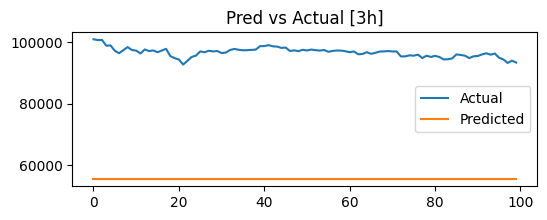

Horizon 6h: RMSE = 41660.6004, MAPE = 42.82%


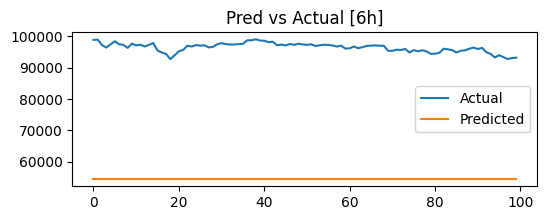

Horizon 12h: RMSE = 45343.5756, MAPE = 46.74%


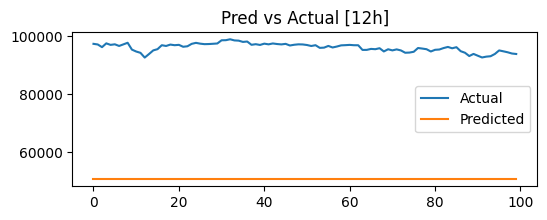

Horizon 1d: RMSE = 40343.7351, MAPE = 41.45%


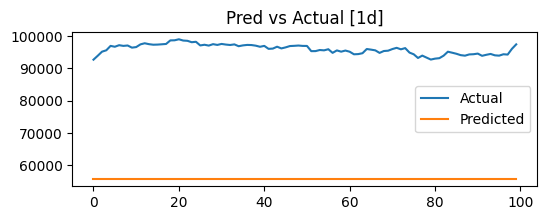

Horizon 3d: RMSE = 45606.7696, MAPE = 47.14%


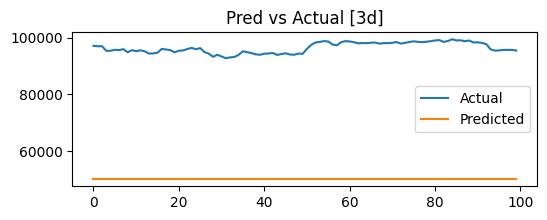

Horizon 7d: RMSE = 40968.4681, MAPE = 42.35%


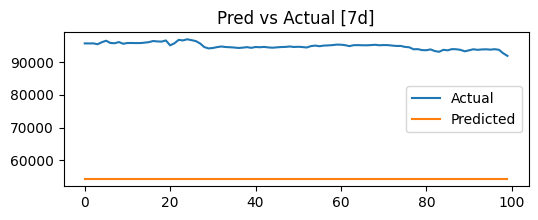

Horizon 15d: RMSE = 42225.3260, MAPE = 43.98%


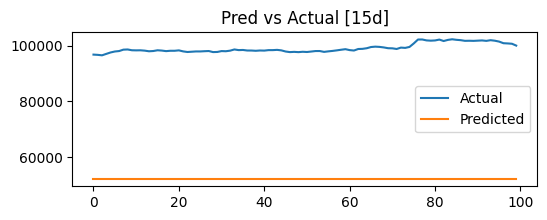

Horizon 30d: RMSE = 38291.2473, MAPE = 40.55%


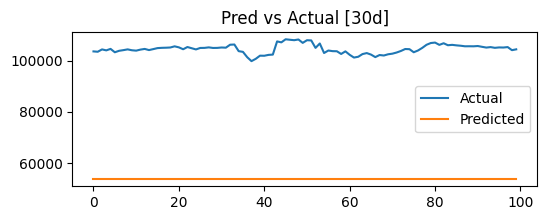

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, TimeDistributed, Dense, Dropout,
    Bidirectional, LSTM, MultiHeadAttention,
    LayerNormalization, GlobalAveragePooling1D
)
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# -------- PARAMETERS & PATHS --------
TRAIN_PATH   = '/kaggle/input/data-btc/fix/train.csv'
VAL_PATH     = '/kaggle/input/data-btc/fix/val.csv'
WINDOW_SIZE  = 48
BATCH_SIZE   = 64
EPOCHS       = 50
PATIENCE     = 10
LR           = 1e-3

# -------- LOAD & MERGE DATA --------
df_train = pd.read_csv(TRAIN_PATH, parse_dates=['timestamp'])
df_val   = pd.read_csv(VAL_PATH,   parse_dates=['timestamp'])
df_all   = pd.concat([df_train, df_val], ignore_index=True)

# -------- FEATURE & LABEL COLUMNS --------
HORIZONS   = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABEL_COLS = [f'label_{h}' for h in HORIZONS]
FEATURE_COLS = [c for c in df_all.columns 
                if c not in LABEL_COLS + ['timestamp','close_time']]

# -------- FEATURE & LABEL SCALING --------
scaler_x = MinMaxScaler()
scaler_y = MinMaxScaler()

df_all[FEATURE_COLS] = scaler_x.fit_transform(df_all[FEATURE_COLS])
df_all[LABEL_COLS]   = scaler_y.fit_transform(df_all[LABEL_COLS])

# -------- SLIDING-WINDOW SEQUENCES --------
def make_sequences(df, feat_cols, label_cols, window):
    X, y = [], []
    f = df[feat_cols].values
    l = df[label_cols].values
    for i in range(len(df) - window):
        X.append(f[i: i + window])
        y.append(l[i + window])
    return np.stack(X), np.stack(y)

X_all, y_all = make_sequences(df_all, FEATURE_COLS, LABEL_COLS, WINDOW_SIZE)

# -------- SPLIT BACK into TRAIN & VAL --------
n_train = len(df_train) - WINDOW_SIZE
X_train, y_train = X_all[:n_train], y_all[:n_train]
X_val,   y_val   = X_all[n_train:], y_all[n_train:]

n_features = X_train.shape[2]
n_horizons = y_train.shape[1]

# -------- MODEL DEFINITION dengan CPU-fallback untuk RNN --------
inp = Input(shape=(WINDOW_SIZE, n_features), name='input_seq')

# Ganti Conv1D dengan TimeDistributed(Dense)
x = TimeDistributed(Dense(64, activation='relu'), name='td_dense')(inp)
x = Dropout(0.2)(x)

# BiLSTM pada CPU (tanpa cuDNN)
with tf.device('/CPU:0'):
    x = Bidirectional(LSTM(128, return_sequences=True), name='bilstm_1')(x)
x = LayerNormalization()(x)
x = Dropout(0.2)(x)

# Self-Attention block
attn = MultiHeadAttention(num_heads=4, key_dim=32, name='mha')(x, x)
x    = tf.keras.layers.Add()([x, attn])
x    = LayerNormalization()(x)

# Pooling + Dense akhir
x = GlobalAveragePooling1D()(x)
x = Dense(64, activation='relu', name='dense_1')(x)
x = Dropout(0.2)(x)
out = Dense(n_horizons, name='price_preds')(x)

model = Model(inputs=inp, outputs=out, name='lstm_td_dense_cpu_model')
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LR),
    loss='mse',
    metrics=[
        tf.keras.metrics.RootMeanSquaredError(name='rmse'),
        tf.keras.metrics.MeanAbsolutePercentageError(name='mape')
    ]
)
model.summary()

# -------- CALLBACKS --------
es  = EarlyStopping(monitor='val_loss', patience=PATIENCE, restore_best_weights=True)
rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)

# -------- TRAINING --------
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    shuffle=False,
    callbacks=[es, rlr],
    verbose=2
)

# -------- PREDICTION & INVERSE-SCALE --------
y_pred_scaled = model.predict(X_val, batch_size=BATCH_SIZE)
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_true = scaler_y.inverse_transform(y_val)

# -------- EVALUATION per Horizon --------
for idx, h in enumerate(HORIZONS):
    true = y_true[:, idx]
    pred = y_pred[:, idx]
    rmse = np.sqrt(mean_squared_error(true, pred))
    mape = mean_absolute_percentage_error(true, pred) * 100
    print(f'Horizon {h}: RMSE = {rmse:.4f}, MAPE = {mape:.2f}%')
    
    plt.figure(figsize=(6,2))
    plt.plot(true[:100], label='Actual')
    plt.plot(pred[:100], label='Predicted')
    plt.title(f'Pred vs Actual [{h}]')
    plt.legend()
    plt.show()


LSTM 3

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 01 | Train 0.003996 | Val 0.003786
Epoch 02 | Train 0.002290 | Val 0.002574
Epoch 03 | Train 0.002208 | Val 0.002150
Epoch 04 | Train 0.002108 | Val 0.004131
Epoch 05 | Train 0.002142 | Val 0.007302
Epoch 06 | Train 0.002076 | Val 0.003049
Epoch 07 | Train 0.002036 | Val 0.002534
Epoch 08 | Train 0.001887 | Val 0.003874
Epoch 09 | Train 0.001882 | Val 0.002603
Epoch 10 | Train 0.001722 | Val 0.003181
Epoch 11 | Train 0.001733 | Val 0.001767
Epoch 12 | Train 0.001727 | Val 0.003317
Epoch 13 | Train 0.001688 | Val 0.002000
Epoch 14 | Train 0.001705 | Val 0.003080
Epoch 15 | Train 0.001707 | Val 0.002756
Epoch 16 | Train 0.001677 | Val 0.002829
Epoch 17 | Train 0.001672 | Val 0.003366
Epoch 18 | Train 0.001630 | Val 0.002741
Epoch 19 | Train 0.001613 | Val 0.002357
Epoch 20 | Train 0.001646 | Val 0.002895
Early stop at epoch 21
Horizon 1h: RMSE=2221.92, MAPE=1.94%


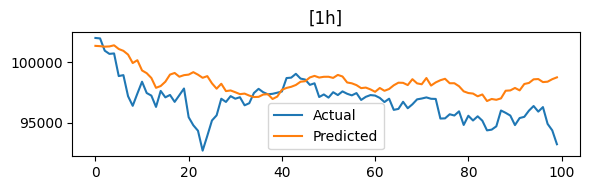

Horizon 2h: RMSE=2286.16, MAPE=1.99%


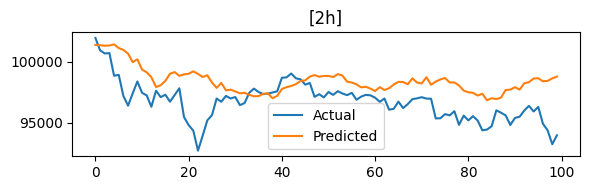

Horizon 3h: RMSE=2287.21, MAPE=1.99%


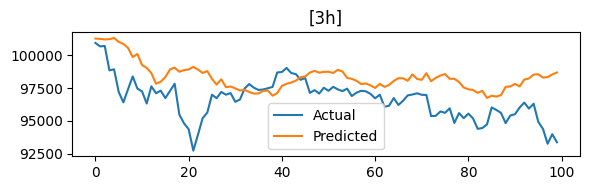

Horizon 6h: RMSE=2382.06, MAPE=2.05%


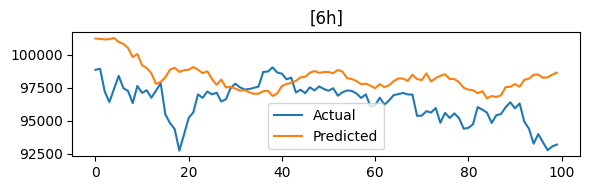

Horizon 12h: RMSE=2586.41, MAPE=2.22%


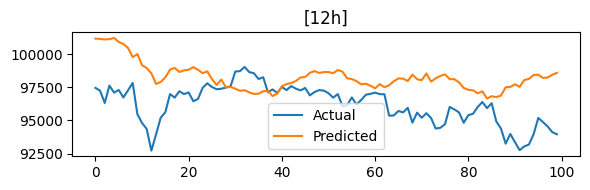

Horizon 1d: RMSE=2923.80, MAPE=2.51%


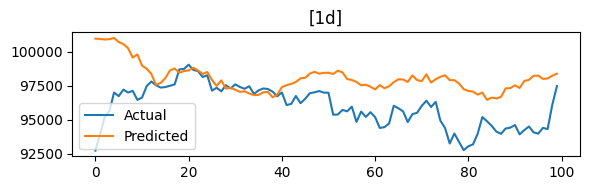

Horizon 3d: RMSE=3937.18, MAPE=3.31%


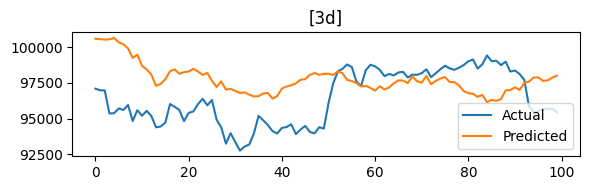

Horizon 7d: RMSE=4940.07, MAPE=3.95%


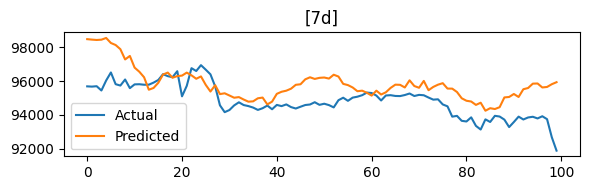

Horizon 15d: RMSE=6159.09, MAPE=5.26%


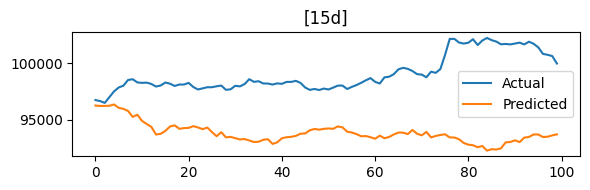

Horizon 30d: RMSE=9127.82, MAPE=8.76%


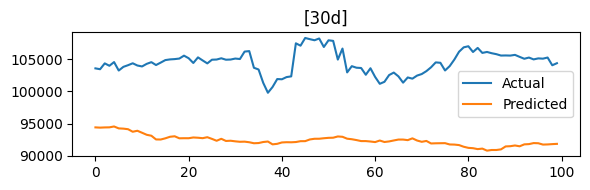

In [10]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt

# 1. PATHS & PARAMS
TRAIN_CSV   = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV     = '/kaggle/input/data-btc/fix/val.csv'
WINDOW_SIZE = 48
BATCH_SIZE  = 64
EPOCHS      = 50
LR          = 1e-3
PATIENCE    = 10
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. LOAD DATA
df_tr = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])
df    = pd.concat([df_tr, df_va], ignore_index=True)

# 3. FEATURES & LABELS
HORIZONS   = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABEL_COLS = [f'label_{h}' for h in HORIZONS]
ALL_FEATS  = [c for c in df.columns if c not in LABEL_COLS + ['timestamp','close_time']]

# 4. TREAT ALL AS TEMPORAL
TEMPORAL_FEATS = ALL_FEATS
STATIC_FEATS   = []      # kosongkan

# 5. SCALING
scaler_t = MinMaxScaler(); df[TEMPORAL_FEATS] = scaler_t.fit_transform(df[TEMPORAL_FEATS])
scaler_y = MinMaxScaler(); df[LABEL_COLS]     = scaler_y.fit_transform(df[LABEL_COLS])

# 6. SEQUENCES
def make_seq(df, temp_cols, label_cols, window):
    X, Y = [], []
    arr_t = df[temp_cols].values
    arr_y = df[label_cols].values
    for i in range(len(df)-window):
        X.append(arr_t[i:i+window])
        Y.append(arr_y[i+window])
    return np.stack(X), np.stack(Y)

X_temp, Y = make_seq(df, TEMPORAL_FEATS, LABEL_COLS, WINDOW_SIZE)

n_tr = len(df_tr) - WINDOW_SIZE
Xt_tr, y_tr = X_temp[:n_tr], Y[:n_tr]
Xt_va, y_va = X_temp[n_tr:], Y[n_tr:]

# to torch & DataLoader
def to_loader(X, y, batch, shuffle):
    ds = TensorDataset(torch.from_numpy(X).float(),
                       torch.from_numpy(y).float())
    return DataLoader(ds, batch_size=batch, shuffle=shuffle)

train_loader = to_loader(Xt_tr, y_tr, BATCH_SIZE, True)
val_loader   = to_loader(Xt_va, y_va, BATCH_SIZE, False)

# 7. MODEL (single‐branch temporal)
class TSModel(nn.Module):
    def __init__(self, n_feat, n_hor):
        super().__init__()
        self.conv = nn.Conv1d(n_feat, 64, kernel_size=3, padding=2, dilation=2)
        self.lstm = nn.LSTM(64, 128, batch_first=True, bidirectional=True)
        self.norm = nn.LayerNorm(256)
        self.attn = nn.MultiheadAttention(256, num_heads=4, batch_first=True)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.head = nn.Sequential(
            nn.Linear(256, 64), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(64, n_hor)
        )
    def forward(self, x):
        # x: (B,T,F) -> (B,F,T)
        x = x.permute(0,2,1)
        x = self.conv(x)
        x = x.permute(0,2,1)     # (B,T,64)
        x,_ = self.lstm(x)       # (B,T,256)
        x = self.norm(x)
        att,_ = self.attn(x,x,x)
        x = self.norm(x + att)
        x = x.permute(0,2,1)     # (B,256,T)
        x = self.pool(x).squeeze(-1)  # (B,256)
        return self.head(x)      # (B,n_hor)

n_feat = len(TEMPORAL_FEATS)
n_hor  = len(HORIZONS)
model  = TSModel(n_feat, n_hor).to(DEVICE)

# 8. LOSS, OPTIMIZER, SCHEDULER
criterion = nn.MSELoss()
opt       = torch.optim.Adam(model.parameters(), lr=LR)
sched     = torch.optim.lr_scheduler.ReduceLROnPlateau(
    opt, 'min', factor=0.5, patience=5, min_lr=1e-6, verbose=True
)

# 9. TRAINING LOOP
best, cnt = np.inf, 0
for ep in range(1, EPOCHS+1):
    model.train()
    tr_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(DEVICE), yb.to(DEVICE)
        opt.zero_grad()
        loss = criterion(model(xb), yb)
        loss.backward(); opt.step()
        tr_losses.append(loss.item())

    model.eval(); va_losses, preds, trues = [], [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            out = model(xb)
            va_losses.append(criterion(out, yb).item())
            preds.append(out.cpu().numpy()); trues.append(yb.cpu().numpy())

    mt, mv = np.mean(tr_losses), np.mean(va_losses)
    sched.step(mv)
    if mv < best:
        best, cnt = mv, 0; torch.save(model.state_dict(), 'best.pth')
    else:
        cnt += 1
        if cnt >= PATIENCE:
            print(f"Early stop at epoch {ep}"); break

    print(f"Epoch {ep:02d} | Train {mt:.6f} | Val {mv:.6f}")

# 10. EVALUASI
model.load_state_dict(torch.load('best.pth'))
model.eval()
all_p, all_t = [], []
with torch.no_grad():
    for xb, yb in val_loader:
        p = model(xb.to(DEVICE)).cpu().numpy()
        all_p.append(p); all_t.append(yb.numpy())

y_pred = scaler_y.inverse_transform(np.vstack(all_p))
y_true = scaler_y.inverse_transform(np.vstack(all_t))

for i,h in enumerate(HORIZONS):
    rmse = np.sqrt(mean_squared_error(y_true[:,i], y_pred[:,i]))
    mape = mean_absolute_percentage_error(y_true[:,i], y_pred[:,i]) * 100
    print(f"Horizon {h}: RMSE={rmse:.2f}, MAPE={mape:.2f}%")
    plt.figure(figsize=(6,2))
    plt.plot(y_true[:100,i], label='Actual')
    plt.plot(y_pred[:100,i], label='Predicted')
    plt.title(f"[{h}]"); plt.legend(); plt.tight_layout(); plt.show()


LSTM 4

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 01 | Train Loss: 0.005146 | Val Loss: 0.001568
Epoch 02 | Train Loss: 0.005031 | Val Loss: 0.001674
Epoch 03 | Train Loss: 0.005043 | Val Loss: 0.001687
Epoch 04 | Train Loss: 0.005044 | Val Loss: 0.001600
Epoch 05 | Train Loss: 0.005044 | Val Loss: 0.001643
Epoch 06 | Train Loss: 0.005044 | Val Loss: 0.001689
Epoch 07 | Train Loss: 0.005043 | Val Loss: 0.001642
Epoch 08 | Train Loss: 0.005042 | Val Loss: 0.001715
Epoch 09 | Train Loss: 0.005042 | Val Loss: 0.001620
Epoch 10 | Train Loss: 0.005042 | Val Loss: 0.001579
Early stop at epoch 11
Horizon 1h: RMSE = 88293794.44, MAPE = 0.58%


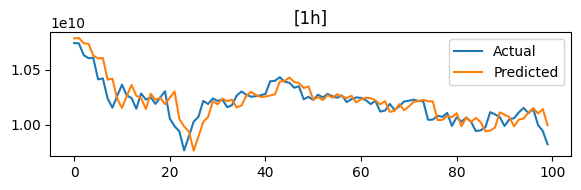

Horizon 2h: RMSE = 108980946.28, MAPE = 0.72%


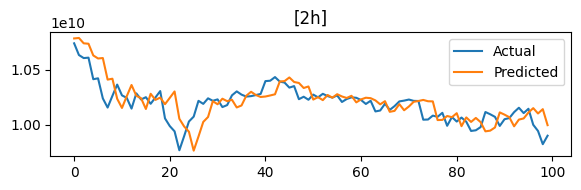

Horizon 3h: RMSE = 125250324.09, MAPE = 0.84%


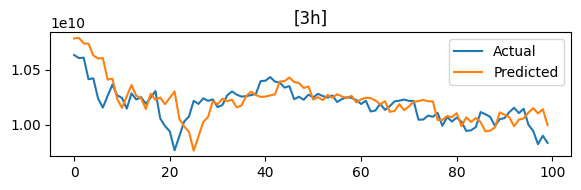

Horizon 6h: RMSE = 165550129.90, MAPE = 1.13%


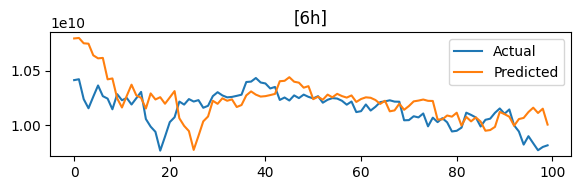

Horizon 12h: RMSE = 221323064.77, MAPE = 1.60%


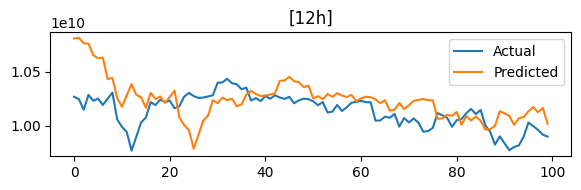

Horizon 1d: RMSE = 289238596.19, MAPE = 2.20%


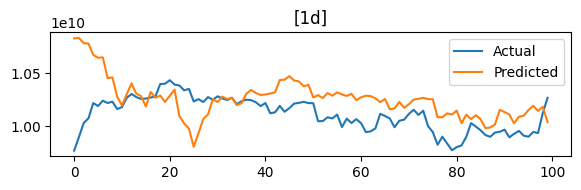

Horizon 3d: RMSE = 430340525.89, MAPE = 3.33%


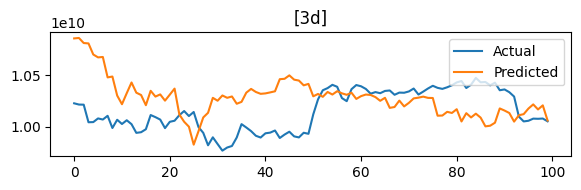

Horizon 7d: RMSE = 612439669.60, MAPE = 4.92%


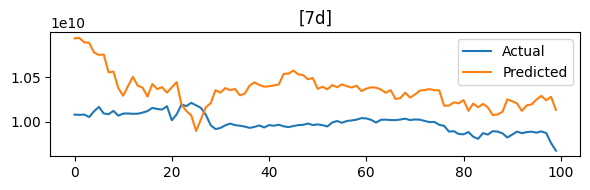

Horizon 15d: RMSE = 848241170.44, MAPE = 7.36%


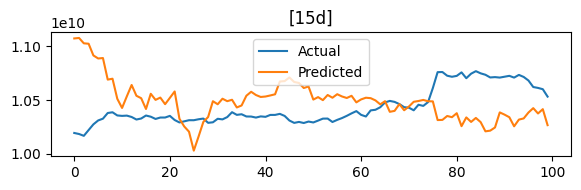

Horizon 30d: RMSE = 1354723122.90, MAPE = 12.39%


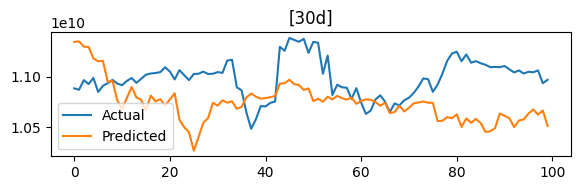

In [2]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt

# -----------------------
# 1. PARAMETERS & PATHS
# -----------------------
TRAIN_CSV   = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV     = '/kaggle/input/data-btc/fix/val.csv'
WINDOW_SIZE = 48
BATCH_SIZE  = 64
EPOCHS      = 50
LR          = 1e-3
PATIENCE    = 10
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# -----------------------
# 2. LOAD DATA
# -----------------------
df_tr = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])
df    = pd.concat([df_tr, df_va], ignore_index=True)

# -----------------------
# 3. FEATURES & LABELS
# -----------------------
HORIZONS   = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABEL_COLS = [f'label_{h}' for h in HORIZONS]
ALL_FEATS  = [c for c in df.columns if c not in LABEL_COLS + ['timestamp','close_time']]
TEMPORAL_FEATS = ALL_FEATS  # use all features as temporal

# -----------------------
# 4. SCALING
# -----------------------
scaler_t = MinMaxScaler()
scaler_t.fit(df_tr[TEMPORAL_FEATS])
df_tr[TEMPORAL_FEATS] = scaler_t.transform(df_tr[TEMPORAL_FEATS])
df_va[TEMPORAL_FEATS] = scaler_t.transform(df_va[TEMPORAL_FEATS])

scaler_y = MinMaxScaler()
scaler_y.fit(df_tr[LABEL_COLS])
df_tr[LABEL_COLS] = scaler_y.transform(df_tr[LABEL_COLS])
df_va[LABEL_COLS] = scaler_y.transform(df_va[LABEL_COLS])

# -----------------------
# 5. SEQUENCE PREPARATION
# -----------------------
idx_close = TEMPORAL_FEATS.index('close')

def make_seq_returns(df, feat_cols, label_cols, window):
    X, Y = [], []
    arr_f = df[feat_cols].values
    arr_y = df[label_cols].values
    for i in range(len(df) - window):
        seq      = arr_f[i:i+window]
        last_close = seq[-1, idx_close]
        deltas     = (arr_y[i+window] - last_close) / last_close
        X.append(seq)
        Y.append(deltas)
    return np.stack(X), np.stack(Y)

X_all, Y_all = make_seq_returns(df, TEMPORAL_FEATS, LABEL_COLS, WINDOW_SIZE)
n_tr = len(df_tr) - WINDOW_SIZE
Xt_tr, Y_tr = X_all[:n_tr], Y_all[:n_tr]
Xt_va, Y_va = X_all[n_tr:], Y_all[n_tr:]

# -----------------------
# 6. DATALOADERS
# -----------------------
def to_loader(X, Y, batch, shuffle):
    ds = TensorDataset(torch.from_numpy(X).float(),
                       torch.from_numpy(Y).float())
    return DataLoader(ds, batch_size=batch, shuffle=shuffle)

train_loader = to_loader(Xt_tr, Y_tr, BATCH_SIZE, True)
val_loader   = to_loader(Xt_va, Y_va, BATCH_SIZE, False)

# -----------------------
# 7. MODEL DEFINITION
# -----------------------
class TSDeltaModel(nn.Module):
    def __init__(self, n_feat, n_hor):
        super().__init__()
        self.conv = nn.Conv1d(n_feat, 64, kernel_size=3,
                              padding=2, dilation=2)
        self.lstm = nn.LSTM(64, 128, batch_first=True,
                            bidirectional=True)
        self.norm = nn.LayerNorm(256)
        self.attn = nn.MultiheadAttention(256, num_heads=4,
                                           batch_first=True)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.head = nn.Sequential(
            nn.Linear(256, 64), nn.ReLU(), nn.Dropout(0.2),
            nn.Linear(64, n_hor)
        )

    def forward(self, x):
        x = x.permute(0,2,1)            # (B,F,T) :contentReference[oaicite:8]{index=8}
        x = self.conv(x)                # Conv1d kausal
        x = x.permute(0,2,1)            # (B,T,64)
        x, _ = self.lstm(x)             # (B,T,256)
        x = self.norm(x)
        att, _ = self.attn(x, x, x)     # Multi-Head Attention :contentReference[oaicite:9]{index=9}
        x = self.norm(x + att)
        x = x.permute(0,2,1)            # (B,256,T)
        x = self.pool(x).squeeze(-1)    # (B,256) :contentReference[oaicite:10]{index=10}
        return self.head(x)             # (B, n_hor)

n_feat = len(TEMPORAL_FEATS)
n_hor  = len(HORIZONS)
model  = TSDeltaModel(n_feat, n_hor).to(DEVICE)

# -----------------------
# 8. LOSS, OPTIMIZER, SCHEDULER
# -----------------------
criterion = nn.HuberLoss(delta=1.0)  # robust to outliers :contentReference[oaicite:11]{index=11}
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5,
    patience=5, verbose=True
)  # learning rate adjustment :contentReference[oaicite:12]{index=12}

# -----------------------
# 9. TRAINING LOOP
# -----------------------
best_loss, patience_cnt = float('inf'), 0

for epoch in range(1, EPOCHS+1):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(DEVICE), yb.to(DEVICE)
        optimizer.zero_grad()
        preds = model(xb)
        loss  = criterion(preds, yb)  # Huber loss on deltas
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    model.eval()
    val_losses, all_preds, all_trues = [], [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            preds  = model(xb)
            val_losses.append(criterion(preds, yb).item())
            all_preds.append(preds.cpu().numpy())
            all_trues.append(yb.cpu().numpy())

    avg_tr = np.mean(train_losses)
    avg_va = np.mean(val_losses)
    scheduler.step(avg_va)

    if avg_va < best_loss:
        best_loss, patience_cnt = avg_va, 0
        torch.save(model.state_dict(), 'best_model.pth')
    else:
        patience_cnt += 1
        if patience_cnt >= PATIENCE:
            print(f"Early stop at epoch {epoch}")
            break

    print(f"Epoch {epoch:02d} | Train Loss: {avg_tr:.6f} | Val Loss: {avg_va:.6f}")

# -----------------------
# 10. EVALUATION & INFERENCE
# -----------------------
model.load_state_dict(torch.load('best_model.pth'))
model.eval()

preds_list, trues_list = [], []
with torch.no_grad():
    for xb, yb in val_loader:
        xb = xb.to(DEVICE)
        delta_pred = model(xb)                              # (B, n_hor)
        last_close = xb[:, -1, idx_close].unsqueeze(1)      # anchor price
        price_pred = last_close * (1 + delta_pred)          # reconstruct price
        preds_list.append(price_pred.cpu().numpy())
        trues_list.append(yb.cpu().numpy())

y_pred = scaler_y.inverse_transform(np.vstack(preds_list))
# reconstruct actual prices: P_true = P_last * (1 + delta_true)
y_true = scaler_y.inverse_transform(
    (np.vstack(trues_list) + 1) * 
    Xt_va[:, -1, idx_close].reshape(-1,1)
)

for i, h in enumerate(HORIZONS):
    rmse = np.sqrt(mean_squared_error(y_true[:,i], y_pred[:,i]))
    mape = mean_absolute_percentage_error(y_true[:,i], y_pred[:,i]) * 100
    print(f"Horizon {h}: RMSE = {rmse:.2f}, MAPE = {mape:.2f}%")
    plt.figure(figsize=(6,2))
    plt.plot(y_true[:100,i], label='Actual')
    plt.plot(y_pred[:100,i], label='Predicted')
    plt.title(f'[{h}]'); plt.legend(); plt.tight_layout(); plt.show()


LSTM 5

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 01 | Train 0.005167 | Val 0.001579
Epoch 02 | Train 0.005044 | Val 0.001752
Epoch 03 | Train 0.005044 | Val 0.001613
Epoch 04 | Train 0.005044 | Val 0.001549
Epoch 05 | Train 0.005044 | Val 0.001698
Epoch 06 | Train 0.005044 | Val 0.001711
Epoch 07 | Train 0.005044 | Val 0.001592
Epoch 08 | Train 0.005043 | Val 0.001678
Epoch 09 | Train 0.005044 | Val 0.001613
Epoch 10 | Train 0.005044 | Val 0.001653
Epoch 11 | Train 0.005042 | Val 0.001624
Epoch 12 | Train 0.005042 | Val 0.001630
Epoch 13 | Train 0.005043 | Val 0.001617
Early stop at epoch 14
Horizon 1h: RMSE = $857.24, MAPE = 0.60%


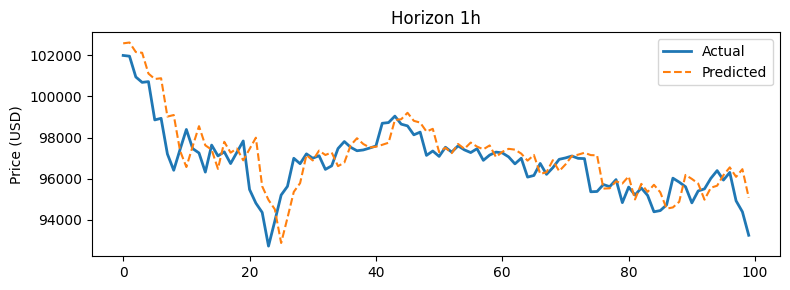

Horizon 2h: RMSE = $1,044.21, MAPE = 0.73%


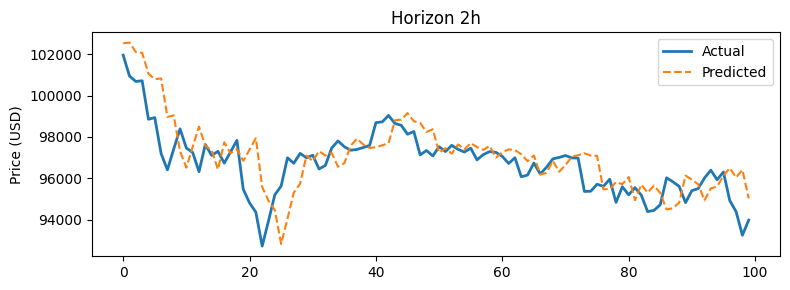

Horizon 3h: RMSE = $1,202.77, MAPE = 0.85%


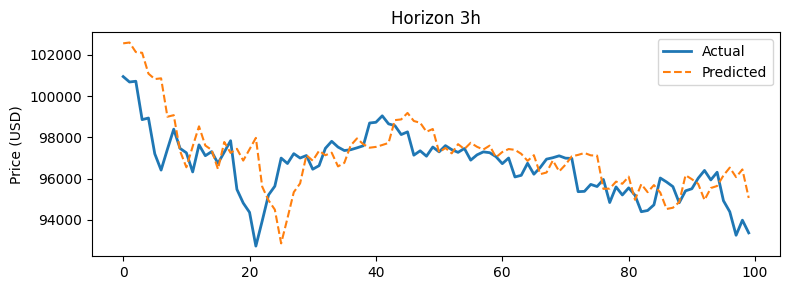

Horizon 6h: RMSE = $1,568.57, MAPE = 1.12%


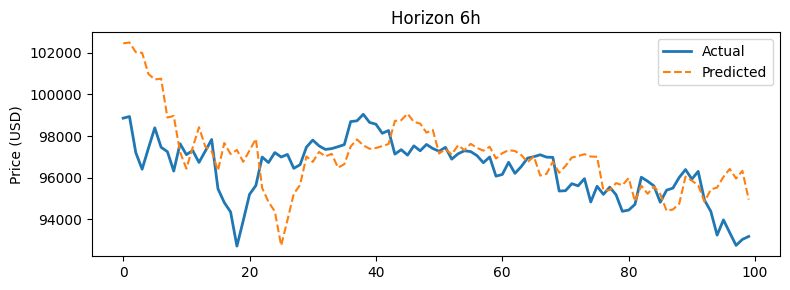

Horizon 12h: RMSE = $2,103.37, MAPE = 1.60%


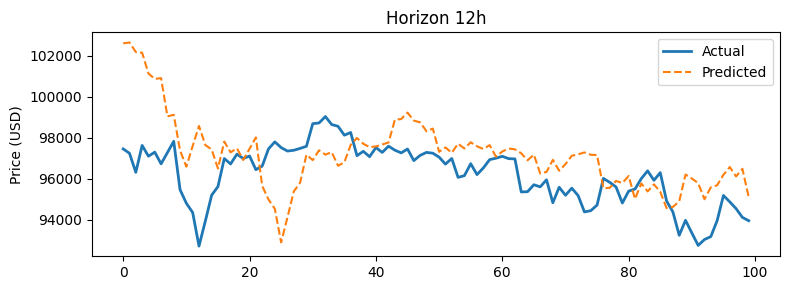

Horizon 1d: RMSE = $2,734.37, MAPE = 2.19%


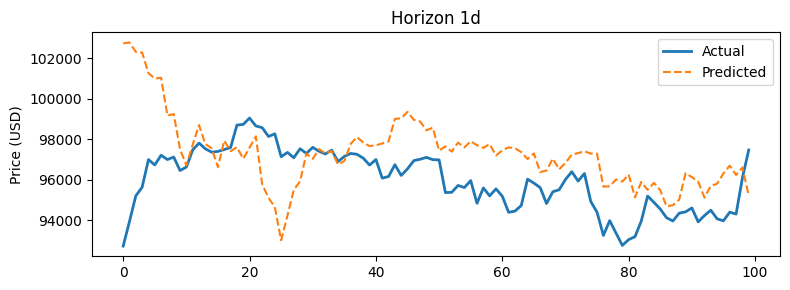

Horizon 3d: RMSE = $4,065.82, MAPE = 3.31%


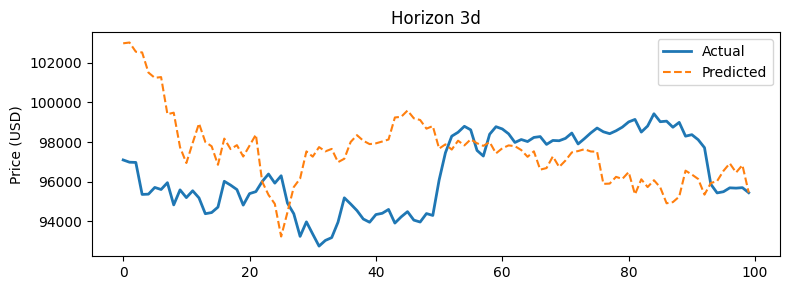

Horizon 7d: RMSE = $5,782.27, MAPE = 4.88%


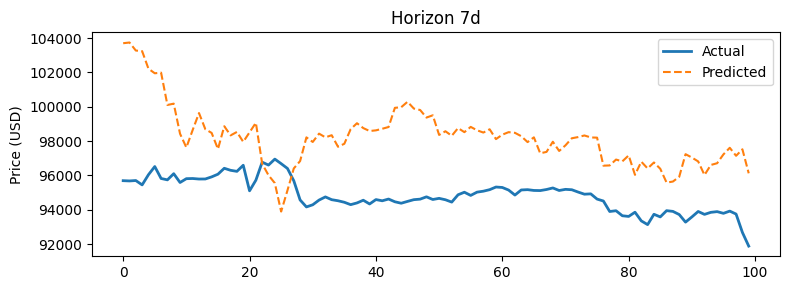

Horizon 15d: RMSE = $7,970.35, MAPE = 7.29%


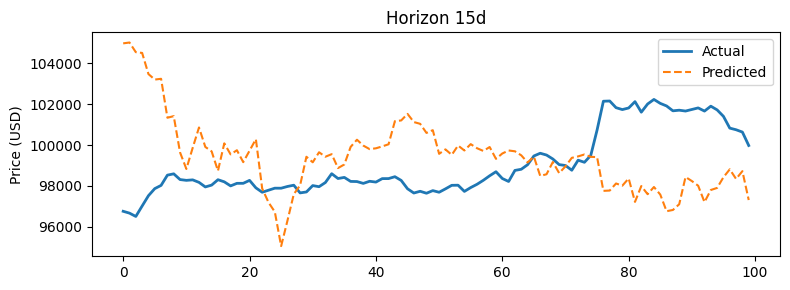

Horizon 30d: RMSE = $12,819.63, MAPE = 12.31%


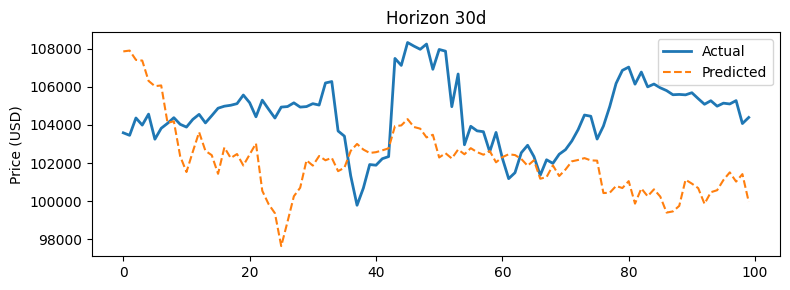

In [5]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt

# -----------------------
# 1. PARAMETERS & PATHS
# -----------------------
TRAIN_CSV   = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV     = '/kaggle/input/data-btc/fix/val.csv'
WINDOW_SIZE = 48
BATCH_SIZE  = 64
EPOCHS      = 50
LR          = 1e-3
PATIENCE    = 10
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# -----------------------
# 2. LOAD RAW & SCALED DATA
# -----------------------
# 2.1 Baca raw (untuk indexing dan reconstruct)
df_tr_raw = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va_raw = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])
df_raw_all = pd.concat([df_tr_raw, df_va_raw], ignore_index=True).reset_index(drop=True)

# 2.2 Baca copy untuk scaling & modeling
df_tr = df_tr_raw.copy()
df_va = df_va_raw.copy()
df_all = pd.concat([df_tr, df_va], ignore_index=True).reset_index(drop=True)

# -----------------------
# 3. FEATURE & LABEL SETUP
# -----------------------
HORIZONS    = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABEL_COLS  = [f'label_{h}' for h in HORIZONS]
ALL_FEATS   = [c for c in df_all.columns if c not in LABEL_COLS + ['timestamp','close_time']]

# Gunakan semua fitur sebagai temporal:
TEMPORAL_FEATS = ALL_FEATS

# -----------------------
# 4. SCALING (Train-only)
# -----------------------
scaler_t = MinMaxScaler()
scaler_t.fit(df_tr[TEMPORAL_FEATS])
df_tr[TEMPORAL_FEATS] = scaler_t.transform(df_tr[TEMPORAL_FEATS])
df_va[TEMPORAL_FEATS] = scaler_t.transform(df_va[TEMPORAL_FEATS])

scaler_y = MinMaxScaler()
scaler_y.fit(df_tr[LABEL_COLS])
df_tr[LABEL_COLS] = scaler_y.transform(df_tr[LABEL_COLS])
df_va[LABEL_COLS] = scaler_y.transform(df_va[LABEL_COLS])

# -----------------------
# 5. PREPARE RAW ARRAYS
# -----------------------
# Untuk reconstruct harga dan menghitung delta di raw space
raw_close  = df_raw_all['close'].values                 # (N_total,)
raw_labels = df_raw_all[LABEL_COLS].values              # (N_total, 10)

# -----------------------
# 6. MAKE SEQUENCES OF DELTAS
# -----------------------
idx_close = TEMPORAL_FEATS.index('close')

def make_seq_returns(df_scaled, raw_close, raw_labels, feat_cols, window):
    X, Y, raw_cls, raw_labs = [], [], [], []
    arr_f = df_scaled[feat_cols].values
    N = len(df_scaled)
    for i in range(N - window):
        seq       = arr_f[i : i + window]
        last_cl   = raw_close[i + window - 1]
        future_pr = raw_labels[i + window]          # vector size = 10 horizons
        delta     = (future_pr - last_cl) / last_cl
        X.append(seq)
        Y.append(delta)
        raw_cls.append(last_cl)
        raw_labs.append(future_pr)
    return (
        np.stack(X),            # (N-win, window, n_feat)
        np.stack(Y),            # (N-win, n_horizons)
        np.array(raw_cls),      # (N-win,)
        np.stack(raw_labs)      # (N-win, n_horizons)
    )

X_all, Y_all, last_close_all, true_price_all = make_seq_returns(
    df_all, raw_close, raw_labels, TEMPORAL_FEATS, WINDOW_SIZE
)

# -----------------------
# 7. SPLIT TRAIN & VAL
# -----------------------
n_tr = len(df_tr) - WINDOW_SIZE
X_tr,  Y_tr,  lc_tr, tp_tr = \
    X_all[:n_tr],  Y_all[:n_tr],  last_close_all[:n_tr],  true_price_all[:n_tr]
X_va,  Y_va,  lc_va, tp_va = \
    X_all[n_tr:],  Y_all[n_tr:],  last_close_all[n_tr:],  true_price_all[n_tr:]

# -----------------------
# 8. DATALOADER
# -----------------------
train_ds = TensorDataset(
    torch.from_numpy(X_tr).float(),
    torch.from_numpy(Y_tr).float()
)
val_ds   = TensorDataset(
    torch.from_numpy(X_va).float(),
    torch.from_numpy(Y_va).float()
)
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)

# -----------------------
# 9. MODEL DEFINITION
# -----------------------
class TSDeltaModel(nn.Module):
    def __init__(self, n_feat, n_hor):
        super().__init__()
        self.conv = nn.Conv1d(n_feat, 64,
                              kernel_size=3, padding=2, dilation=2)
        self.lstm = nn.LSTM(64, 128,
                            batch_first=True, bidirectional=True)
        self.norm = nn.LayerNorm(256)
        self.attn = nn.MultiheadAttention(256, num_heads=4,
                                           batch_first=True)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.head = nn.Sequential(
            nn.Linear(256, 64),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(64, n_hor)
        )
    def forward(self, x):
        # x: (B, T, F) -> (B, F, T)
        x = x.permute(0,2,1)
        x = self.conv(x)
        x = x.permute(0,2,1)           # (B, T, 64)
        x, _ = self.lstm(x)            # (B, T, 256)
        x = self.norm(x)
        att, _ = self.attn(x, x, x)
        x = self.norm(x + att)
        x = x.permute(0,2,1)           # (B, 256, T)
        x = self.pool(x).squeeze(-1)   # (B, 256)
        return self.head(x)            # (B, n_horizons)

n_feat = len(TEMPORAL_FEATS)
n_hor  = len(HORIZONS)
model  = TSDeltaModel(n_feat, n_hor).to(DEVICE)

# -----------------------
# 10. LOSS, OPT & SCHED
# -----------------------
criterion = nn.HuberLoss(delta=1.0)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5,
    patience=5, verbose=True
)

# -----------------------
# 11. TRAINING LOOP
# -----------------------
best_val = float('inf')
pat_cnt  = 0

for ep in range(1, EPOCHS+1):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb, yb = xb.to(DEVICE), yb.to(DEVICE)
        optimizer.zero_grad()
        pred_d = model(xb)
        loss   = criterion(pred_d, yb)
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    model.eval()
    val_losses = []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            pred_d = model(xb)
            val_losses.append(criterion(pred_d, yb).item())

    tr_loss = np.mean(train_losses)
    va_loss = np.mean(val_losses)
    scheduler.step(va_loss)

    # early stopping
    if va_loss < best_val:
        best_val = va_loss
        pat_cnt  = 0
        torch.save(model.state_dict(), 'best.pth')
    else:
        pat_cnt += 1
        if pat_cnt >= PATIENCE:
            print(f"Early stop at epoch {ep}")
            break

    print(f"Epoch {ep:02d} | Train {tr_loss:.6f} | Val {va_loss:.6f}")

# -----------------------
# 12. INFERENCE & EVALUATION
# -----------------------
model.load_state_dict(torch.load('best.pth'))
model.eval()

# Vectorized inference on full val set
X_va_t = torch.from_numpy(X_va).float().to(DEVICE)
with torch.no_grad():
    delta_pred_va = model(X_va_t).cpu().numpy()    # (N_va,10)

# Rekonstruksi harga prediksi & ambil harga actual dari raw arrays
price_pred_va = lc_va[:,None] * (1.0 + delta_pred_va)   # (N_va,10)
price_true_va = tp_va                                  

# Hitung RMSE & MAPE pada harga asli
for i,h in enumerate(HORIZONS):
    rmse = np.sqrt(mean_squared_error(price_true_va[:,i], price_pred_va[:,i]))
    mape = mean_absolute_percentage_error(price_true_va[:,i], price_pred_va[:,i]) * 100
    print(f"Horizon {h}: RMSE = ${rmse:,.2f}, MAPE = {mape:.2f}%")

    # Plot 100 pertama
    plt.figure(figsize=(8,3))
    plt.plot(price_true_va[:100,i], label='Actual', linewidth=2)
    plt.plot(price_pred_va[:100,i], label='Predicted', linestyle='--')
    plt.ylabel('Price (USD)')
    plt.title(f'Horizon {h}')
    plt.legend()
    plt.tight_layout()
    plt.show()


LSTM 6

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 01 | Train 0.0079 | Val 0.0030
Epoch 02 | Train 0.0074 | Val 0.0027
Epoch 03 | Train 0.0072 | Val 0.0039
Epoch 04 | Train 0.0071 | Val 0.0056
Epoch 05 | Train 0.0070 | Val 0.0046
Epoch 06 | Train 0.0069 | Val 0.0050
Epoch 07 | Train 0.0068 | Val 0.0038
Epoch 08 | Train 0.0068 | Val 0.0036
Epoch 09 | Train 0.0067 | Val 0.0054
Epoch 10 | Train 0.0067 | Val 0.0046
Epoch 11 | Train 0.0066 | Val 0.0053
Epoch 12 | Train 0.0066 | Val 0.0044
Early stopping
Horizon 1h: RMSE=$842.57, MAPE=0.58%


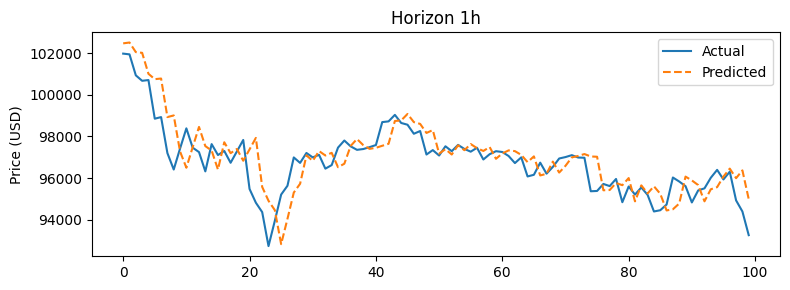

Horizon 2h: RMSE=$1,034.78, MAPE=0.72%


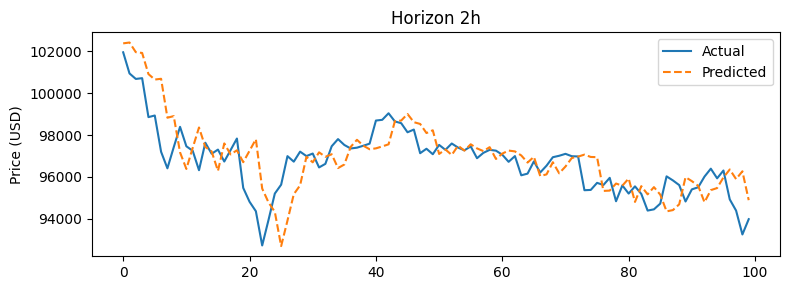

Horizon 3h: RMSE=$1,188.72, MAPE=0.84%


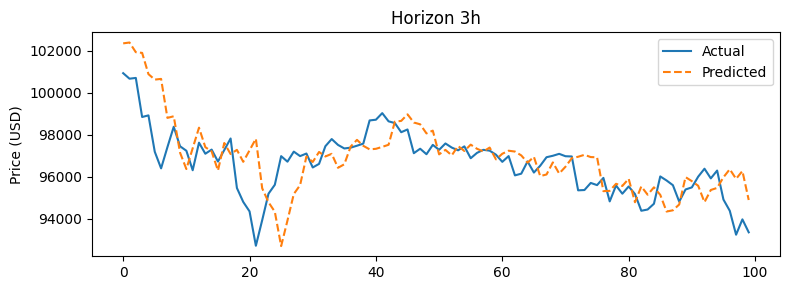

Horizon 6h: RMSE=$1,565.72, MAPE=1.12%


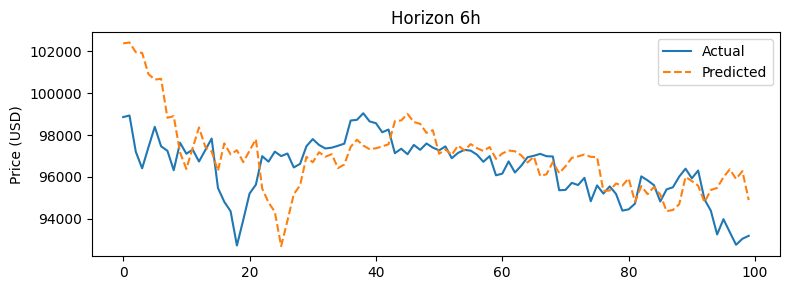

Horizon 12h: RMSE=$2,094.27, MAPE=1.59%


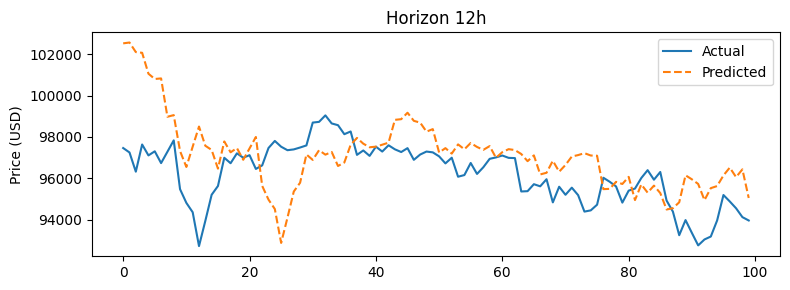

Horizon 1d: RMSE=$2,720.76, MAPE=2.17%


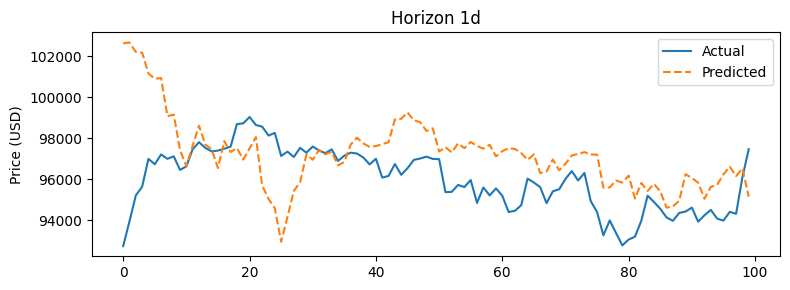

Horizon 3d: RMSE=$4,157.77, MAPE=3.40%


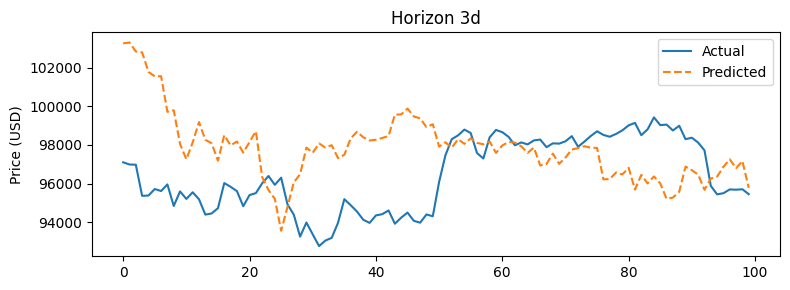

Horizon 7d: RMSE=$5,751.99, MAPE=4.83%


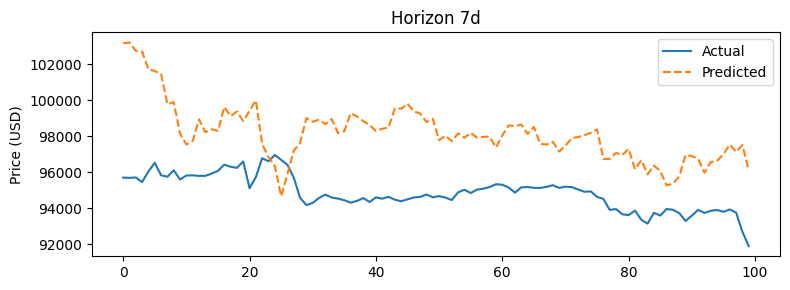

Horizon 15d: RMSE=$7,721.58, MAPE=7.09%


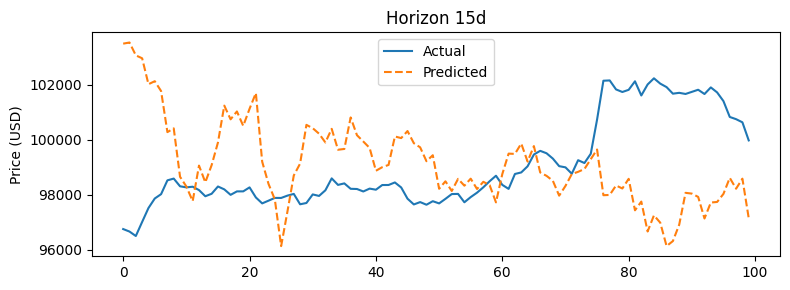

Horizon 30d: RMSE=$14,537.25, MAPE=14.06%


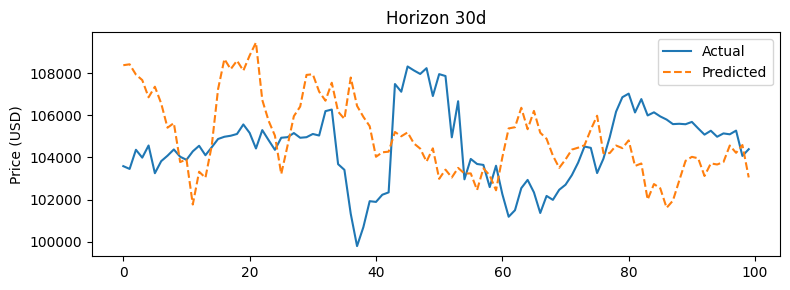

In [7]:
import pandas as pd
import numpy as np
import torch, torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt

# 1. PARAMETERS & PATHS
TRAIN_CSV   = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV     = '/kaggle/input/data-btc/fix/val.csv'
WINDOW_SIZE = 48
BATCH_SIZE  = 64
EPOCHS      = 50
LR          = 1e-3
PATIENCE    = 10
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. LOAD RAW & SCALED DATA
df_tr_raw   = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va_raw   = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])
df_raw_all  = pd.concat([df_tr_raw, df_va_raw], ignore_index=True)

df_tr       = df_tr_raw.copy()
df_va       = df_va_raw.copy()
df_all      = pd.concat([df_tr, df_va], ignore_index=True)

# 3. FEATURE & LABEL SETUP
HORIZONS    = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABELS      = [f'label_{h}' for h in HORIZONS]
FEATS       = [c for c in df_all.columns if c not in LABELS + ['timestamp','close_time']]
TEMPORAL    = FEATS
idx_close   = TEMPORAL.index('close')

# 4. TRAIN-ONLY SCALING
scaler_X    = MinMaxScaler()
scaler_X.fit(df_tr[TEMPORAL])
df_tr[TEMPORAL] = scaler_X.transform(df_tr[TEMPORAL])
df_va[TEMPORAL] = scaler_X.transform(df_va[TEMPORAL])

scaler_y    = MinMaxScaler()
scaler_y.fit(df_tr[LABELS])
df_tr[LABELS] = scaler_y.transform(df_tr[LABELS])
df_va[LABELS] = scaler_y.transform(df_va[LABELS])

# 5. PREPARE RAW ARRAYS FOR PRICE
raw_close   = df_raw_all['close'].values       # (N_total,)
raw_label   = df_raw_all[LABELS].values        # (N_total,10)

# 6. MAKE SEQUENCES & DELTA RETURNS
def make_sequences(df_scaled, raw_close, raw_label, window):
    X, Y, lc, yt = [], [], [], []
    arr_f = df_scaled[TEMPORAL].values
    N     = len(df_scaled)
    for i in range(N - window):
        seq        = arr_f[i:i+window]
        last_price = raw_close[i+window-1]
        future     = raw_label[i+window]
        delta      = (future - last_price) / last_price
        X.append(seq)
        Y.append(delta)
        lc.append(last_price)
        yt.append(future)
    return np.stack(X), np.stack(Y), np.array(lc), np.stack(yt)

X_all, Y_all, last_all, true_all = make_sequences(df_all, raw_close, raw_label, WINDOW_SIZE)
n_tr = len(df_tr) - WINDOW_SIZE

X_tr,  Y_tr,  lc_tr,  true_tr = X_all[:n_tr],  Y_all[:n_tr],  last_all[:n_tr],  true_all[:n_tr]
X_va,  Y_va,  lc_va,  true_va = X_all[n_tr:],  Y_all[n_tr:],  last_all[n_tr:],  true_all[n_tr:]

# 7. DATALOADERS
train_ds   = TensorDataset(torch.FloatTensor(X_tr), torch.FloatTensor(Y_tr))
val_ds     = TensorDataset(torch.FloatTensor(X_va), torch.FloatTensor(Y_va))
train_ld   = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_ld     = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)

# 8. MODEL: Shared Trunk + Horizon Embeddings + Per-Horizon Heads
class MultiHorizonModel(nn.Module):
    def __init__(self, n_feat, n_hor, d_emb=8):
        super().__init__()
        # trunk
        self.conv = nn.Conv1d(n_feat, 64, kernel_size=3, padding=2, dilation=2)
        self.lstm = nn.LSTM(64, 128, batch_first=True, bidirectional=True)
        self.norm = nn.LayerNorm(256)
        self.attn = nn.MultiheadAttention(256, num_heads=4, batch_first=True)
        self.pool = nn.AdaptiveAvgPool1d(1)
        # horizon embedding
        self.h_emb = nn.Embedding(n_hor, d_emb)
        # per-horizon heads
        self.heads = nn.ModuleList([
            nn.Sequential(
                nn.Linear(256 + d_emb, 64),
                nn.ReLU(),
                nn.Dropout(0.2),
                nn.Linear(64, 1)
            ) for _ in range(n_hor)
        ])

    def forward(self, x):
        b = x.size(0)
        x = x.permute(0,2,1)                    # (B,F,T)
        x = self.conv(x)
        x = x.permute(0,2,1)                    # (B,T,64)
        x, _ = self.lstm(x)                     # (B,T,256)
        x = self.norm(x)
        att, _ = self.attn(x, x, x)             # (B,T,256)
        x = self.norm(x + att)
        x = x.permute(0,2,1)                    # (B,256,T)
        feat = self.pool(x).squeeze(-1)         # (B,256)

        out = []
        for i, head in enumerate(self.heads):
            emb = self.h_emb(torch.full((b,), i, dtype=torch.long, device=feat.device))
            inp = torch.cat([feat, emb], dim=1)
            out.append(head(inp))
        return torch.cat(out, dim=1)            # (B, H)

model     = MultiHorizonModel(n_feat=X_tr.shape[2], n_hor=len(HORIZONS)).to(DEVICE)
criterion = nn.HuberLoss(delta=1.0)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=5, verbose=True
)

# 9. TRAINING LOOP
best, cnt = float('inf'), 0
weights    = torch.linspace(1, 2, steps=len(HORIZONS)).to(DEVICE)

for ep in range(1, EPOCHS+1):
    model.train()
    train_losses = []
    for xb, yb in train_ld:
        xb, yb = xb.to(DEVICE), yb.to(DEVICE)
        optimizer.zero_grad()
        pred = model(xb)                       # (B,H)
        loss = (criterion(pred, yb) * weights).mean()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())

    model.eval()
    val_losses = []
    with torch.no_grad():
        for xb, yb in val_ld:
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            pred   = model(xb)
            vloss  = (criterion(pred, yb) * weights).mean()
            val_losses.append(vloss.item())

    tr, va = np.mean(train_losses), np.mean(val_losses)
    scheduler.step(va)
    print(f"Epoch {ep:02d} | Train {tr:.4f} | Val {va:.4f}")

    if va < best:
        best, cnt = va, 0
        torch.save(model.state_dict(), 'best.pth')
    else:
        cnt += 1
        if cnt >= PATIENCE:
            print("Early stopping"); break

# 10. INFERENCE & EVALUATION
model.load_state_dict(torch.load('best.pth'))
model.eval()

X_va_t = torch.FloatTensor(X_va).to(DEVICE)
with torch.no_grad():
    delta_pred = model(X_va_t).cpu().numpy()           # (N_val, H)

price_pred = last_all[n_tr:][:, None] * (1 + delta_pred)
price_true = true_all[n_tr:]

for i, h in enumerate(HORIZONS):
    rmse = np.sqrt(mean_squared_error(price_true[:, i], price_pred[:, i]))
    mape = mean_absolute_percentage_error(price_true[:, i], price_pred[:, i]) * 100
    print(f"Horizon {h}: RMSE=${rmse:,.2f}, MAPE={mape:.2f}%")
    plt.figure(figsize=(8,3))
    plt.plot(price_true[:100, i], label='Actual')
    plt.plot(price_pred[:100, i], label='Predicted', linestyle='--')
    plt.ylabel('Price (USD)')
    plt.title(f'Horizon {h}')
    plt.legend()
    plt.tight_layout()
    plt.show()


LSTM 7

Epoch 1/10 | Val Loss: 0.015129
Epoch 2/10 | Val Loss: 0.006334
Epoch 3/10 | Val Loss: 0.007428
Epoch 4/10 | Val Loss: 0.006524
Epoch 5/10 | Val Loss: 0.006451
Epoch 6/10 | Val Loss: 0.007721
Epoch 7/10 | Val Loss: 0.006812
Epoch 8/10 | Val Loss: 0.024331
Epoch 9/10 | Val Loss: 0.006885
Epoch 10/10 | Val Loss: 0.007633
Horizon 1h: RMSE=845.10, MAPE=0.58%


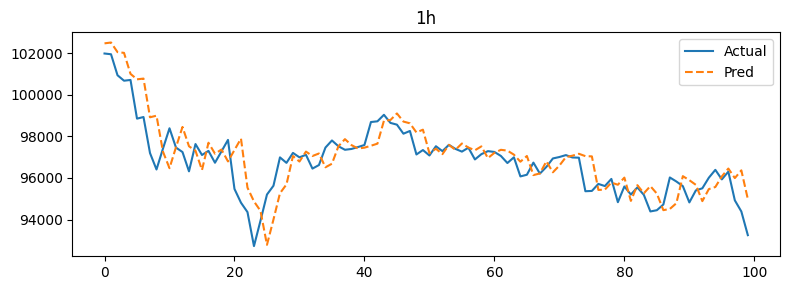

Horizon 2h: RMSE=1040.09, MAPE=0.72%


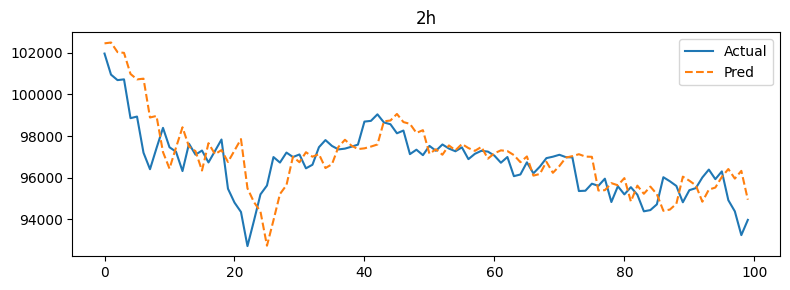

Horizon 3h: RMSE=1198.19, MAPE=0.83%


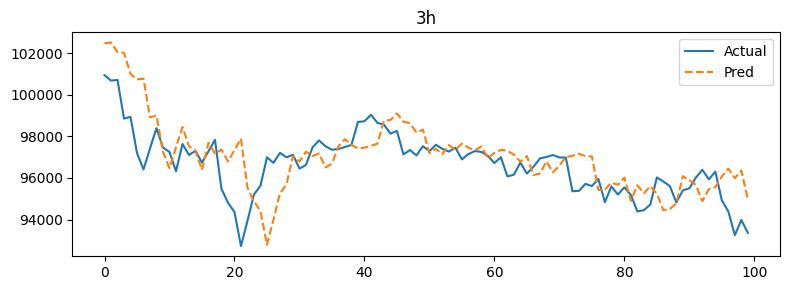

Horizon 6h: RMSE=1575.13, MAPE=1.12%


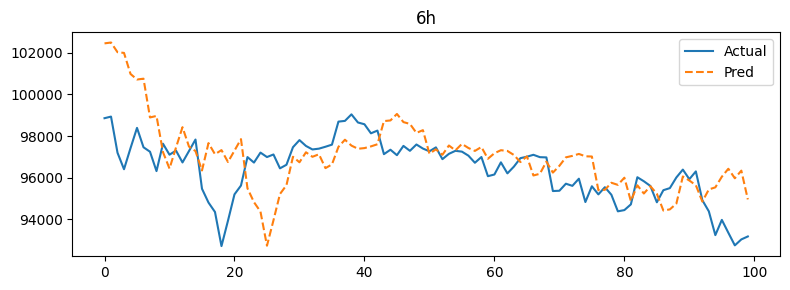

Horizon 12h: RMSE=2104.18, MAPE=1.59%


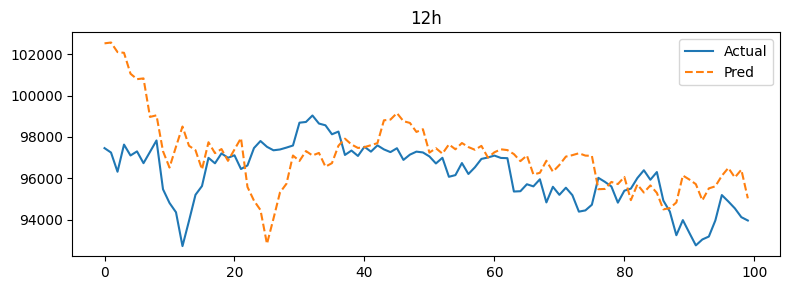

Horizon 1d: RMSE=2753.18, MAPE=2.19%


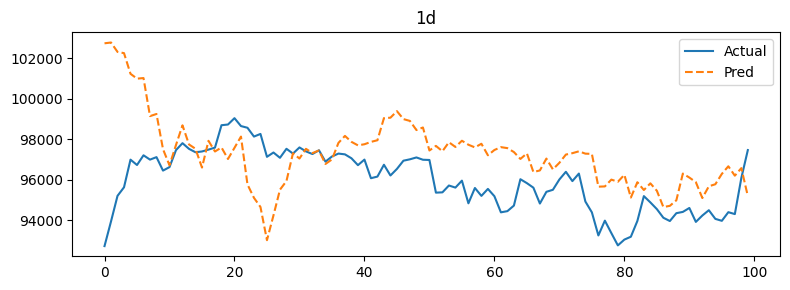

Horizon 3d: RMSE=4181.74, MAPE=3.42%


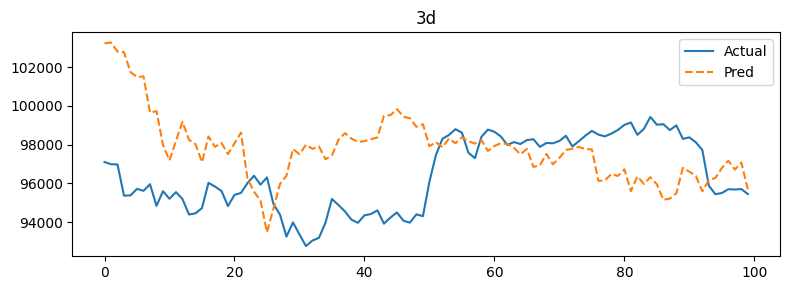

Horizon 7d: RMSE=6109.18, MAPE=5.28%


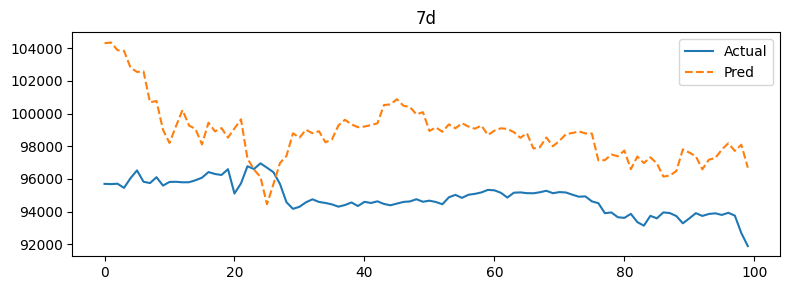

Horizon 15d: RMSE=8830.25, MAPE=8.11%


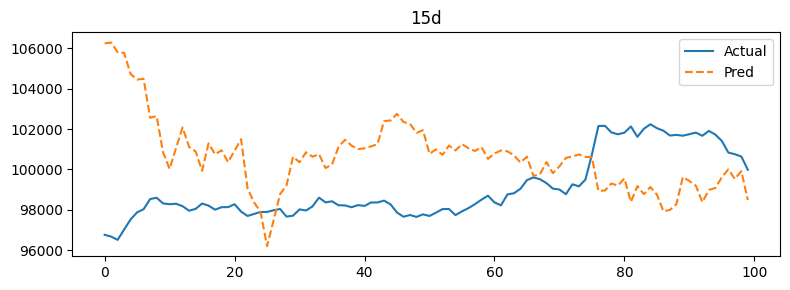

Horizon 30d: RMSE=15879.20, MAPE=15.48%


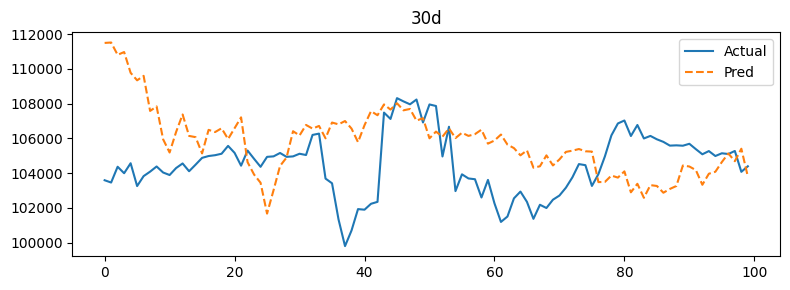

In [49]:
import pandas as pd
import numpy as np
import torch, torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt

# 1. PARAMETERS & PATHS
TRAIN_CSV   = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV     = '/kaggle/input/data-btc/fix/val.csv'
WINDOW_SIZE = 48
BATCH_SIZE  = 64
EPOCHS      = 10
LR          = 1e-3
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2. LOAD RAW DATA
df_tr_raw = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_va_raw = pd.read_csv(VAL_CSV,   parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])

# 3. FEATURE & LABEL SETUP
HORIZONS = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABELS   = [f'label_{h}' for h in HORIZONS]
FEATURES = [c for c in df_tr_raw.columns if c not in LABELS]

# 4. SCALE FEATURES ON TRAIN ONLY
def scale_features(df_train, df_val, features):
    scaler = MinMaxScaler()
    scaler.fit(df_train[features])
    df_train[features] = scaler.transform(df_train[features])
    df_val[features]   = scaler.transform(df_val[features])
    return scaler

feature_scaler = scale_features(df_tr_raw.copy(), df_va_raw.copy(), FEATURES)
df_tr = df_tr_raw.copy()
df_va = df_va_raw.copy()

# 5. PREPARE RAW CLOSE & LABEL ARRAYS
raw_close = np.concatenate([df_tr['close'].values, df_va['close'].values])
raw_label = np.vstack([df_tr[LABELS].values, df_va[LABELS].values])

# 6. PREPARE SEQUENCES & DELTAS
def make_sequences(df_scaled, raw_close, raw_label, features, window):
    X, Y = [], []
    arr_f = df_scaled[features].values
    N = len(df_scaled)
    for i in range(N - window):
        seq = arr_f[i:i+window]
        last_price = raw_close[i+window-1]
        future_prices = raw_label[i+window]
        delta = (future_prices - last_price) / last_price
        X.append(seq)
        Y.append(delta)
    return np.stack(X), np.stack(Y)

X_tr, Y_tr = make_sequences(df_tr, raw_close, raw_label, FEATURES, WINDOW_SIZE)
offset = len(df_tr)
X_va, Y_va = make_sequences(df_va, raw_close[offset:], raw_label[offset:], FEATURES, WINDOW_SIZE)

# 7. DATALOADERS
train_ds = TensorDataset(torch.FloatTensor(X_tr), torch.FloatTensor(Y_tr))
val_ds   = TensorDataset(torch.FloatTensor(X_va), torch.FloatTensor(Y_va))
train_ld = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_ld   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)

# 8. MODEL DEFINITION
class MultiHorizonModel(nn.Module):
    def __init__(self, n_feat, n_hor, d_emb=8):
        super().__init__()
        self.conv = nn.Conv1d(n_feat, 64, kernel_size=3, padding=2, dilation=2)
        self.lstm = nn.LSTM(64, 128, batch_first=True, bidirectional=True)
        self.norm = nn.LayerNorm(256)
        self.attn = nn.MultiheadAttention(256, num_heads=4, batch_first=True)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.h_emb = nn.Embedding(n_hor, d_emb)
        self.heads = nn.ModuleList([
            nn.Sequential(nn.Linear(256+d_emb, 64), nn.ReLU(), nn.Dropout(0.2), nn.Linear(64,1))
            for _ in range(n_hor)
        ])
    def forward(self, x):
        b = x.size(0)
        x = x.permute(0,2,1)
        x = self.conv(x)
        x = x.permute(0,2,1)
        x,_ = self.lstm(x)
        x = self.norm(x)
        att,_ = self.attn(x,x,x)
        x = self.norm(x+att)
        x = x.permute(0,2,1)
        feat = self.pool(x).squeeze(-1)
        out = []
        for i, head in enumerate(self.heads):
            emb = self.h_emb(torch.full((b,), i, dtype=torch.long, device=feat.device))
            out.append(head(torch.cat([feat, emb],1)))
        return torch.cat(out,1)

model = MultiHorizonModel(n_feat=X_tr.shape[2], n_hor=len(HORIZONS)).to(DEVICE)

# 9. LOSS & OPTIMIZER
torch_weights = torch.linspace(2.0, 1.0, steps=len(HORIZONS)).to(DEVICE)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

# 10. TRAINING LOOP
best_loss = float('inf')
for ep in range(EPOCHS):
    model.train()
    for xb, yb in train_ld:
        xb, yb = xb.to(DEVICE), yb.to(DEVICE)
        pred = model(xb)
        loss = (criterion(pred, yb) * torch_weights).mean()
        optimizer.zero_grad(); loss.backward(); optimizer.step()
    model.eval()
    val_losses = []
    with torch.no_grad():
        for xb,yb in val_ld:
            xb,yb = xb.to(DEVICE), yb.to(DEVICE)
            pred = model(xb)
            val_losses.append(((criterion(pred, yb)*torch_weights).mean().item()))
    avg_val = np.mean(val_losses)
    print(f"Epoch {ep+1}/{EPOCHS} | Val Loss: {avg_val:.6f}")
    if avg_val < best_loss:
        best_loss = avg_val; torch.save(model.state_dict(), 'best_lstm.pth')

# 11. INFERENCE & EVALUATION
model.load_state_dict(torch.load('best_lstm.pth'))
model.eval()
X_va_t = torch.FloatTensor(X_va).to(DEVICE)
with torch.no_grad():
    delta_pred = model(X_va_t).cpu().numpy()

n_val = delta_pred.shape[0]
last_price = raw_close[offset - 1 : offset - 1 + n_val]
price_preds = np.stack([ last_price * (1 + delta_pred[:, i]) for i in range(len(HORIZONS)) ], axis=1)
price_true  = raw_label[offset : offset + n_val]

for i,h in enumerate(HORIZONS):
    rmse = mean_squared_error(price_true[:,i], price_preds[:,i], squared=False)
    mape = mean_absolute_percentage_error(price_true[:,i], price_preds[:,i])*100
    print(f"Horizon {h}: RMSE={rmse:.2f}, MAPE={mape:.2f}%")
    plt.figure(figsize=(8,3))
    plt.plot(price_true[:100,i], label='Actual')
    plt.plot(price_preds[:100,i],'--', label='Pred')
    plt.title(h)
    plt.legend()
    plt.tight_layout()
    plt.show()


LSTM FINAL

  0%|          | 0/10 [00:00<?, ?it/s]

Tuning Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Train Ep0:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep0:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep1:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep1:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep2:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep2:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep3:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep3:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep4:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep4:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep5:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep5:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep6:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep6:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep7:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep7:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep8:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep8:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep9:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep9:   0%|          | 0/31 [00:00<?, ?it/s]

Tuning Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Train Ep0:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep0:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep1:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep1:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep2:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep2:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep3:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep3:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep4:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep4:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep5:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep5:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep6:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep6:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep7:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep7:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep8:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep8:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep9:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep9:   0%|          | 0/31 [00:00<?, ?it/s]

Tuning Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Train Ep0:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep0:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep1:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep1:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep2:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep2:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep3:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep3:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep4:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep4:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep5:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep5:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep6:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep6:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep7:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep7:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep8:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep8:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep9:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep9:   0%|          | 0/31 [00:00<?, ?it/s]

Tuning Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Train Ep0:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep0:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep1:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep1:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep2:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep2:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep3:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep3:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep4:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep4:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep5:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep5:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep6:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep6:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep7:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep7:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep8:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep8:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep9:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep9:   0%|          | 0/31 [00:00<?, ?it/s]

Tuning Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Train Ep0:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep0:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep1:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep1:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep2:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep2:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep3:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep3:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep4:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep4:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep5:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep5:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep6:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep6:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep7:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep7:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep8:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep8:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep9:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep9:   0%|          | 0/31 [00:00<?, ?it/s]

Tuning Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Train Ep0:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep0:   0%|          | 0/31 [00:00<?, ?it/s]

Tuning Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Train Ep0:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep0:   0%|          | 0/31 [00:00<?, ?it/s]

Tuning Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Train Ep0:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep0:   0%|          | 0/31 [00:00<?, ?it/s]

Tuning Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Train Ep0:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep0:   0%|          | 0/31 [00:00<?, ?it/s]

Tuning Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Train Ep0:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep0:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep1:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep1:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep2:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep2:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep3:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep3:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep4:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep4:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep5:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep5:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep6:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep6:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep7:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep7:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep8:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep8:   0%|          | 0/31 [00:00<?, ?it/s]

Train Ep9:   0%|          | 0/1003 [00:00<?, ?it/s]

Val Ep9:   0%|          | 0/31 [00:00<?, ?it/s]

Best hyperparameters: {'d_emb': 6, 'dropout': 0.28222663014987265, 'lr': 0.00034423914876200313}


Final Training:   0%|          | 0/30 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Train+Val:   0%|          | 0/1035 [00:00<?, ?it/s]

Testing:   0%|          | 0/21 [00:00<?, ?it/s]

Horizon 1h: RMSE=0.00, MAPE=0.35%


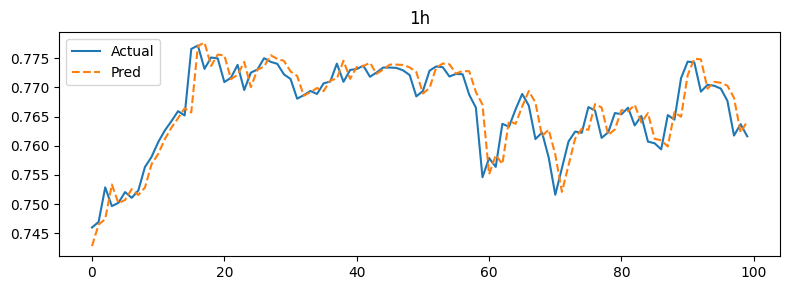

Horizon 2h: RMSE=0.01, MAPE=0.51%


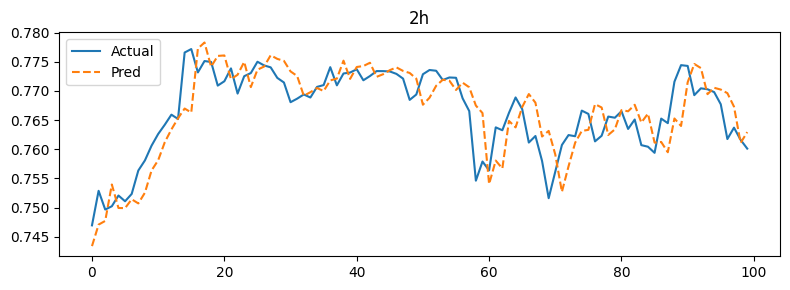

Horizon 3h: RMSE=0.01, MAPE=0.60%


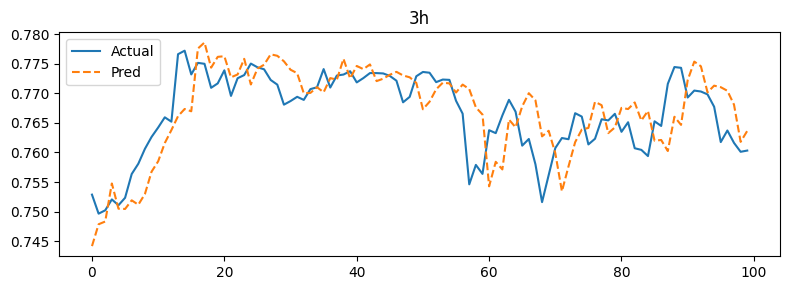

Horizon 6h: RMSE=0.01, MAPE=1.01%


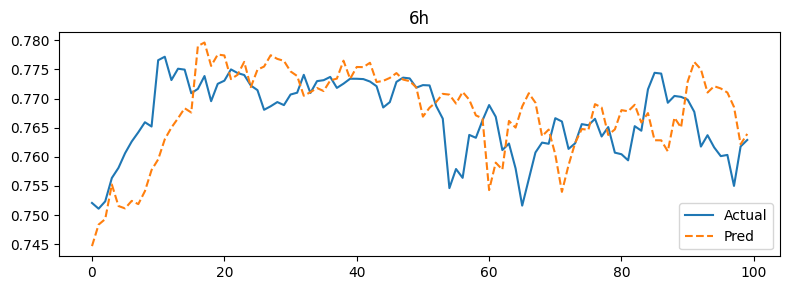

Horizon 12h: RMSE=0.02, MAPE=1.52%


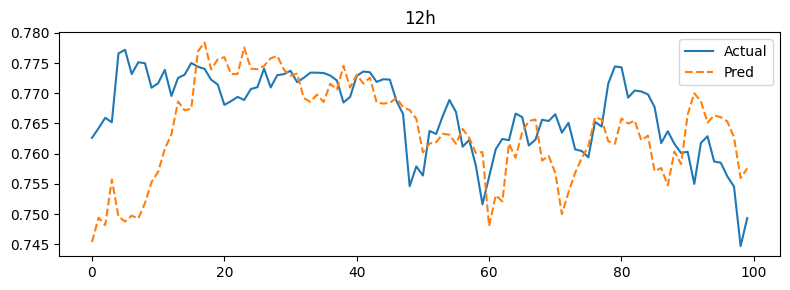

Horizon 1d: RMSE=0.03, MAPE=2.97%


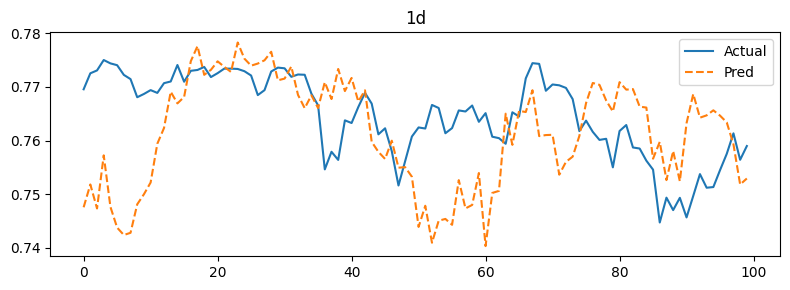

Horizon 3d: RMSE=0.06, MAPE=5.60%


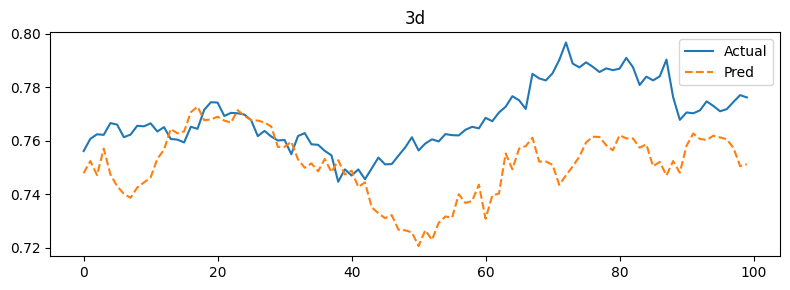

Horizon 7d: RMSE=0.07, MAPE=7.05%


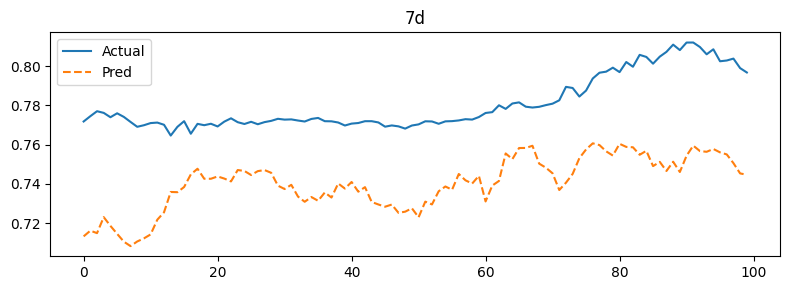

Horizon 15d: RMSE=0.09, MAPE=9.29%


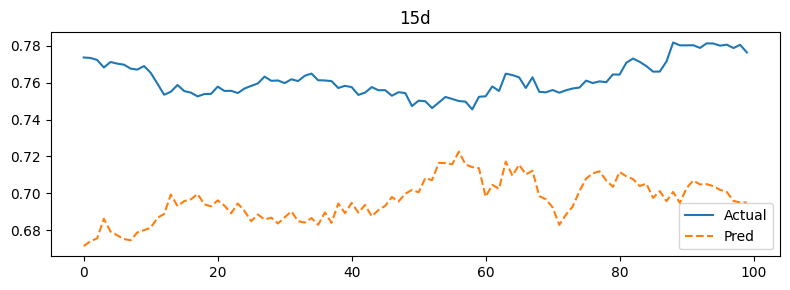

Horizon 30d: RMSE=0.17, MAPE=17.18%


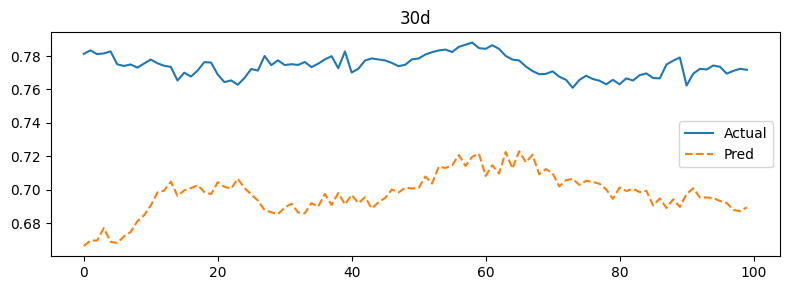

In [66]:
import pandas as pd
import numpy as np
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import optuna
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# 1. PARAMETERS & PATHS
TRAIN_CSV    = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV      = '/kaggle/input/data-btc/fix/val.csv'
TEST_CSV     = '/kaggle/input/data-btc/fix/test.csv'
WINDOW_SIZE  = 48
BATCH_SIZE   = 64
EPOCHS       = 10             # used in tuning
FINAL_EPOCHS = 30             # used for final retrain
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED         = 42
EPSILON      = 1e-8           # to avoid divide-by-zero

# reproducibility
torch.manual_seed(SEED)
np.random.seed(SEED)

# 2. LOAD RAW DATA
df_tr_raw   = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_va_raw   = pd.read_csv(VAL_CSV,   parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_test_raw = pd.read_csv(TEST_CSV,  parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])

# 3. FEATURES & LABELS
HORIZONS = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABELS   = [f'label_{h}' for h in HORIZONS]
FEATURES = [c for c in df_tr_raw.columns if c not in LABELS]

# 4. SCALE FEATURES & LABELS
feat_scaler  = MinMaxScaler().fit(df_tr_raw[FEATURES])
label_scaler = MinMaxScaler().fit(df_tr_raw[LABELS])
for df in [df_tr_raw, df_va_raw, df_test_raw]:
    df[FEATURES] = feat_scaler.transform(df[FEATURES])
    df[LABELS]   = label_scaler.transform(df[LABELS])
# raw arrays for delta calc
aw_close   = np.concatenate([df_tr_raw['close'], df_va_raw['close'], df_test_raw['close']])
raw_label  = np.vstack([df_tr_raw[LABELS].values, df_va_raw[LABELS].values, df_test_raw[LABELS].values])

# 5. SLIDING WINDOW DATASET
class WindowDataset(Dataset):
    def __init__(self, df_scaled, raw_close, raw_label, features, window):
        self.arr_f      = df_scaled[features].values
        self.raw_close  = raw_close
        self.raw_label  = raw_label
        self.window     = window
    def __len__(self):
        return len(self.arr_f) - self.window
    def __getitem__(self, idx):
        seq         = self.arr_f[idx:idx+self.window]
        last_price  = self.raw_close[idx+self.window-1]
        future      = self.raw_label[idx+self.window]
        # avoid divide-by-zero
        delta       = (future - last_price) / (last_price + EPSILON)
        return torch.FloatTensor(seq), torch.FloatTensor(delta)

# prepare datasets with proper offsets
n_tr = len(df_tr_raw)
n_va = len(df_va_raw)
train_ds = WindowDataset(df_tr_raw, aw_close, raw_label, FEATURES, WINDOW_SIZE)
val_ds   = WindowDataset(df_va_raw, aw_close[n_tr:], raw_label[n_tr:], FEATURES, WINDOW_SIZE)
test_ds  = WindowDataset(df_test_raw, aw_close[n_tr+n_va:], raw_label[n_tr+n_va:], FEATURES, WINDOW_SIZE)

# 6. MODEL DEFINITION
# build_model returns model instance and lr

def build_model(trial, n_feat, n_hor):
    d_emb   = trial.suggest_int('d_emb', 4, 16)
    dropout = trial.suggest_float('dropout', 0.1, 0.5)
    lr      = trial.suggest_loguniform('lr', 1e-4, 1e-2)
    class MHModel(nn.Module):
        def __init__(self):
            super().__init__()
            self.conv = nn.Conv1d(n_feat, 64, kernel_size=3, padding=2, dilation=2)
            self.lstm = nn.LSTM(64, 128, batch_first=True, bidirectional=True)
            self.norm = nn.LayerNorm(256)
            self.attn = nn.MultiheadAttention(256, num_heads=4, batch_first=True)
            self.pool = nn.AdaptiveAvgPool1d(1)
            self.h_emb = nn.Embedding(n_hor, d_emb)
            self.heads = nn.ModuleList([
                nn.Sequential(nn.Linear(256+d_emb, 64), nn.ReLU(), nn.Dropout(dropout), nn.Linear(64,1))
                for _ in range(n_hor)
            ])
        def forward(self, x):
            b = x.size(0)
            x = x.permute(0,2,1)
            x = self.conv(x)
            x = x.permute(0,2,1)
            x,_ = self.lstm(x)
            x = self.norm(x)
            att,_ = self.attn(x,x,x)
            x = self.norm(x+att)
            x = x.permute(0,2,1)
            feat = self.pool(x).squeeze(-1)
            out = []
            for i, head in enumerate(self.heads):
                emb = self.h_emb(torch.full((b,), i, dtype=torch.long, device=feat.device))
                out.append(head(torch.cat([feat, emb],1)))
            return torch.cat(out,1)
    return MHModel().to(DEVICE), lr

# 7. HYPERPARAMETER TUNING WITH OPTUNA

def objective(trial):
    model, lr = build_model(trial, len(FEATURES), len(HORIZONS))
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
    val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)
    weights      = torch.linspace(2.0,1.0,steps=len(HORIZONS)).to(DEVICE)
    criterion    = nn.HuberLoss(delta=1.0)
    best_val     = float('inf')

    for ep in tqdm(range(EPOCHS), desc='Tuning Epochs'):
        model.train()
        for xb, yb in tqdm(train_loader, desc=f'Train Ep{ep}', leave=False):
            xb, yb = xb.to(DEVICE), yb.to(DEVICE)
            pred   = model(xb)
            loss   = (criterion(pred, yb) * weights).mean()
            optimizer.zero_grad(); loss.backward(); optimizer.step()
        model.eval(); losses = []
        with torch.no_grad():
            for xb, yb in tqdm(val_loader, desc=f'Val Ep{ep}', leave=False):
                xb, yb = xb.to(DEVICE), yb.to(DEVICE)
                pred   = model(xb)
                losses.append(((criterion(pred, yb)*weights).mean().item()))
        val_loss = np.mean(losses)
        trial.report(val_loss, ep)
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()
        best_val = min(best_val, val_loss)
    return best_val

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10, show_progress_bar=True)
best_params = study.best_params
print('Best hyperparameters:', best_params)

# 8. FINAL TRAIN on train+val with best_params
# prepare combined dataset
df_comb       = pd.concat([df_tr_raw, df_va_raw], ignore_index=True)
aw_close_comb = np.concatenate([aw_close[:n_tr], aw_close[n_tr:n_tr+n_va]])
raw_label_comb= raw_label[:n_tr+n_va]
comb_ds       = WindowDataset(df_comb, aw_close_comb, raw_label_comb, FEATURES, WINDOW_SIZE)
train_val_loader = DataLoader(comb_ds, batch_size=BATCH_SIZE, shuffle=True)

# build and train final model
final_model, final_lr = build_model(optuna.trial.FixedTrial(best_params), len(FEATURES), len(HORIZONS))
optimizer = torch.optim.Adam(final_model.parameters(), lr=final_lr)
weights   = torch.linspace(2.0,1.0,steps=len(HORIZONS)).to(DEVICE)
criterion = nn.HuberLoss(delta=1.0)
for ep in tqdm(range(FINAL_EPOCHS), desc='Final Training'):
    final_model.train()
    for xb, yb in tqdm(train_val_loader, desc='Train+Val', leave=False):
        xb, yb = xb.to(DEVICE), yb.to(DEVICE)
        pred   = final_model(xb)
        loss   = (criterion(pred, yb)*weights).mean()
        optimizer.zero_grad(); loss.backward(); optimizer.step()

# 9. EVALUATE on test

test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False)
final_model.eval()
all_pred, all_true = [], []
with torch.no_grad():
    for xb, yb in tqdm(test_loader, desc='Testing'):
        xb, yb = xb.to(DEVICE), yb.to(DEVICE)
        pred   = final_model(xb).cpu().numpy()
        all_pred.append(pred)
        all_true.append(yb.cpu().numpy())

delta_pred = np.vstack(all_pred)
delta_true = np.vstack(all_true)
last_prices= aw_close[n_tr+n_va : n_tr+n_va + delta_pred.shape[0]]
price_preds = np.stack([last_prices * (1 + delta_pred[:,i]) for i in range(len(HORIZONS))], axis=1)
price_true  = raw_label[n_tr+n_va : n_tr+n_va + delta_pred.shape[0]]

for i, h in enumerate(HORIZONS):
    rmse = mean_squared_error(price_true[:,i], price_preds[:,i], squared=False)
    mape = mean_absolute_percentage_error(price_true[:,i], price_preds[:,i])*100
    print(f"Horizon {h}: RMSE={rmse:.2f}, MAPE={mape:.2f}%")
    plt.figure(figsize=(8,3))
    plt.plot(price_true[:100,i], label='Actual')
    plt.plot(price_preds[:100,i], '--', label='Pred')
    plt.title(h)
    plt.legend()
    plt.tight_layout()
    plt.show()


LSTM FINAL 2

Train Ep1/5:   0%|          | 0/1003 [00:00<?, ?it/s]

 Val Ep1/5:   0%|          | 0/32 [00:00<?, ?it/s]

 -> Val Loss: 0.0015


Train Ep2/5:   0%|          | 0/1003 [00:00<?, ?it/s]

 Val Ep2/5:   0%|          | 0/32 [00:00<?, ?it/s]

 -> Val Loss: 0.0015


Train Ep3/5:   0%|          | 0/1003 [00:00<?, ?it/s]

 Val Ep3/5:   0%|          | 0/32 [00:00<?, ?it/s]

 -> Val Loss: 0.0014


Train Ep4/5:   0%|          | 0/1003 [00:00<?, ?it/s]

 Val Ep4/5:   0%|          | 0/32 [00:00<?, ?it/s]

 -> Val Loss: 0.0014


Train Ep5/5:   0%|          | 0/1003 [00:00<?, ?it/s]

 Val Ep5/5:   0%|          | 0/32 [00:00<?, ?it/s]

 -> Val Loss: 0.0014


Final Training:   0%|          | 0/5 [00:00<?, ?it/s]

Saved final model as LSTM_FINAL2.pth


Testing:   0%|          | 0/21 [00:00<?, ?it/s]

Horizon 1h: RMSE=572.29, MAPE=0.46%


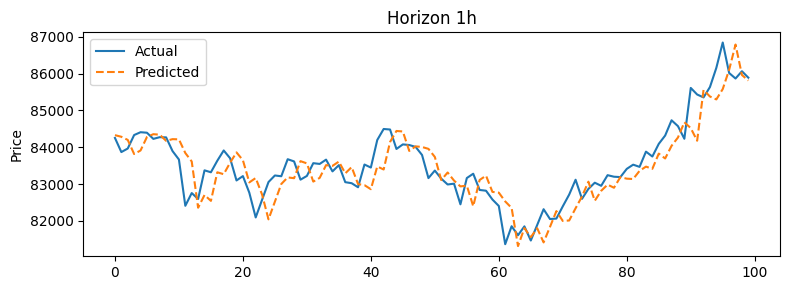

Horizon 2h: RMSE=695.20, MAPE=0.56%


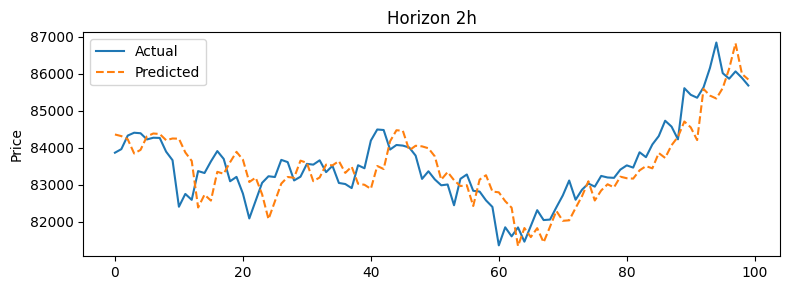

Horizon 3h: RMSE=792.14, MAPE=0.64%


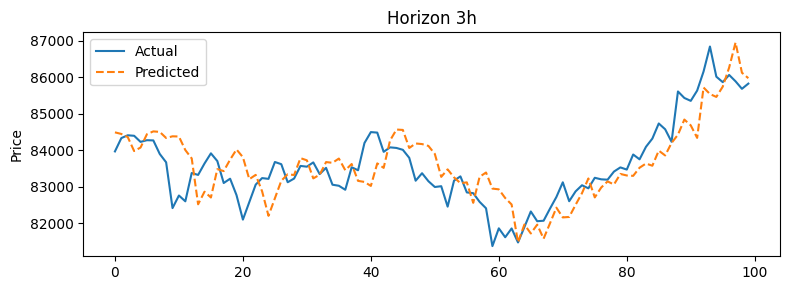

Horizon 6h: RMSE=1108.82, MAPE=0.93%


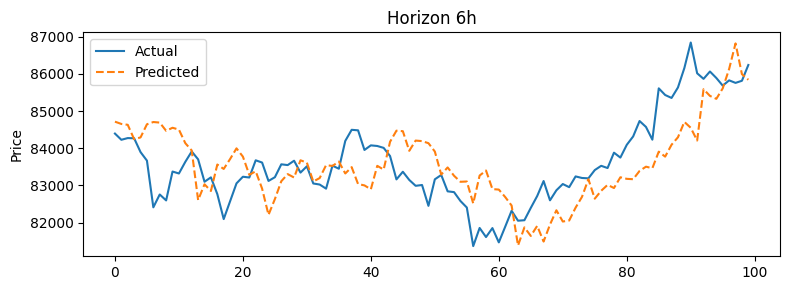

Horizon 12h: RMSE=1894.21, MAPE=1.63%


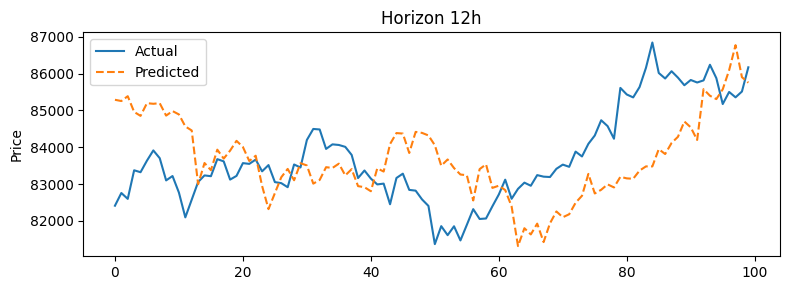

Horizon 1d: RMSE=2770.62, MAPE=2.38%


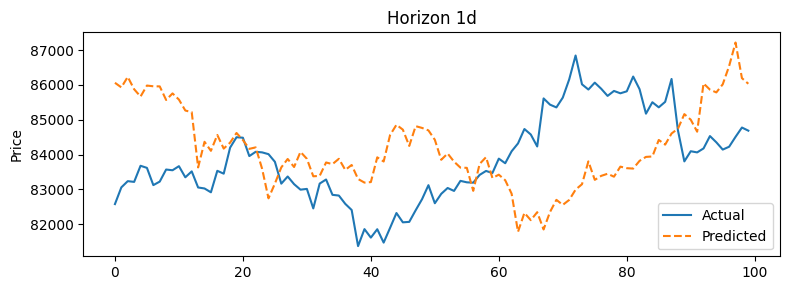

Horizon 3d: RMSE=3677.49, MAPE=3.18%


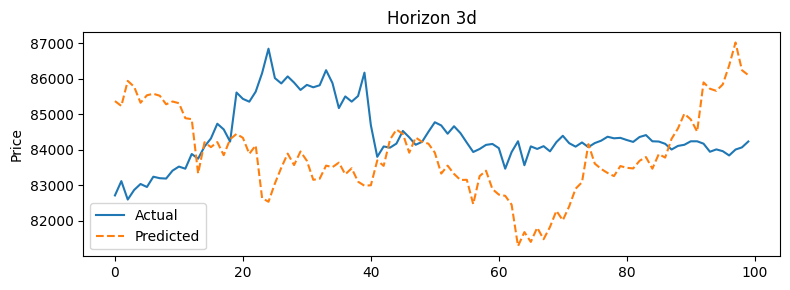

Horizon 7d: RMSE=4500.49, MAPE=4.18%


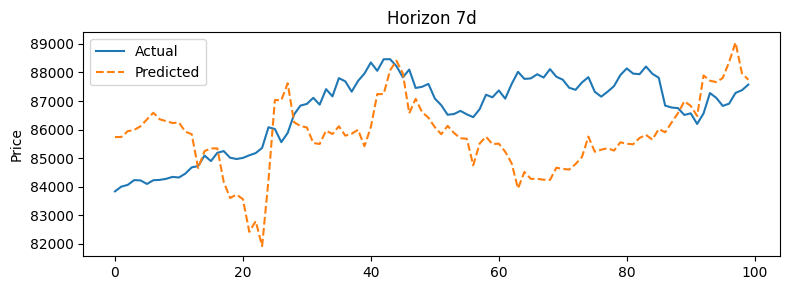

Horizon 15d: RMSE=9055.77, MAPE=8.16%


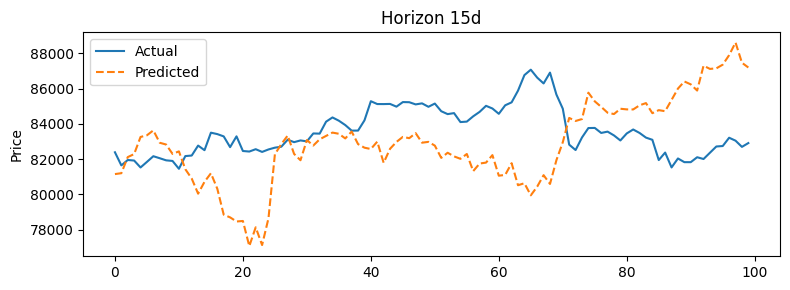

Horizon 30d: RMSE=29799.27, MAPE=28.96%


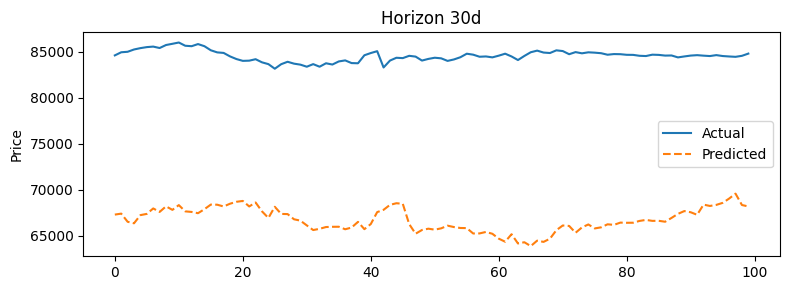

In [9]:
import pandas as pd
import numpy as np
import torch, torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# 1. PARAMETERS & PATHS
TRAIN_CSV     = '/kaggle/input/data-btc/fix/fix/train.csv'
VAL_CSV       = '/kaggle/input/data-btc/fix/fix/val.csv'
TEST_CSV      = '/kaggle/input/data-btc/fix/fix/test.csv'
WINDOW_SIZE = 48
BATCH_SIZE  = 64
TUNE_EPOCHS = 5
FINAL_EPOCHS= 5
LR          = 1e-3
PATIENCE    = 10
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED        = 42

torch.manual_seed(SEED)
np.random.seed(SEED)

# 2. LOAD RAW & SCALED DATA
df_tr_raw   = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va_raw   = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])
df_test_raw = pd.read_csv(TEST_CSV,  parse_dates=['timestamp'])

# keep raw for reconstruction
df_all_raw  = pd.concat([df_tr_raw, df_va_raw, df_test_raw], ignore_index=True)

# copy for scaling
df_tr = df_tr_raw.copy()
df_va = df_va_raw.copy()

# 3. FEATURE & LABEL SETUP
HORIZONS  = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABELS    = [f'label_{h}' for h in HORIZONS]
FEATS     = [c for c in df_tr.columns if c not in LABELS + ['timestamp','close_time']]

# 4. SCALING (train-only)
scaler_X     = MinMaxScaler().fit(df_tr[FEATS])
df_tr[FEATS] = scaler_X.transform(df_tr[FEATS])
df_va[FEATS] = scaler_X.transform(df_va[FEATS])

scaler_y        = MinMaxScaler().fit(df_tr[LABELS])
df_tr[LABELS]   = scaler_y.transform(df_tr[LABELS])
df_va[LABELS]   = scaler_y.transform(df_va[LABELS])

# 5. PREPARE RAW ARRAYS FOR PRICE & LABEL
raw_close = df_all_raw['close'].values
raw_label = df_all_raw[LABELS].values

# 6. MAKE SEQUENCES & DELTA RETURNS
def make_sequences(df_scaled, raw_close, raw_label, window):
    X, Y, LP, Y_true = [], [], [], []
    arr_f = df_scaled[FEATS].values
    N     = len(df_scaled)
    for i in range(N - window):
        seq        = arr_f[i:i+window]
        last_price = raw_close[i+window-1]
        future     = raw_label[i+window]
        delta      = (future - last_price) / (last_price + 1e-8)
        X.append(seq); Y.append(delta)
        LP.append(last_price); Y_true.append(future)
    return (np.stack(X), np.stack(Y),
            np.array(LP), np.stack(Y_true))

# train+val sequences
df_all_scaled = pd.concat([df_tr, df_va], ignore_index=True)
X_all, Y_all, LP_all, TRUE_all = make_sequences(df_all_scaled, raw_close, raw_label, WINDOW_SIZE)
n_tr = len(df_tr) - WINDOW_SIZE

X_tr,  Y_tr,  LP_tr,  TRUE_tr = X_all[:n_tr],  Y_all[:n_tr],  LP_all[:n_tr],  TRUE_all[:n_tr]
X_va,  Y_va,  LP_va,  TRUE_va = X_all[n_tr:],  Y_all[n_tr:],  LP_all[n_tr:],  TRUE_all[n_tr:]

# test sequences
X_te, Y_te, LP_te, TRUE_te = make_sequences(df_test_raw, raw_close[len(df_tr)+len(df_va):], raw_label[len(df_tr)+len(df_va):], WINDOW_SIZE)

# 7. DATALOADERS
train_ds = TensorDataset(torch.FloatTensor(X_tr), torch.FloatTensor(Y_tr))
val_ds   = TensorDataset(torch.FloatTensor(X_va), torch.FloatTensor(Y_va))
test_ds  = TensorDataset(torch.FloatTensor(X_te), torch.FloatTensor(Y_te))

train_ld = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_ld   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)
test_ld  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False)

# 8. MODEL (Skrip 1 exactly)
class MultiHorizonModel(nn.Module):
    def __init__(self, n_feat, n_hor, d_emb=8):
        super().__init__()
        self.conv = nn.Conv1d(n_feat, 64, kernel_size=3, padding=2, dilation=2)
        self.lstm = nn.LSTM(64, 128, batch_first=True, bidirectional=True)
        self.norm = nn.LayerNorm(256)
        self.attn = nn.MultiheadAttention(256, num_heads=4, batch_first=True)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.h_emb= nn.Embedding(n_hor, d_emb)
        self.heads= nn.ModuleList([
            nn.Sequential(
                nn.Linear(256+d_emb,64), nn.ReLU(),
                nn.Dropout(0.2), nn.Linear(64,1)
            ) for _ in range(n_hor)
        ])
    def forward(self,x):
        b = x.size(0)
        x = x.permute(0,2,1)
        x = self.conv(x)
        x = x.permute(0,2,1)
        x,_ = self.lstm(x)
        x = self.norm(x)
        att,_ = self.attn(x,x,x)
        x = self.norm(x+att)
        x = x.permute(0,2,1)
        feat = self.pool(x).squeeze(-1)
        out = []
        for i, head in enumerate(self.heads):
            emb = self.h_emb(torch.full((b,), i, dtype=torch.long, device=feat.device))
            out.append(head(torch.cat([feat,emb],1)))
        return torch.cat(out,1)

model     = MultiHorizonModel(n_feat=X_tr.shape[2], n_hor=len(HORIZONS)).to(DEVICE)
criterion = nn.HuberLoss(delta=1.0)
weights   = torch.linspace(1,2,steps=len(HORIZONS)).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

# 9. TUNING LOOP (with val & tqdm & early stopping)
best_val, patience_cnt = float('inf'), 0
for ep in range(1, TUNE_EPOCHS+1):
    model.train()
    train_losses = []
    for xb,yb in tqdm(train_ld, desc=f"Train Ep{ep}/{TUNE_EPOCHS}"):
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        pred  = model(xb)
        loss  = (criterion(pred,yb)*weights).mean()
        optimizer.zero_grad(); loss.backward(); optimizer.step()
        train_losses.append(loss.item())

    model.eval()
    val_losses = []
    with torch.no_grad():
        for xb,yb in tqdm(val_ld, desc=f" Val Ep{ep}/{TUNE_EPOCHS}"):
            xb,yb = xb.to(DEVICE), yb.to(DEVICE)
            vpred = model(xb)
            vloss = (criterion(vpred,yb)*weights).mean()
            val_losses.append(vloss.item())

    val_loss = np.mean(val_losses)
    print(f" -> Val Loss: {val_loss:.4f}")
    if val_loss < best_val:
        best_val, patience_cnt = val_loss, 0
        torch.save(model.state_dict(), 'best_tune.pth')
    else:
        patience_cnt += 1
        if patience_cnt >= PATIENCE:
            print("Early stopping tuning.") 
            break

# 10. FINAL RETRAIN ON TRAIN+VAL
model.load_state_dict(torch.load('best_tune.pth'))
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

combined_ds = TensorDataset(torch.FloatTensor(X_all), torch.FloatTensor(Y_all))
combined_ld = DataLoader(combined_ds, batch_size=BATCH_SIZE, shuffle=True)

for ep in tqdm(range(1, FINAL_EPOCHS+1), desc="Final Training"):
    model.train()
    for xb,yb in combined_ld:
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        loss  = (criterion(model(xb), yb)*weights).mean()
        optimizer.zero_grad(); loss.backward(); optimizer.step()

torch.save(model.state_dict(), 'LSTM_FINAL2.pth')
print("Saved final model as LSTM_FINAL2.pth")

# 11. EVALUATION ON TEST
model.eval()
all_pred, all_true = [], []
with torch.no_grad():
    for xb,yb in tqdm(test_ld, desc="Testing"):
        xb = xb.to(DEVICE)
        all_pred.append(model(xb).cpu().numpy())
        all_true.append(yb.numpy())

delta_pred = np.vstack(all_pred)
delta_true = np.vstack(all_true)
last_prices= LP_te
price_preds = np.stack([ last_prices * (1+delta_pred[:,i]) for i in range(len(HORIZONS)) ], axis=1)
price_true  = TRUE_te

for i,h in enumerate(HORIZONS):
    rmse = mean_squared_error(price_true[:,i], price_preds[:,i], squared=False)
    mape = mean_absolute_percentage_error(price_true[:,i], price_preds[:,i])*100
    print(f"Horizon {h}: RMSE={rmse:.2f}, MAPE={mape:.2f}%")
    plt.figure(figsize=(8,3))
    plt.plot(price_true[:100,i], label='Actual')
    plt.plot(price_preds[:100,i],'--', label='Predicted')
    plt.title(f'Horizon {h}')
    plt.ylabel('Price')
    plt.legend()
    plt.tight_layout()
    plt.show()


# LSTM FINAL 3

Train Ep1/5:   0%|          | 0/1003 [00:00<?, ?it/s]

 Val Ep1/5:   0%|          | 0/32 [00:00<?, ?it/s]

 -> Val Loss: 0.0006


Train Ep2/5:   0%|          | 0/1003 [00:00<?, ?it/s]

 Val Ep2/5:   0%|          | 0/32 [00:00<?, ?it/s]

 -> Val Loss: 0.0002


Train Ep3/5:   0%|          | 0/1003 [00:00<?, ?it/s]

 Val Ep3/5:   0%|          | 0/32 [00:00<?, ?it/s]

 -> Val Loss: 0.0000


Train Ep4/5:   0%|          | 0/1003 [00:00<?, ?it/s]

 Val Ep4/5:   0%|          | 0/32 [00:00<?, ?it/s]

 -> Val Loss: 0.0000


Train Ep5/5:   0%|          | 0/1003 [00:00<?, ?it/s]

 Val Ep5/5:   0%|          | 0/32 [00:00<?, ?it/s]

 -> Val Loss: 0.0000


Final Training:   0%|          | 0/5 [00:00<?, ?it/s]

Saved LSTM_FINAL2.pth


Testing:   0%|          | 0/21 [00:00<?, ?it/s]

Horizon 1h: RMSE=0.16, MAPE=20.65%


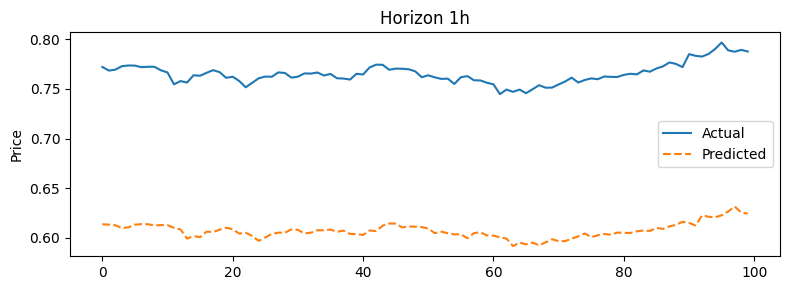

Horizon 2h: RMSE=0.16, MAPE=20.67%


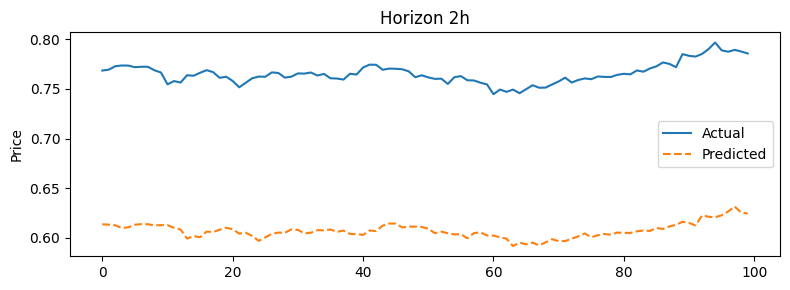

Horizon 3h: RMSE=0.14, MAPE=18.76%


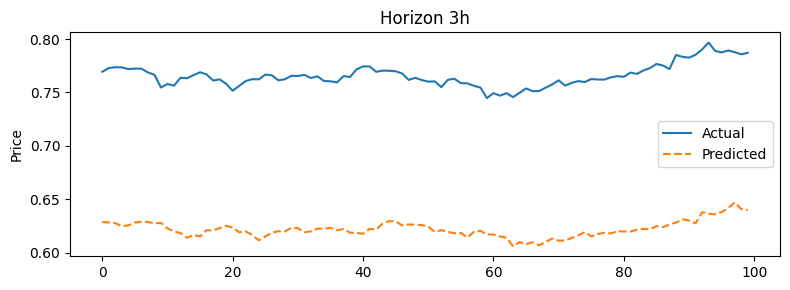

Horizon 6h: RMSE=0.11, MAPE=14.24%


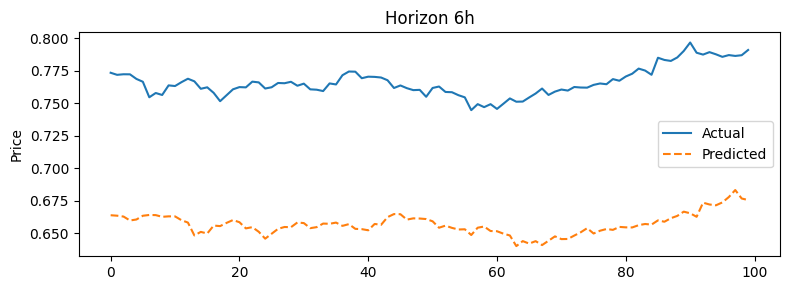

Horizon 12h: RMSE=0.30, MAPE=39.64%


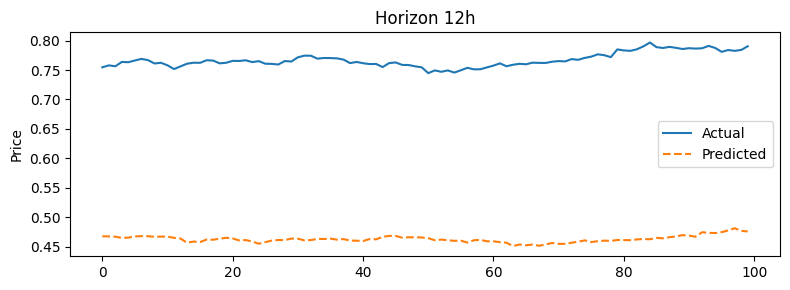

Horizon 1d: RMSE=0.15, MAPE=19.66%


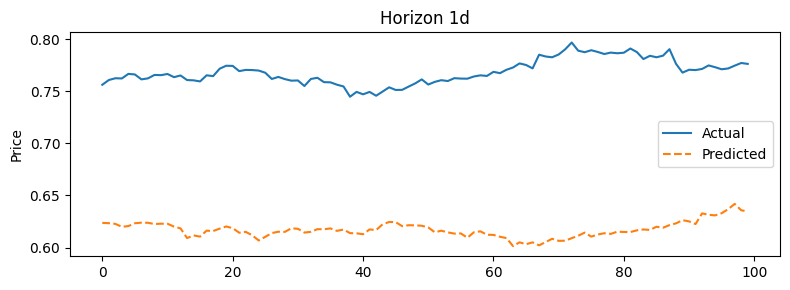

Horizon 3d: RMSE=0.16, MAPE=20.27%


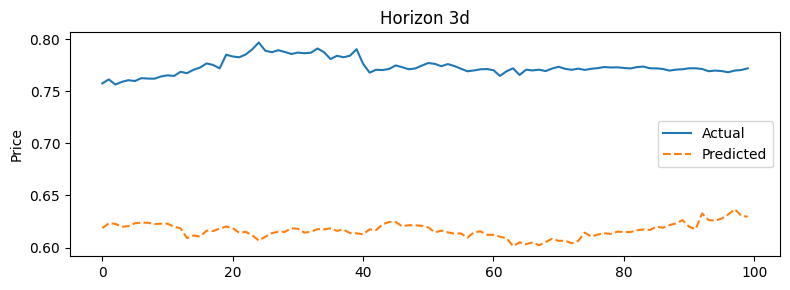

Horizon 7d: RMSE=0.21, MAPE=26.10%


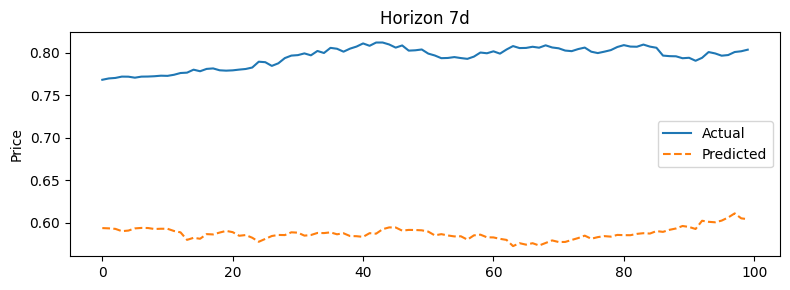

Horizon 15d: RMSE=0.08, MAPE=9.58%


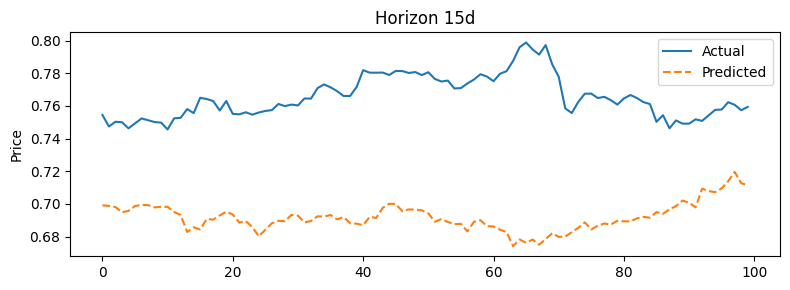

Horizon 30d: RMSE=0.15, MAPE=19.64%


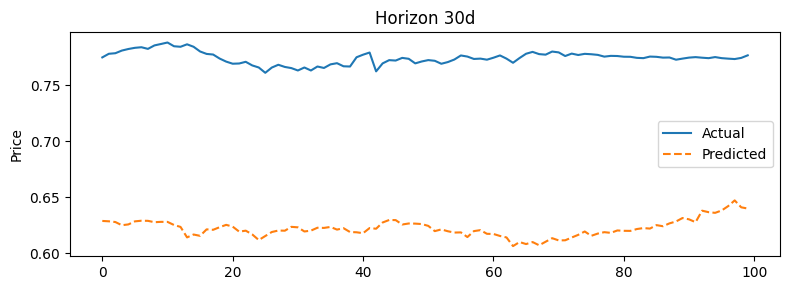

In [11]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# 1. PARAMETERS & PATHS
TRAIN_CSV     = '/kaggle/input/data-btc/fix/fix/train.csv'
VAL_CSV       = '/kaggle/input/data-btc/fix/fix/val.csv'
TEST_CSV      = '/kaggle/input/data-btc/fix/fix/test.csv'
WINDOW_SIZE  = 48
BATCH_SIZE   = 64
TUNE_EPOCHS  = 5
FINAL_EPOCHS = 5
LR           = 1e-3
PATIENCE     = 5
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED         = 42
n_plot       = 100   # jumlah titik awal yang akan diplot

torch.manual_seed(SEED)
np.random.seed(SEED)

# 2. LOAD DATA & PRESERVE RAW CLOSE PRICES
df_tr_raw   = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_va_raw   = pd.read_csv(VAL_CSV,   parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_te_raw   = pd.read_csv(TEST_CSV,  parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])

raw_tr_close = df_tr_raw['close'].values.copy()
raw_va_close = df_va_raw['close'].values.copy()
raw_te_close = df_te_raw['close'].values.copy()

# 3. SETUP FEATURES & LABELS (exclude 'close')
HORIZONS = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABELS   = [f'label_{h}' for h in HORIZONS]
FEATURES = [c for c in df_tr_raw.columns if c not in LABELS + ['close']]

# 4. SCALE FEATURES & LABELS using train-only scaler
feat_scaler  = MinMaxScaler().fit(df_tr_raw[FEATURES])
label_scaler = MinMaxScaler().fit(df_tr_raw[LABELS])
for df in (df_tr_raw, df_va_raw, df_te_raw):
    df[FEATURES] = feat_scaler.transform(df[FEATURES])
    df[LABELS]   = label_scaler.transform(df[LABELS])

# 5. FUNCTION: BUILD SEQUENCES & RETURN DELTA + LAST PRICE + TRUE PRICES
def make_sequences(df_scaled, raw_close, raw_label, window):
    X, Y, LP, TRUE = [], [], [], []
    arr_f = df_scaled[FEATURES].values
    N     = len(df_scaled)
    for i in range(N - window):
        seq        = arr_f[i:i+window]
        last_price = raw_close[i+window-1]
        future     = raw_label[i+window]
        delta      = (future - last_price) / (last_price + 1e-8)
        X.append(seq); Y.append(delta)
        LP.append(last_price); TRUE.append(future)
    return np.stack(X), np.stack(Y), np.array(LP), np.stack(TRUE)

# prepare combined train+val raw arrays
df_all_raw    = pd.concat([df_tr_raw, df_va_raw], ignore_index=True)
raw_all_close = np.concatenate([raw_tr_close, raw_va_close])
raw_all_label = np.vstack([df_tr_raw[LABELS].values, df_va_raw[LABELS].values])

# sequences for train+val
X_all, Y_all, LP_all, TRUE_all = make_sequences(df_all_raw, raw_all_close, raw_all_label, WINDOW_SIZE)
n_tr = len(df_tr_raw) - WINDOW_SIZE

X_tr, Y_tr, LP_tr, TRUE_tr = X_all[:n_tr], Y_all[:n_tr], LP_all[:n_tr], TRUE_all[:n_tr]
X_va, Y_va, LP_va, TRUE_va = X_all[n_tr:], Y_all[n_tr:], LP_all[n_tr:], TRUE_all[n_tr:]

# sequences for test
X_te, Y_te, LP_te, TRUE_te = make_sequences(df_te_raw, raw_te_close, df_te_raw[LABELS].values, WINDOW_SIZE)

# 6. DATALOADERS
train_ds = TensorDataset(torch.FloatTensor(X_tr), torch.FloatTensor(Y_tr))
val_ds   = TensorDataset(torch.FloatTensor(X_va), torch.FloatTensor(Y_va))
test_ds  = TensorDataset(torch.FloatTensor(X_te), torch.FloatTensor(Y_te))

train_ld = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_ld   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)
test_ld  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False)

# 7. MODEL ARCHITECTURE (Skrip 1)
class MultiHorizonModel(nn.Module):
    def __init__(self, n_feat, n_hor, d_emb=8):
        super().__init__()
        self.conv = nn.Conv1d(n_feat, 64, kernel_size=3, padding=2, dilation=2)
        self.lstm = nn.LSTM(64, 128, batch_first=True, bidirectional=True)
        self.norm = nn.LayerNorm(256)
        self.attn = nn.MultiheadAttention(256, num_heads=4, batch_first=True)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.h_emb= nn.Embedding(n_hor, d_emb)
        self.heads= nn.ModuleList([
            nn.Sequential(nn.Linear(256+d_emb,64), nn.ReLU(), nn.Dropout(0.2), nn.Linear(64,1))
            for _ in range(n_hor)
        ])
    def forward(self,x):
        b = x.size(0)
        x = x.permute(0,2,1)
        x = self.conv(x)
        x = x.permute(0,2,1)
        x,_ = self.lstm(x)
        x = self.norm(x)
        att,_ = self.attn(x,x,x)
        x = self.norm(x+att)
        x = x.permute(0,2,1)
        feat = self.pool(x).squeeze(-1)
        out  = []
        for i, head in enumerate(self.heads):
            emb = self.h_emb(torch.full((b,), i, dtype=torch.long, device=feat.device))
            out.append(head(torch.cat([feat, emb],1)))
        return torch.cat(out,1)

model     = MultiHorizonModel(n_feat=X_tr.shape[2], n_hor=len(HORIZONS)).to(DEVICE)
criterion = nn.HuberLoss(delta=1.0)
weights   = torch.linspace(1,2,steps=len(HORIZONS)).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

# 8. TUNING LOOP (train vs val with early stopping)
best_val, cnt = float('inf'), 0
for ep in range(1, TUNE_EPOCHS+1):
    # train
    model.train()
    for xb,yb in tqdm(train_ld, desc=f"Train Ep{ep}/{TUNE_EPOCHS}"):
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        loss = (criterion(model(xb), yb) * weights).mean()
        optimizer.zero_grad(); loss.backward(); optimizer.step()
    # validate
    model.eval()
    vals = []
    with torch.no_grad():
        for xb,yb in tqdm(val_ld, desc=f" Val Ep{ep}/{TUNE_EPOCHS}"):
            xb,yb = xb.to(DEVICE), yb.to(DEVICE)
            vals.append(((criterion(model(xb), yb)*weights).mean().item()))
    val_loss = np.mean(vals)
    print(f" -> Val Loss: {val_loss:.4f}")
    if val_loss < best_val:
        best_val, cnt = val_loss, 0
        torch.save(model.state_dict(), 'best_tune.pth')
    else:
        cnt += 1
        if cnt >= PATIENCE:
            print("Early stopping tuning.")
            break

# 9. FINAL RETRAIN on train+val
model.load_state_dict(torch.load('best_tune.pth'))
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
combined_ds = TensorDataset(torch.FloatTensor(X_all), torch.FloatTensor(Y_all))
combined_ld = DataLoader(combined_ds, batch_size=BATCH_SIZE, shuffle=True)
for ep in tqdm(range(1, FINAL_EPOCHS+1), desc="Final Training"):
    model.train()
    for xb,yb in combined_ld:
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        loss  = (criterion(model(xb), yb)*weights).mean()
        optimizer.zero_grad(); loss.backward(); optimizer.step()

torch.save(model.state_dict(), 'LSTM_FINAL2.pth')
print("Saved LSTM_FINAL2.pth")

# 10. EVALUATION ON TEST (plot only first n_plot points)
model.eval()
all_pred, all_true = [], []
with torch.no_grad():
    for xb,yb in tqdm(test_ld, desc="Testing"):
        xb = xb.to(DEVICE)
        all_pred.append(model(xb).cpu().numpy())
        all_true.append(yb.numpy())

delta_pred = np.vstack(all_pred)
delta_true = np.vstack(all_true)
last_prices = LP_te

# reconstruct real prices
price_preds = np.stack([ last_prices * (1 + delta_pred[:,i]) for i in range(len(HORIZONS)) ], axis=1)
price_true  = TRUE_te

# plot first n_plot from test
for i, h in enumerate(HORIZONS):
    rmse = mean_squared_error(price_true[:n_plot,i], price_preds[:n_plot,i], squared=False)
    mape = mean_absolute_percentage_error(price_true[:n_plot,i], price_preds[:n_plot,i]) * 100
    print(f"Horizon {h}: RMSE={rmse:.2f}, MAPE={mape:.2f}%")
    plt.figure(figsize=(8,3))
    plt.plot(price_true[:n_plot,i], label='Actual')
    plt.plot(price_preds[:n_plot,i],'--', label='Predicted')
    plt.title(f'Horizon {h}')
    plt.ylabel('Price')
    plt.legend()
    plt.tight_layout()
    plt.show()


LSTM FINAL 4

===== FASE 1: TRAIN → VAL =====
Ep1 val_loss=0.0020
Ep2 val_loss=0.0018
Ep3 val_loss=0.0020
Ep4 val_loss=0.0029
Ep5 val_loss=0.0029
Early stop
1h: RMSE=1520.73, MAPE=1.31%


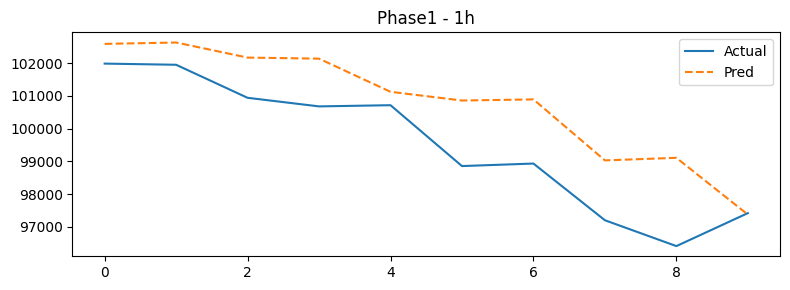

2h: RMSE=1946.50, MAPE=1.80%


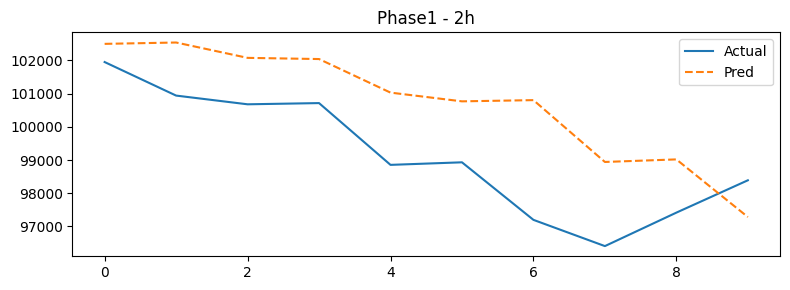

3h: RMSE=2392.13, MAPE=2.07%


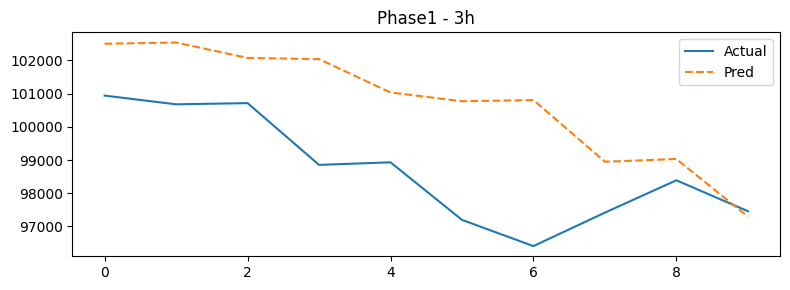

6h: RMSE=3531.74, MAPE=3.30%


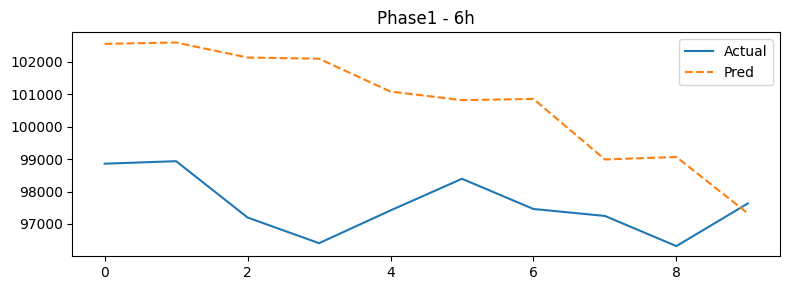

12h: RMSE=3894.55, MAPE=3.70%


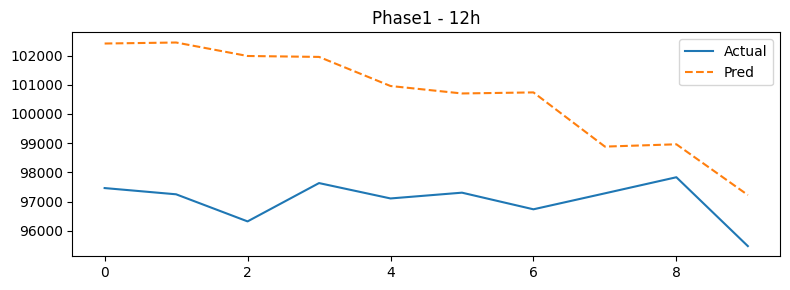

1d: RMSE=5897.11, MAPE=5.45%


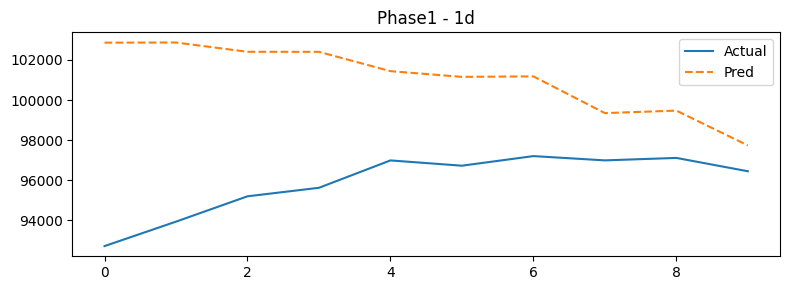

3d: RMSE=5977.94, MAPE=6.09%


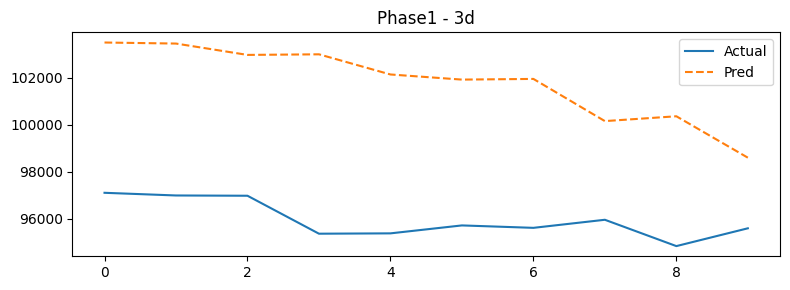

7d: RMSE=5902.12, MAPE=5.92%


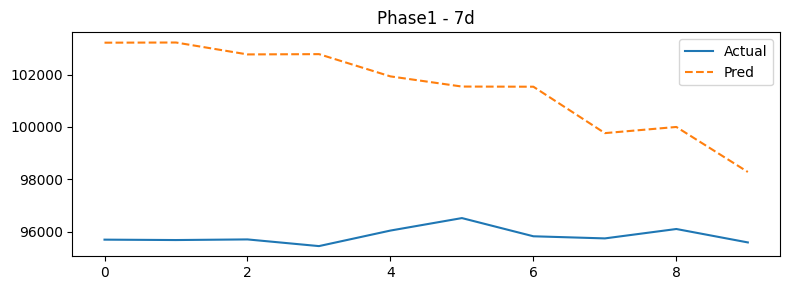

15d: RMSE=3449.51, MAPE=2.98%


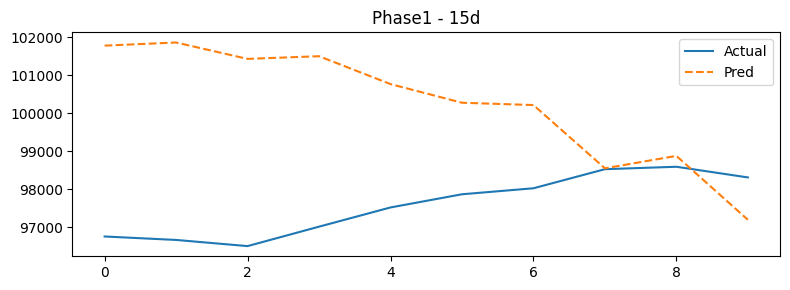

30d: RMSE=9287.57, MAPE=8.79%


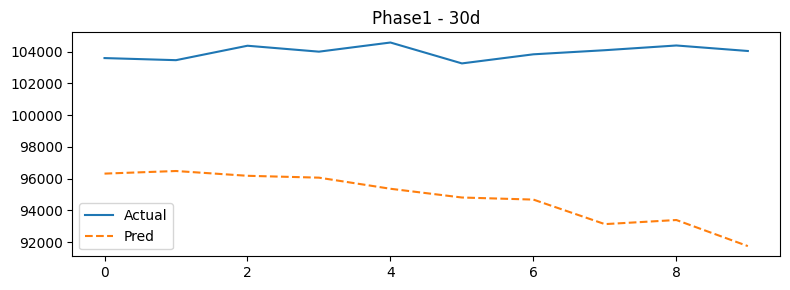

1h: RMSE=305.59, MAPE=0.28%


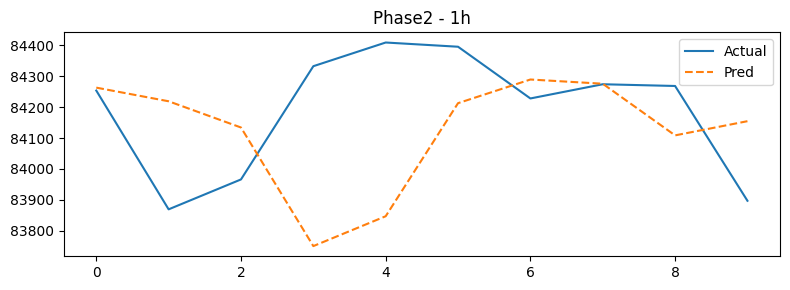

2h: RMSE=357.33, MAPE=0.33%


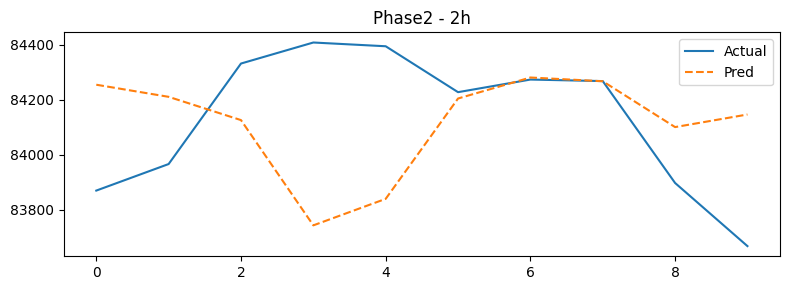

3h: RMSE=643.09, MAPE=0.52%


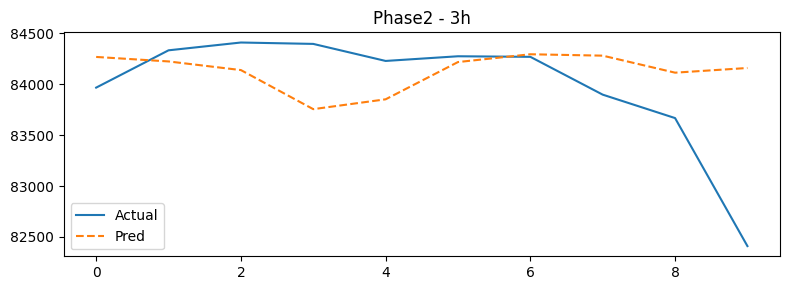

6h: RMSE=1191.21, MAPE=1.12%


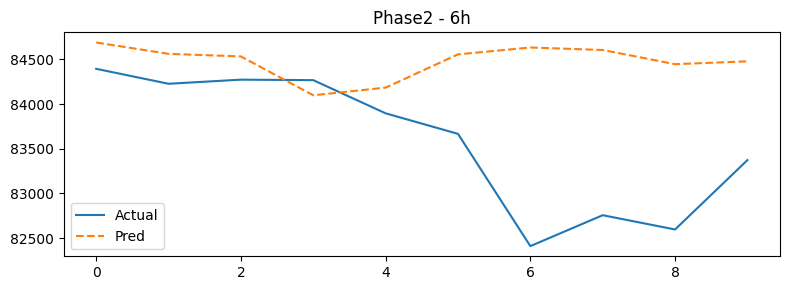

12h: RMSE=1246.66, MAPE=1.37%


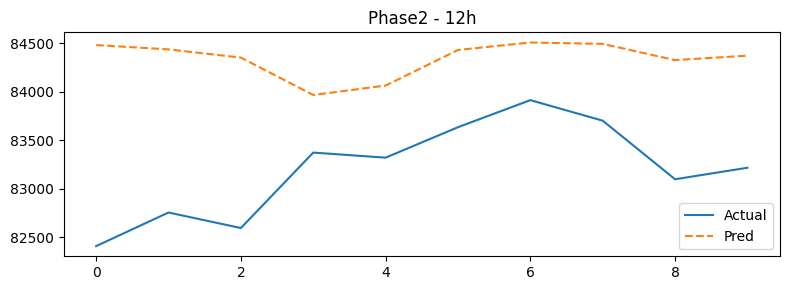

1d: RMSE=1116.31, MAPE=1.25%


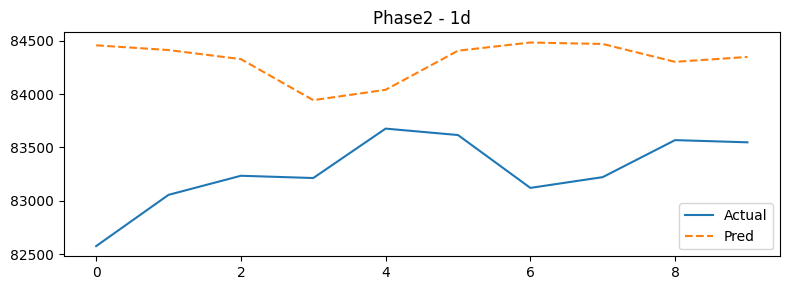

3d: RMSE=1197.43, MAPE=1.41%


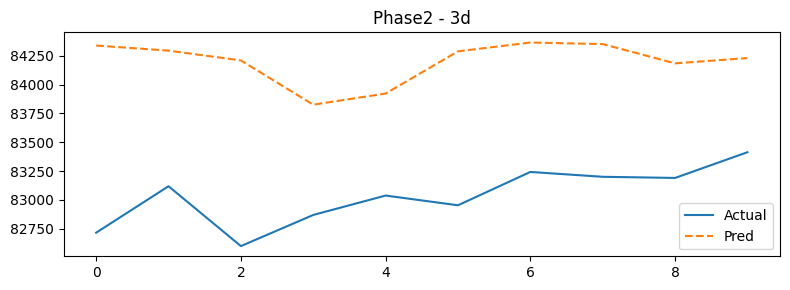

7d: RMSE=1145.75, MAPE=1.27%


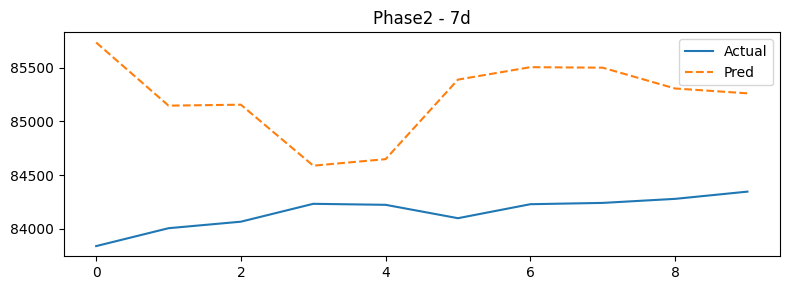

15d: RMSE=10363.75, MAPE=12.59%


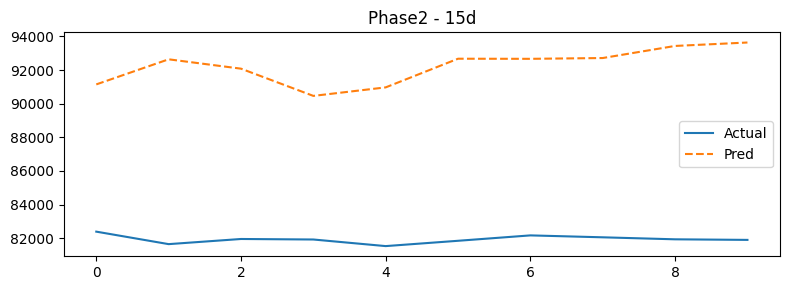

30d: RMSE=8737.13, MAPE=10.14%


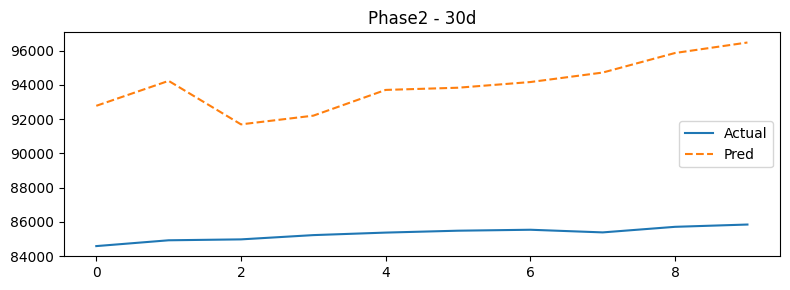

In [6]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import torch, torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# Paths
TRAIN_CSV = '/kaggle/input/data-btc/fix3/fix2/train.csv'
VAL_CSV   = '/kaggle/input/data-btc/fix3/fix2/val.csv'
TEST_CSV  = '/kaggle/input/data-btc/fix3/fix2/test.csv'

# Params
WINDOW_SIZE  = 48
BATCH_SIZE   = 64
TUNE_EPOCHS  = 10
FINAL_EPOCHS = 10
LR           = 1e-3
PATIENCE     = 3
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED         = 42

torch.manual_seed(SEED)
np.random.seed(SEED)

# 1) Load raw
df_tr_raw   = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va_raw   = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])
df_te_raw   = pd.read_csv(TEST_CSV,  parse_dates=['timestamp'])

# 2) Prepare feature/label columns
HORIZONS = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABELS   = [f'label_{h}' for h in HORIZONS]
FEATS    = [c for c in df_tr_raw.columns if c not in LABELS + ['timestamp','close_time']]

# 3) Scale train/val features & labels
scaler_X   = MinMaxScaler().fit(df_tr_raw[FEATS])
scaler_y   = MinMaxScaler().fit(df_tr_raw[LABELS])

df_tr = df_tr_raw.copy()
df_va = df_va_raw.copy()
df_tr[FEATS] = scaler_X.transform(df_tr[FEATS])
df_va[FEATS] = scaler_X.transform(df_va[FEATS])
df_tr[LABELS] = scaler_y.transform(df_tr[LABELS])
df_va[LABELS] = scaler_y.transform(df_va[LABELS])

# 4) Sequence maker
def make_sequences(df_scaled, raw_close, raw_label, window):
    X, Y, LP, Y_true = [], [], [], []
    arr_f = df_scaled[FEATS].values
    N     = len(df_scaled)
    for i in range(N - window):
        seq        = arr_f[i:i+window]
        last_price = raw_close[i+window-1]
        future     = raw_label[i+window]
        delta      = (future - last_price) / (last_price + 1e-8)
        X.append(seq); Y.append(delta)
        LP.append(last_price); Y_true.append(future)
    if len(X)==0:
        return None, None, None, None
    return (np.stack(X), np.stack(Y),
            np.array(LP), np.stack(Y_true))

# Build raw arrays
df_all_raw   = pd.concat([df_tr_raw, df_va_raw, df_te_raw], ignore_index=True)
raw_close_all= df_all_raw['close'].values
raw_label_all= df_all_raw[LABELS].values

# Split raw arrays for train+val and test
n_tr, n_va = len(df_tr_raw), len(df_va_raw)
# train+val raw
rc_tv = raw_close_all[:n_tr+n_va]
rl_tv = raw_label_all[:n_tr+n_va]
# test raw
rc_te = raw_close_all[n_tr+n_va:]
rl_te = raw_label_all[n_tr+n_va:]

# Build sequences for train & val
X_all, Y_all, LP_all, TRUE_all = make_sequences(
    pd.concat([df_tr, df_va], ignore_index=True),
    rc_tv, rl_tv, WINDOW_SIZE
)
n_tr_seq = len(df_tr_raw) - WINDOW_SIZE
X_tr, Y_tr, LP_tr, TRUE_tr = X_all[:n_tr_seq], Y_all[:n_tr_seq], LP_all[:n_tr_seq], TRUE_all[:n_tr_seq]
X_va, Y_va, LP_va, TRUE_va = X_all[n_tr_seq:], Y_all[n_tr_seq:], LP_all[n_tr_seq:], TRUE_all[n_tr_seq:]

# Build test sequences
X_te, Y_te, LP_te, TRUE_te = make_sequences(
    df_te_raw, rc_te, rl_te, WINDOW_SIZE
)

# DataLoaders
train_ds = TensorDataset(torch.FloatTensor(X_tr), torch.FloatTensor(Y_tr))
val_ds   = TensorDataset(torch.FloatTensor(X_va), torch.FloatTensor(Y_va))
test_ds  = (None if X_te is None else
            TensorDataset(torch.FloatTensor(X_te), torch.FloatTensor(Y_te)))

train_ld = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_ld   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)
test_ld  = (None if test_ds is None else
            DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False))

# 5) Model definition (unchanged)
class MultiHorizonModel(nn.Module):
    def __init__(self, n_feat, n_hor, d_emb=8):
        super().__init__()
        self.conv = nn.Conv1d(n_feat, 64, kernel_size=3, padding=2, dilation=2)
        self.lstm = nn.LSTM(64, 128, batch_first=True, bidirectional=True)
        self.norm = nn.LayerNorm(256)
        self.attn = nn.MultiheadAttention(256, num_heads=4, batch_first=True)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.h_emb= nn.Embedding(n_hor, d_emb)
        self.heads= nn.ModuleList([
            nn.Sequential(
                nn.Linear(256+d_emb,64), nn.ReLU(),
                nn.Dropout(0.2), nn.Linear(64,1)
            ) for _ in range(n_hor)
        ])
    def forward(self,x):
        b = x.size(0)
        x = x.permute(0,2,1)
        x = self.conv(x)
        x = x.permute(0,2,1)
        x,_ = self.lstm(x)
        x = self.norm(x)
        att,_ = self.attn(x,x,x)
        x = self.norm(x+att)
        x = x.permute(0,2,1)
        feat = self.pool(x).squeeze(-1)
        out = []
        for i, head in enumerate(self.heads):
            emb = self.h_emb(torch.full((b,), i, dtype=torch.long, device=feat.device))
            out.append(head(torch.cat([feat,emb],1)))
        return torch.cat(out,1)

# Utility: evaluation on first 10 sequences of a loader
def eval_loader(model, loader, LP, TRUE, desc):
    model.eval()
    preds, trues = [], []
    with torch.no_grad():
        for idx, (xb,yb) in enumerate(loader):
            if idx*BATCH_SIZE >= 10: break
            xb = xb.to(DEVICE)
            out = model(xb).cpu().numpy()  # shape [bs,10]
            # convert deltas to prices
            for b in range(out.shape[0]):
                i = idx*BATCH_SIZE + b
                if i>=10: break
                last = LP[i]
                for h in range(len(HORIZONS)):
                    # price_preds[h][i] = last *(1+out[i,h])
                    pass
            preds.append(out)
            trues.append(yb.numpy())
    # stack
    preds = np.vstack(preds)[:10]
    trues = np.vstack(trues)[:10]
    # reconstruct price arrays
    price_pred = np.array([ LP[:10] * (1+preds[:,h]) for h in range(len(HORIZONS)) ]).T
    price_true = TRUE[:10]
    # plot per horizon
    for h, hor in enumerate(HORIZONS):
        rmse = mean_squared_error(price_true[:,h], price_pred[:,h], squared=False)
        mape = mean_absolute_percentage_error(price_true[:,h], price_pred[:,h])*100
        print(f"{hor}: RMSE={rmse:.2f}, MAPE={mape:.2f}%")
        plt.figure(figsize=(8,3))
        plt.plot(price_true[:10,h], label='Actual')
        plt.plot(price_pred[:10,h],'--',label='Pred')
        plt.title(f"{desc} - {hor}")
        plt.legend(); plt.tight_layout(); plt.show()

# 6) FASE 1: TRAIN→VAL (default LSTM)
print("===== FASE 1: TRAIN → VAL =====")
model = MultiHorizonModel(n_feat=X_tr.shape[2], n_hor=len(HORIZONS)).to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
criterion = nn.HuberLoss(delta=1.0)
weights   = torch.linspace(1,2,steps=len(HORIZONS)).to(DEVICE)

best_val, cnt = float('inf'), 0
for ep in range(1, TUNE_EPOCHS+1):
    model.train()
    for xb,yb in train_ld:
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        loss = (criterion(model(xb), yb)*weights).mean()
        optimizer.zero_grad(); loss.backward(); optimizer.step()
    # eval on val
    val_losses = []
    model.eval()
    with torch.no_grad():
        for xb,yb in val_ld:
            xb,yb = xb.to(DEVICE), yb.to(DEVICE)
            val_losses.append(((criterion(model(xb), yb)*weights).mean().item()))
    vloss = np.mean(val_losses)
    print(f"Ep{ep} val_loss={vloss:.4f}")
    if vloss < best_val:
        best_val, cnt = vloss, 0
        torch.save(model.state_dict(), 'best_tune.pth')
    else:
        cnt+=1
        if cnt>=PATIENCE:
            print("Early stop")
            break

# eval first 10 val
eval_loader(model, val_ld, LP_va, TRUE_va, desc="Phase1")

# 7) FASE 2: TRAIN+VAL→TEST (final retrain & test)
model.load_state_dict(torch.load('best_tune.pth'))
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
# create combined loader
X_all_tr = np.vstack([X_tr, X_va]); Y_all_tr = np.vstack([Y_tr, Y_va])
trainval_ds = TensorDataset(torch.FloatTensor(X_all_tr), torch.FloatTensor(Y_all_tr))
trainval_ld = DataLoader(trainval_ds, batch_size=BATCH_SIZE, shuffle=True)
for ep in range(1, FINAL_EPOCHS+1):
    model.train()
    for xb,yb in trainval_ld:
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        loss = (criterion(model(xb), yb)*weights).mean()
        optimizer.zero_grad(); loss.backward(); optimizer.step()

# eval first 10 test
if test_ld is not None:
    eval_loader(model, test_ld, LP_te, TRUE_te, desc="Phase2")
else:
    print("Test too short for WINDOW_SIZE, skipping.")


=== PHASE 1: TRAIN→VAL ===
Ep1 val_loss=0.0020
Ep2 val_loss=0.0017
Ep3 val_loss=0.0022
Ep4 val_loss=0.0024
Ep5 val_loss=0.0028
Early stopping
--- Phase1 VAL LP first10: [102409.34 102449.99 101988.   101952.44 100942.41 100679.86 100716.3
  98855.86  98932.73  97199.72]
--- Phase1 VAL TRUE_1h first10: [101988.   101952.44 100942.41 100679.86 100716.3   98855.86  98932.73
  97199.72  96409.54  97417.66]
--- Phase1 VAL TRUE_2h first10: [101952.44 100942.41 100679.86 100716.3   98855.86  98932.73  97199.72
  96409.54  97417.66  98391.21]
--- Phase1 VAL TRUE_3h first10: [100942.41 100679.86 100716.3   98855.86  98932.73  97199.72  96409.54
  97417.66  98391.21  97461.86]
--- Phase1 VAL TRUE_6h first10: [98855.86 98932.73 97199.72 96409.54 97417.66 98391.21 97461.86 97248.22
 96319.99 97632.59]
--- Phase1 VAL TRUE_12h first10: [97461.86 97248.22 96319.99 97632.59 97106.02 97304.07 96734.32 97281.37
 97832.53 95473.74]
--- Phase1 VAL TRUE_1d first10: [92723.98 93941.75 95204.   95627.99 9699

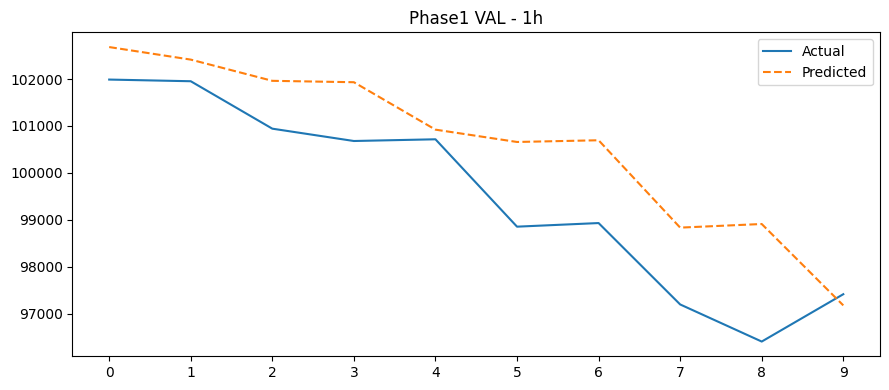

Phase1 VAL 2h: RMSE=2016.91, MAPE=1.89%


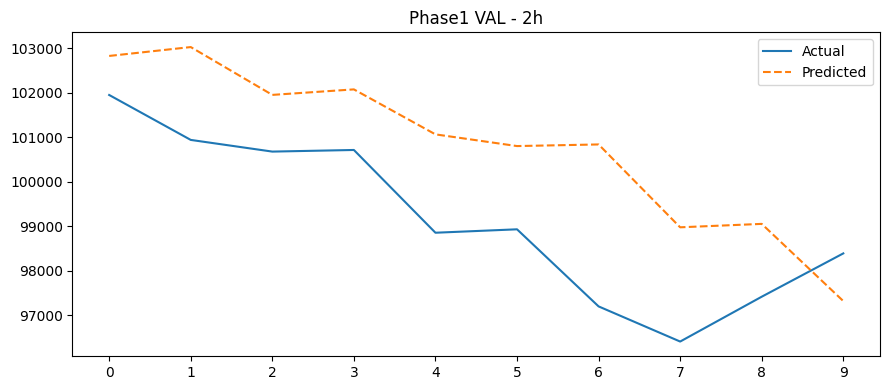

Phase1 VAL 3h: RMSE=2137.41, MAPE=1.80%


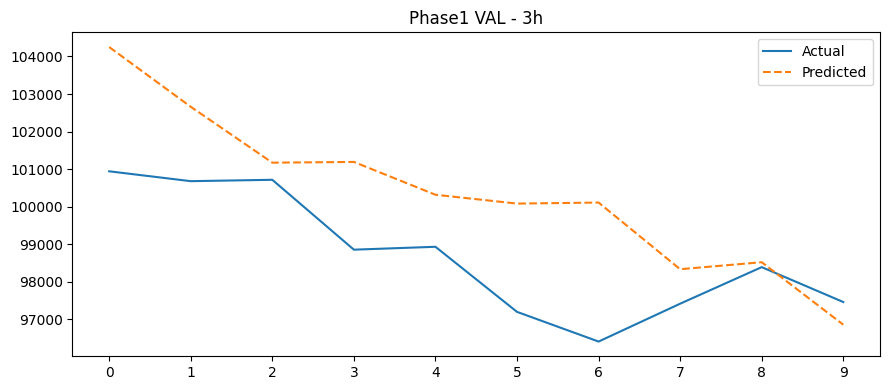

Phase1 VAL 6h: RMSE=3124.39, MAPE=2.92%


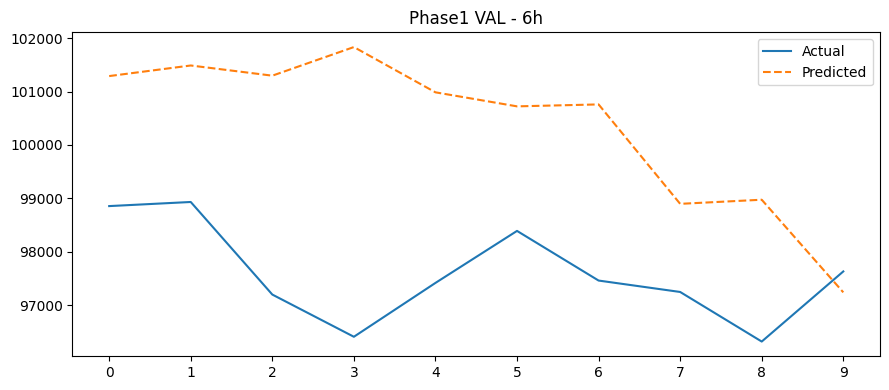

Phase1 VAL 12h: RMSE=2946.98, MAPE=2.78%


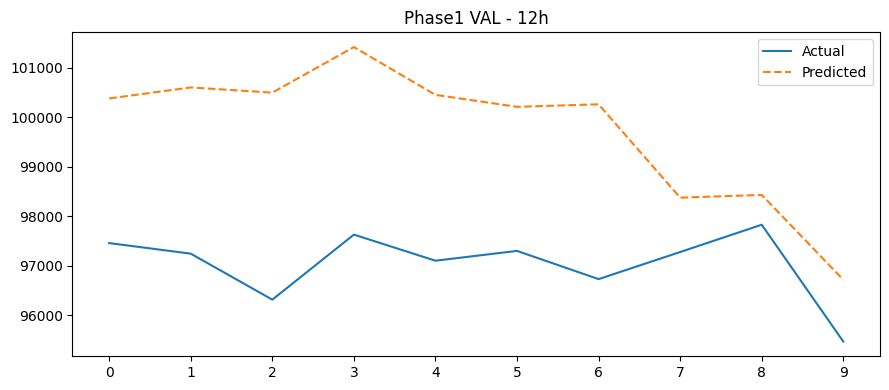

Phase1 VAL 1d: RMSE=4433.93, MAPE=3.96%


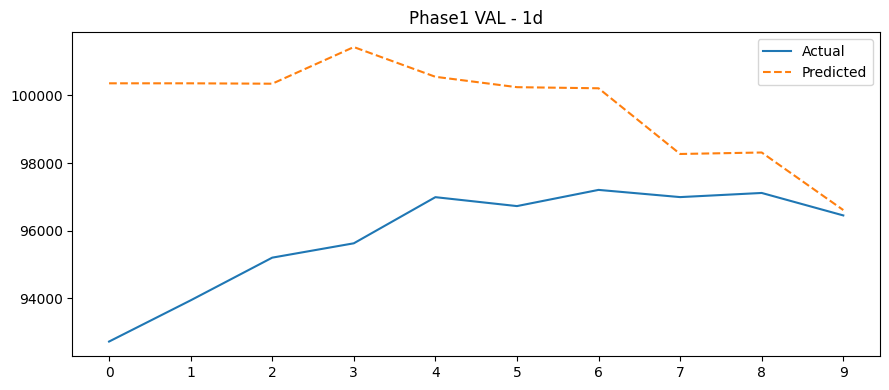

Phase1 VAL 3d: RMSE=1578.80, MAPE=1.46%


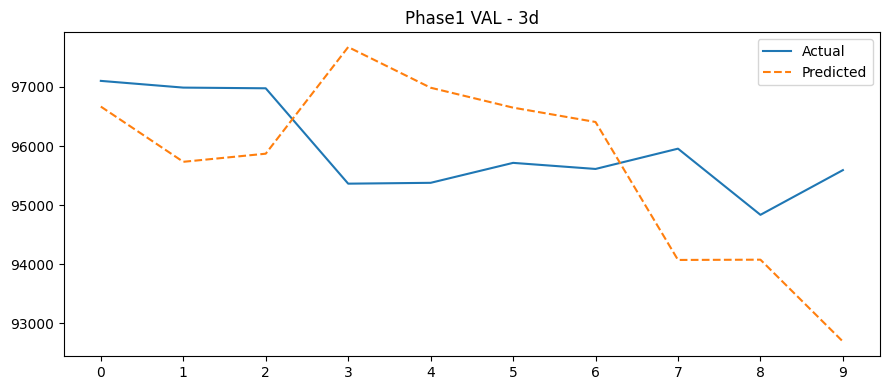

Phase1 VAL 7d: RMSE=4735.19, MAPE=4.51%


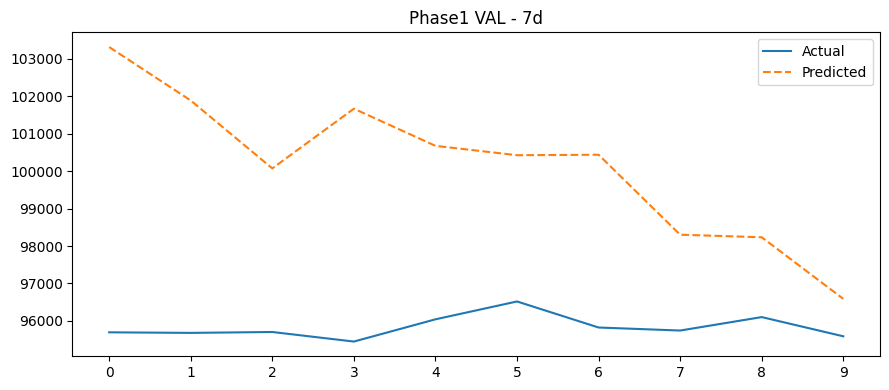

Phase1 VAL 15d: RMSE=5126.11, MAPE=4.20%


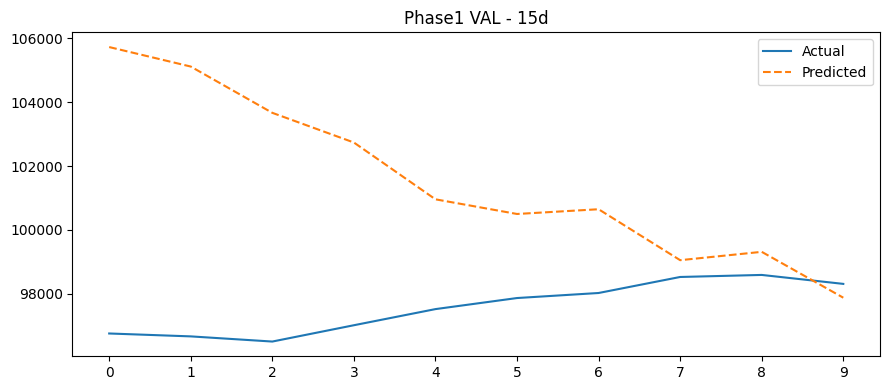

Phase1 VAL 30d: RMSE=14778.58, MAPE=14.09%


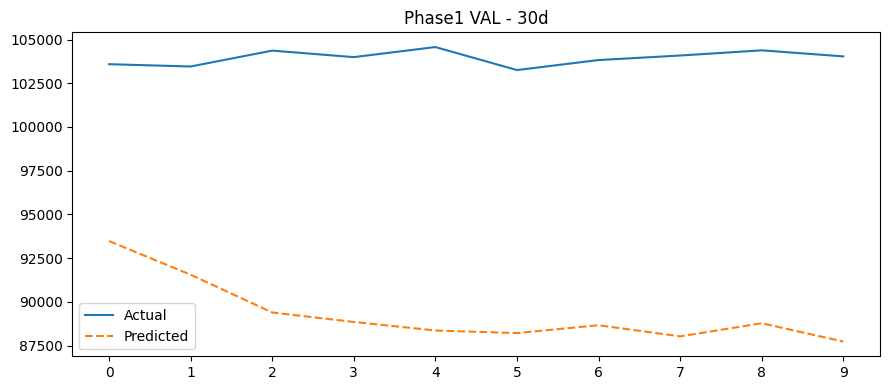


=== PHASE 2: TRAIN+VAL→TEST ===
--- Phase2 TEST LP first10: [81395.54 81115.78 81503.31 81603.08 82226.98 81888.77 81948.16 82141.96
 82038.09 82170.85]
--- Phase2 TEST TRUE_1h first10: [81503.31 81603.08 82226.98 81888.77 81948.16 82141.96 82038.09 82170.85
 82593.44 82776.5 ]
--- Phase2 TEST TRUE_2h first10: [81603.08 82226.98 81888.77 81948.16 82141.96 82038.09 82170.85 82593.44
 82776.5  83042.22]
--- Phase2 TEST TRUE_3h first10: [82226.98 81888.77 81948.16 82141.96 82038.09 82170.85 82593.44 82776.5
 83042.22 83253.15]
--- Phase2 TEST TRUE_6h first10: [82141.96 82038.09 82170.85 82593.44 82776.5  83042.22 83253.15 83420.87
 83602.16 83524.8 ]
--- Phase2 TEST TRUE_12h first10: [83253.15 83420.87 83602.16 83524.8  84724.58 84787.37 84365.18 84570.54
 84554.   84127.2 ]
--- Phase2 TEST TRUE_1d first10: [83983.2  84297.14 84353.85 84557.95 84491.99 84456.57 84266.26 84183.28
 83827.31 83891.36]
--- Phase2 TEST TRUE_3d first10: [82574.53 83054.91 83233.8  83212.51 83675.65 83615.53 83

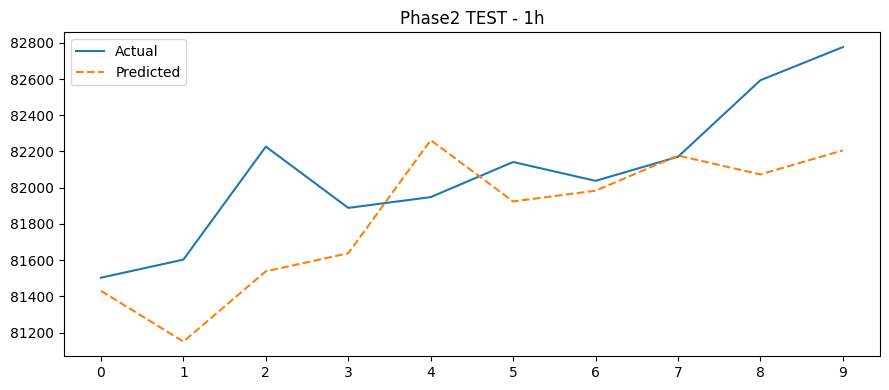

Phase2 TEST 2h: RMSE=520.43, MAPE=0.50%


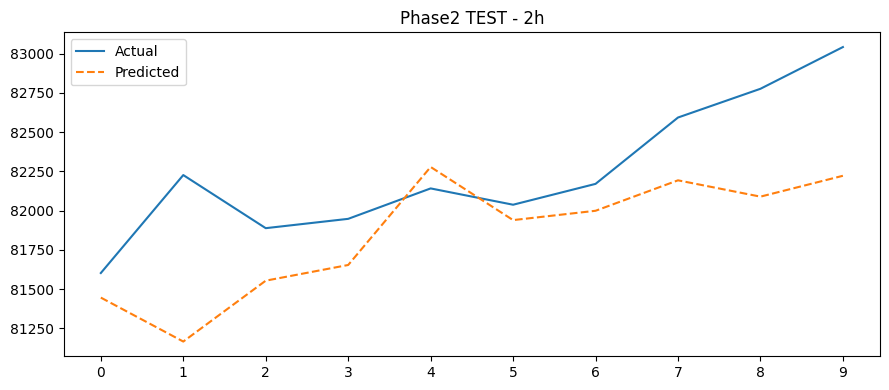

Phase2 TEST 3h: RMSE=657.88, MAPE=0.73%


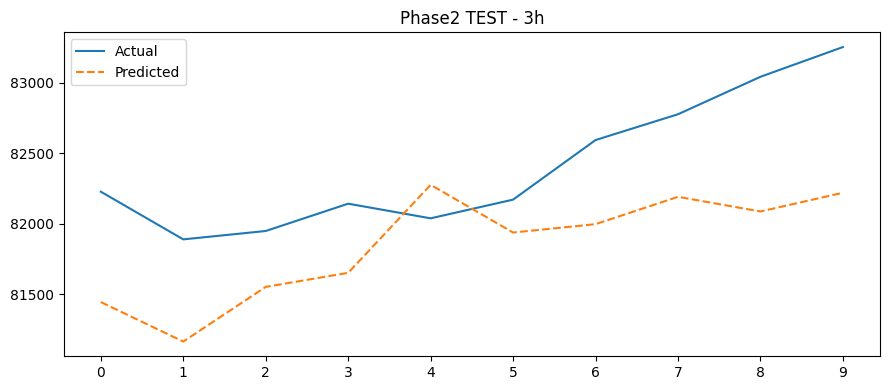

Phase2 TEST 6h: RMSE=1017.69, MAPE=1.16%


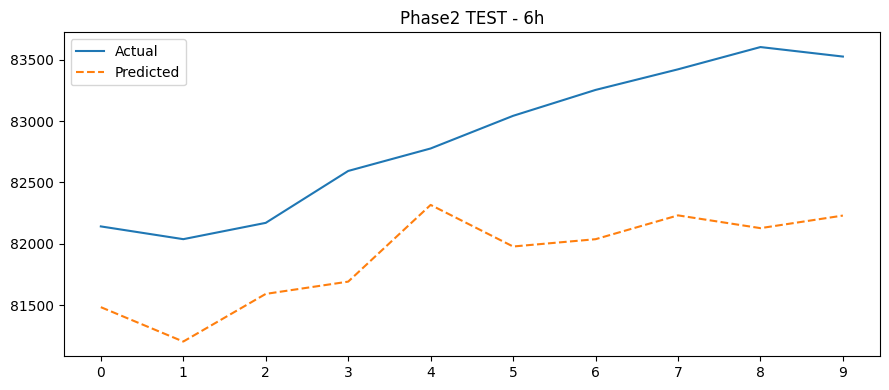

Phase2 TEST 12h: RMSE=2379.92, MAPE=2.80%


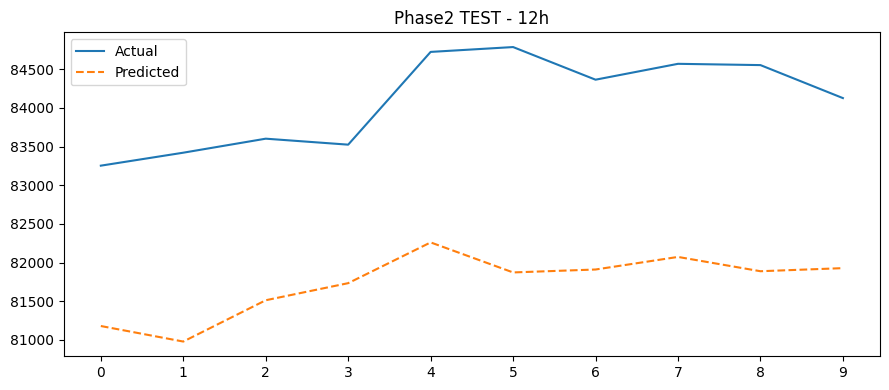

Phase2 TEST 1d: RMSE=2610.31, MAPE=3.07%


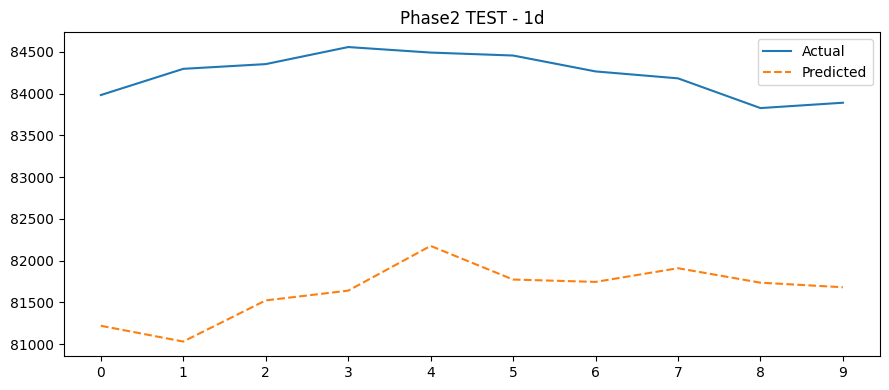

Phase2 TEST 3d: RMSE=3088.07, MAPE=3.62%


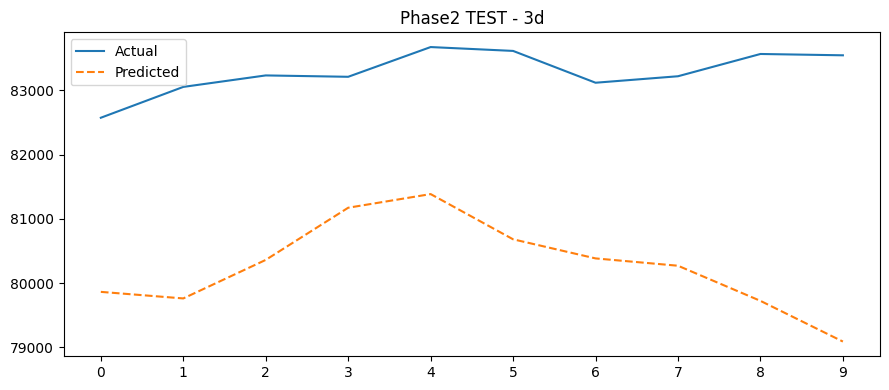

Phase2 TEST 7d: RMSE=3672.05, MAPE=4.27%


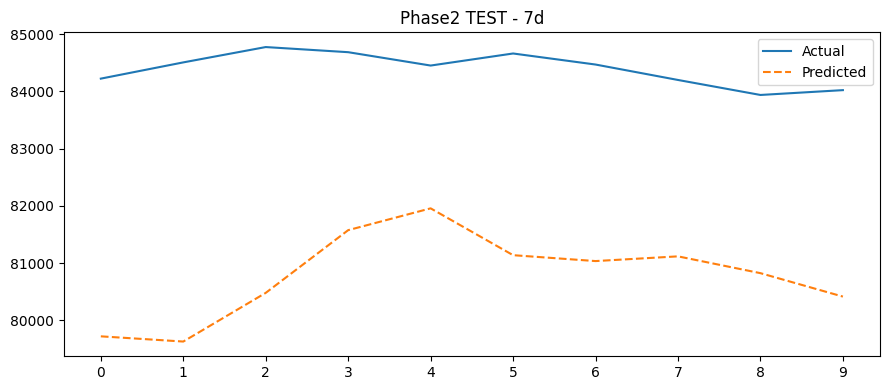

Phase2 TEST 15d: RMSE=983.34, MAPE=0.99%


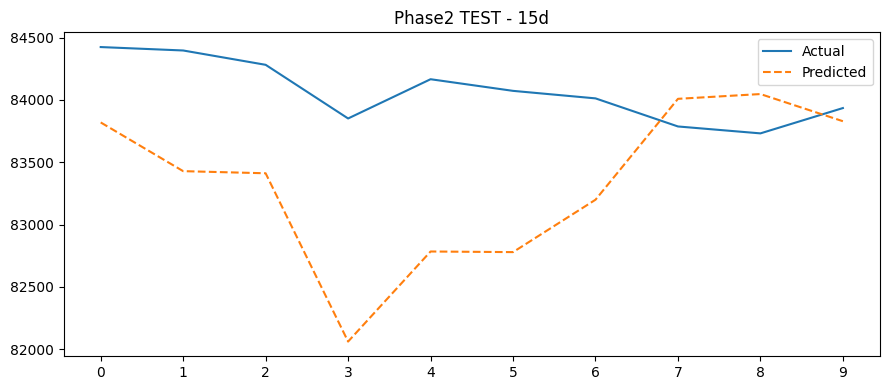

Phase2 TEST 30d: RMSE=2225.41, MAPE=2.33%


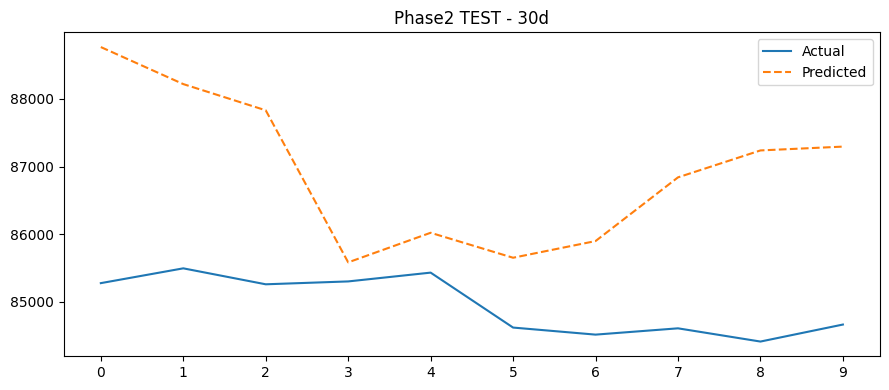

In [10]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import torch, torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# Paths & params
TRAIN_CSV   = '/kaggle/input/data-btc/fix3/fix2/train.csv'
VAL_CSV     = '/kaggle/input/data-btc/fix3/fix2/val.csv'
TEST_CSV    = '/kaggle/input/data-btc/fix3/fix2/test.csv'
WINDOW_SIZE = 48
BATCH_SIZE  = 64
TUNE_EPOCHS = 5
FINAL_EPOCHS= 5
LR          = 1e-3
PATIENCE    = 3
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED        = 42

torch.manual_seed(SEED)
np.random.seed(SEED)

# 1) Load raw
df_tr_raw   = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va_raw   = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])
df_te_raw   = pd.read_csv(TEST_CSV,  parse_dates=['timestamp'])

# 2) Define horizons
HORIZONS = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABELS   = [f'label_{h}' for h in HORIZONS]
FEATS    = [c for c in df_tr_raw.columns if c not in LABELS+['timestamp','close_time']]

# 3) Scale train & val
scaler_X = MinMaxScaler().fit(df_tr_raw[FEATS])
scaler_y = MinMaxScaler().fit(df_tr_raw[LABELS])

df_tr = df_tr_raw.copy()
df_va = df_va_raw.copy()
df_tr[FEATS] = scaler_X.transform(df_tr[FEATS])
df_va[FEATS] = scaler_X.transform(df_va[FEATS])
df_tr[LABELS] = scaler_y.transform(df_tr[LABELS])
df_va[LABELS] = scaler_y.transform(df_va[LABELS])

# 4) make_sequences
def make_sequences(df_scaled, raw_close, raw_label, window):
    X, Y, LP, Y_true = [], [], [], []
    arr_f = df_scaled[FEATS].values
    N     = len(df_scaled)
    for i in range(N - window):
        seq        = arr_f[i:i+window]
        last_price = raw_close[i+window-1]
        future     = raw_label[i+window]
        delta      = (future - last_price) / (last_price + 1e-8)
        X.append(seq); Y.append(delta)
        LP.append(last_price); Y_true.append(future)
    if not X:
        return None,None,None,None
    return np.stack(X), np.stack(Y), np.array(LP), np.stack(Y_true)

# 5) Build train+val sequences
raw_close_tv = pd.concat([df_tr_raw, df_va_raw], ignore_index=True)['close'].values
raw_label_tv = pd.concat([df_tr_raw[LABELS], df_va_raw[LABELS]], ignore_index=True).values
df_tv_scaled = pd.concat([df_tr, df_va], ignore_index=True)

X_all, Y_all, LP_all, TRUE_all = make_sequences(
    df_tv_scaled, raw_close_tv, raw_label_tv, WINDOW_SIZE
)
n_tr_seq = len(df_tr_raw) - WINDOW_SIZE
X_tr, Y_tr = X_all[:n_tr_seq], Y_all[:n_tr_seq]
LP_tr, TRUE_tr = LP_all[:n_tr_seq], TRUE_all[:n_tr_seq]
X_va, Y_va = X_all[n_tr_seq:], Y_all[n_tr_seq:]
LP_va, TRUE_va = LP_all[n_tr_seq:], TRUE_all[n_tr_seq:]

# 6) Build TEST sequences (prepend last WINDOW_SIZE of val)
raw_close_te = np.concatenate([
    df_va_raw['close'].values[-WINDOW_SIZE:],
    df_te_raw['close'].values
])
raw_label_te = np.concatenate([
    df_va_raw[LABELS].values[-WINDOW_SIZE:],
    df_te_raw[LABELS].values
])
df_va_scaled       = df_va.copy()
df_va_scaled[FEATS]= scaler_X.transform(df_va_scaled[FEATS])
df_te_scaled       = df_te_raw.copy()
df_te_scaled[FEATS]= scaler_X.transform(df_te_scaled[FEATS])
df_comb_scaled     = pd.concat([
    df_va_scaled.iloc[-WINDOW_SIZE:],
    df_te_scaled[FEATS]
], ignore_index=True)

X_te, Y_te, LP_te, TRUE_te = make_sequences(
    df_comb_scaled, raw_close_te, raw_label_te, WINDOW_SIZE
)

# 7) DataLoaders
train_ds = TensorDataset(torch.FloatTensor(X_tr), torch.FloatTensor(Y_tr))
val_ds   = TensorDataset(torch.FloatTensor(X_va), torch.FloatTensor(Y_va))
test_ds  = None if X_te is None else TensorDataset(torch.FloatTensor(X_te), torch.FloatTensor(Y_te))

train_ld = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_ld   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)
test_ld  = None if test_ds is None else DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False)

# 8) Model (unchanged)
class MultiHorizonModel(nn.Module):
    def __init__(self, n_feat, n_hor, d_emb=8):
        super().__init__()
        self.conv = nn.Conv1d(n_feat, 64, kernel_size=3, padding=2, dilation=2)
        self.lstm = nn.LSTM(64, 128, batch_first=True, bidirectional=True)
        self.norm = nn.LayerNorm(256)
        self.attn = nn.MultiheadAttention(256, num_heads=4, batch_first=True)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.h_emb= nn.Embedding(n_hor, d_emb)
        self.heads= nn.ModuleList([
            nn.Sequential(nn.Linear(256+d_emb,64), nn.ReLU(),
                          nn.Dropout(0.2), nn.Linear(64,1))
            for _ in range(n_hor)
        ])
    def forward(self,x):
        b = x.size(0)
        x = x.permute(0,2,1)
        x = self.conv(x)
        x = x.permute(0,2,1)
        x,_ = self.lstm(x)
        x = self.norm(x)
        att,_ = self.attn(x,x,x)
        x = self.norm(x+att)
        x = x.permute(0,2,1)
        feat = self.pool(x).squeeze(-1)
        outs=[]
        for i, head in enumerate(self.heads):
            emb = self.h_emb(torch.full((b,), i, dtype=torch.long, device=feat.device))
            outs.append(head(torch.cat([feat,emb],1)))
        return torch.cat(outs,1)

# eval helper
def eval_phase(model, LP, TRUE, desc):
    print(f"--- {desc} LP first10:", LP[:10])
    for hi,h in enumerate(HORIZONS):
        print(f"--- {desc} TRUE_{h} first10:", TRUE[:10,hi])
    preds=[]; trues=TRUE[:10]
    model.eval()
    with torch.no_grad():
        for i in range(10):
            xb = torch.FloatTensor(X_te[i:i+1]).to(DEVICE)
            out= model(xb).cpu().numpy()[0]
            preds.append(out)
    preds = np.stack(preds)  # (10,10)
    price_pred = np.zeros_like(preds)
    for i in range(10):
        price_pred[i] = LP[i] * (1+preds[i])
    # plot
    for hi,h in enumerate(HORIZONS):
        rmse = mean_squared_error(trues[:,hi], price_pred[:,hi], squared=False)
        mape = mean_absolute_percentage_error(trues[:,hi], price_pred[:,hi])*100
        print(f"{desc} {h}: RMSE={rmse:.2f}, MAPE={mape:.2f}%")
        plt.figure(figsize=(9,4))
        plt.plot(trues[:,hi], label='Actual')
        plt.plot(price_pred[:,hi],'--', label='Predicted')
        plt.xticks(range(10))
        plt.title(f"{desc} - {h}")
        plt.legend(); plt.tight_layout(); plt.show()

# 9) Phase 1: TRAIN→VAL (no tune)
print("=== PHASE 1: TRAIN→VAL ===")
model = MultiHorizonModel(n_feat=X_tr.shape[2], n_hor=len(HORIZONS)).to(DEVICE)
opt   = torch.optim.Adam(model.parameters(), lr=LR)
crit  = nn.HuberLoss(delta=1.0)
weights = torch.linspace(1,2,steps=len(HORIZONS)).to(DEVICE)

best_val, cnt = float('inf'), 0
for ep in range(1, TUNE_EPOCHS+1):
    model.train()
    for xb,yb in train_ld:
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        loss  = (crit(model(xb), yb)*weights).mean()
        opt.zero_grad(); loss.backward(); opt.step()
    # validate
    val_losses=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in val_ld:
            xb,yb = xb.to(DEVICE), yb.to(DEVICE)
            val_losses.append(((crit(model(xb), yb)*weights).mean().item()))
    mv = np.mean(val_losses)
    print(f"Ep{ep} val_loss={mv:.4f}")
    if mv<best_val:
        best_val, cnt = mv, 0
        torch.save(model.state_dict(), 'best_tune.pth')
    else:
        cnt+=1
        if cnt>=PATIENCE:
            print("Early stopping"); break

# eval on VAL sequences
eval_phase(model, LP_va, TRUE_va, desc="Phase1 VAL")

# 10) Phase 2: TRAIN+VAL→TEST (final retrain & eval)
print("\n=== PHASE 2: TRAIN+VAL→TEST ===")
model.load_state_dict(torch.load('best_tune.pth'))
opt = torch.optim.Adam(model.parameters(), lr=LR)
# combine train+val
X_comb = np.vstack([X_tr, X_va]); Y_comb = np.vstack([Y_tr, Y_va])
comb_ds  = TensorDataset(torch.FloatTensor(X_comb), torch.FloatTensor(Y_comb))
comb_ld  = DataLoader(comb_ds, batch_size=BATCH_SIZE, shuffle=True)
for ep in range(1, FINAL_EPOCHS+1):
    model.train()
    for xb,yb in comb_ld:
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        loss  = (crit(model(xb), yb)*weights).mean()
        opt.zero_grad(); loss.backward(); opt.step()

# eval on TEST sequences
eval_phase(model, LP_te, TRUE_te, desc="Phase2 TEST")


test ke 100 data (model fix)

=== PHASE 1: TRAIN→VAL ===
Ep1 val_loss=0.0017
Ep2 val_loss=0.0021
Ep3 val_loss=0.0022
Ep4 val_loss=0.0027
Early stopping
--- Phase1 VAL LP first 100: [102409.34 102449.99 101988.   101952.44 100942.41 100679.86 100716.3
  98855.86  98932.73  97199.72  96409.54  97417.66  98391.21  97461.86
  97248.22  96319.99  97632.59  97106.02  97304.07  96734.32  97281.37
  97832.53  95473.74  94811.85  94359.53  92723.98  93941.75  95204.
  95627.99  96991.62  96727.99  97206.59  96993.58  97116.    96451.88
  96623.29  97463.93  97805.44  97525.77  97357.23  97396.    97487.46
  97588.    98691.98  98726.76  99040.    98650.    98565.82  98131.22
  98262.08  97131.99  97344.54  97083.11  97527.97  97292.    97595.28
  97400.01  97269.03  97456.91  96892.    97147.46  97291.99  97253.01
  97060.01  96719.99  96994.37  96076.01  96156.19  96739.99  96210.24
  96534.5   96940.27  97009.03  97101.28  96987.61  96976.    95363.44
  95377.72  95715.09  95612.19  95955.22  94836.55  95592.49  95203.11


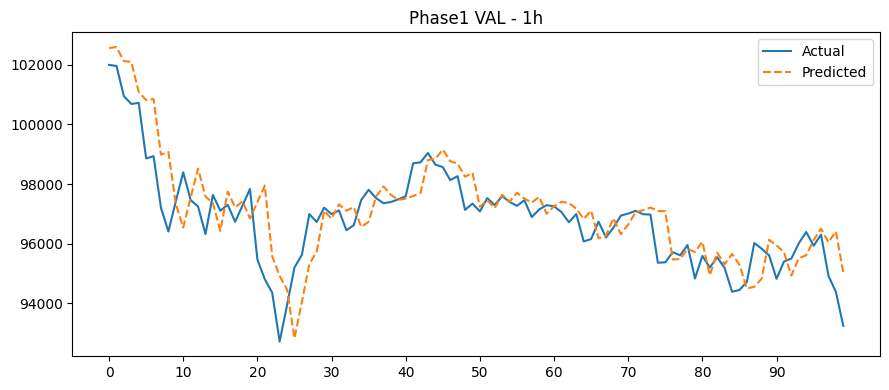

Phase1 VAL 2h: RMSE=1255.07, MAPE=0.98%


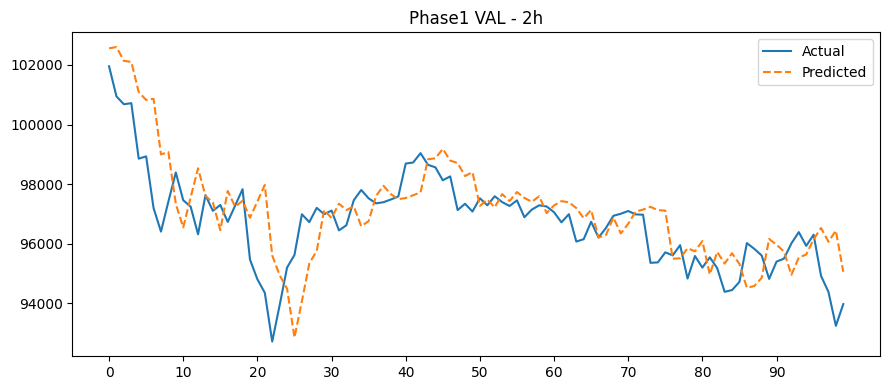

Phase1 VAL 3h: RMSE=1425.78, MAPE=1.09%


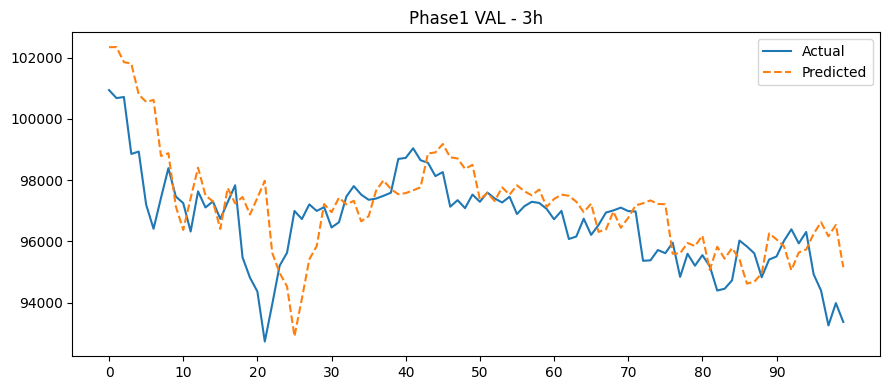

Phase1 VAL 6h: RMSE=1775.21, MAPE=1.40%


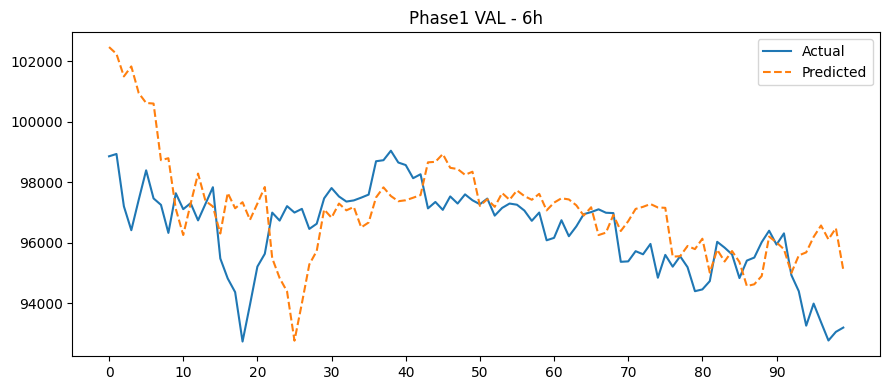

Phase1 VAL 12h: RMSE=1817.72, MAPE=1.43%


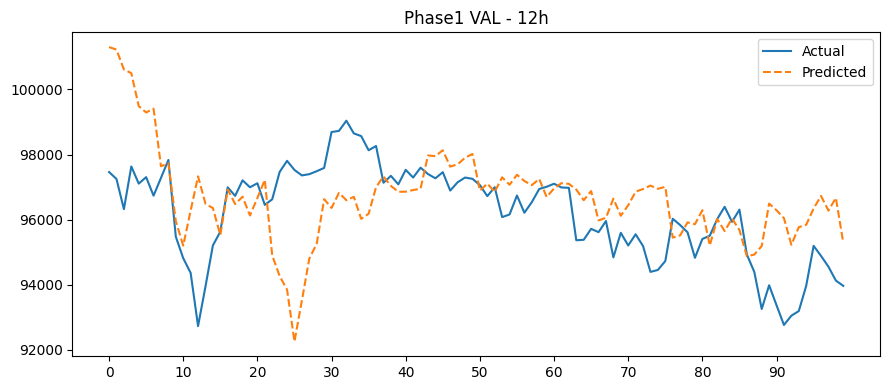

Phase1 VAL 1d: RMSE=2149.11, MAPE=1.77%


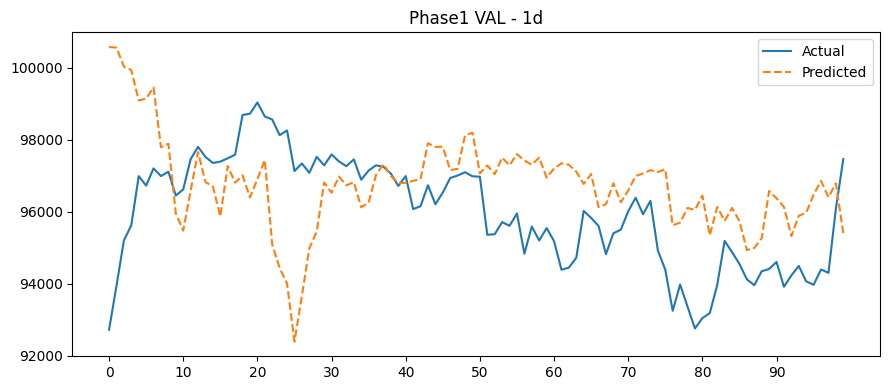

Phase1 VAL 3d: RMSE=1694.02, MAPE=1.44%


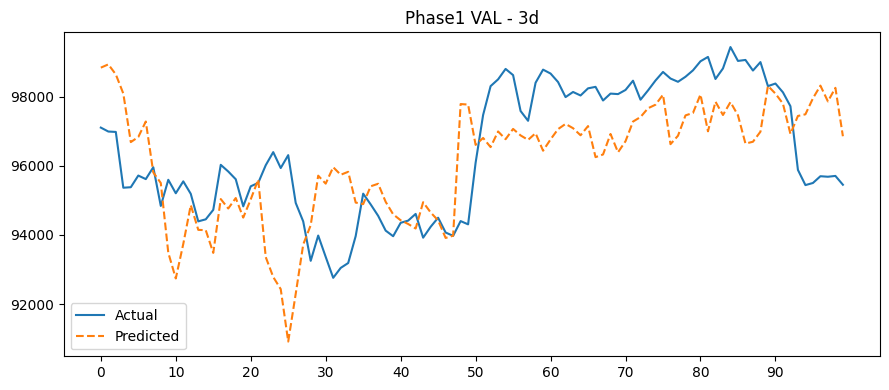

Phase1 VAL 7d: RMSE=4078.42, MAPE=3.53%


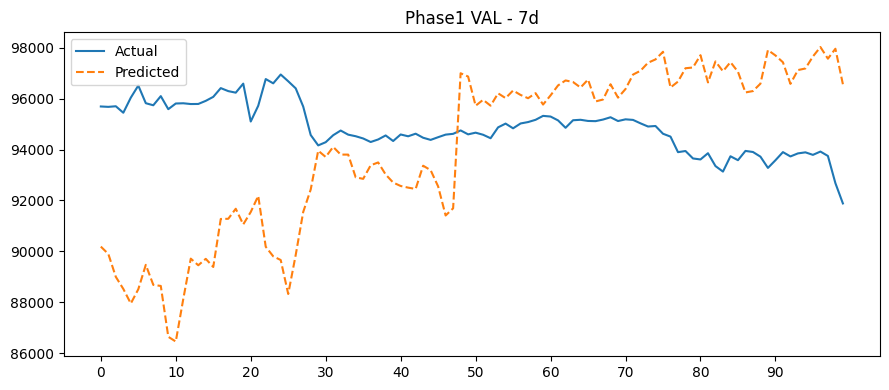

Phase1 VAL 15d: RMSE=3878.97, MAPE=3.56%


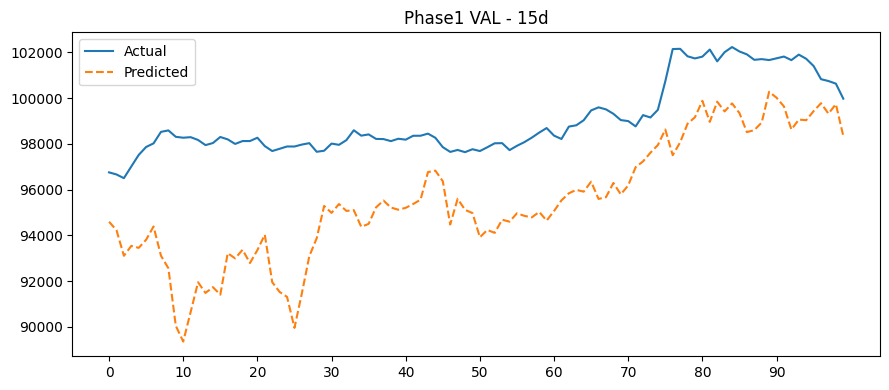

Phase1 VAL 30d: RMSE=10516.15, MAPE=7.60%


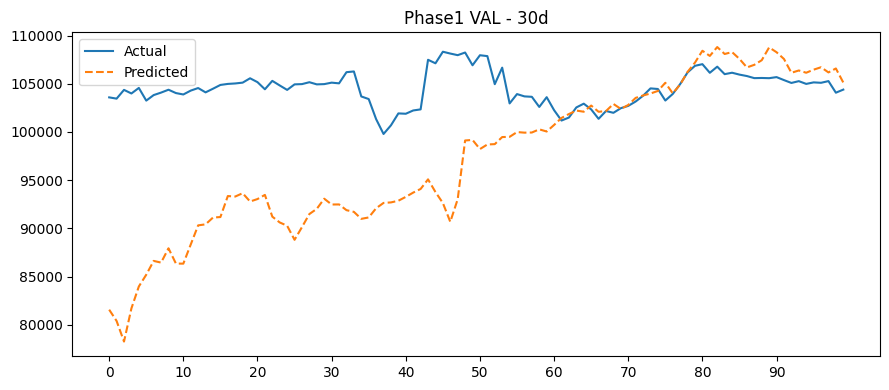


=== PHASE 2: TRAIN+VAL→TEST ===
--- Phase2 TEST LP first 100: [81395.54 81115.78 81503.31 81603.08 82226.98 81888.77 81948.16 82141.96
 82038.09 82170.85 82593.44 82776.5  83042.22 83253.15 83420.87 83602.16
 83524.8  84724.58 84787.37 84365.18 84570.54 84554.   84127.2  84205.79
 84438.06 83983.2  84297.14 84353.85 84557.95 84491.99 84456.57 84266.26
 84183.28 83827.31 83891.36 83966.95 83912.19 84103.74 84136.53 84460.
 84131.75 84346.02 84362.91 84422.25 84223.29 84299.98 84389.31 84388.73
 84382.65 84338.44 84253.52 83869.31 83966.05 84332.34 84408.97 84395.31
 84228.   84273.96 84268.36 83897.02 83666.98 82410.02 82755.89 82596.1
 83373.16 83320.83 83634.53 83913.22 83701.75 83098.47 83216.98 82766.52
 82093.71 82574.53 83054.91 83233.8  83212.51 83675.65 83615.53 83120.
 83220.91 83567.87 83547.17 83664.31 83344.34 83514.73 83052.   83023.38
 82913.03 83531.06 83448.86 84197.46 84496.58 84482.55 83954.36 84077.8
 84061.19 84010.03 83790.24 83161.97]
--- Phase2 TEST TRUE_1h first

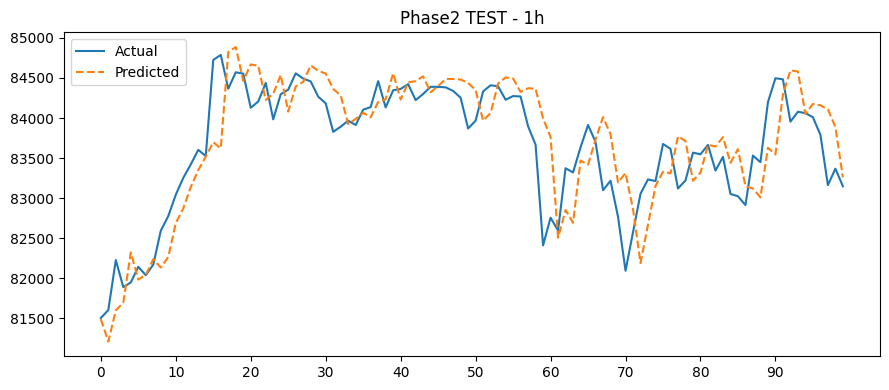

Phase2 TEST 2h: RMSE=576.03, MAPE=0.54%


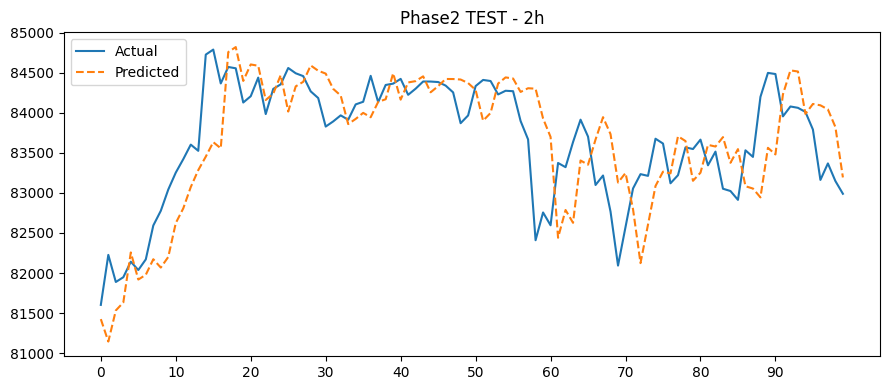

Phase2 TEST 3h: RMSE=672.47, MAPE=0.62%


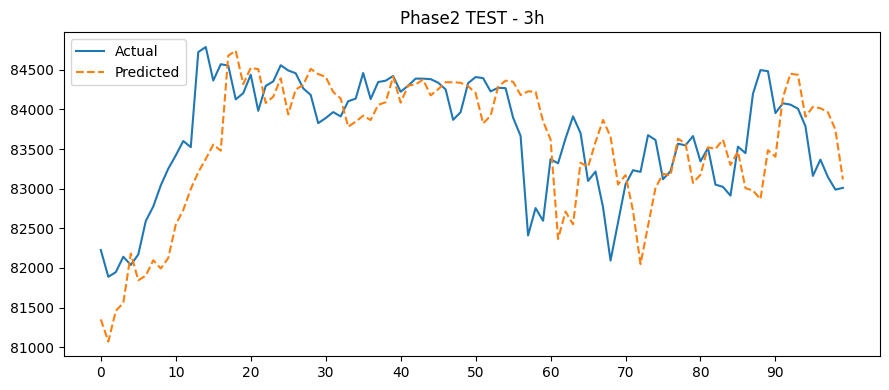

Phase2 TEST 6h: RMSE=830.57, MAPE=0.78%


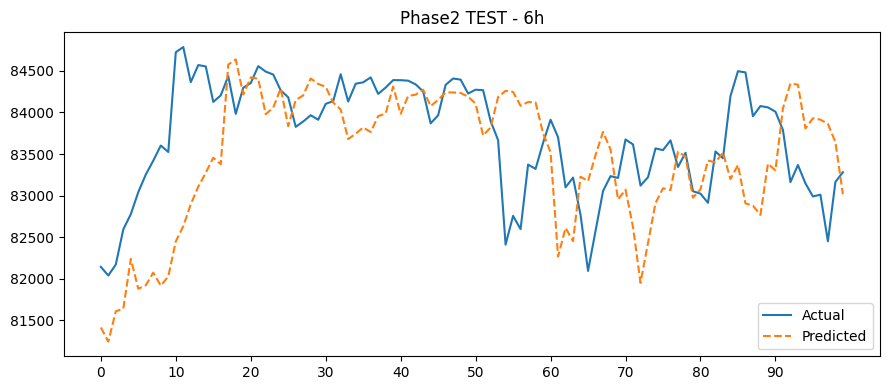

Phase2 TEST 12h: RMSE=1083.79, MAPE=0.98%


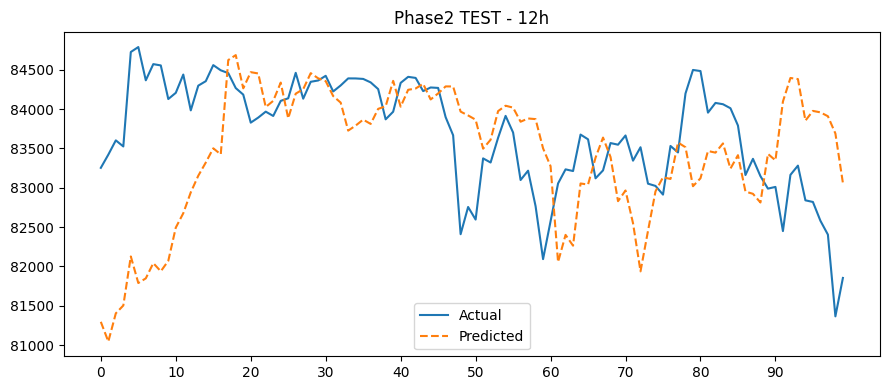

Phase2 TEST 1d: RMSE=1231.27, MAPE=1.18%


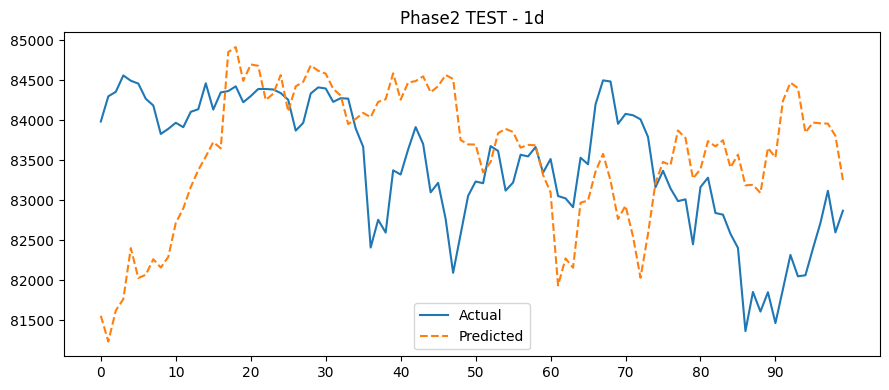

Phase2 TEST 3d: RMSE=2306.61, MAPE=2.27%


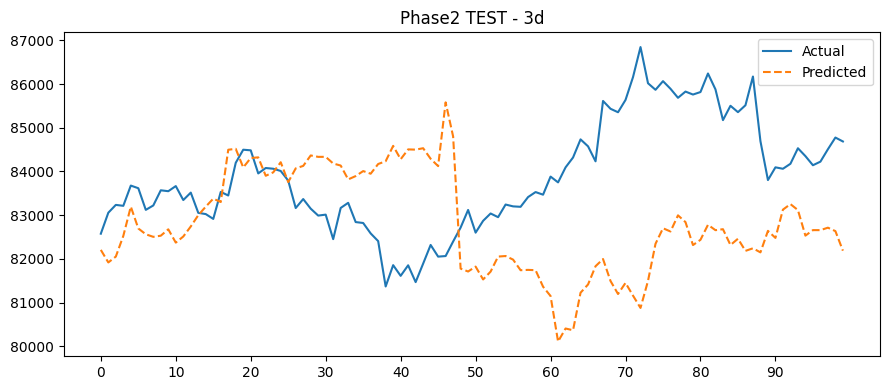

Phase2 TEST 7d: RMSE=3163.08, MAPE=3.02%


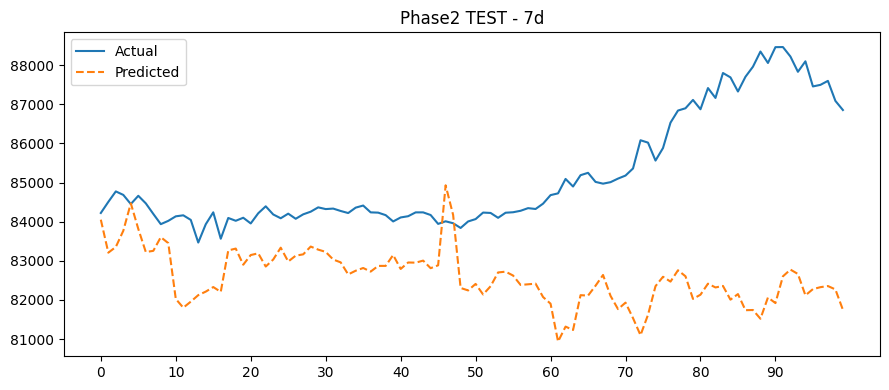

Phase2 TEST 15d: RMSE=1431.33, MAPE=1.37%


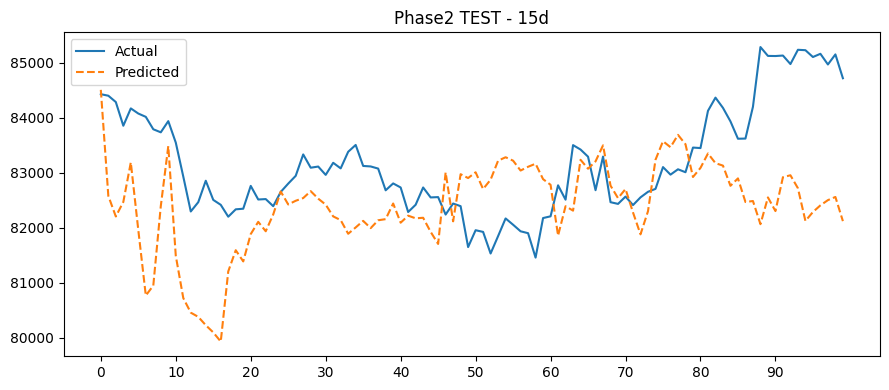

Phase2 TEST 30d: RMSE=5100.03, MAPE=4.96%


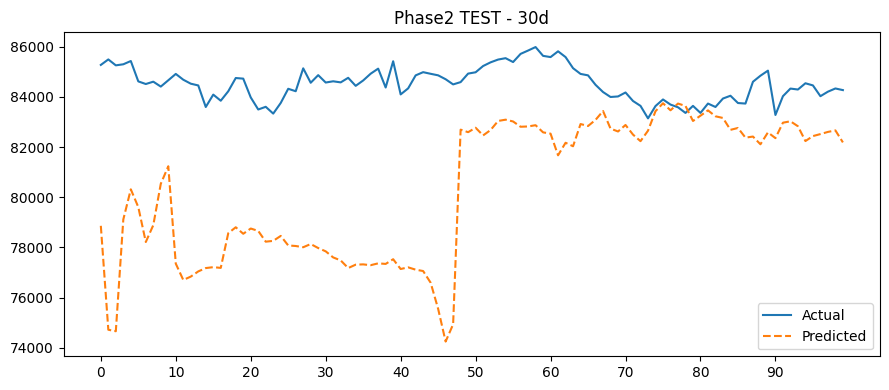

In [11]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import torch, torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# Paths & params
TRAIN_CSV    = '/kaggle/input/data-btc/fix3/fix2/train.csv'
VAL_CSV      = '/kaggle/input/data-btc/fix3/fix2/val.csv'
TEST_CSV     = '/kaggle/input/data-btc/fix3/fix2/test.csv'
WINDOW_SIZE  = 48
BATCH_SIZE   = 64
TUNE_EPOCHS  = 5
FINAL_EPOCHS = 5
LR           = 1e-3
PATIENCE     = 3
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED         = 42

torch.manual_seed(SEED)
np.random.seed(SEED)

# 1) Load raw
df_tr_raw = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va_raw = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])
df_te_raw = pd.read_csv(TEST_CSV,  parse_dates=['timestamp'])

# 2) Horizons & features
HORIZONS = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABELS   = [f'label_{h}' for h in HORIZONS]
FEATS    = [c for c in df_tr_raw.columns if c not in LABELS+['timestamp','close_time']]

# 3) Scale train & val
scaler_X = MinMaxScaler().fit(df_tr_raw[FEATS])
scaler_y = MinMaxScaler().fit(df_tr_raw[LABELS])

df_tr = df_tr_raw.copy()
df_va = df_va_raw.copy()
df_tr[FEATS]  = scaler_X.transform(df_tr[FEATS])
df_va[FEATS]  = scaler_X.transform(df_va[FEATS])
df_tr[LABELS] = scaler_y.transform(df_tr[LABELS])
df_va[LABELS] = scaler_y.transform(df_va[LABELS])

# 4) Sequence builder
def make_sequences(df_scaled, raw_close, raw_label, window):
    X, Y, LP, Y_true = [], [], [], []
    arr_f = df_scaled[FEATS].values
    N     = len(df_scaled)
    for i in range(N - window):
        seq        = arr_f[i:i+window]
        last_price = raw_close[i+window-1]
        future     = raw_label[i+window]
        delta      = (future - last_price) / (last_price + 1e-8)
        X.append(seq); Y.append(delta)
        LP.append(last_price); Y_true.append(future)
    if not X:
        return None,None,None,None
    return np.stack(X), np.stack(Y), np.array(LP), np.stack(Y_true)

# 5) Build train+val sequences
raw_close_tv = pd.concat([df_tr_raw, df_va_raw], ignore_index=True)['close'].values
raw_label_tv = pd.concat([df_tr_raw[LABELS], df_va_raw[LABELS]], ignore_index=True).values
df_tv_scaled = pd.concat([df_tr, df_va], ignore_index=True)

X_all, Y_all, LP_all, TRUE_all = make_sequences(
    df_tv_scaled, raw_close_tv, raw_label_tv, WINDOW_SIZE
)
n_tr_seq = len(df_tr_raw) - WINDOW_SIZE
X_tr, Y_tr       = X_all[:n_tr_seq], Y_all[:n_tr_seq]
LP_tr, TRUE_tr   = LP_all[:n_tr_seq], TRUE_all[:n_tr_seq]
X_va, Y_va       = X_all[n_tr_seq:], Y_all[n_tr_seq:]
LP_va, TRUE_va   = LP_all[n_tr_seq:], TRUE_all[n_tr_seq:]

# 6) Build TEST sequences (prepend last WINDOW_SIZE of val)
raw_close_te = np.concatenate([df_va_raw['close'].values[-WINDOW_SIZE:], df_te_raw['close'].values])
raw_label_te = np.concatenate([df_va_raw[LABELS].values[-WINDOW_SIZE:], df_te_raw[LABELS].values])

df_va_scaled        = df_va.copy(); df_va_scaled[FEATS] = scaler_X.transform(df_va[FEATS])
df_te_scaled        = df_te_raw.copy(); df_te_scaled[FEATS] = scaler_X.transform(df_te_raw[FEATS])
df_comb_scaled      = pd.concat([df_va_scaled.iloc[-WINDOW_SIZE:], df_te_scaled[FEATS]], ignore_index=True)

X_te, Y_te, LP_te, TRUE_te = make_sequences(df_comb_scaled, raw_close_te, raw_label_te, WINDOW_SIZE)

# 7) DataLoaders
train_ds = TensorDataset(torch.FloatTensor(X_tr), torch.FloatTensor(Y_tr))
val_ds   = TensorDataset(torch.FloatTensor(X_va), torch.FloatTensor(Y_va))
test_ds  = None if X_te is None else TensorDataset(torch.FloatTensor(X_te), torch.FloatTensor(Y_te))

train_ld = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_ld   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False)
test_ld  = None if test_ds is None else DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False)

# 8) Model
class MultiHorizonModel(nn.Module):
    def __init__(self,n_feat,n_hor,d_emb=8):
        super().__init__()
        self.conv = nn.Conv1d(n_feat,64,kernel_size=3,padding=2,dilation=2)
        self.lstm = nn.LSTM(64,128,batch_first=True,bidirectional=True)
        self.norm = nn.LayerNorm(256)
        self.attn = nn.MultiheadAttention(256,num_heads=4,batch_first=True)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.h_emb= nn.Embedding(n_hor,d_emb)
        self.heads= nn.ModuleList([
            nn.Sequential(nn.Linear(256+d_emb,64), nn.ReLU(),
                          nn.Dropout(0.2), nn.Linear(64,1))
            for _ in range(n_hor)
        ])
    def forward(self,x):
        b=x.size(0)
        x=x.permute(0,2,1)
        x=self.conv(x)
        x=x.permute(0,2,1)
        x,_=self.lstm(x)
        x=self.norm(x)
        att,_=self.attn(x,x,x)
        x=self.norm(x+att)
        x=x.permute(0,2,1)
        feat=self.pool(x).squeeze(-1)
        outs=[]
        for i,head in enumerate(self.heads):
            emb=self.h_emb(torch.full((b,),i,dtype=torch.long,device=feat.device))
            outs.append(head(torch.cat([feat,emb],1)))
        return torch.cat(outs,1)

# 9) Eval helper
def eval_phase(model, LP, TRUE, desc, first_n=100):
    n_pts = min(first_n, LP.shape[0])
    print(f"--- {desc} LP first {n_pts}:", LP[:n_pts])
    for hi,h in enumerate(HORIZONS):
        print(f"--- {desc} TRUE_{h} first {n_pts}:", TRUE[:n_pts,hi])
    model.eval()
    preds=[]
    with torch.no_grad():
        for i in range(n_pts):
            xb=torch.FloatTensor(X_te[i:i+1]).to(DEVICE)
            out=model(xb).cpu().numpy()[0]
            preds.append(out)
    preds=np.stack(preds)  # shape [n_pts,n_hor]
    price_pred=np.zeros_like(preds)
    for i in range(n_pts):
        price_pred[i]=LP[i]*(1+preds[i])
    price_true=TRUE[:n_pts]
    for hi,h in enumerate(HORIZONS):
        rmse=mean_squared_error(price_true[:,hi], price_pred[:,hi], squared=False)
        mape=mean_absolute_percentage_error(price_true[:,hi], price_pred[:,hi])*100
        print(f"{desc} {h}: RMSE={rmse:.2f}, MAPE={mape:.2f}%")
        plt.figure(figsize=(9,4))
        plt.plot(price_true[:n_pts,hi], label='Actual')
        plt.plot(price_pred[:n_pts,hi],'--',label='Predicted')
        plt.xticks(range(0,n_pts, max(1,n_pts//10)))
        plt.title(f"{desc} - {h}")
        plt.legend(); plt.tight_layout(); plt.show()

# 10) Phase 1: TRAIN→VAL (no tuning)
print("=== PHASE 1: TRAIN→VAL ===")
model = MultiHorizonModel(n_feat=X_tr.shape[2],n_hor=len(HORIZONS)).to(DEVICE)
opt   = torch.optim.Adam(model.parameters(),lr=LR)
crit  = nn.HuberLoss(delta=1.0)
wts   = torch.linspace(1,2,steps=len(HORIZONS)).to(DEVICE)

best_val, cnt = float('inf'), 0
for ep in range(1, TUNE_EPOCHS+1):
    model.train()
    for xb,yb in train_ld:
        xb,yb=xb.to(DEVICE),yb.to(DEVICE)
        loss=(crit(model(xb),yb)*wts).mean()
        opt.zero_grad(); loss.backward(); opt.step()
    # validate
    vloss=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in val_ld:
            xb,yb=xb.to(DEVICE),yb.to(DEVICE)
            vloss.append(((crit(model(xb),yb)*wts).mean().item()))
    mv=np.mean(vloss); print(f"Ep{ep} val_loss={mv:.4f}")
    if mv<best_val:
        best_val,cnt=mv,0
        torch.save(model.state_dict(),'best_tune.pth')
    else:
        cnt+=1
        if cnt>=PATIENCE:
            print("Early stopping"); break

eval_phase(model, LP_va, TRUE_va, desc="Phase1 VAL", first_n=100)

# 11) Phase 2: TRAIN+VAL→TEST (final retrain & eval)
print("\n=== PHASE 2: TRAIN+VAL→TEST ===")
model.load_state_dict(torch.load('best_tune.pth'))
opt=torch.optim.Adam(model.parameters(),lr=LR)
X_comb=np.vstack([X_tr,X_va]); Y_comb=np.vstack([Y_tr,Y_va])
comb_ds=TensorDataset(torch.FloatTensor(X_comb), torch.FloatTensor(Y_comb))
comb_ld=DataLoader(comb_ds,batch_size=BATCH_SIZE,shuffle=True)
for ep in range(1, FINAL_EPOCHS+1):
    model.train()
    for xb,yb in comb_ld:
        xb,yb=xb.to(DEVICE),yb.to(DEVICE)
        loss=(crit(model(xb),yb)*wts).mean()
        opt.zero_grad(); loss.backward(); opt.step()

if test_ld is not None:
    eval_phase(model, LP_te, TRUE_te, desc="Phase2 TEST", first_n=100)
else:
    print("Test split too small, skipping.")


simpan model fix

=== PHASE 1: TRAIN→VAL ===
Ep1 val_loss=0.0021
Ep2 val_loss=0.0018
Ep3 val_loss=0.0020
Ep4 val_loss=0.0025
Ep5 val_loss=0.0033
Early stopping
--- Phase1 VAL LP first 100: [102409.34 102449.99 101988.   101952.44 100942.41 100679.86 100716.3
  98855.86  98932.73  97199.72  96409.54  97417.66  98391.21  97461.86
  97248.22  96319.99  97632.59  97106.02  97304.07  96734.32  97281.37
  97832.53  95473.74  94811.85  94359.53  92723.98  93941.75  95204.
  95627.99  96991.62  96727.99  97206.59  96993.58  97116.    96451.88
  96623.29  97463.93  97805.44  97525.77  97357.23  97396.    97487.46
  97588.    98691.98  98726.76  99040.    98650.    98565.82  98131.22
  98262.08  97131.99  97344.54  97083.11  97527.97  97292.    97595.28
  97400.01  97269.03  97456.91  96892.    97147.46  97291.99  97253.01
  97060.01  96719.99  96994.37  96076.01  96156.19  96739.99  96210.24
  96534.5   96940.27  97009.03  97101.28  96987.61  96976.    95363.44
  95377.72  95715.09  95612.19  95955.22  94836.55 

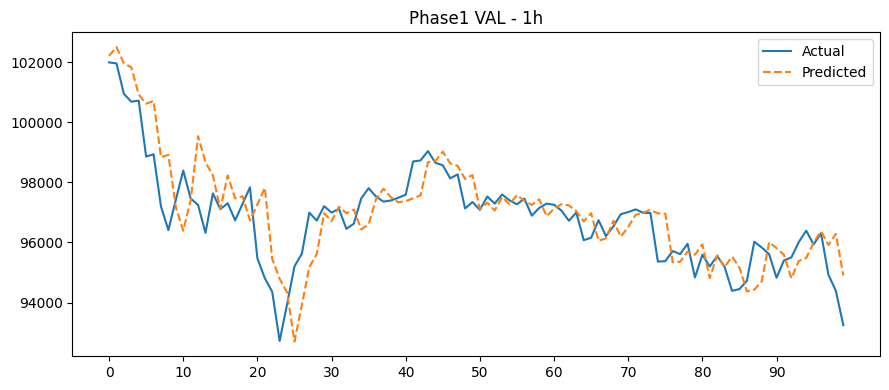

Phase1 VAL 2h: RMSE=1918.73, MAPE=1.36%


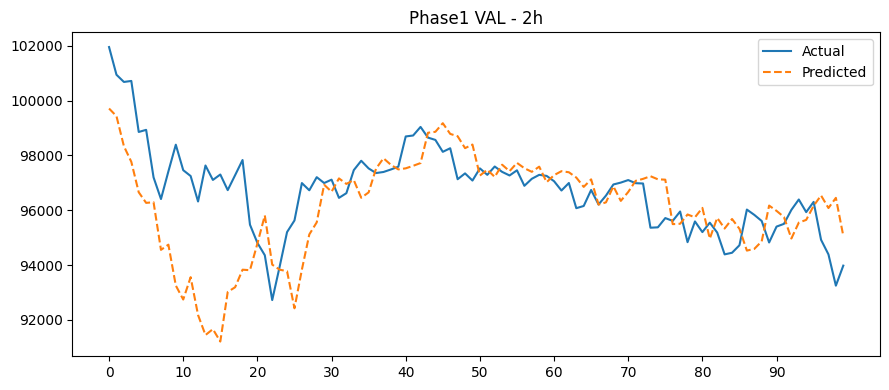

Phase1 VAL 3h: RMSE=1536.70, MAPE=1.18%


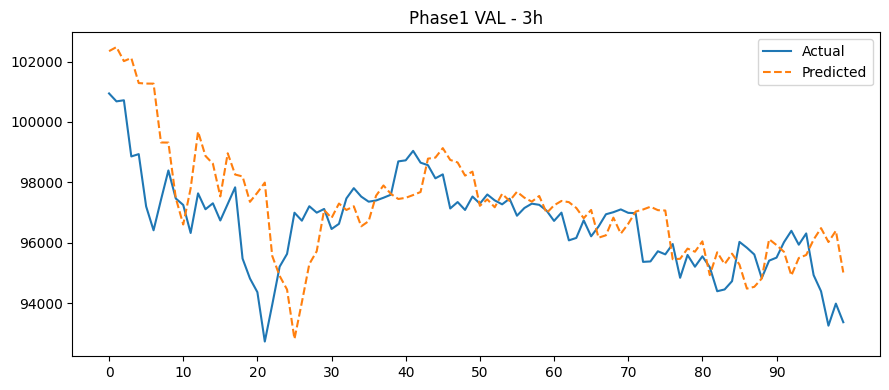

Phase1 VAL 6h: RMSE=1667.81, MAPE=1.33%


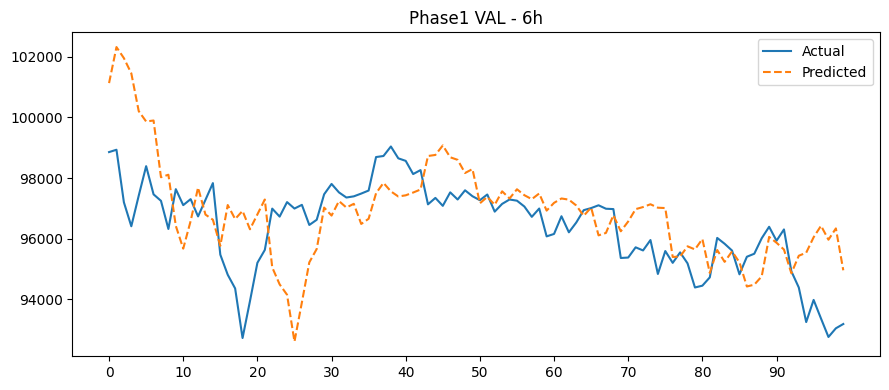

Phase1 VAL 12h: RMSE=3642.58, MAPE=2.52%


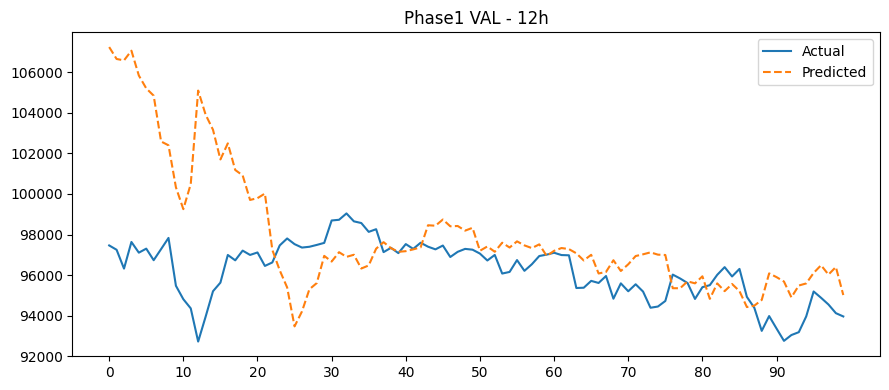

Phase1 VAL 1d: RMSE=2265.37, MAPE=1.97%


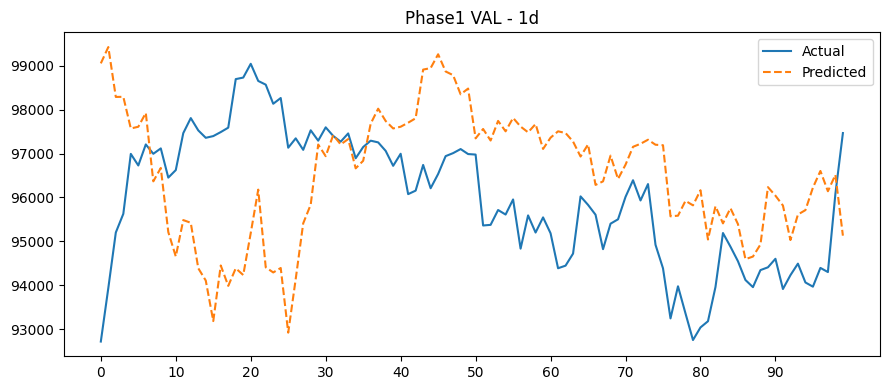

Phase1 VAL 3d: RMSE=3588.33, MAPE=2.97%


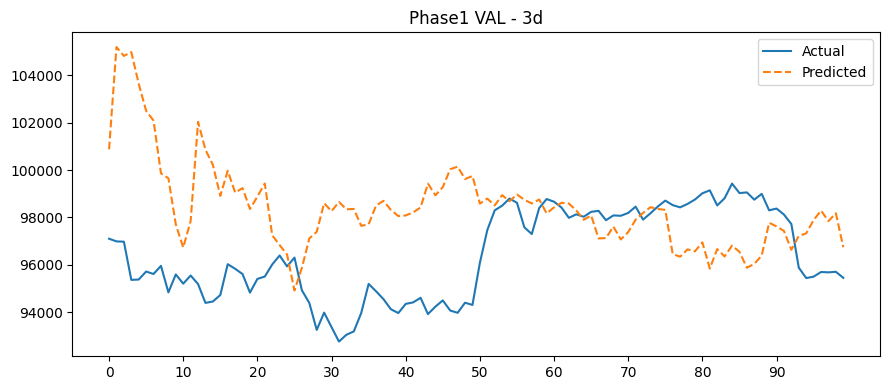

Phase1 VAL 7d: RMSE=2739.43, MAPE=2.45%


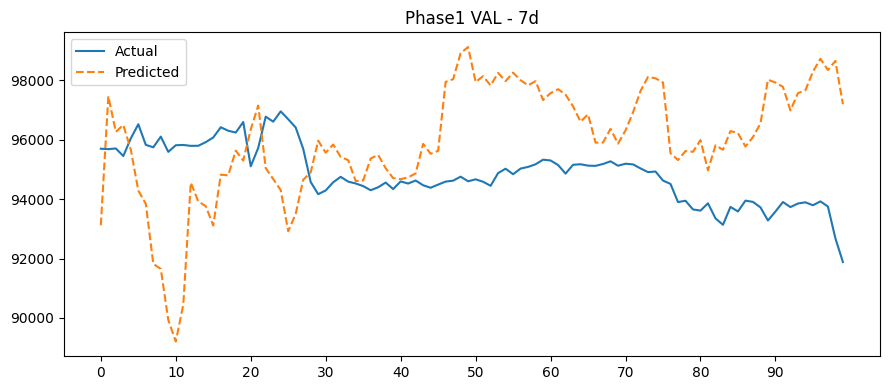

Phase1 VAL 15d: RMSE=2975.46, MAPE=2.22%


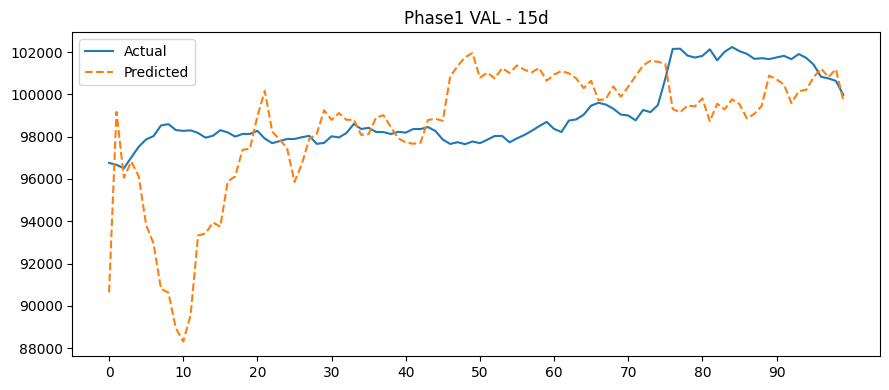

Phase1 VAL 30d: RMSE=9249.02, MAPE=6.35%


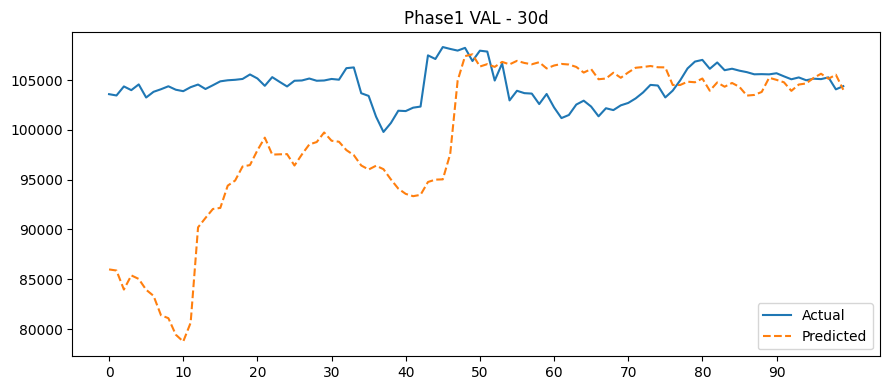


=== PHASE 2: TRAIN+VAL→TEST ===
Saved final LSTM model to /kaggle/working/lstm_final.pth
--- Phase2 TEST LP first 100: [81395.54 81115.78 81503.31 81603.08 82226.98 81888.77 81948.16 82141.96
 82038.09 82170.85 82593.44 82776.5  83042.22 83253.15 83420.87 83602.16
 83524.8  84724.58 84787.37 84365.18 84570.54 84554.   84127.2  84205.79
 84438.06 83983.2  84297.14 84353.85 84557.95 84491.99 84456.57 84266.26
 84183.28 83827.31 83891.36 83966.95 83912.19 84103.74 84136.53 84460.
 84131.75 84346.02 84362.91 84422.25 84223.29 84299.98 84389.31 84388.73
 84382.65 84338.44 84253.52 83869.31 83966.05 84332.34 84408.97 84395.31
 84228.   84273.96 84268.36 83897.02 83666.98 82410.02 82755.89 82596.1
 83373.16 83320.83 83634.53 83913.22 83701.75 83098.47 83216.98 82766.52
 82093.71 82574.53 83054.91 83233.8  83212.51 83675.65 83615.53 83120.
 83220.91 83567.87 83547.17 83664.31 83344.34 83514.73 83052.   83023.38
 82913.03 83531.06 83448.86 84197.46 84496.58 84482.55 83954.36 84077.8
 84061.19 

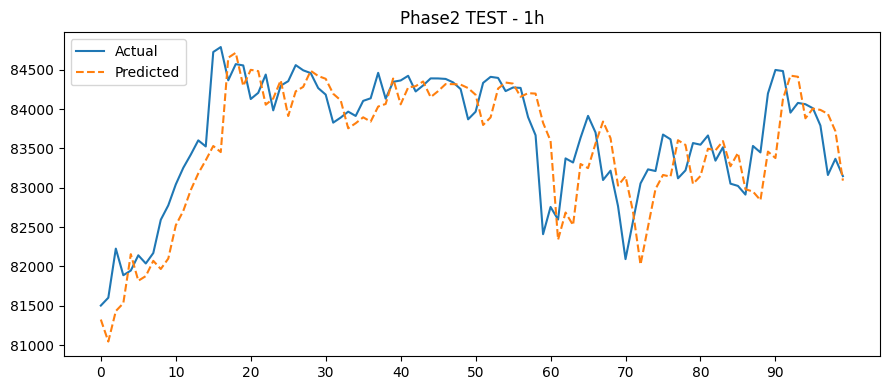

Phase2 TEST 2h: RMSE=587.71, MAPE=0.55%


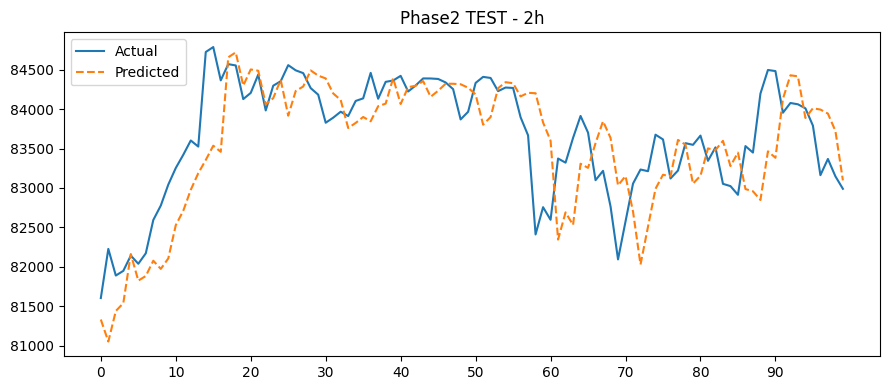

Phase2 TEST 3h: RMSE=668.36, MAPE=0.61%


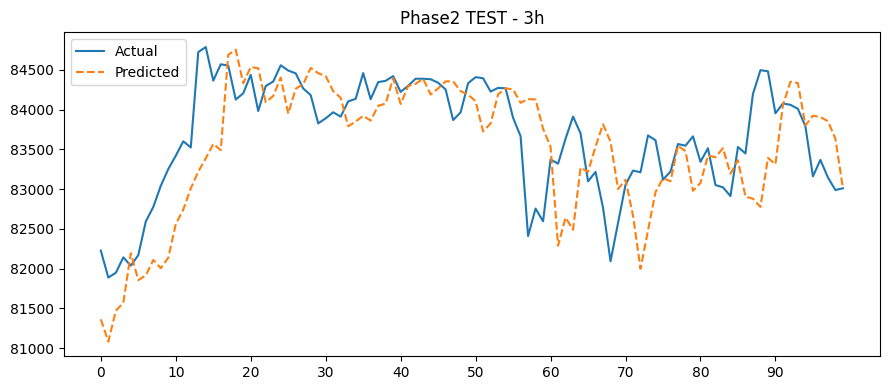

Phase2 TEST 6h: RMSE=803.07, MAPE=0.77%


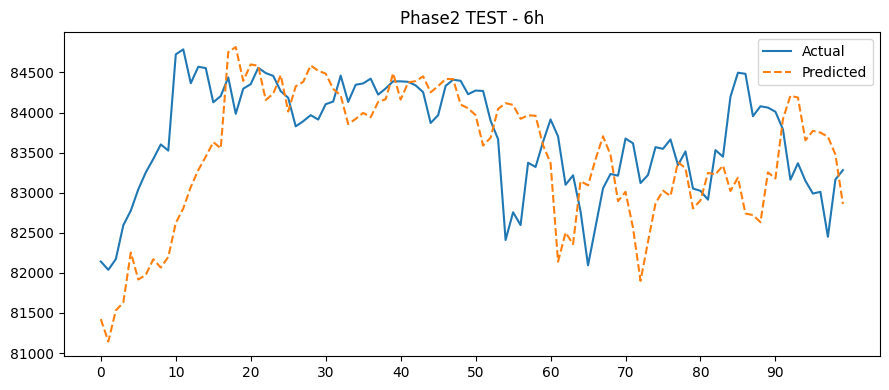

Phase2 TEST 12h: RMSE=1044.30, MAPE=0.95%


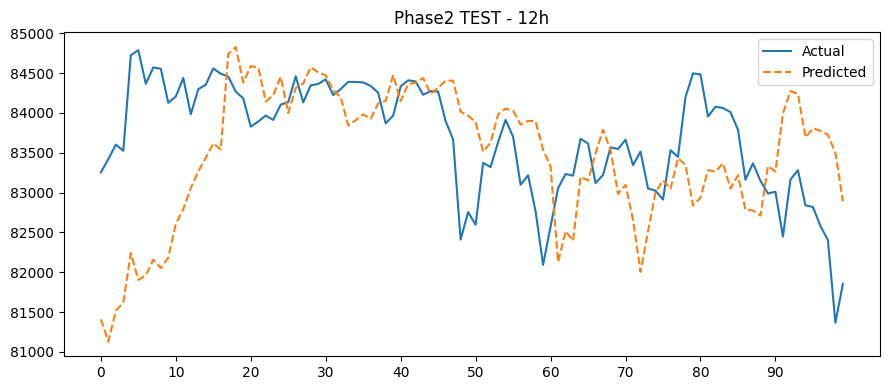

Phase2 TEST 1d: RMSE=1135.18, MAPE=1.08%


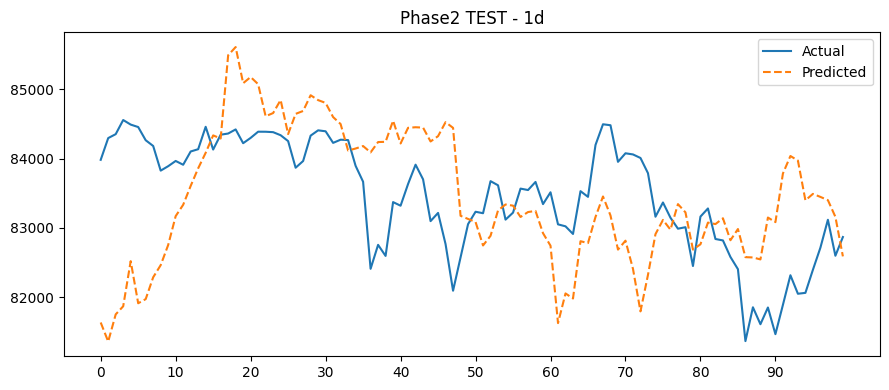

Phase2 TEST 3d: RMSE=3108.57, MAPE=3.39%


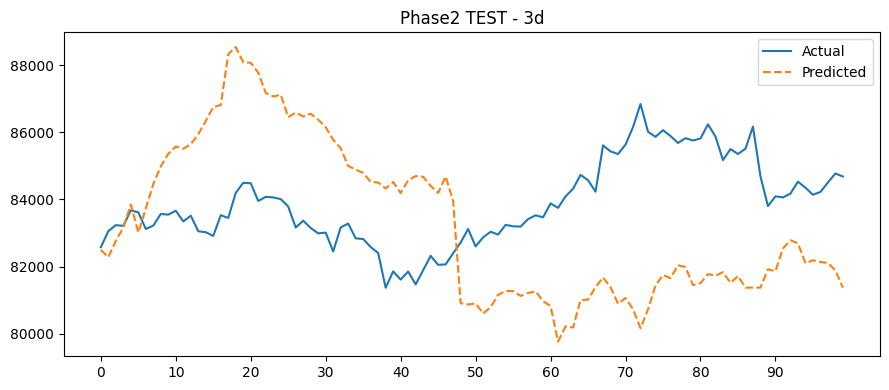

Phase2 TEST 7d: RMSE=3157.40, MAPE=3.32%


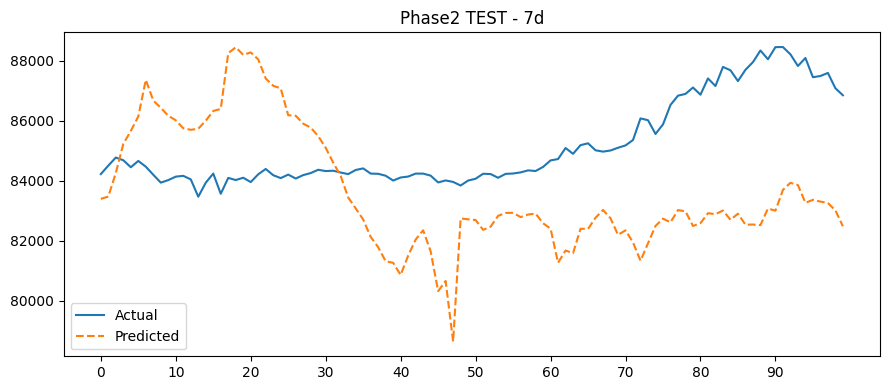

Phase2 TEST 15d: RMSE=2658.26, MAPE=2.76%


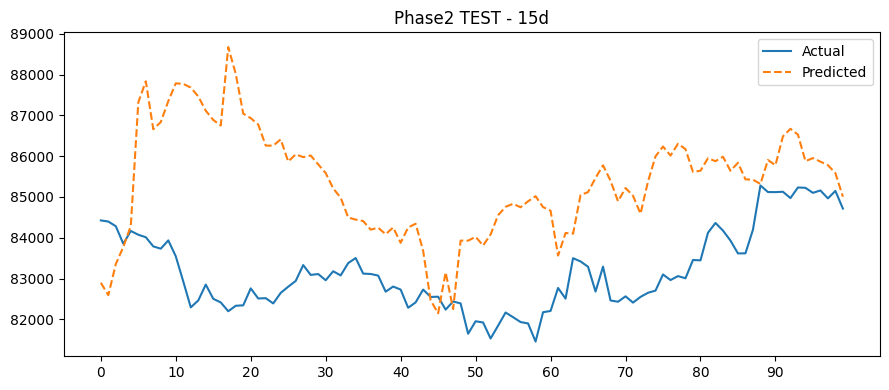

Phase2 TEST 30d: RMSE=4712.96, MAPE=5.10%


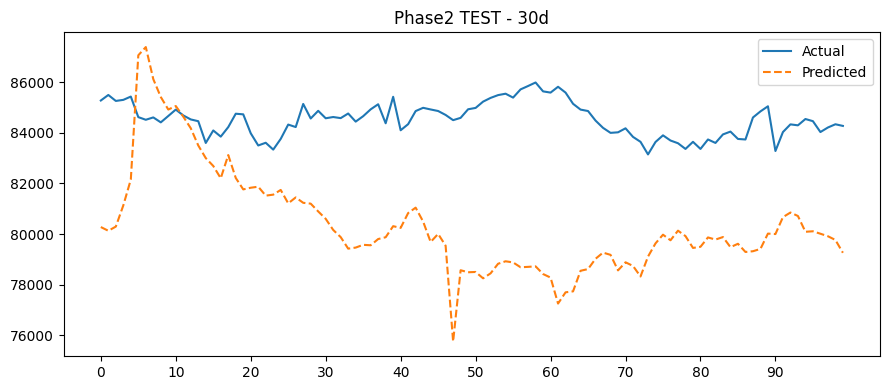

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import torch, torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import os

# Paths & params
TRAIN_CSV    = '/kaggle/input/data-btc/fix3/fix2/train.csv'
VAL_CSV      = '/kaggle/input/data-btc/fix3/fix2/val.csv'
TEST_CSV     = '/kaggle/input/data-btc/fix3/fix2/test.csv'
WINDOW_SIZE  = 48
BATCH_SIZE   = 64
TUNE_EPOCHS  = 10
FINAL_EPOCHS = 10
LR           = 1e-3
PATIENCE     = 3
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED         = 42

torch.manual_seed(SEED)
np.random.seed(SEED)

# 1) Load raw
df_tr_raw = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va_raw = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])
df_te_raw = pd.read_csv(TEST_CSV,  parse_dates=['timestamp'])

# 2) Horizons & features
HORIZONS = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABELS   = [f'label_{h}' for h in HORIZONS]
FEATS    = [c for c in df_tr_raw.columns if c not in LABELS+['timestamp','close_time']]

# 3) Scale train & val
scaler_X = MinMaxScaler().fit(df_tr_raw[FEATS])
scaler_y = MinMaxScaler().fit(df_tr_raw[LABELS])

df_tr = df_tr_raw.copy()
df_va = df_va_raw.copy()
df_tr[FEATS]  = scaler_X.transform(df_tr[FEATS])
df_va[FEATS]  = scaler_X.transform(df_va[FEATS])
df_tr[LABELS] = scaler_y.transform(df_tr[LABELS])
df_va[LABELS] = scaler_y.transform(df_va[LABELS])

# 4) Sequence builder
def make_sequences(df_scaled, raw_close, raw_label, window):
    X, Y, LP, Y_true = [], [], [], []
    arr_f = df_scaled[FEATS].values
    N     = len(df_scaled)
    for i in range(N - window):
        seq        = arr_f[i:i+window]
        last_price = raw_close[i+window-1]
        future     = raw_label[i+window]
        delta      = (future - last_price) / (last_price + 1e-8)
        X.append(seq); Y.append(delta)
        LP.append(last_price); Y_true.append(future)
    if not X:
        return None,None,None,None
    return np.stack(X), np.stack(Y), np.array(LP), np.stack(Y_true)

# 5) Build train+val sequences
raw_close_tv = pd.concat([df_tr_raw, df_va_raw], ignore_index=True)['close'].values
raw_label_tv = pd.concat([df_tr_raw[LABELS], df_va_raw[LABELS]], ignore_index=True).values
df_tv_scaled = pd.concat([df_tr, df_va], ignore_index=True)

X_all, Y_all, LP_all, TRUE_all = make_sequences(
    df_tv_scaled, raw_close_tv, raw_label_tv, WINDOW_SIZE
)
n_tr_seq = len(df_tr_raw) - WINDOW_SIZE
X_tr, Y_tr       = X_all[:n_tr_seq], Y_all[:n_tr_seq]
LP_tr, TRUE_tr   = LP_all[:n_tr_seq], TRUE_all[:n_tr_seq]
X_va, Y_va       = X_all[n_tr_seq:], Y_all[n_tr_seq:]
LP_va, TRUE_va   = LP_all[n_tr_seq:], TRUE_all[n_tr_seq:]

# 6) Build TEST sequences (prepend last WINDOW_SIZE of val)
raw_close_te = np.concatenate([df_va_raw['close'].values[-WINDOW_SIZE:], df_te_raw['close'].values])
raw_label_te = np.concatenate([df_va_raw[LABELS].values[-WINDOW_SIZE:], df_te_raw[LABELS].values])

df_va_scaled        = df_va.copy();   df_va_scaled[FEATS] = scaler_X.transform(df_va[FEATS])
df_te_scaled        = df_te_raw.copy(); df_te_scaled[FEATS] = scaler_X.transform(df_te_raw[FEATS])
df_comb_scaled      = pd.concat([df_va_scaled.iloc[-WINDOW_SIZE:], df_te_scaled[FEATS]], ignore_index=True)

X_te, Y_te, LP_te, TRUE_te = make_sequences(df_comb_scaled, raw_close_te, raw_label_te, WINDOW_SIZE)

# 7) DataLoaders
train_ld = DataLoader(TensorDataset(torch.FloatTensor(X_tr), torch.FloatTensor(Y_tr)),
                      batch_size=BATCH_SIZE, shuffle=True)
val_ld   = DataLoader(TensorDataset(torch.FloatTensor(X_va), torch.FloatTensor(Y_va)),
                      batch_size=BATCH_SIZE, shuffle=False)
test_ld  = None if X_te is None else DataLoader(TensorDataset(torch.FloatTensor(X_te), torch.FloatTensor(Y_te)),
                                                batch_size=BATCH_SIZE, shuffle=False)

# 8) Model
class MultiHorizonModel(nn.Module):
    def __init__(self, n_feat, n_hor, d_emb=8):
        super().__init__()
        self.conv = nn.Conv1d(n_feat,64,3,padding=2,dilation=2)
        self.lstm = nn.LSTM(64,128,batch_first=True,bidirectional=True)
        self.norm = nn.LayerNorm(256)
        self.attn = nn.MultiheadAttention(256, num_heads=4, batch_first=True)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.h_emb= nn.Embedding(n_hor, d_emb)
        self.heads= nn.ModuleList([
            nn.Sequential(nn.Linear(256+d_emb,64), nn.ReLU(),
                          nn.Dropout(0.2), nn.Linear(64,1))
            for _ in range(n_hor)
        ])
    def forward(self, x):
        b = x.size(0)
        x = x.permute(0,2,1)
        x = self.conv(x)
        x = x.permute(0,2,1)
        x,_ = self.lstm(x)
        x = self.norm(x)
        att,_ = self.attn(x,x,x)
        x = self.norm(x+att)
        x = x.permute(0,2,1)
        feat = self.pool(x).squeeze(-1)
        outs = []
        for i, head in enumerate(self.heads):
            emb = self.h_emb(torch.full((b,), i, dtype=torch.long, device=feat.device))
            outs.append(head(torch.cat([feat, emb],1)))
        return torch.cat(outs,1)

# 9) Eval helper
def eval_phase(model, LP, TRUE, desc, first_n=100):
    n_pts = min(first_n, LP.shape[0])
    print(f"--- {desc} LP first {n_pts}: {LP[:n_pts]}")
    for hi,h in enumerate(HORIZONS):
        print(f"--- {desc} TRUE_{h} first {n_pts}: {TRUE[:n_pts,hi]}")
    model.eval()
    preds = []
    with torch.no_grad():
        for i in range(n_pts):
            xb = torch.FloatTensor(X_te[i:i+1]).to(DEVICE)
            out= model(xb).cpu().numpy()[0]
            preds.append(out)
    preds = np.stack(preds)
    price_pred = np.zeros_like(preds)
    for i in range(n_pts):
        price_pred[i] = LP[i] * (1 + preds[i])
    price_true = TRUE[:n_pts]
    for hi,h in enumerate(HORIZONS):
        rmse = mean_squared_error(price_true[:,hi], price_pred[:,hi], squared=False)
        mape = mean_absolute_percentage_error(price_true[:,hi], price_pred[:,hi])*100
        print(f"{desc} {h}: RMSE={rmse:.2f}, MAPE={mape:.2f}%")
        plt.figure(figsize=(9,4))
        plt.plot(price_true[:,hi], label='Actual')
        plt.plot(price_pred[:,hi],'--', label='Predicted')
        plt.xticks(range(0, n_pts, max(1, n_pts//10)))
        plt.title(f"{desc} - {h}")
        plt.legend(); plt.tight_layout(); plt.show()

# 10) Phase 1: TRAIN→VAL (no tuning)
print("=== PHASE 1: TRAIN→VAL ===")
model = MultiHorizonModel(n_feat=X_tr.shape[2], n_hor=len(HORIZONS)).to(DEVICE)
opt   = torch.optim.Adam(model.parameters(), lr=LR)
crit  = nn.HuberLoss(delta=1.0)
weights = torch.linspace(1,2,steps=len(HORIZONS)).to(DEVICE)

best_val, cnt = float('inf'), 0
for ep in range(1, TUNE_EPOCHS+1):
    model.train()
    for xb,yb in train_ld:
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        loss  = (crit(model(xb), yb)*weights).mean()
        opt.zero_grad(); loss.backward(); opt.step()
    # validate
    val_losses = []
    model.eval()
    with torch.no_grad():
        for xb,yb in val_ld:
            xb,yb = xb.to(DEVICE), yb.to(DEVICE)
            val_losses.append(((crit(model(xb), yb)*weights).mean().item()))
    mv = np.mean(val_losses)
    print(f"Ep{ep} val_loss={mv:.4f}")
    if mv < best_val:
        best_val, cnt = mv, 0
        torch.save(model.state_dict(), 'best_tune.pth')
    else:
        cnt += 1
        if cnt >= PATIENCE:
            print("Early stopping"); break

eval_phase(model, LP_va, TRUE_va, desc="Phase1 VAL", first_n=100)

# 11) Phase 2: TRAIN+VAL→TEST (final retrain, save & eval)
print("\n=== PHASE 2: TRAIN+VAL→TEST ===")
model.load_state_dict(torch.load('best_tune.pth'))
opt = torch.optim.Adam(model.parameters(), lr=LR)
X_comb = np.vstack([X_tr, X_va])
Y_comb = np.vstack([Y_tr, Y_va])
comb_ds = TensorDataset(torch.FloatTensor(X_comb), torch.FloatTensor(Y_comb))
comb_ld = DataLoader(comb_ds, batch_size=BATCH_SIZE, shuffle=True)

for ep in range(1, FINAL_EPOCHS+1):
    model.train()
    for xb,yb in comb_ld:
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        loss  = (crit(model(xb), yb)*weights).mean()
        opt.zero_grad(); loss.backward(); opt.step()

# save final model once
save_path = '/kaggle/working/lstm_final.pth'
torch.save(model.state_dict(), save_path)
print(f"Saved final LSTM model to {save_path}")

# evaluate
if test_ld is not None:
    eval_phase(model, LP_te, TRUE_te, desc="Phase2 TEST", first_n=100)
else:
    print("Test split too small, skipping.")


=== PHASE 1: TRAIN→VAL ===
Ep1 val_loss=0.0015
Ep2 val_loss=0.0015
Ep3 val_loss=0.0016
Ep4 val_loss=0.0025
Ep5 val_loss=0.0025
Early stopping
--- Phase1 VAL LP first 100: [102409.34 102449.99 101988.   101952.44 100942.41 100679.86 100716.3
  98855.86  98932.73  97199.72  96409.54  97417.66  98391.21  97461.86
  97248.22  96319.99  97632.59  97106.02  97304.07  96734.32  97281.37
  97832.53  95473.74  94811.85  94359.53  92723.98  93941.75  95204.
  95627.99  96991.62  96727.99  97206.59  96993.58  97116.    96451.88
  96623.29  97463.93  97805.44  97525.77  97357.23  97396.    97487.46
  97588.    98691.98  98726.76  99040.    98650.    98565.82  98131.22
  98262.08  97131.99  97344.54  97083.11  97527.97  97292.    97595.28
  97400.01  97269.03  97456.91  96892.    97147.46  97291.99  97253.01
  97060.01  96719.99  96994.37  96076.01  96156.19  96739.99  96210.24
  96534.5   96940.27  97009.03  97101.28  96987.61  96976.    95363.44
  95377.72  95715.09  95612.19  95955.22  94836.55 

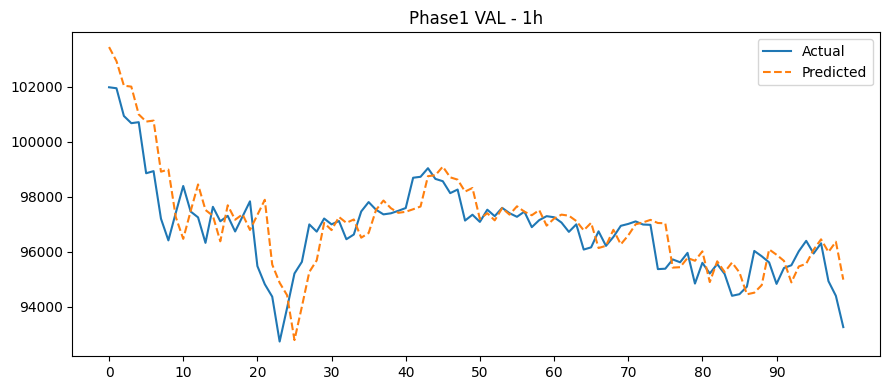

Phase1 VAL 2h: RMSE=1248.16, MAPE=0.98%


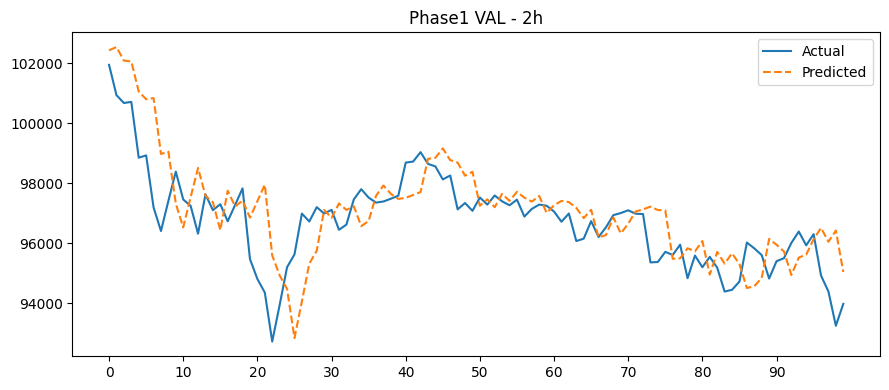

Phase1 VAL 3h: RMSE=1375.27, MAPE=1.04%


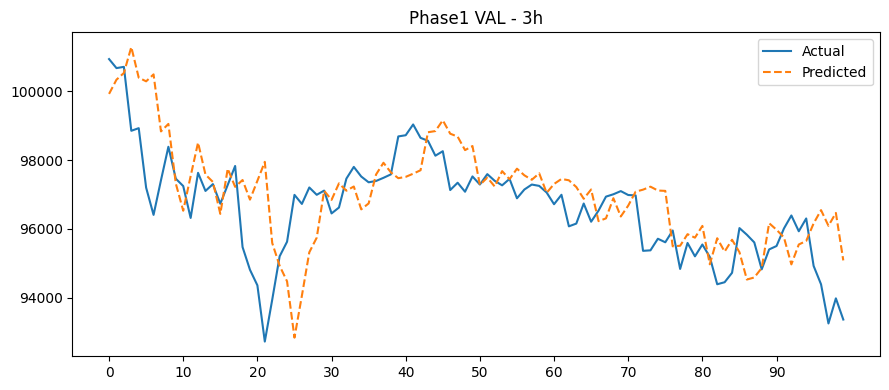

Phase1 VAL 6h: RMSE=1782.09, MAPE=1.45%


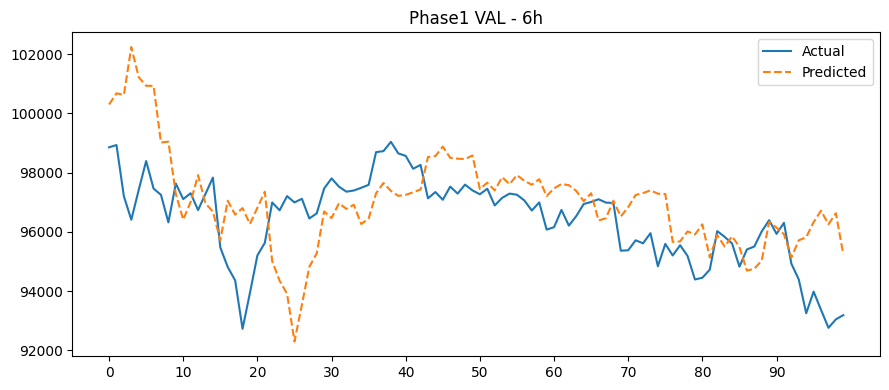

Phase1 VAL 12h: RMSE=2080.41, MAPE=1.71%


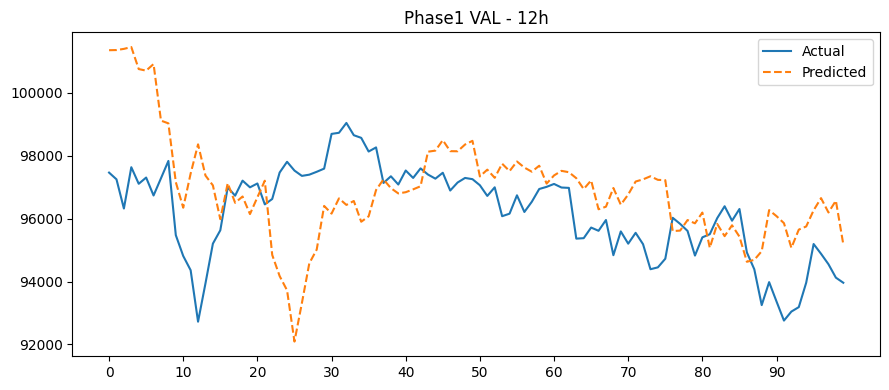

Phase1 VAL 1d: RMSE=2680.15, MAPE=2.25%


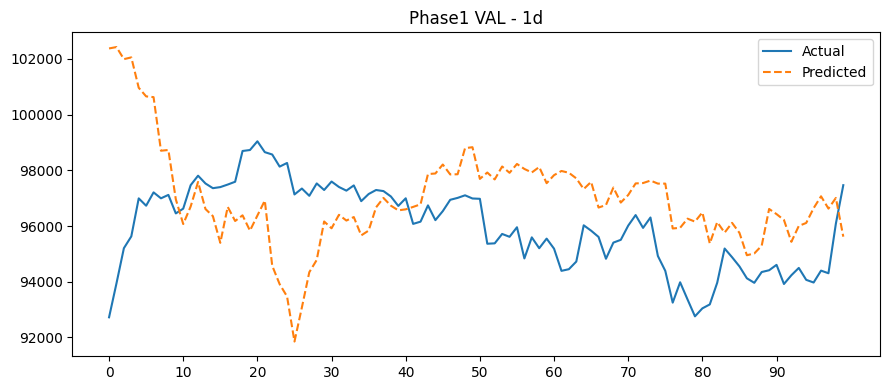

Phase1 VAL 3d: RMSE=3919.82, MAPE=3.36%


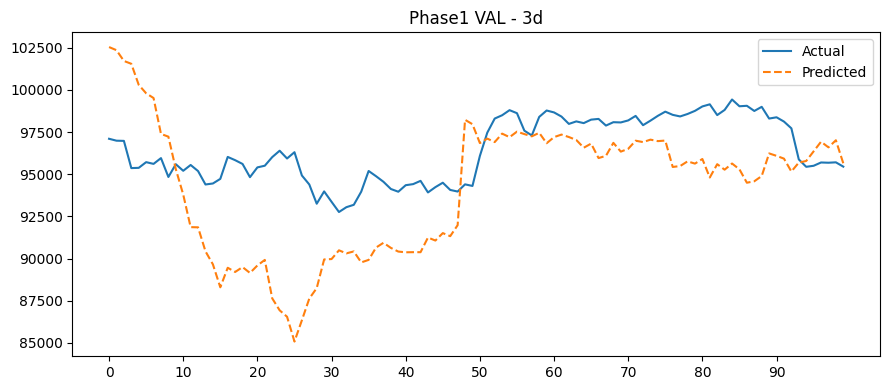

Phase1 VAL 7d: RMSE=9351.99, MAPE=7.03%


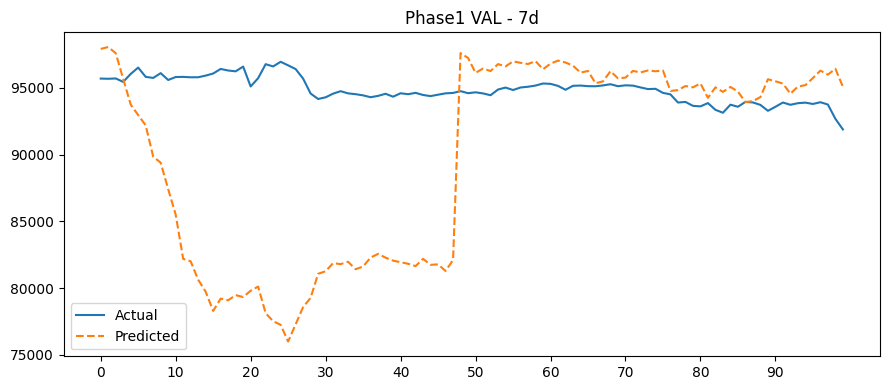

Phase1 VAL 15d: RMSE=14557.71, MAPE=11.83%


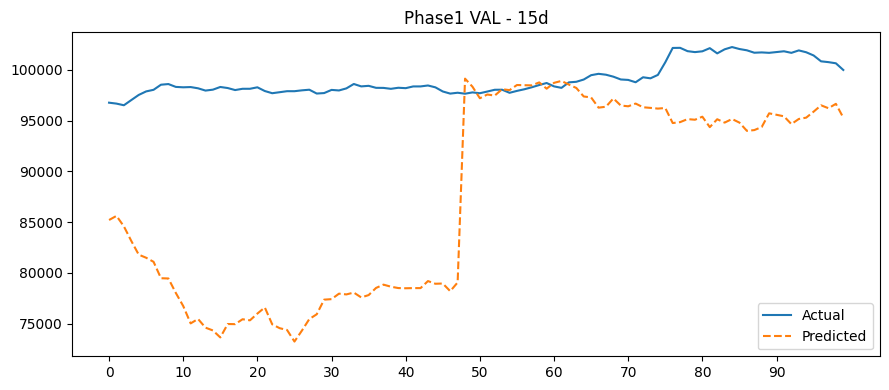

Phase1 VAL 30d: RMSE=22719.97, MAPE=16.87%


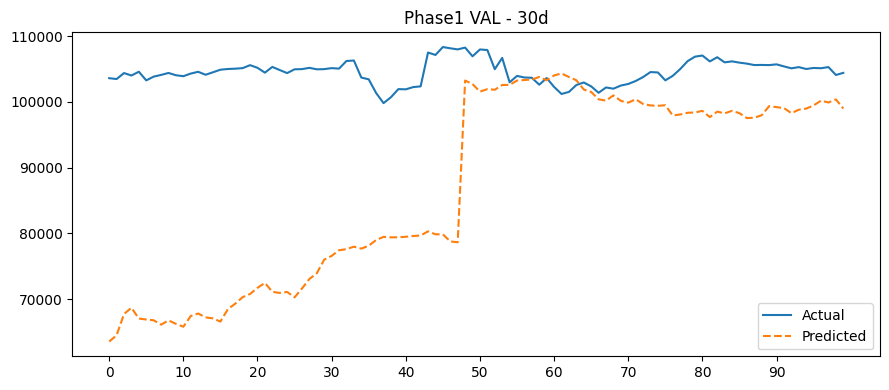


=== PHASE 2: TRAIN+VAL→TEST ===
--- Phase2 TEST LP first 100: [81395.54 81115.78 81503.31 81603.08 82226.98 81888.77 81948.16 82141.96
 82038.09 82170.85 82593.44 82776.5  83042.22 83253.15 83420.87 83602.16
 83524.8  84724.58 84787.37 84365.18 84570.54 84554.   84127.2  84205.79
 84438.06 83983.2  84297.14 84353.85 84557.95 84491.99 84456.57 84266.26
 84183.28 83827.31 83891.36 83966.95 83912.19 84103.74 84136.53 84460.
 84131.75 84346.02 84362.91 84422.25 84223.29 84299.98 84389.31 84388.73
 84382.65 84338.44 84253.52 83869.31 83966.05 84332.34 84408.97 84395.31
 84228.   84273.96 84268.36 83897.02 83666.98 82410.02 82755.89 82596.1
 83373.16 83320.83 83634.53 83913.22 83701.75 83098.47 83216.98 82766.52
 82093.71 82574.53 83054.91 83233.8  83212.51 83675.65 83615.53 83120.
 83220.91 83567.87 83547.17 83664.31 83344.34 83514.73 83052.   83023.38
 82913.03 83531.06 83448.86 84197.46 84496.58 84482.55 83954.36 84077.8
 84061.19 84010.03 83790.24 83161.97]
--- Phase2 TEST TRUE_1h first

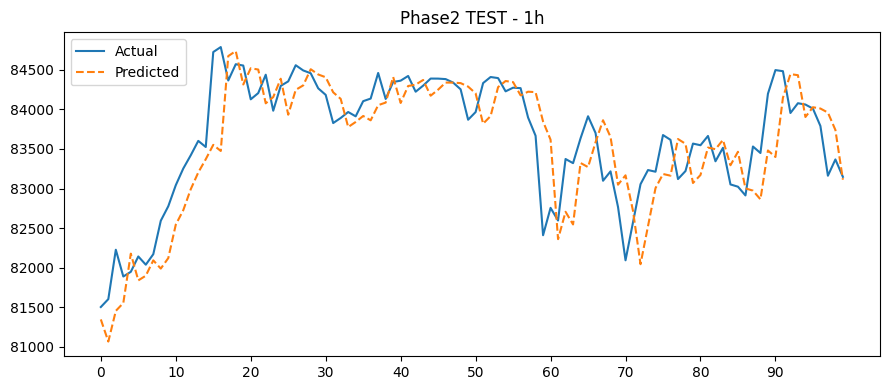

Phase2 TEST 2h: RMSE=581.99, MAPE=0.54%


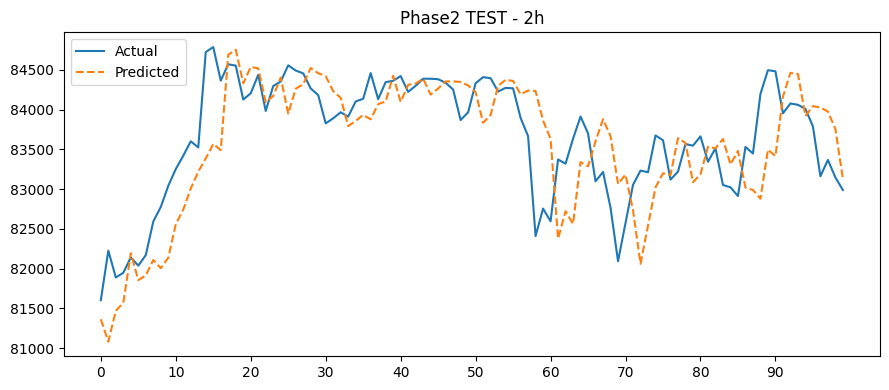

Phase2 TEST 3h: RMSE=669.50, MAPE=0.61%


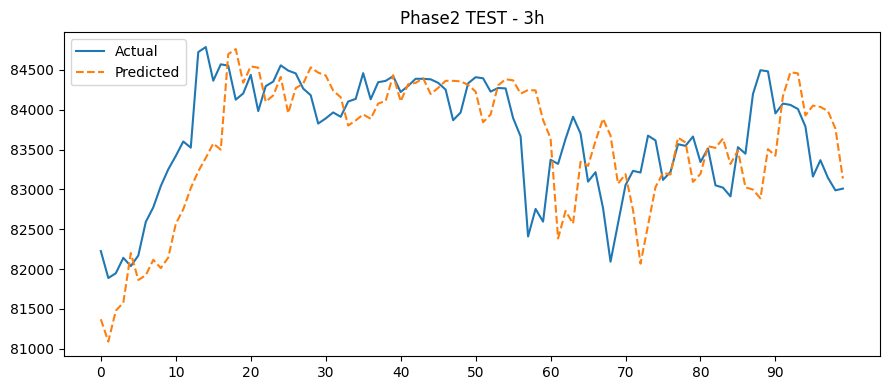

Phase2 TEST 6h: RMSE=818.20, MAPE=0.77%


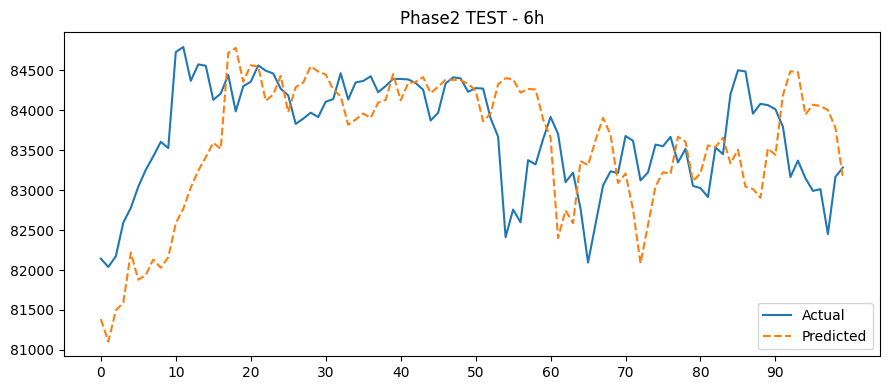

Phase2 TEST 12h: RMSE=1119.86, MAPE=1.06%


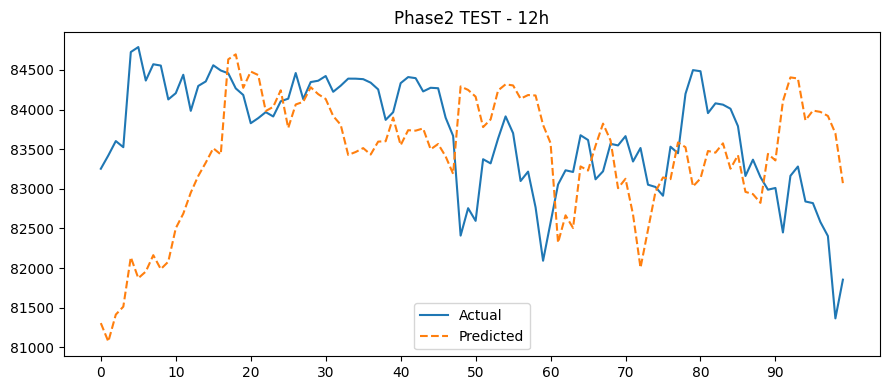

Phase2 TEST 1d: RMSE=1184.19, MAPE=1.10%


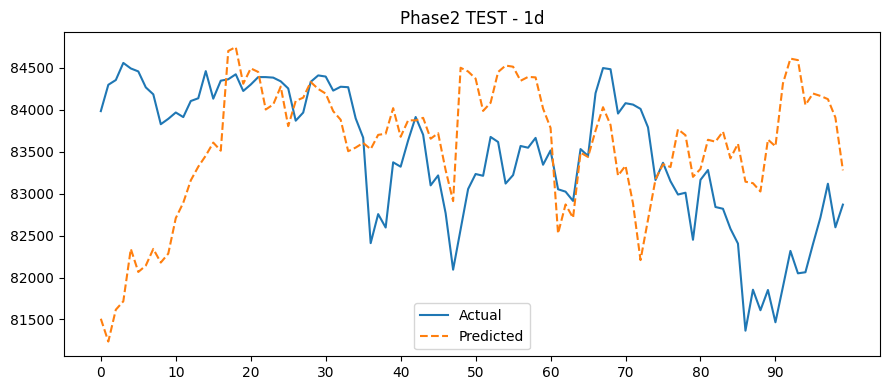

Phase2 TEST 3d: RMSE=1771.41, MAPE=1.71%


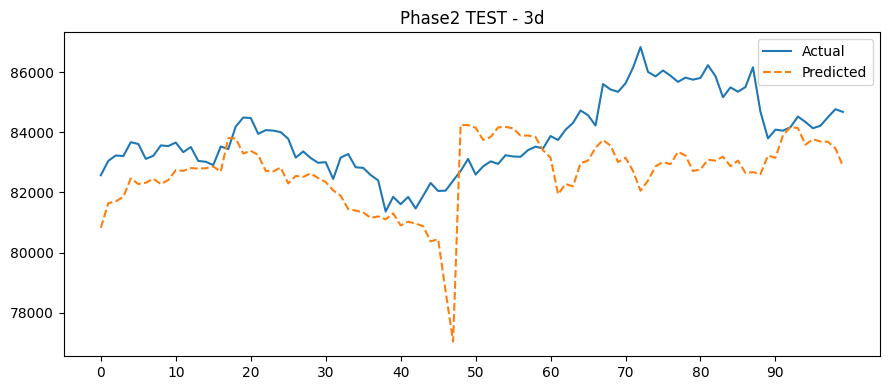

Phase2 TEST 7d: RMSE=8635.97, MAPE=8.42%


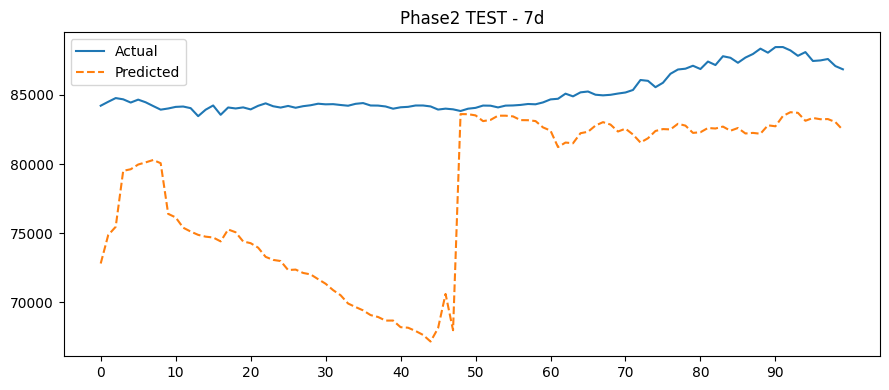

Phase2 TEST 15d: RMSE=9461.50, MAPE=8.43%


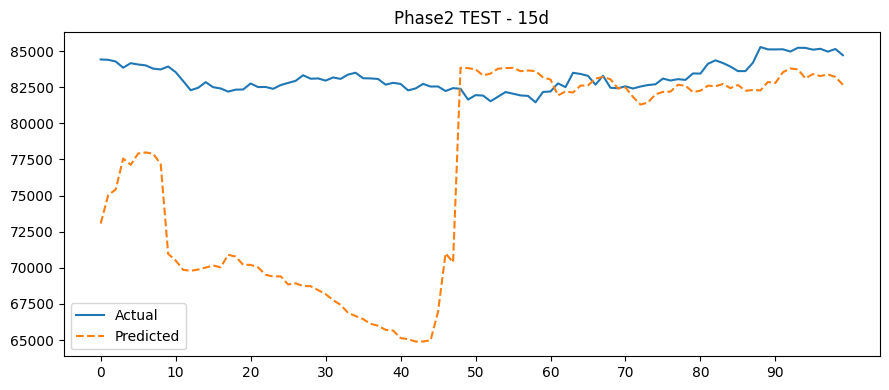

Phase2 TEST 30d: RMSE=15512.38, MAPE=15.66%


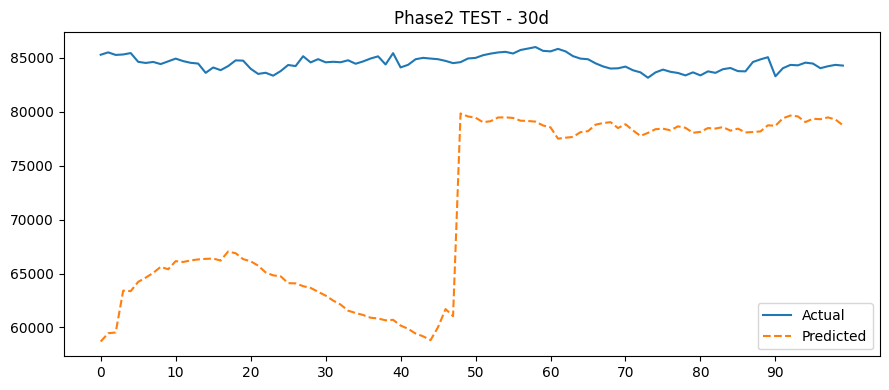

In [14]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import torch, torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# Paths & params
TRAIN_CSV    = '/kaggle/input/data-btc/fix3/fix2/train.csv'
VAL_CSV      = '/kaggle/input/data-btc/fix3/fix2/val.csv'
TEST_CSV     = '/kaggle/input/data-btc/fix3/fix2/test.csv'
WINDOW_SIZE  = 48
BATCH_SIZE   = 64
TUNE_EPOCHS  = 5
FINAL_EPOCHS = 5
LR           = 1e-3
PATIENCE     = 3
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED         = 42

torch.manual_seed(SEED); np.random.seed(SEED)

# 1) Load raw
df_tr_raw = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va_raw = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])
df_te_raw = pd.read_csv(TEST_CSV,  parse_dates=['timestamp'])

# 2) Horizons & features
HORIZONS = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABELS   = [f'label_{h}' for h in HORIZONS]
FEATS    = [c for c in df_tr_raw.columns if c not in LABELS+['timestamp','close_time']]

# 3) Scale train & val
scaler_X = MinMaxScaler().fit(df_tr_raw[FEATS])
scaler_y = MinMaxScaler().fit(df_tr_raw[LABELS])
df_tr, df_va = df_tr_raw.copy(), df_va_raw.copy()
df_tr[FEATS]  = scaler_X.transform(df_tr[FEATS])
df_va[FEATS]  = scaler_X.transform(df_va[FEATS])
df_tr[LABELS] = scaler_y.transform(df_tr[LABELS])
df_va[LABELS] = scaler_y.transform(df_va[LABELS])

# 4) Sequence builder
def make_sequences(df_scaled, raw_close, raw_label, window):
    X, Y, LP, Yt = [], [], [], []
    arr_f = df_scaled[FEATS].values
    N     = len(df_scaled)
    for i in range(N-window):
        seq        = arr_f[i:i+window]
        last_price = raw_close[i+window-1]
        future     = raw_label[i+window]
        delta      = (future - last_price)/(last_price+1e-8)
        X.append(seq); Y.append(delta); LP.append(last_price); Yt.append(future)
    if not X: return None,None,None,None
    return np.stack(X), np.stack(Y), np.array(LP), np.stack(Yt)

# 5) Build train+val sequences
raw_close_tv = pd.concat([df_tr_raw, df_va_raw], ignore_index=True)['close'].values
raw_label_tv = pd.concat([df_tr_raw[LABELS], df_va_raw[LABELS]], ignore_index=True).values
df_tv_scaled = pd.concat([df_tr, df_va], ignore_index=True)
X_all, Y_all, LP_all, TRUE_all = make_sequences(df_tv_scaled, raw_close_tv, raw_label_tv, WINDOW_SIZE)
n_tr_seq = len(df_tr_raw)-WINDOW_SIZE
X_tr, Y_tr = X_all[:n_tr_seq], Y_all[:n_tr_seq]
LP_tr, TRUE_tr = LP_all[:n_tr_seq], TRUE_all[:n_tr_seq]
X_va, Y_va = X_all[n_tr_seq:], Y_all[n_tr_seq:]
LP_va, TRUE_va = LP_all[n_tr_seq:], TRUE_all[n_tr_seq:]

# 6) Build TEST sequences (prepend last WINDOW_SIZE of val)
raw_close_te = np.concatenate([df_va_raw['close'].values[-WINDOW_SIZE:], df_te_raw['close'].values])
raw_label_te = np.concatenate([df_va_raw[LABELS].values[-WINDOW_SIZE:], df_te_raw[LABELS].values])
df_va_scaled = df_va.copy(); df_va_scaled[FEATS]=scaler_X.transform(df_va[FEATS])
df_te_scaled = df_te_raw.copy(); df_te_scaled[FEATS]=scaler_X.transform(df_te_raw[FEATS])
df_comb = pd.concat([df_va_scaled.iloc[-WINDOW_SIZE:], df_te_scaled[FEATS]], ignore_index=True)
X_te, Y_te, LP_te, TRUE_te = make_sequences(df_comb, raw_close_te, raw_label_te, WINDOW_SIZE)

# 7) DataLoaders
train_ld = DataLoader(TensorDataset(torch.FloatTensor(X_tr), torch.FloatTensor(Y_tr)),
                      batch_size=BATCH_SIZE, shuffle=True)
val_ld   = DataLoader(TensorDataset(torch.FloatTensor(X_va), torch.FloatTensor(Y_va)),
                      batch_size=BATCH_SIZE, shuffle=False)
test_ld  = None if X_te is None else DataLoader(TensorDataset(torch.FloatTensor(X_te), torch.FloatTensor(Y_te)),
                                                batch_size=BATCH_SIZE, shuffle=False)

# 8) Model with stronger embedding
class MultiHorizonModel(nn.Module):
    def __init__(self, n_feat, n_hor, d_emb=16):  # increased to 16
        super().__init__()
        self.conv = nn.Conv1d(n_feat,64,kernel_size=3,padding=2,dilation=2)
        self.lstm = nn.LSTM(64,128,batch_first=True,bidirectional=True)
        self.norm = nn.LayerNorm(256)
        self.attn = nn.MultiheadAttention(256,num_heads=4,batch_first=True)
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.h_emb= nn.Embedding(n_hor,d_emb)
        self.emb_drop = nn.Dropout(0.3)            # added dropout
        self.heads = nn.ModuleList([
            nn.Sequential(
                nn.Linear(256+d_emb,64),
                nn.ReLU(),
                nn.Dropout(0.3),                   # increased dropout
                nn.Linear(64,1)
            ) for _ in range(n_hor)
        ])
    def forward(self,x):
        b = x.size(0)
        x = x.permute(0,2,1)
        x = self.conv(x)
        x = x.permute(0,2,1)
        x,_ = self.lstm(x)
        x = self.norm(x)
        att,_ = self.attn(x,x,x)
        x = self.norm(x+att)
        x = x.permute(0,2,1)
        feat = self.pool(x).squeeze(-1)
        outs = []
        for i, head in enumerate(self.heads):
            emb = self.h_emb(torch.full((b,), i, dtype=torch.long, device=feat.device))
            emb = self.emb_drop(emb)              # apply dropout to embedding
            inp = torch.cat([feat, emb], dim=1)
            outs.append(head(inp))
        return torch.cat(outs,1)

# 9) Eval helper (first_n=100)
def eval_phase(model, LP, TRUE, desc, first_n=100):
    n_pts = min(first_n, LP.shape[0])
    print(f"--- {desc} LP first {n_pts}: {LP[:n_pts]}")
    for hi,h in enumerate(HORIZONS):
        print(f"--- {desc} TRUE_{h} first {n_pts}: {TRUE[:n_pts,hi]}")
    model.eval()
    preds = []
    with torch.no_grad():
        for i in range(n_pts):
            xb = torch.FloatTensor(X_te[i:i+1]).to(DEVICE)
            out= model(xb).cpu().numpy()[0]
            preds.append(out)
    preds = np.stack(preds)
    price_pred = np.zeros_like(preds)
    for i in range(n_pts):
        price_pred[i] = LP[i]*(1+preds[i])
    price_true = TRUE[:n_pts]
    for hi,h in enumerate(HORIZONS):
        rmse = mean_squared_error(price_true[:,hi], price_pred[:,hi], squared=False)
        mape = mean_absolute_percentage_error(price_true[:,hi], price_pred[:,hi])*100
        print(f"{desc} {h}: RMSE={rmse:.2f}, MAPE={mape:.2f}%")
        plt.figure(figsize=(9,4))
        plt.plot(price_true[:,hi], label='Actual')
        plt.plot(price_pred[:,hi],'--', label='Predicted')
        plt.xticks(range(0,n_pts, max(1, n_pts//10)))
        plt.title(f"{desc} - {h}")
        plt.legend(); plt.tight_layout(); plt.show()

# 10) Phase 1: TRAIN→VAL
print("=== PHASE 1: TRAIN→VAL ===")
model = MultiHorizonModel(n_feat=X_tr.shape[2], n_hor=len(HORIZONS)).to(DEVICE)
opt   = torch.optim.Adam(model.parameters(), lr=LR)
crit  = nn.HuberLoss(delta=1.0)
weights = torch.linspace(1,2,steps=len(HORIZONS)).to(DEVICE)

best_val,cnt = float('inf'), 0
for ep in range(1, TUNE_EPOCHS+1):
    model.train()
    for xb,yb in train_ld:
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        loss = (crit(model(xb), yb)*weights).mean()
        opt.zero_grad(); loss.backward(); opt.step()
    # validate
    val_losses=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in val_ld:
            xb,yb = xb.to(DEVICE), yb.to(DEVICE)
            val_losses.append(((crit(model(xb), yb)*weights).mean().item()))
    mv = np.mean(val_losses); print(f"Ep{ep} val_loss={mv:.4f}")
    if mv<best_val:
        best_val,cnt=mv,0
        torch.save(model.state_dict(),'best_tune.pth')
    else:
        cnt+=1
        if cnt>=PATIENCE:
            print("Early stopping"); break

eval_phase(model, LP_va, TRUE_va, desc="Phase1 VAL", first_n=100)

# 11) Phase 2: TRAIN+VAL→TEST
print("\n=== PHASE 2: TRAIN+VAL→TEST ===")
model.load_state_dict(torch.load('best_tune.pth'))
opt = torch.optim.Adam(model.parameters(), lr=LR)
# combine train+val
X_comb = np.vstack([X_tr, X_va]); Y_comb = np.vstack([Y_tr, Y_va])
comb_ld = DataLoader(TensorDataset(torch.FloatTensor(X_comb), torch.FloatTensor(Y_comb)),
                     batch_size=BATCH_SIZE, shuffle=True)
for ep in range(1, FINAL_EPOCHS+1):
    model.train()
    for xb,yb in comb_ld:
        xb,yb = xb.to(DEVICE), yb.to(DEVICE)
        loss = (crit(model(xb), yb)*weights).mean()
        opt.zero_grad(); loss.backward(); opt.step()

if test_ld is not None:
    eval_phase(model, LP_te, TRUE_te, desc="Phase2 TEST", first_n=100)
else:
    print("Test split too small, skipping.")


ML Klasik

LGBM

Horizon 1h: RMSE=4633.9622, MAPE=3.41%


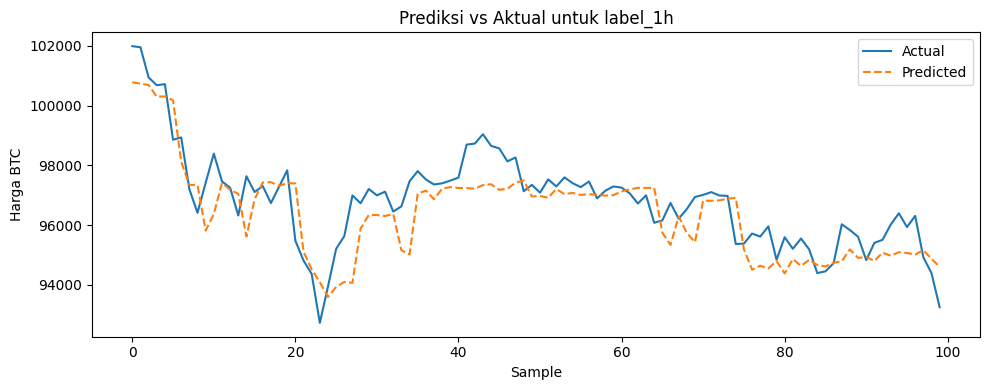

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

# 1. Load data
df_tr = pd.read_csv('/kaggle/input/data-btc/fix/train.csv', parse_dates=['timestamp'])
df_va = pd.read_csv('/kaggle/input/data-btc/fix/val.csv',   parse_dates=['timestamp'])

# 2. Drop other labels and non-feature columns
label = 'label_1h'
drop_labels = [c for c in df_tr.columns if c.startswith('label_') and c != label]
df_tr.drop(columns=drop_labels + ['timestamp','close_time'], inplace=True)
df_va.drop(columns=drop_labels + ['timestamp','close_time'], inplace=True)

# 3. Define features and target
features = [c for c in df_tr.columns if c != label]
X_tr, y_tr = df_tr[features], df_tr[label]
X_va, y_va = df_va[features], df_va[label]

# 4. Train LGBMRegressor
model = LGBMRegressor(
    objective='regression',
    n_estimators=200,          # set jumlah pohon
    learning_rate=0.05,
    verbose=-1
)
model.fit(
    X_tr, y_tr,
    eval_set=[(X_va, y_va)],
    eval_metric='rmse'
#     early_stopping_rounds=20,
#     verbose=50
)

# 5. Predict & Evaluate
y_pred = model.predict(X_va)
rmse = mean_squared_error(y_va, y_pred, squared=False)
mape = mean_absolute_percentage_error(y_va, y_pred) * 100
print(f'Horizon 1h: RMSE={rmse:.4f}, MAPE={mape:.2f}%')

# 6. Plot hasil prediksi vs aktual
plt.figure(figsize=(10,4))
plt.plot(y_va.values[:100], label='Actual')
plt.plot(y_pred[:100], '--', label='Predicted')
plt.title('Prediksi vs Aktual untuk label_1h')
plt.xlabel('Sample')
plt.ylabel('Harga BTC')
plt.legend()
plt.tight_layout()
plt.show()



Training model for label_1h
label_1h: RMSE=4633.9622, MAPE=3.41%


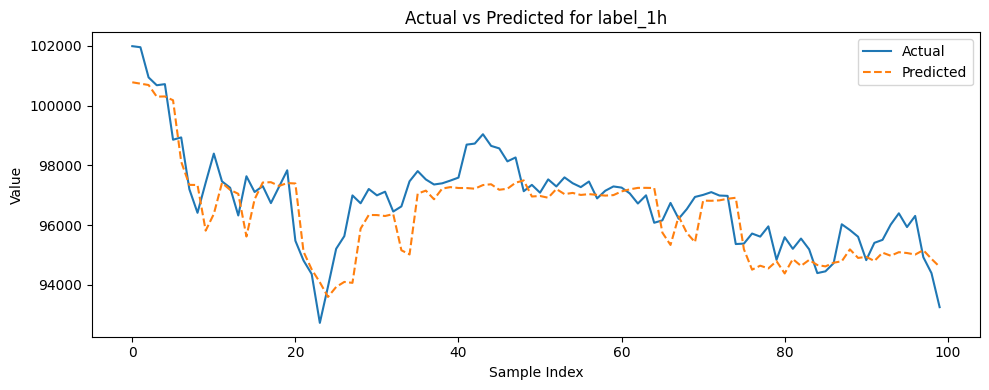


Training model for label_2h
label_2h: RMSE=4725.1761, MAPE=3.56%


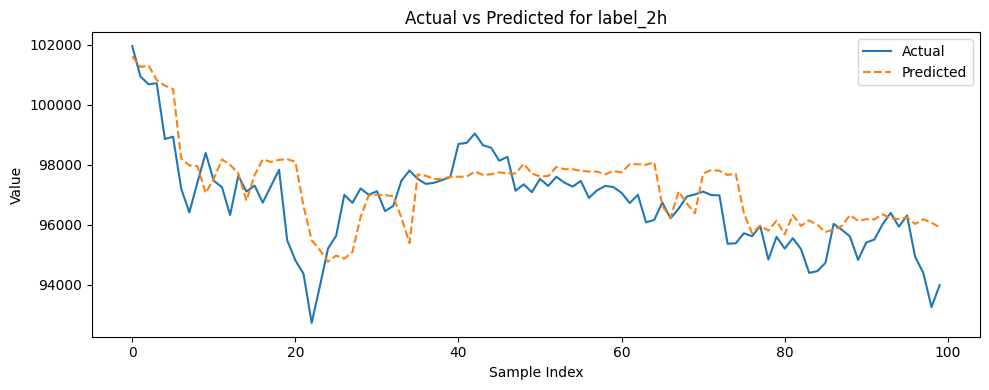


Training model for label_3h
label_3h: RMSE=5188.1729, MAPE=3.98%


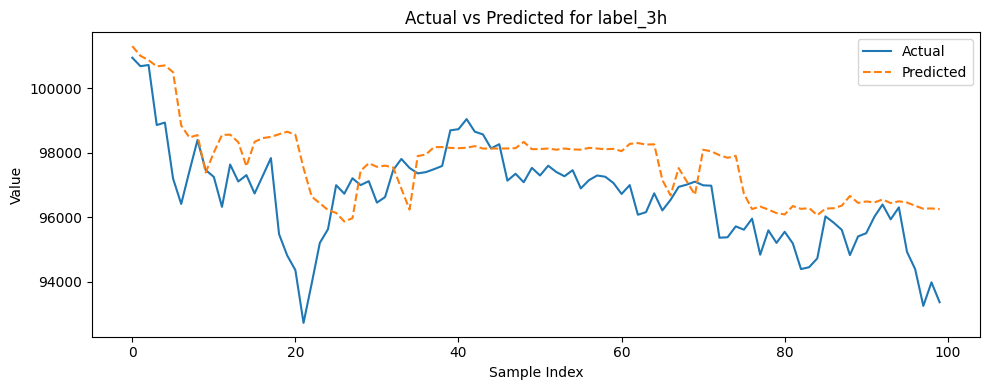


Training model for label_6h
label_6h: RMSE=5185.1227, MAPE=4.12%


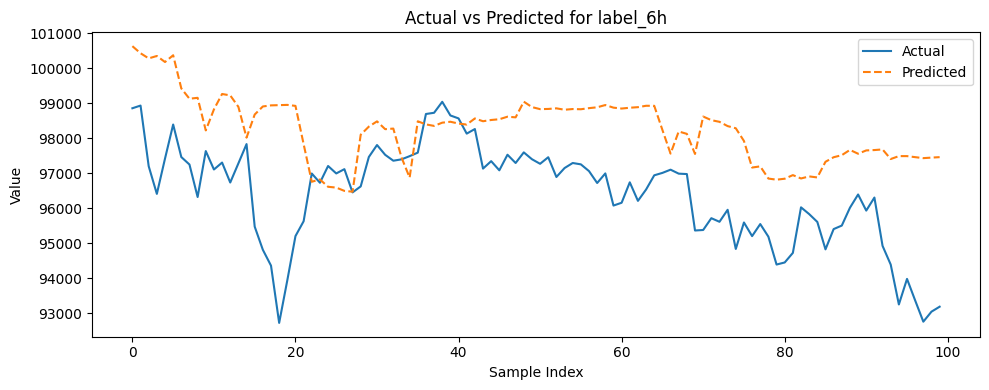


Training model for label_12h
label_12h: RMSE=6605.5953, MAPE=5.20%


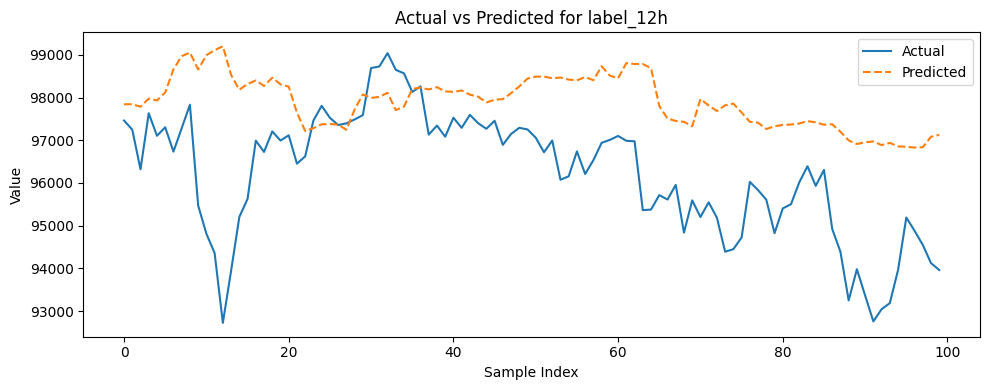


Training model for label_1d
label_1d: RMSE=9884.9477, MAPE=7.82%


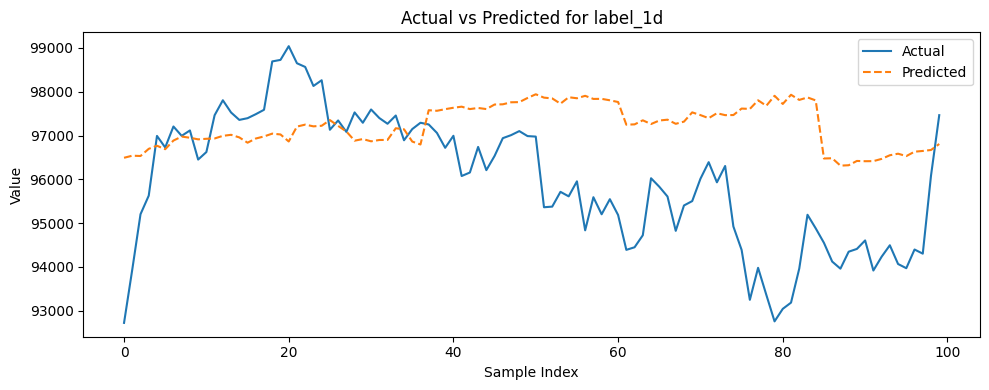


Training model for label_3d
label_3d: RMSE=5449.5802, MAPE=4.44%


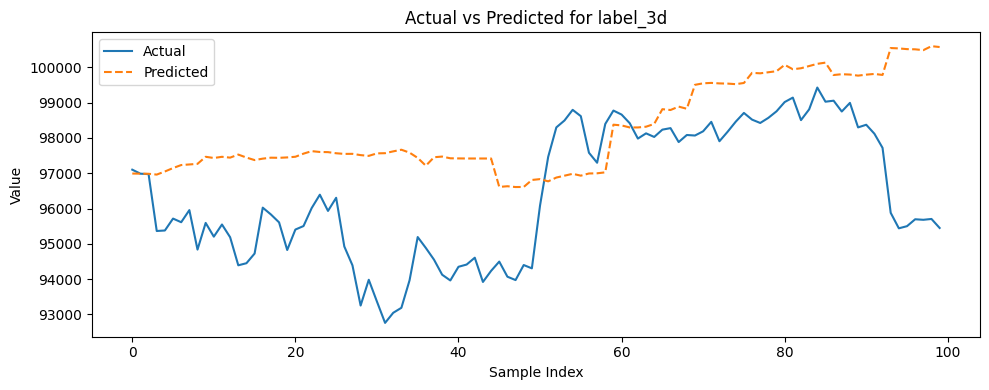


Training model for label_7d
label_7d: RMSE=7781.8751, MAPE=7.00%


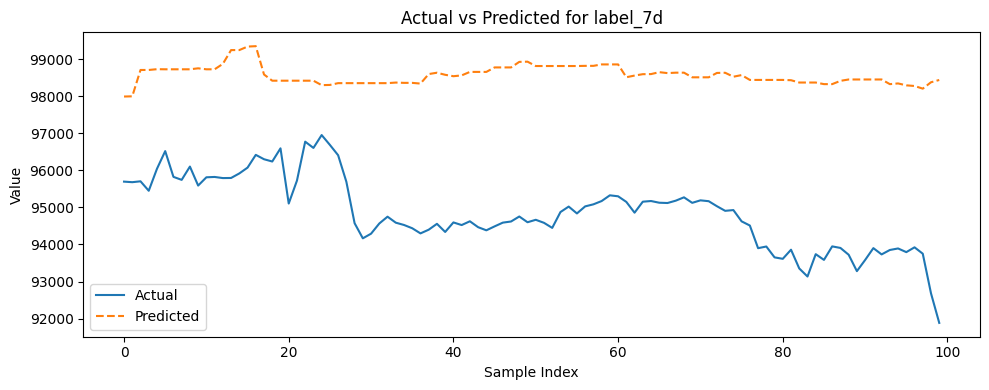


Training model for label_15d
label_15d: RMSE=7059.9237, MAPE=6.02%


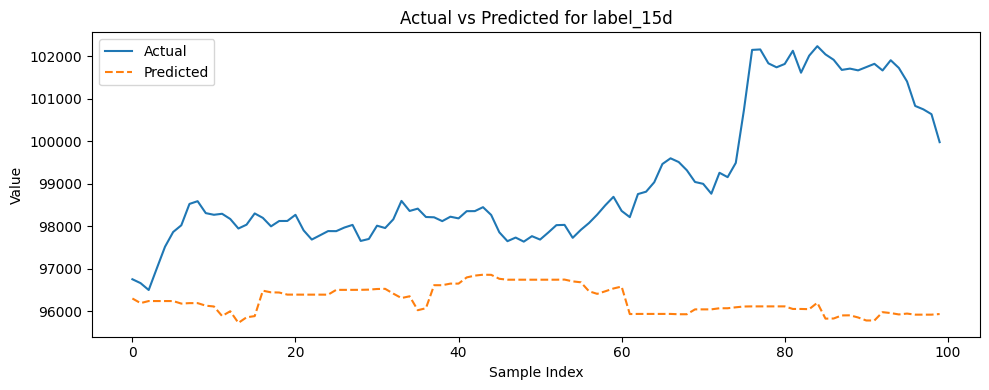


Training model for label_30d
label_30d: RMSE=9905.7549, MAPE=9.57%


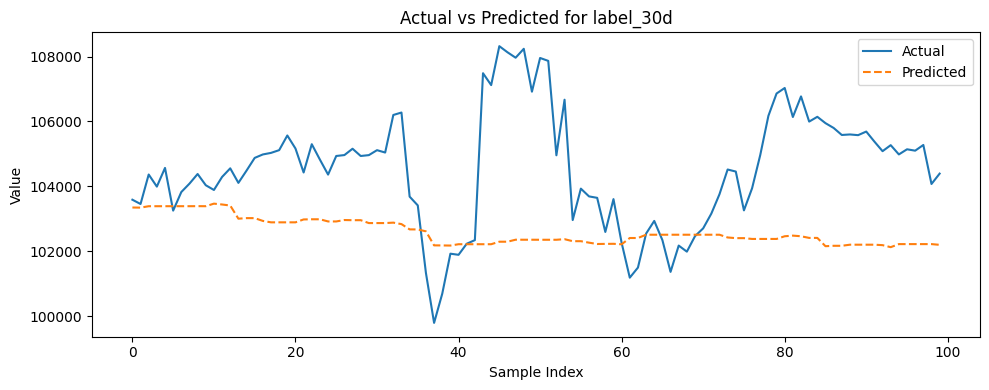

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

# Paths & parameters
TRAIN_CSV = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV   = '/kaggle/input/data-btc/fix/val.csv'
horizons = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
labels   = [f'label_{h}' for h in horizons]

# 1. Load datasets
df_tr = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va = pd.read_csv(VAL_CSV, parse_dates=['timestamp'])

# 2. Drop non-feature columns
df_tr.drop(columns=['timestamp','close_time'], inplace=True)
df_va.drop(columns=['timestamp','close_time'], inplace=True)

# 3. Define features (exclude all labels)
features = [c for c in df_tr.columns if c not in labels]

# 4. Train separate LGBMRegressor for each horizon
results = {}
for label in labels:
    print(f"\nTraining model for {label}")
    # Prepare data for this horizon
    X_tr, y_tr = df_tr[features], df_tr[label]
    X_va, y_va = df_va[features], df_va[label]

    # Initialize model (n_estimators replaces num_boost_round)
    model = LGBMRegressor(
        objective='regression',
        n_estimators=200,
        learning_rate=0.05,
        random_state=42
    )
    # Train with early stopping
    model.fit(
        X_tr, y_tr,
        eval_set=[(X_va, y_va)],
        eval_metric='rmse'
        # early_stopping_rounds=20,
        # verbose=50
    )

    # Predict & evaluate
    y_pred = model.predict(X_va)
    rmse = mean_squared_error(y_va, y_pred, squared=False)
    mape = mean_absolute_percentage_error(y_va, y_pred) * 100
    print(f"{label}: RMSE={rmse:.4f}, MAPE={mape:.2f}%")
    results[label] = {'true': y_va.values, 'pred': y_pred}

    # Plot actual vs predicted for first 100 samples
    plt.figure(figsize=(10,4))
    plt.plot(y_va.values[:100], label='Actual')
    plt.plot(y_pred[:100], '--', label='Predicted')
    plt.title(f'Actual vs Predicted for {label}')
    plt.xlabel('Sample Index')
    plt.ylabel('Value')
    plt.legend()
    plt.tight_layout()
    plt.show()


Filter Method:

Applying correlation filter...


/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)


Dropping 42 highly correlated features: ['cpi_us', 'fed_balance_sheet', 'fed_funds_rate', 'nasdaq_composite', 'oil_price_wti', 'qqq_etf', 'usd_try', 'us_m2', 'qqq_etf_ret7d', 'qqq_etf_vol1d', 'qqq_etf_vol7d', 'vix_index_lag1d', 'fed_funds_rate_lag1d', 'fed_funds_rate_lag7d', 'cpi_us_lag1d', 'cpi_us_lag7d', 'HashRate', 'HashRate30d', 'FeeTotUSD', 'IssContPctDay', 'FlowOutExUSD', 'IssContPctDay_ret1d', 'IssContPctDay_std1d', 'CapMVRVCur_lag1d', 'open', 'high', 'low', 'close', 'taker_buy_base_vol', 'taker_buy_quote_vol', 'body', 'sell_vol', 'vwap_2h', 'vwap_24h', 'num_trades_z_24h', 'vol_mean_24h', 'ema_12', 'ema_26', 'macd_signal', 'bb_mid', 'bb_upper', 'bb_lower']
Applying variance threshold filter (threshold=1e-05)...
Dropping 6 low-variance features: ['dxy_data_vol1d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'fundingRate', 'ret_mean_6h', 'ret_mean_24h']
Final feature count: 113

Training model for label_1h with 113 features...
label_1h: RMSE=5991.8726, MAPE=4.72%


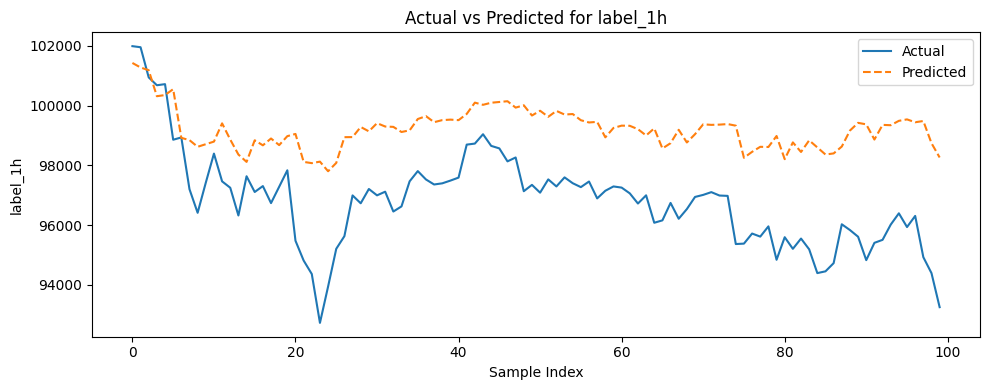


Training model for label_2h with 113 features...
label_2h: RMSE=6250.6527, MAPE=4.99%


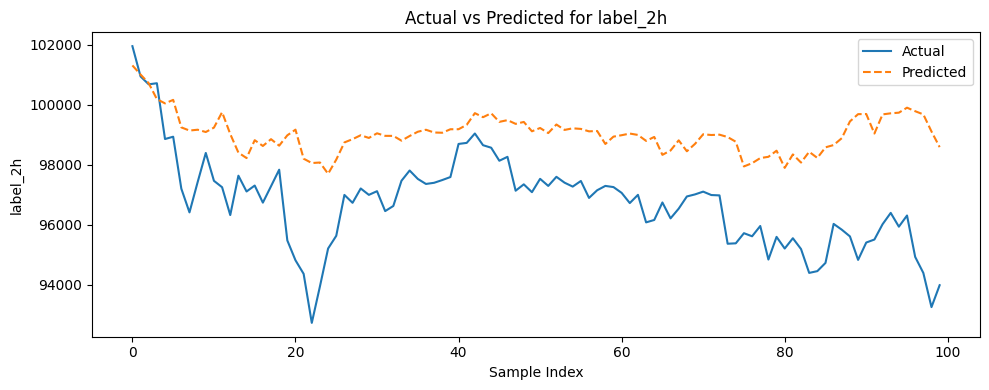


Training model for label_3h with 113 features...
label_3h: RMSE=6019.1471, MAPE=4.77%


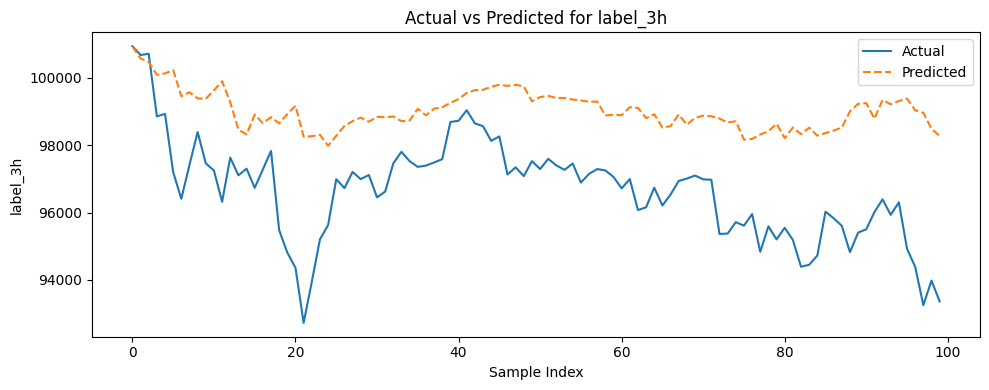


Training model for label_6h with 113 features...
label_6h: RMSE=6266.2416, MAPE=4.90%


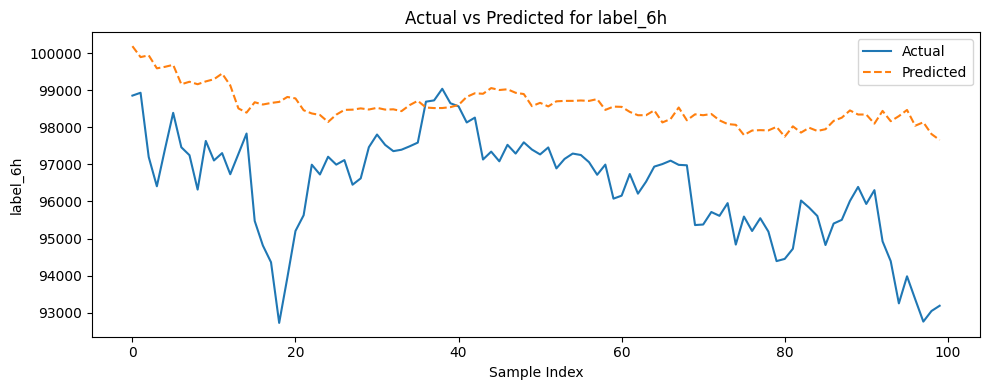


Training model for label_12h with 113 features...
label_12h: RMSE=7012.6365, MAPE=5.50%


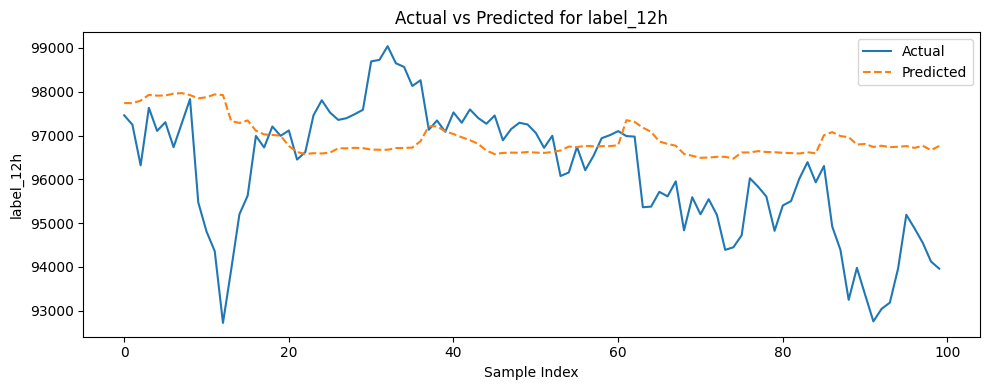


Training model for label_1d with 113 features...
label_1d: RMSE=6044.2758, MAPE=4.76%


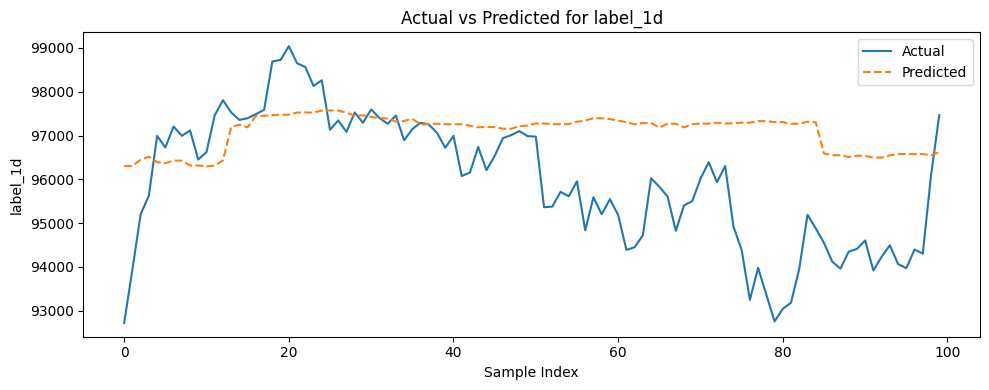


Training model for label_3d with 113 features...
label_3d: RMSE=7621.0649, MAPE=6.40%


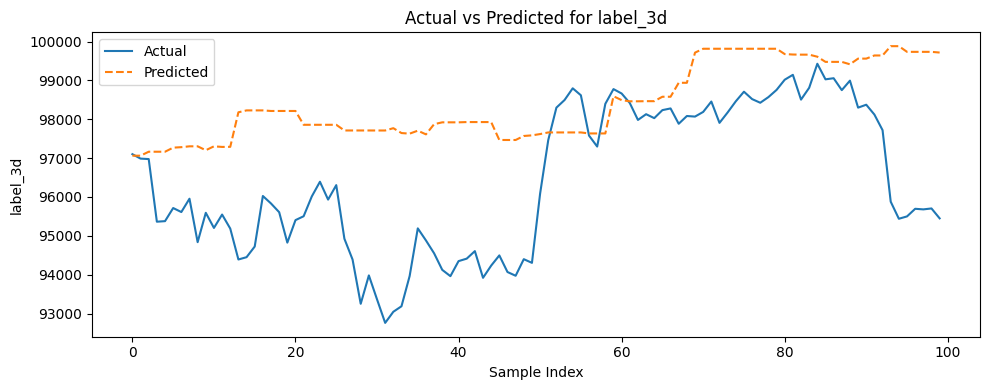


Training model for label_7d with 113 features...
label_7d: RMSE=7254.7873, MAPE=6.21%


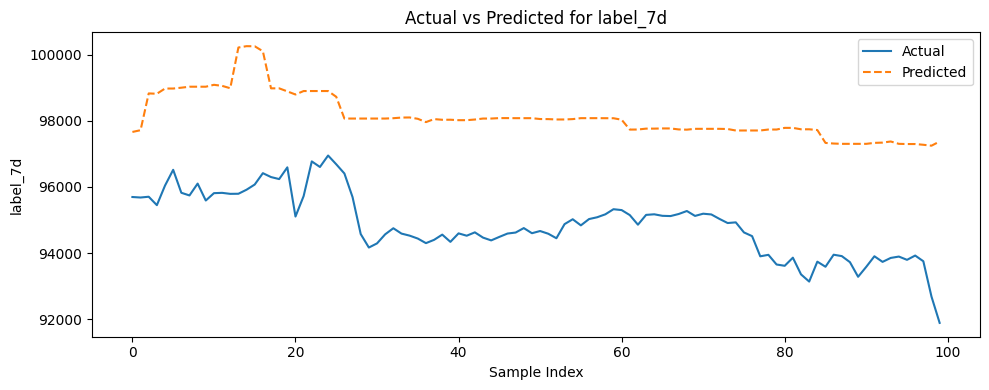


Training model for label_15d with 113 features...
label_15d: RMSE=7057.8929, MAPE=6.30%


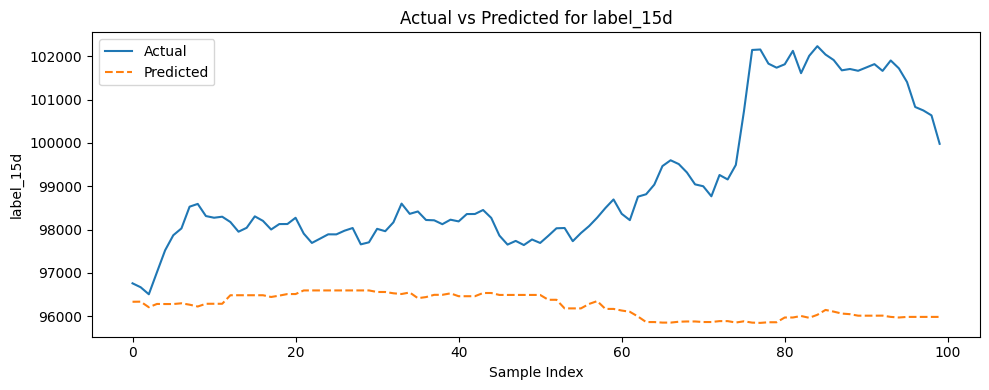


Training model for label_30d with 113 features...
label_30d: RMSE=9954.4180, MAPE=9.69%


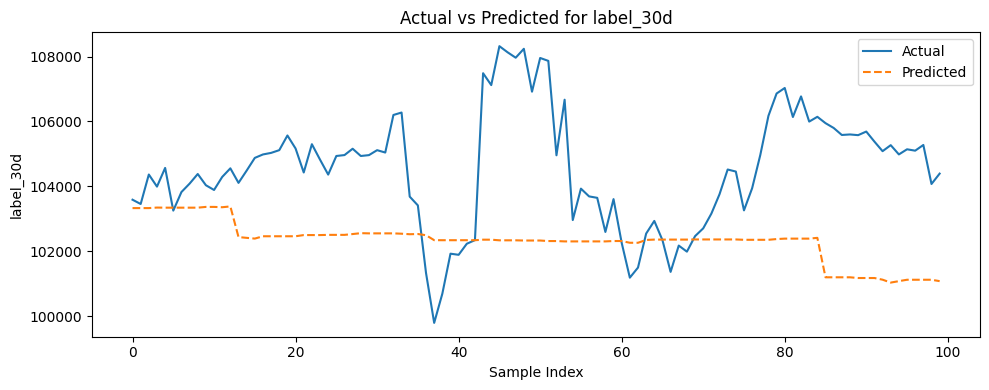

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.feature_selection import VarianceThreshold
import numpy as np

# Paths & parameters
TRAIN_CSV = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV   = '/kaggle/input/data-btc/fix/val.csv'
horizons = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
labels   = [f'label_{h}' for h in horizons]

# 1. Load datasets
df_tr = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va = pd.read_csv(VAL_CSV, parse_dates=['timestamp'])

# 2. Drop non-feature columns
df_tr.drop(columns=['timestamp','close_time'], inplace=True)
df_va.drop(columns=['timestamp','close_time'], inplace=True)

# 3. Initial feature list (exclude all labels)
features = [c for c in df_tr.columns if c not in labels]

# 4. FILTER METHOD - Correlation Threshold
print("Applying correlation filter...")
corr_matrix = df_tr[features].corr().abs()
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
# Find features with correlation > 0.9
to_drop_corr = [col for col in upper.columns if any(upper[col] > 0.9)]
print(f"Dropping {len(to_drop_corr)} highly correlated features: {to_drop_corr}")
features_corr = [f for f in features if f not in to_drop_corr]

# 5. FILTER METHOD - Variance Threshold
threshold = 1e-5  # threshold for near-constant features
print(f"Applying variance threshold filter (threshold={threshold})...")
selector = VarianceThreshold(threshold=threshold)
selector.fit(df_tr[features_corr])
support = selector.get_support()
to_drop_var = [f for f, keep in zip(features_corr, support) if not keep]
print(f"Dropping {len(to_drop_var)} low-variance features: {to_drop_var}")
features_final = [f for f, keep in zip(features_corr, support) if keep]
print(f"Final feature count: {len(features_final)}")

# 6. Train separate LGBMRegressor for each horizon with selected features
results = {}
for label in labels:
    print(f"\nTraining model for {label} with {len(features_final)} features...")
    X_tr, y_tr = df_tr[features_final], df_tr[label]
    X_va, y_va = df_va[features_final], df_va[label]

    model = LGBMRegressor(
        objective='regression',
        n_estimators=200,
        learning_rate=0.05,
        random_state=42
    )
    model.fit(
        X_tr, y_tr,
        eval_set=[(X_va, y_va)],
        eval_metric='rmse'
    )

    # Predict & evaluate
    y_pred = model.predict(X_va)
    rmse = mean_squared_error(y_va, y_pred, squared=False)
    mape = mean_absolute_percentage_error(y_va, y_pred) * 100
    print(f"{label}: RMSE={rmse:.4f}, MAPE={mape:.2f}%")
    results[label] = {'true': y_va.values, 'pred': y_pred}

    # Plot actual vs predicted for first 100 samples
    plt.figure(figsize=(10,4))
    plt.plot(y_va.values[:100], label='Actual')
    plt.plot(y_pred[:100], '--', label='Predicted')
    plt.title(f'Actual vs Predicted for {label}')
    plt.xlabel('Sample Index')
    plt.ylabel(label)
    plt.legend()
    plt.tight_layout()
    plt.show()


 Wrapper Method dengan Recursive Feature Elimination (RFE)


Running RFE for label_1h...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Fitting estimator with 49 features.
Fitting estimator with 33 features.
Selected 30 features for label_1h: ['fed_balance_sheet', 'nasdaq_composite', 'vix_index_ret7d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol7d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'CapMVRVCur', 'CapMVRVCur_ret1d', 'CapMVRVCur_lag1d', 'high', 'low', 'close', 'close_ret1h', 'close_diff1h', 'vwap_2h', 'vwap_24h', 'close_z_24h', 'ret_mean_6h', 'ret_mean_24h', 'vol_mean_24h', 'vol_std_24h', 'ema_12', 'ema_26', 'macd', 'bb_mid', 'bb_upper', 'bb_lower']
label_1h: RMSE=2758.6566, MAPE=2.04%


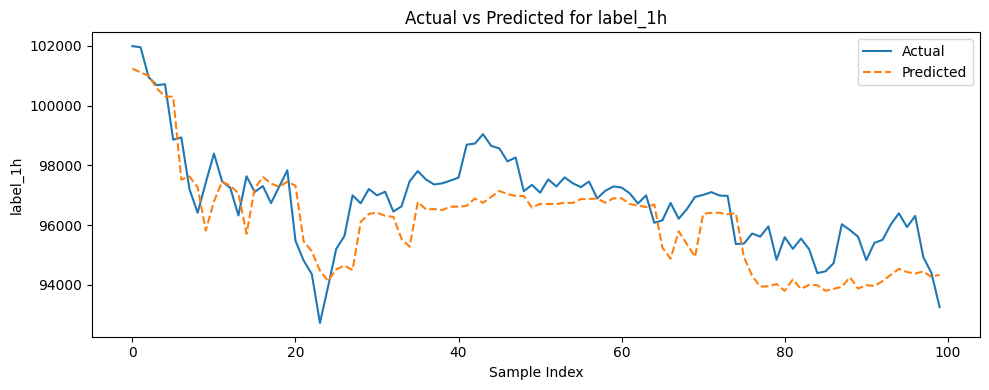


Running RFE for label_2h...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Fitting estimator with 49 features.
Fitting estimator with 33 features.
Selected 30 features for label_2h: ['fed_balance_sheet', 'google_trends_bitcoin_ret7d', 'vix_index_ret7d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'usd_ars_vol7d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'HashRate30d', 'CapMVRVCur', 'SplyAct1d', 'SplyAct30d', 'CapMVRVCur_ret1d', 'CapMVRVCur_z1d', 'high', 'low', 'close', 'close_ret1h', 'close_diff1h', 'vwap_2h', 'vwap_24h', 'ret_mean_24h', 'vol_mean_24h', 'vol_std_24h', 'ema_12', 'ema_26', 'macd', 'bb_mid', 'bb_upper', 'bb_lower']
label_2h: RMSE=4189.4472, MAPE=3.14%


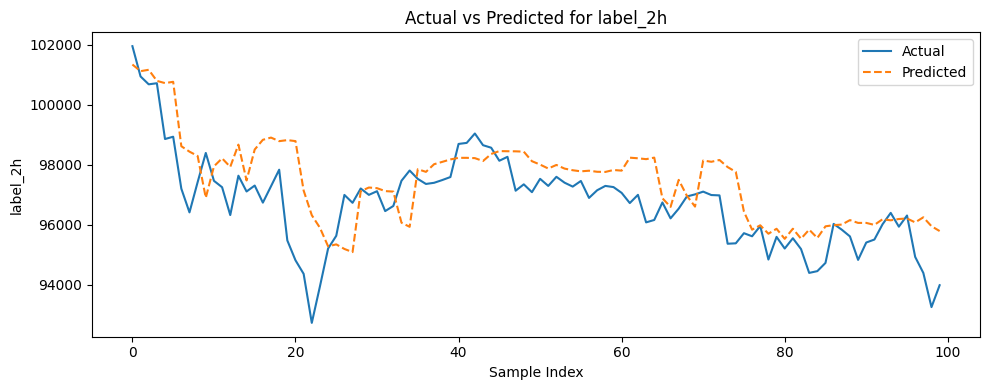


Running RFE for label_3h...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Fitting estimator with 49 features.
Fitting estimator with 33 features.
Selected 30 features for label_3h: ['fed_balance_sheet', 'oil_price_wti_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol7d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'HashRate30d', 'CapMVRVCur', 'SplyAct30d', 'CapMVRVCur_ret1d', 'CapMVRVCur_z1d', 'open', 'high', 'low', 'close', 'vwap_2h', 'vwap_24h', 'ret_mean_24h', 'vol_mean_24h', 'ema_12', 'ema_26', 'bb_mid', 'bb_std', 'bb_upper', 'bb_lower']
label_3h: RMSE=4337.6286, MAPE=3.34%


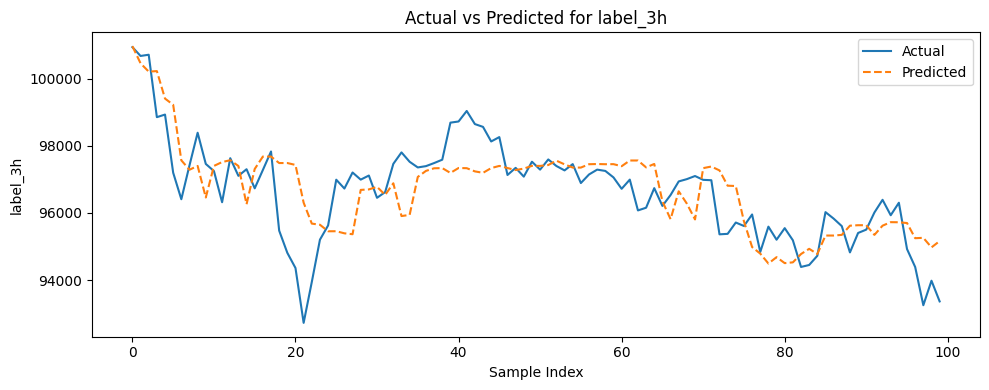


Running RFE for label_6h...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Fitting estimator with 49 features.
Fitting estimator with 33 features.
Selected 30 features for label_6h: ['fed_balance_sheet', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'google_trends_bitcoin_vol7d', 'usd_ars_vol7d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'HashRate30d', 'CapMVRVCur', 'SplyAct30d', 'CapMVRVCur_ret1d', 'CapMVRVCur_z1d', 'open', 'high', 'low', 'close', 'vwap_2h', 'vwap_24h', 'hour_cos', 'ret_mean_24h', 'ema_12', 'ema_26', 'macd', 'macd_signal', 'bb_mid', 'bb_std', 'bb_upper', 'bb_lower']
label_6h: RMSE=4367.1789, MAPE=3.58%


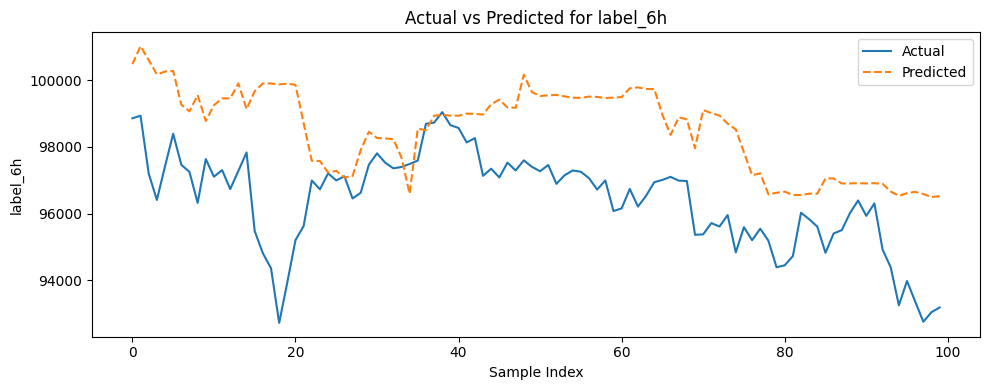


Running RFE for label_12h...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Fitting estimator with 49 features.
Fitting estimator with 33 features.
Selected 30 features for label_12h: ['dxy_data', 'fed_balance_sheet', 'usd_ars', 'vix_index', 'google_trends_bitcoin_ret1d', 'vix_index_ret7d', 'google_trends_bitcoin_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol7d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'HashRate30d', 'CapMVRVCur', 'SplyAct30d', 'FlowInExUSD', 'CapMVRVCur_ret1d', 'CapMVRVCur_z1d', 'high', 'low', 'close', 'vwap_2h', 'vwap_24h', 'ret_mean_24h', 'ema_12', 'ema_26', 'macd_signal', 'bb_mid', 'bb_std', 'bb_upper', 'bb_lower']
label_12h: RMSE=5570.8939, MAPE=4.61%


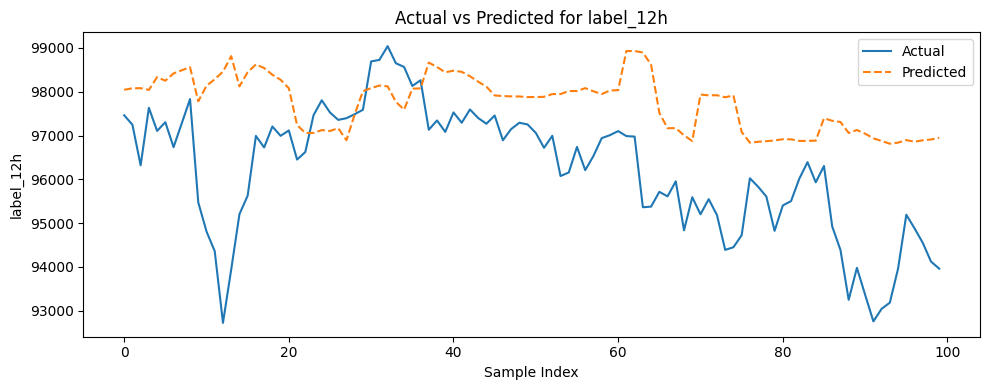


Running RFE for label_1d...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Fitting estimator with 49 features.
Fitting estimator with 33 features.
Selected 30 features for label_1d: ['dxy_data', 'usd_ars', 'vix_index', 'fed_balance_sheet_ret7d', 'google_trends_bitcoin_vol7d', 'oil_price_brent_vol7d', 'qqq_etf_vol7d', 'fed_balance_sheet_z21d', 'HashRate', 'HashRate30d', 'AdrActCnt', 'TxCnt', 'CapMVRVCur', 'SplyAct30d', 'CapMVRVCur_ret1d', 'SplyAct1d_lag1d', 'CapMVRVCur_z1d', 'FlowRatio', 'SplyAct_spread', 'high', 'low', 'close', 'vwap_2h', 'vwap_24h', 'ema_12', 'ema_26', 'macd', 'bb_mid', 'bb_upper', 'bb_lower']
label_1d: RMSE=5152.3712, MAPE=3.86%


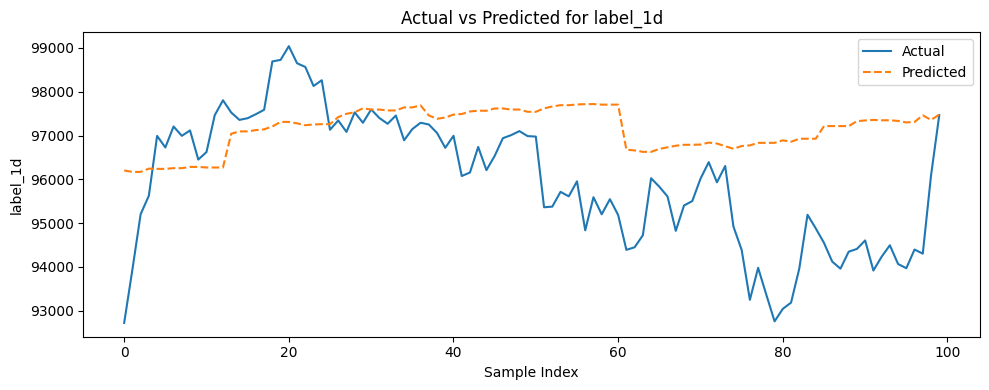


Running RFE for label_3d...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Fitting estimator with 49 features.
Fitting estimator with 33 features.
Selected 30 features for label_3d: ['10y_treasury_yield', 'dxy_data', 'fed_balance_sheet', 'nasdaq_composite', 'qqq_etf', 'usd_ars', 'usd_try', 'vix_index', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'fed_balance_sheet_ret7d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'usd_try_ret7d', 'vix_index_ret7d', 'oil_price_wti_vol7d', 'usd_ars_vol7d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'HashRate30d', 'CapMVRVCur', 'SplyAct30d', 'CapMVRVCur_ret1d', 'SplyAct_spread', 'high', 'low', 'close', 'ema_26', 'bb_upper', 'bb_lower']
label_3d: RMSE=5377.8387, MAPE=4.35%


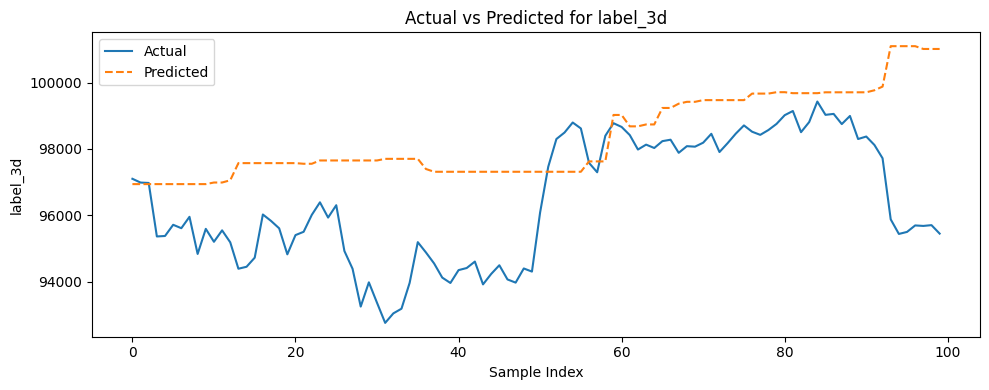


Running RFE for label_7d...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Fitting estimator with 49 features.
Fitting estimator with 33 features.
Selected 30 features for label_7d: ['10y_treasury_yield', 'dxy_data', 'fed_balance_sheet', 'gold_price', 'nasdaq_composite', 'oil_price_brent', 'oil_price_wti', 'qqq_etf', 'usd_ars', 'usd_try', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'fed_balance_sheet_ret7d', 'vix_index_ret7d', 'usd_ars_vol7d', 'usd_try_vol7d', 'vix_index_vol7d', 'vix_index_lag7d', 'cpi_us_lag7d', 'fed_balance_sheet_z21d', 'HashRate30d', 'CapMVRVCur', 'SplyAct7d', 'SplyAct30d', 'high', 'low', 'close', 'ema_26', 'bb_upper', 'bb_lower']
label_7d: RMSE=7749.1637, MAPE=6.76%


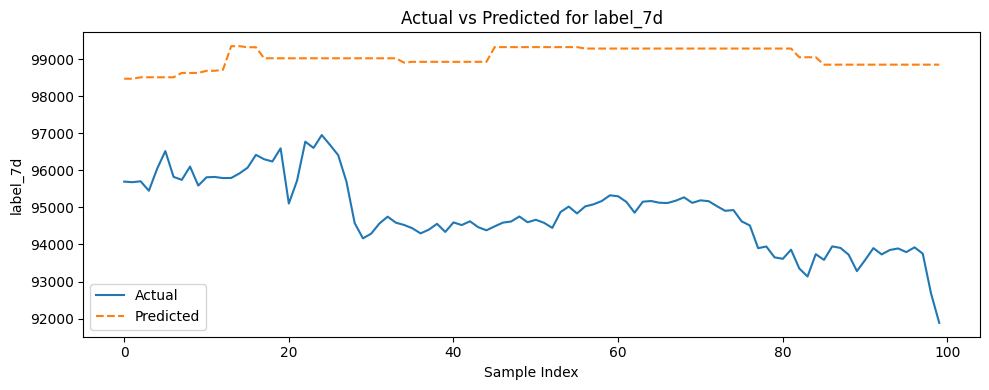


Running RFE for label_15d...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Fitting estimator with 49 features.
Fitting estimator with 33 features.
Selected 30 features for label_15d: ['10y_treasury_yield', 'dxy_data', 'estimated_global_m2', 'fed_balance_sheet', 'gold_price', 'nasdaq_composite', 'oil_price_brent', 'qqq_etf', 'usd_ars', 'usd_try', 'vix_index', '10y_treasury_yield_ret7d', 'fed_balance_sheet_ret7d', 'usd_try_ret7d', 'vix_index_ret7d', 'google_trends_bitcoin_vol7d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'usd_ars_vol7d', 'vix_index_vol7d', 'vix_index_lag7d', 'fed_balance_sheet_z21d', 'HashRate30d', 'CapMVRVCur', 'SplyAct7d', 'SplyAct30d', 'high', 'ema_12', 'ema_26', 'bb_upper']
label_15d: RMSE=7678.2117, MAPE=6.79%


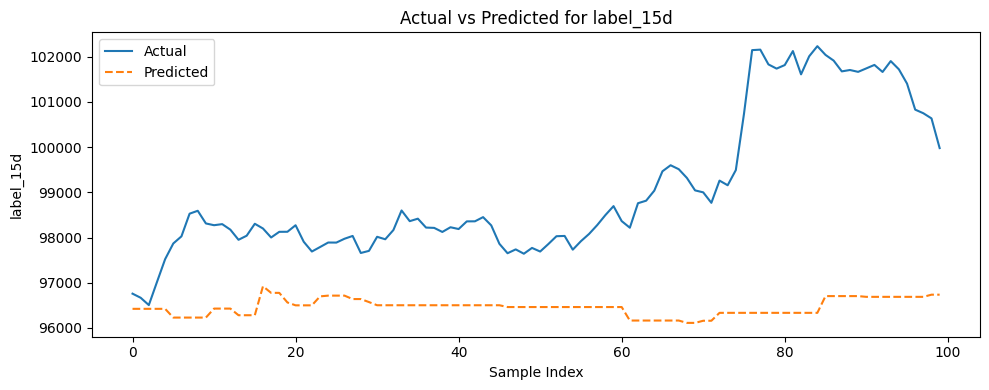


Running RFE for label_30d...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Fitting estimator with 49 features.
Fitting estimator with 33 features.
Selected 30 features for label_30d: ['10y_treasury_yield', 'dxy_data', 'estimated_global_m2', 'fed_balance_sheet', 'gold_price', 'nasdaq_composite', 'oil_price_brent', 'oil_price_wti', 'qqq_etf', 'usd_ars', 'usd_try', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'fed_balance_sheet_ret7d', 'oil_price_brent_ret7d', 'google_trends_bitcoin_vol7d', 'usd_ars_vol7d', 'usd_try_vol7d', 'vix_index_vol7d', 'vix_index_lag7d', 'fed_funds_rate_lag7d', 'cpi_us_lag7d', 'fed_balance_sheet_z21d', 'HashRate30d', 'FeeMeanUSD', 'CapMVRVCur', 'SplyAct30d', 'ema_26', 'bb_upper', 'bb_lower']
label_30d: RMSE=9384.5881, MAPE=9.01%


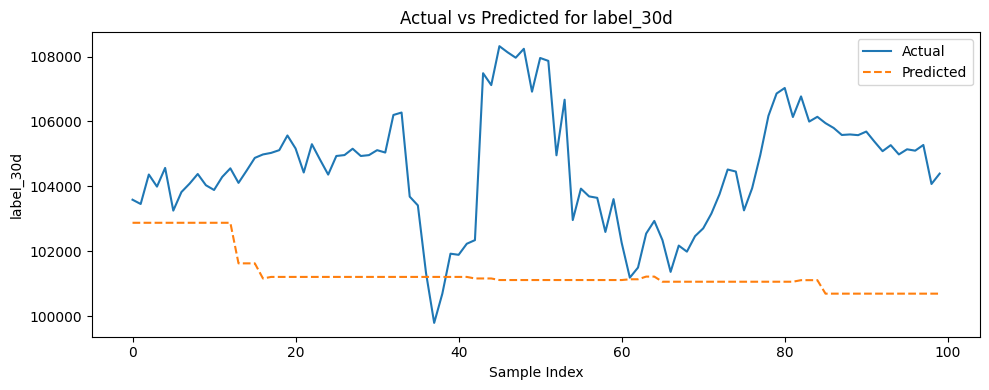

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.feature_selection import RFE

# Paths & parameters
TRAIN_CSV = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV   = '/kaggle/input/data-btc/fix/val.csv'
horizons = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
labels   = [f'label_{h}' for h in horizons]

# 1. Load datasets
df_tr = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va = pd.read_csv(VAL_CSV, parse_dates=['timestamp'])

# 2. Drop non-feature columns
df_tr.drop(columns=['timestamp','close_time'], inplace=True)
df_va.drop(columns=['timestamp','close_time'], inplace=True)

# 3. Define features (exclude all labels)
features = [c for c in df_tr.columns if c not in labels]

# 4. Wrapper Method - Recursive Feature Elimination per horizon
results = {}
for label in labels:
    print(f"\nRunning RFE for {label}...")
    # Prepare data
    default_tr = df_tr.copy()
    default_va = df_va.copy()
    X_tr, y_tr = default_tr[features], default_tr[label]
    
    # Define estimator for RFE
    base_estimator = LGBMRegressor(
        objective='regression',
        n_estimators=100,
        learning_rate=0.05,
        random_state=42
    )
    # Select top k features (e.g. 30) via RFE
    n_select = min(30, len(features))  # choose up to 30 features
    selector = RFE(estimator=base_estimator, n_features_to_select=n_select, step=0.1, verbose=1)
    selector.fit(X_tr, y_tr)

    # Get selected feature names
    features_selected = [f for f, support in zip(features, selector.support_) if support]
    print(f"Selected {len(features_selected)} features for {label}: {features_selected}")

    # Train model with selected features
    model = LGBMRegressor(
        objective='regression',
        n_estimators=200,
        learning_rate=0.05,
        random_state=42
    )
    model.fit(
        default_tr[features_selected], default_tr[label],
        eval_set=[(default_va[features_selected], default_va[label])],
        eval_metric='rmse'
    )

    # Predict & evaluate
    y_pred = model.predict(default_va[features_selected])
    rmse = mean_squared_error(default_va[label], y_pred, squared=False)
    mape = mean_absolute_percentage_error(default_va[label], y_pred) * 100
    print(f"{label}: RMSE={rmse:.4f}, MAPE={mape:.2f}%")
    results[label] = {'true': default_va[label].values, 'pred': y_pred}

    # Plot actual vs predicted
    plt.figure(figsize=(10,4))
    plt.plot(default_va[label].values[:100], label='Actual')
    plt.plot(y_pred[:100], '--', label='Predicted')
    plt.title(f'Actual vs Predicted for {label}')
    plt.xlabel('Sample Index')
    plt.ylabel(label)
    plt.legend()
    plt.tight_layout()
    plt.show()

Embedded Feature Selection


Embedded feature selection for label_1h
Selected top 30 features: ['close', 'high', 'low', 'vwap_2h', 'CapMVRVCur_ret1d', 'ema_12', 'bb_upper', 'bb_lower', 'close_ret1h', 'vwap_24h', 'fed_balance_sheet', 'ema_26', 'bb_mid', 'close_z_24h', 'CapMVRVCur', 'nasdaq_composite_vol7d', 'fed_balance_sheet_z21d', 'usd_ars_vol7d', 'ret_mean_6h', 'vix_index_vol7d', 'oil_price_brent_vol7d', 'qqq_etf_vol7d', 'close_diff1h', 'rsi_14', 'HashRate30d', 'macd', 'ret_mean_24h', 'vix_index_ret7d', 'body', 'open']

label_1h: RMSE=3988.1225, MAPE=2.98%


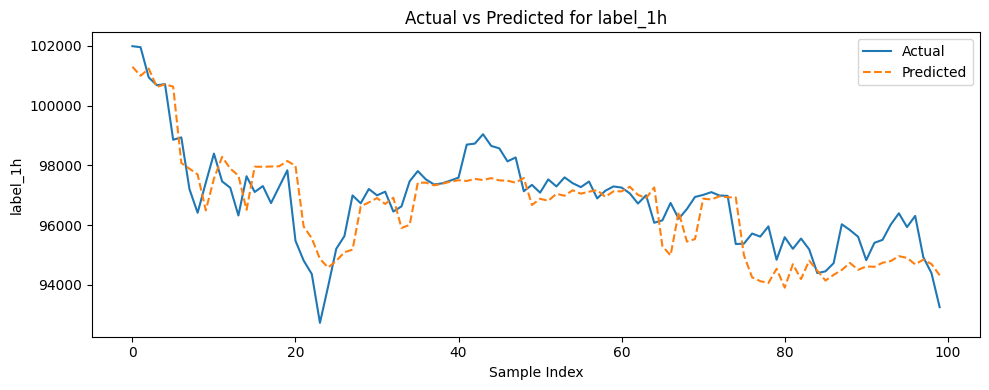


Embedded feature selection for label_2h
Selected top 30 features: ['close', 'CapMVRVCur_ret1d', 'high', 'low', 'vwap_2h', 'ema_12', 'bb_lower', 'bb_upper', 'vwap_24h', 'ema_26', 'bb_mid', 'CapMVRVCur_z1d', 'CapMVRVCur', 'fed_balance_sheet', 'usd_ars_vol7d', 'nasdaq_composite_vol7d', 'bb_std', 'oil_price_brent_vol7d', 'open', 'HashRate30d', 'ret_mean_6h', 'vix_index_ret7d', 'fed_balance_sheet_z21d', 'qqq_etf_vol7d', 'cpi_us_lag7d', 'vix_index_vol7d', 'ret_mean_24h', 'macd', 'close_ret1h', 'body_ratio']

label_2h: RMSE=4154.8272, MAPE=3.16%


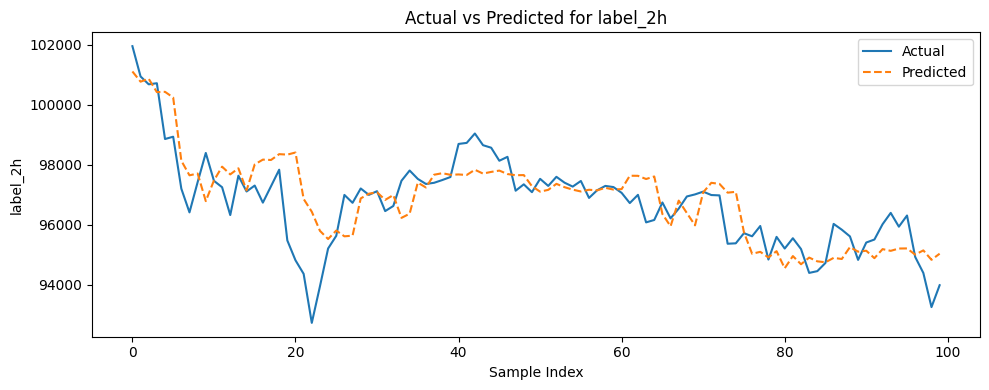


Embedded feature selection for label_3h
Selected top 30 features: ['close', 'CapMVRVCur_ret1d', 'high', 'vwap_2h', 'low', 'ema_12', 'bb_upper', 'bb_lower', 'vwap_24h', 'bb_mid', 'CapMVRVCur_z1d', 'ema_26', 'CapMVRVCur', 'ret_mean_24h', 'open', 'nasdaq_composite_vol7d', 'fed_balance_sheet', 'oil_price_brent_vol7d', 'usd_ars_vol7d', 'vix_index_vol7d', 'HashRate30d', 'SplyAct30d', 'google_trends_bitcoin_ret7d', 'macd', 'cpi_us_lag7d', 'vol_mean_24h', '10y_treasury_yield_vol7d', 'vix_index_ret7d', 'qqq_etf_vol7d', 'fed_balance_sheet_z21d']

label_3h: RMSE=5548.8608, MAPE=4.39%


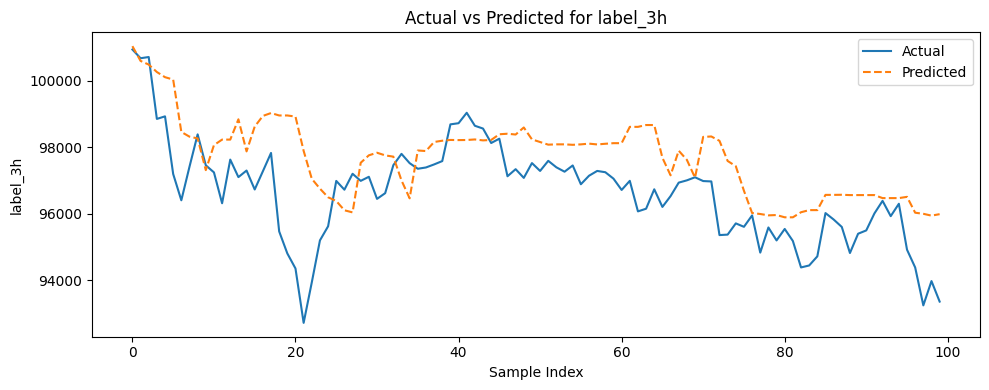


Embedded feature selection for label_6h
Selected top 30 features: ['CapMVRVCur_ret1d', 'close', 'high', 'vwap_2h', 'low', 'ema_12', 'bb_upper', 'bb_lower', 'vwap_24h', 'ema_26', 'CapMVRVCur', 'CapMVRVCur_z1d', 'bb_mid', 'hour_cos', 'open', 'macd', 'google_trends_bitcoin_ret7d', 'ret_mean_24h', 'google_trends_bitcoin_ret1d', 'HashRate30d', 'fed_balance_sheet', 'bb_std', 'vix_index_vol7d', 'vix_index_ret7d', 'vol_mean_24h', 'macd_signal', 'SplyAct30d', 'HashRate', 'usd_ars_vol7d', 'usd_try_ret7d']

label_6h: RMSE=4619.6420, MAPE=3.68%


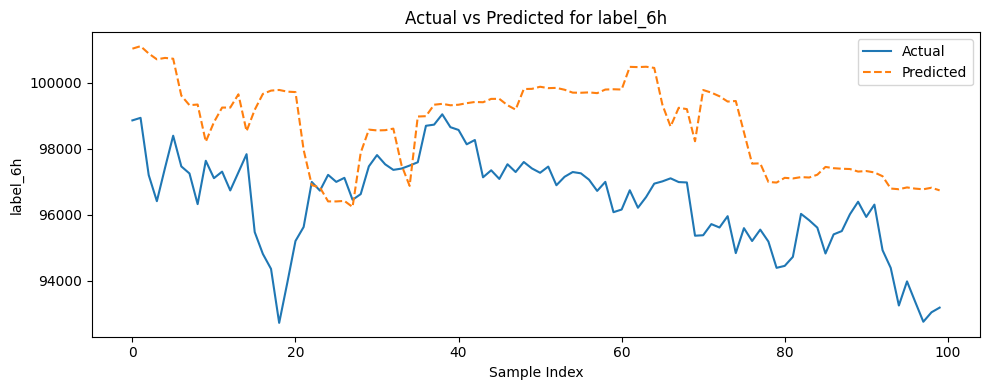


Embedded feature selection for label_12h
Selected top 30 features: ['CapMVRVCur_ret1d', 'close', 'high', 'low', 'vwap_2h', 'bb_upper', 'vwap_24h', 'CapMVRVCur_z1d', 'CapMVRVCur', 'ema_26', 'bb_lower', 'ema_12', 'bb_mid', 'ret_mean_24h', 'HashRate30d', 'fed_balance_sheet_z21d', 'SplyAct30d', 'macd_signal', 'google_trends_bitcoin_ret1d', 'vix_index_ret7d', 'usd_ars', 'FlowInExUSD', 'google_trends_bitcoin_vol7d', 'oil_price_brent_vol7d', 'qqq_etf_vol7d', 'open', 'close_z_24h', 'bb_std', 'macd', '10y_treasury_yield']

label_12h: RMSE=5757.0770, MAPE=4.73%


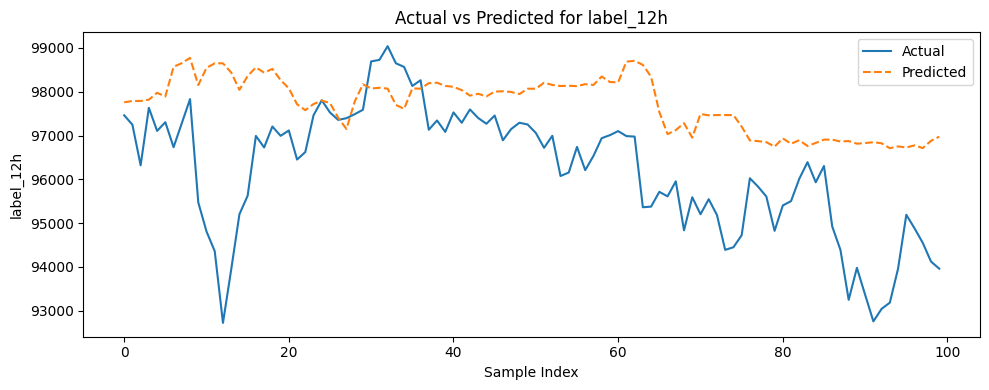


Embedded feature selection for label_1d
Selected top 30 features: ['CapMVRVCur_ret1d', 'close', 'high', 'CapMVRVCur', 'CapMVRVCur_z1d', 'vwap_24h', 'ema_26', 'bb_upper', 'bb_lower', 'low', 'vwap_2h', 'ema_12', 'bb_mid', 'usd_ars', 'SplyAct30d', 'dxy_data', 'TxCnt', 'AdrActCnt', 'HashRate30d', 'macd', 'fed_balance_sheet_z21d', 'SplyAct_spread', 'google_trends_bitcoin_vol7d', 'HashRate', 'fed_balance_sheet_ret7d', 'FlowInExUSD', 'qqq_etf_vol7d', '10y_treasury_yield', '10y_treasury_yield_vol7d', 'cpi_us_lag7d']

label_1d: RMSE=9375.7827, MAPE=7.55%


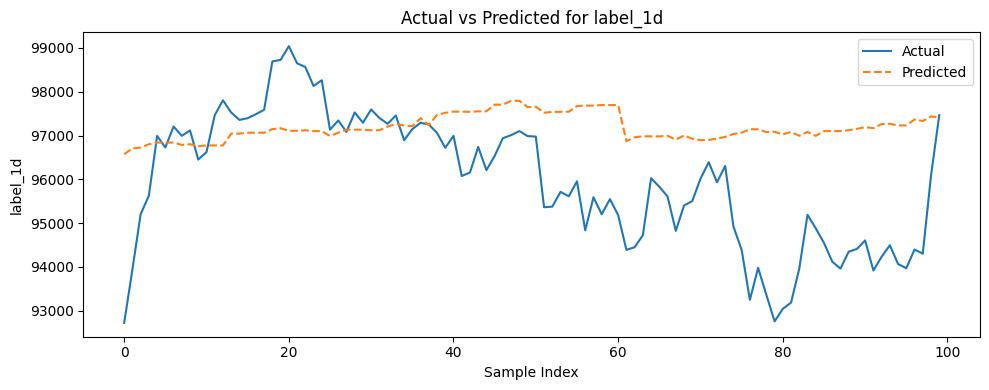


Embedded feature selection for label_3d
Selected top 30 features: ['CapMVRVCur_ret1d', 'high', 'bb_upper', '10y_treasury_yield_ret7d', 'dxy_data', 'bb_lower', 'CapMVRVCur', '10y_treasury_yield', 'fed_balance_sheet_ret7d', 'close', 'low', 'HashRate30d', 'ema_26', 'usd_try', 'usd_try_ret7d', 'vwap_2h', 'nasdaq_composite_ret7d', 'SplyAct30d', 'ema_12', 'nasdaq_composite', 'vix_index_vol7d', 'vix_index_ret7d', 'usd_ars', 'qqq_etf', 'oil_price_wti_vol7d', 'vwap_24h', 'fed_balance_sheet', 'vix_index_lag7d', 'dxy_data_ret7d', 'SplyAct_spread']

label_3d: RMSE=5433.2213, MAPE=4.40%


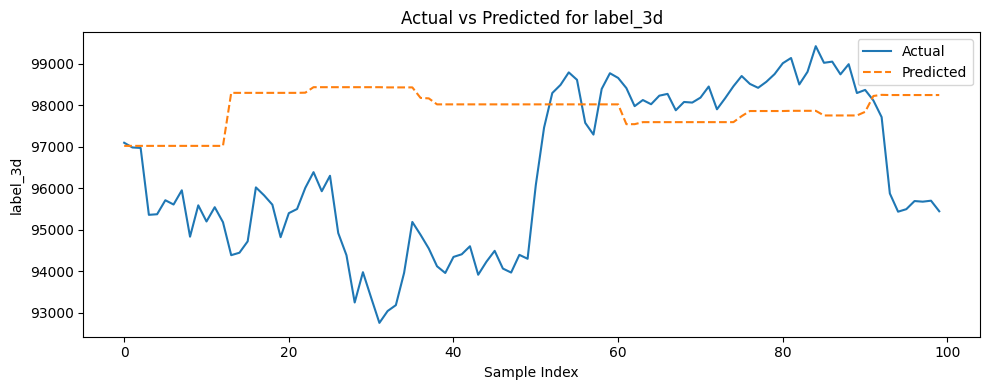


Embedded feature selection for label_7d
Selected top 30 features: ['fed_balance_sheet', 'dxy_data', '10y_treasury_yield', 'fed_balance_sheet_ret7d', 'HashRate30d', 'nasdaq_composite', 'bb_upper', 'usd_try', 'ema_26', 'high', 'usd_ars_vol7d', '10y_treasury_yield_ret7d', 'gold_price', 'CapMVRVCur', 'cpi_us_lag7d', 'qqq_etf', 'oil_price_brent', 'usd_ars', 'vix_index_ret7d', 'SplyAct30d', 'bb_lower', 'CapMVRVCur_ret1d', 'vix_index_lag7d', 'close', 'low', 'SplyAct7d', 'usd_try_ret7d', 'vix_index_vol7d', 'dxy_data_ret7d', 'oil_price_wti_vol7d']

label_7d: RMSE=8242.4459, MAPE=7.54%


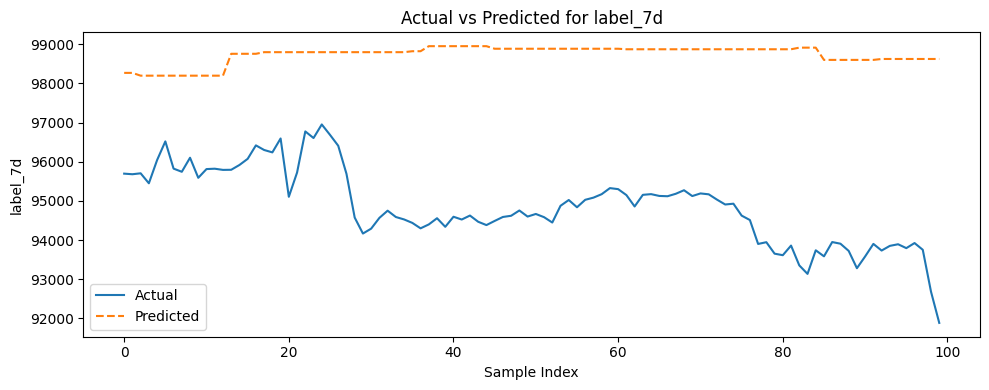


Embedded feature selection for label_15d
Selected top 30 features: ['usd_ars', 'HashRate30d', 'fed_balance_sheet', 'SplyAct30d', 'usd_try', 'gold_price', 'vix_index_vol7d', 'dxy_data', 'qqq_etf', '10y_treasury_yield_ret7d', 'oil_price_brent', 'bb_upper', 'nasdaq_composite', 'google_trends_bitcoin_vol7d', 'CapMVRVCur', 'ema_26', 'usd_ars_vol7d', 'fed_balance_sheet_ret7d', 'estimated_global_m2', '10y_treasury_yield', 'oil_price_wti_vol7d', 'fed_balance_sheet_z21d', 'usd_try_ret7d', 'oil_price_brent_vol7d', 'vix_index_lag7d', 'vix_index', 'ema_12', 'dxy_data_ret7d', 'cpi_us_lag7d', 'vix_index_ret7d']

label_15d: RMSE=7679.1015, MAPE=6.81%


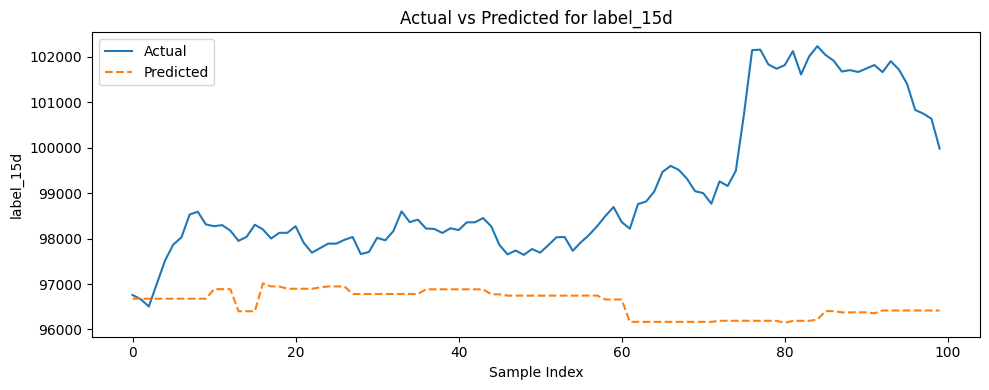


Embedded feature selection for label_30d
Selected top 30 features: ['usd_ars', 'fed_balance_sheet', 'HashRate30d', 'gold_price', 'google_trends_bitcoin_vol7d', 'nasdaq_composite', '10y_treasury_yield', 'dxy_data', 'usd_try', 'SplyAct30d', 'estimated_global_m2', 'usd_try_vol7d', 'usd_ars_vol7d', 'ema_26', 'CapMVRVCur', 'qqq_etf', 'bb_lower', 'oil_price_wti', 'fed_balance_sheet_ret7d', 'cpi_us_lag7d', 'oil_price_brent', 'FeeMeanUSD', 'vix_index_lag7d', 'bb_upper', 'fed_balance_sheet_z21d', 'fed_funds_rate_lag7d', 'oil_price_brent_vol7d', 'vix_index_vol7d', '10y_treasury_yield_ret7d', 'dxy_data_ret7d']

label_30d: RMSE=9945.5716, MAPE=9.61%


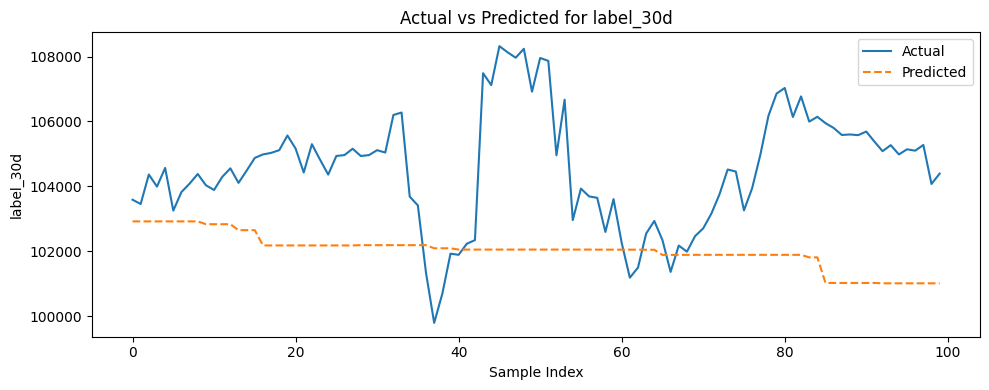

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

# Paths & parameters
TRAIN_CSV = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV   = '/kaggle/input/data-btc/fix/val.csv'
horizons = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
labels    = [f'label_{h}' for h in horizons]

# 1. Load data
df_tr = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va = pd.read_csv(VAL_CSV, parse_dates=['timestamp'])

# 2. Drop non-feature columns
df_tr.drop(columns=['timestamp','close_time'], inplace=True)
df_va.drop(columns=['timestamp','close_time'], inplace=True)

# 3. Define features
features = [c for c in df_tr.columns if c not in labels]

# 4. Embedded Method - Feature Importance from LightGBM
results = {}
for label in labels:
    print(f"\nEmbedded feature selection for {label}")
    # Prepare training and validation sets
    X_tr, y_tr = df_tr[features], df_tr[label]
    X_va, y_va = df_va[features], df_va[label]

    # Train initial model to get feature importances
    init_model = LGBMRegressor(
        objective='regression',
        n_estimators=100,
        learning_rate=0.05,
        random_state=42
    )
    init_model.fit(
        X_tr, y_tr,
        eval_set=[(X_va, y_va)],
        eval_metric='rmse'
    )

    # Get top features by importance
    importances = init_model.feature_importances_
    idx_sorted = np.argsort(importances)[::-1]
    n_select = min(30, len(features))  # top 30 features
    selected_idx = idx_sorted[:n_select]
    features_selected = [features[i] for i in selected_idx]
    print(f"Selected top {n_select} features: {features_selected}\n")

    # Train final model on selected features
    model = LGBMRegressor(
        objective='regression',
        n_estimators=200,
        learning_rate=0.05,
        random_state=42
    )
    model.fit(
        X_tr[features_selected], y_tr,
        eval_set=[(X_va[features_selected], y_va)],
        eval_metric='rmse'
    )

    # Predict & evaluate
    y_pred = model.predict(X_va[features_selected])
    rmse = mean_squared_error(y_va, y_pred, squared=False)
    mape = mean_absolute_percentage_error(y_va, y_pred) * 100
    print(f"{label}: RMSE={rmse:.4f}, MAPE={mape:.2f}%")
    results[label] = {'true': y_va.values, 'pred': y_pred}

    # Plot results
    plt.figure(figsize=(10,4))
    plt.plot(y_va.values[:100], label='Actual')
    plt.plot(y_pred[:100], '--', label='Predicted')
    plt.title(f'Actual vs Predicted for {label}')
    plt.xlabel('Sample Index')
    plt.ylabel(label)
    plt.legend()
    plt.tight_layout()
    plt.show()


Pra-Pemrosesan Temporal menggunakan STL decomposition


Processing label_1h with STL decomposition...
label_1h: RMSE=9945.5716, MAPE=0.95%


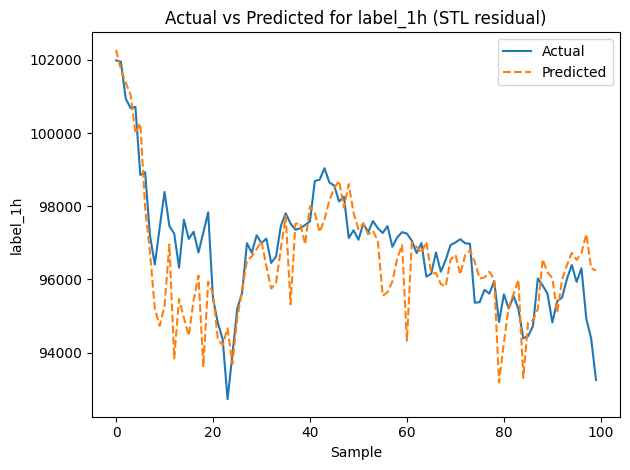


Processing label_2h with STL decomposition...
label_2h: RMSE=9945.5716, MAPE=1.00%


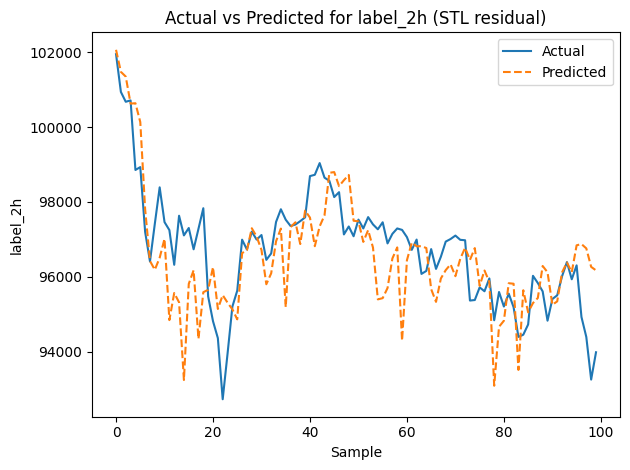


Processing label_3h with STL decomposition...
label_3h: RMSE=9945.5716, MAPE=1.02%


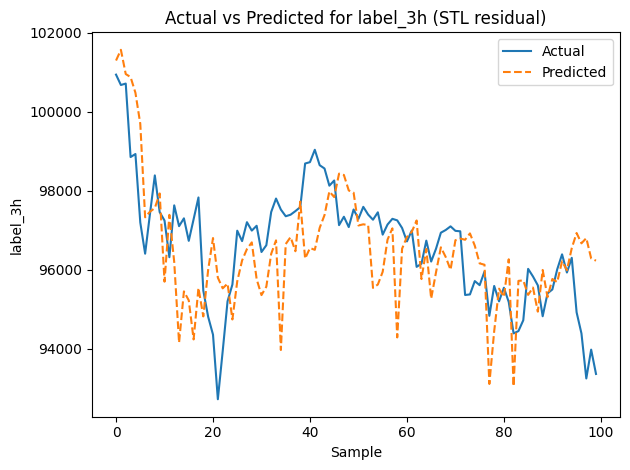


Processing label_6h with STL decomposition...
label_6h: RMSE=9945.5716, MAPE=1.11%


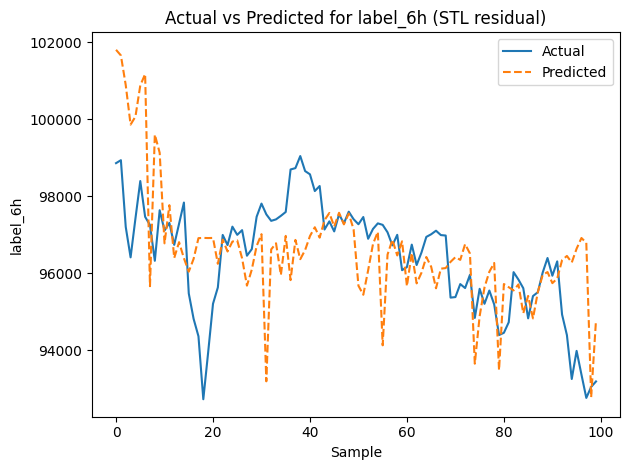


Processing label_12h with STL decomposition...
label_12h: RMSE=9945.5716, MAPE=1.05%


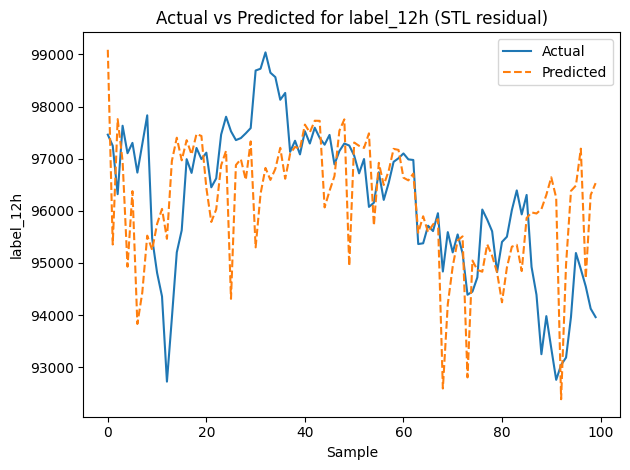


Processing label_1d with STL decomposition...
label_1d: RMSE=9945.5716, MAPE=1.21%


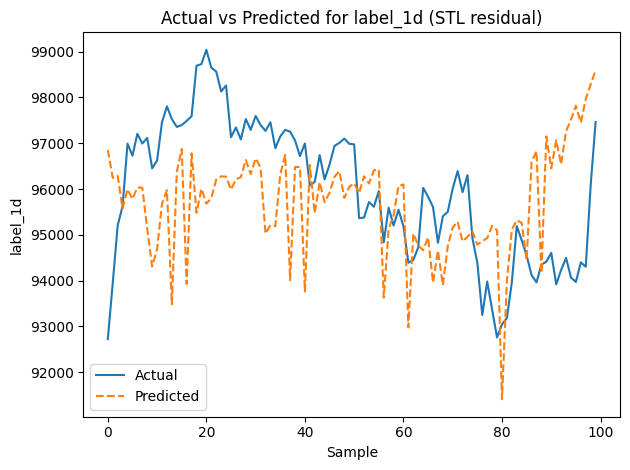


Processing label_3d with STL decomposition...
label_3d: RMSE=9945.5716, MAPE=1.15%


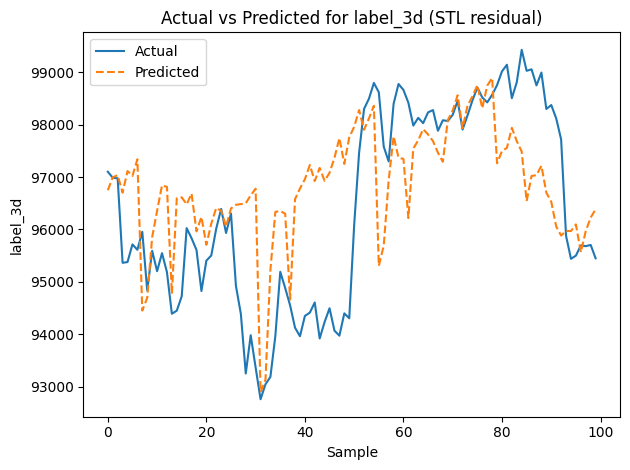


Processing label_7d with STL decomposition...
label_7d: RMSE=9945.5716, MAPE=1.26%


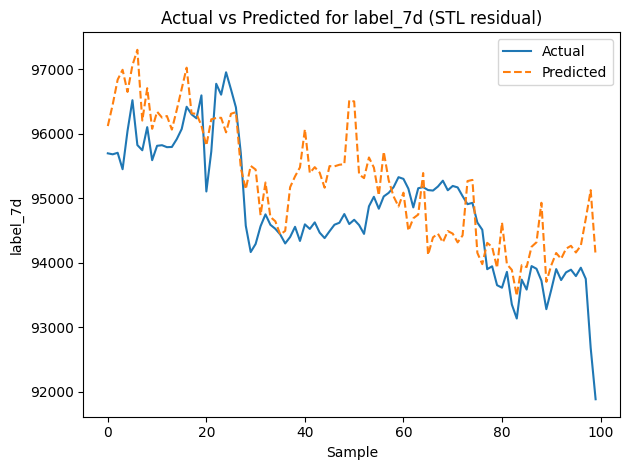


Processing label_15d with STL decomposition...
label_15d: RMSE=9945.5716, MAPE=1.11%


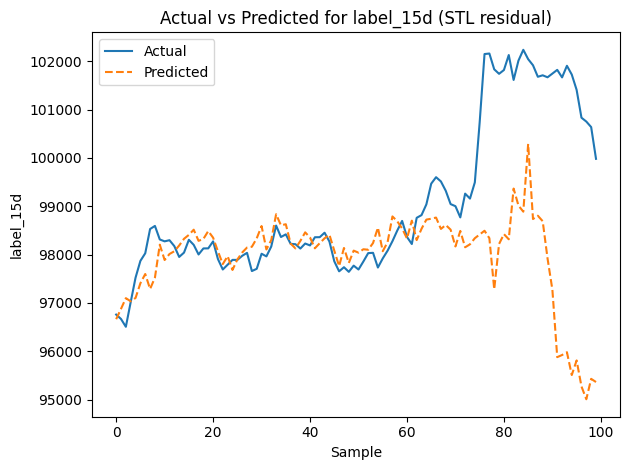


Processing label_30d with STL decomposition...
label_30d: RMSE=9945.5716, MAPE=1.19%


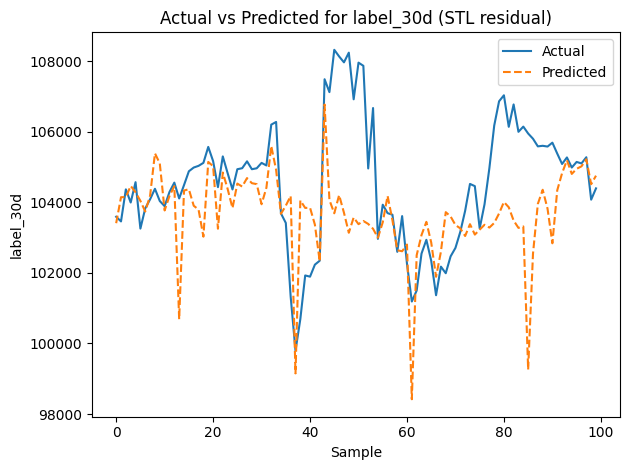

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from statsmodels.tsa.seasonal import STL

# Paths & parameters
TRAIN_CSV = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV   = '/kaggle/input/data-btc/fix/val.csv'

horizons = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
labels   = [f'label_{h}' for h in horizons]

# 1. Load data
df_tr = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])
# Combine for decomposition
df_all = pd.concat([df_tr, df_va], ignore_index=True)

# 2. Drop metadata
for df in [df_all]:
    df.drop(columns=['timestamp','close_time'], inplace=True)

# 3. Define features (exclude all labels)
features = [c for c in df_all.columns if c not in labels]

# 4. Split combined X
df_X = df_all[features]
N_tr = len(df_tr)
X_tr = df_X.iloc[:N_tr]
X_va = df_X.iloc[N_tr:]

# 5. STL-based detrending & deseasonalizing per horizon
results = {}
for label in labels:
    print(f"\nProcessing {label} with STL decomposition...")
    series = df_all[label]
    # Decompose: period=24 for hourly seasonality
    stl = STL(series, period=24, robust=True)
    res = stl.fit()
    trend    = res.trend
    seasonal = res.seasonal
    resid    = res.resid

    # Prepare targets: residual fitting
    y_tr_resid = resid.iloc[:N_tr].values
    y_va_resid = resid.iloc[N_tr:].values

    # 6. Train model on residuals
    model = LGBMRegressor(
        objective='regression',
        n_estimators=200,
        learning_rate=0.05,
        random_state=42
    )
    model.fit(
        X_tr, y_tr_resid,
        eval_set=[(X_va, y_va_resid)],
        eval_metric='rmse'
    )

    # 7. Predict residuals and reconstruct
    resid_pred = model.predict(X_va)
    y_pred     = resid_pred + trend.iloc[N_tr:].values + seasonal.iloc[N_tr:].values
    y_true     = series.iloc[N_tr:].values

    # 8. Evaluate\ n    rmse = mean_squared_error(y_true, y_pred, squared=False)
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100
    print(f"{label}: RMSE={rmse:.4f}, MAPE={mape:.2f}%")
    results[label] = {'true': y_true, 'pred': y_pred}

    # 9. Plot actual vs predicted\ n    plt.figure(figsize=(10,4))
    plt.plot(y_true[:100], label='Actual')
    plt.plot(y_pred[:100], '--', label='Predicted')
    plt.title(f'Actual vs Predicted for {label} (STL residual)')
    plt.xlabel('Sample')
    plt.ylabel(label)
    plt.legend()
    plt.tight_layout()
    plt.show()


STL + WRAPPER(60)


=== Processing label_1h with STL + RFE ===
Running RFE to select top 60 features for label_1h...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Selected 100 features: ['10y_treasury_yield', 'dxy_data', 'fed_balance_sheet', 'google_trends_bitcoin', 'nasdaq_composite', 'oil_price_brent', 'oil_price_wti', 'qqq_etf', 'usd_try', 'vix_index', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'fed_balance_sheet_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'oil_price_brent_ret7d', 'oil_price_wti_ret7d', 'qqq_etf_ret7d', 'usd_ars_ret1d', 'usd_ars_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol1d', '10y_treasury_yield_vol7d', 'dxy_data_vol1d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol1d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol7d', 'usd_ars_vo

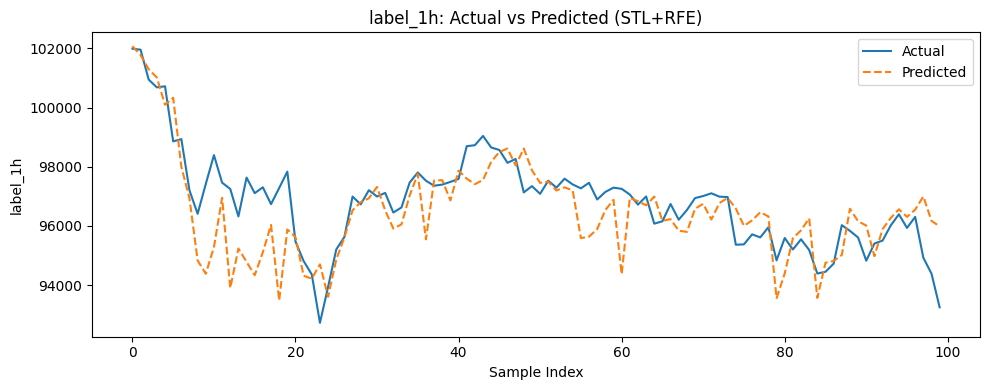


=== Processing label_2h with STL + RFE ===
Running RFE to select top 60 features for label_2h...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Selected 100 features: ['10y_treasury_yield', 'dxy_data', 'fed_balance_sheet', 'google_trends_bitcoin', 'nasdaq_composite', 'oil_price_brent', 'qqq_etf', 'usd_ars', 'usd_try', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'fed_balance_sheet_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'oil_price_brent_ret7d', 'oil_price_wti_ret7d', 'qqq_etf_ret7d', 'usd_ars_ret1d', 'usd_ars_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'dxy_data_vol1d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol1d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol1d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol1d', 'qqq_etf_vol7d', 'usd_ars_v

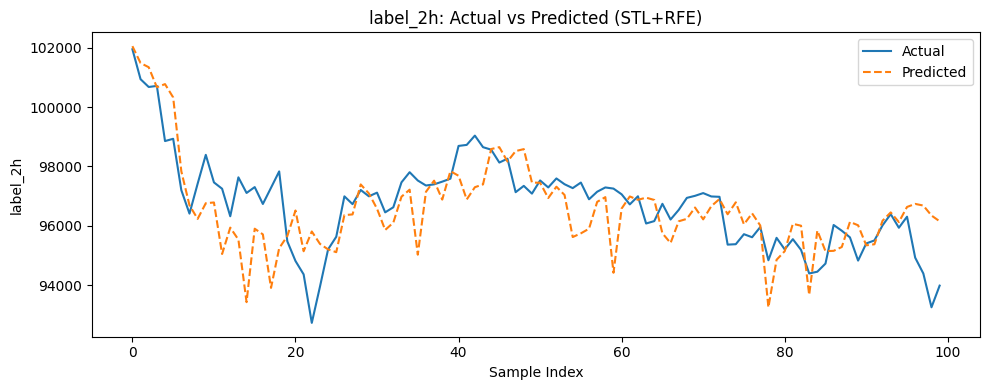


=== Processing label_3h with STL + RFE ===
Running RFE to select top 60 features for label_3h...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Selected 100 features: ['10y_treasury_yield', 'dxy_data', 'gold_price', 'google_trends_bitcoin', 'nasdaq_composite', 'oil_price_brent', 'usd_ars', 'usd_try', 'vix_index', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'fed_balance_sheet_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'oil_price_brent_ret7d', 'oil_price_wti_ret7d', 'qqq_etf_ret7d', 'usd_ars_ret1d', 'usd_ars_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'dxy_data_vol1d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol1d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol1d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol1d', 'oil_price_brent_vol7d', 'oil_price_wti_

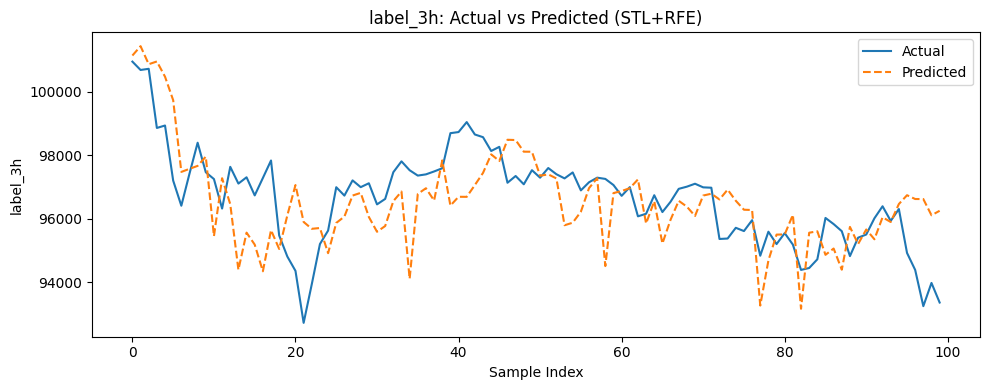


=== Processing label_6h with STL + RFE ===
Running RFE to select top 60 features for label_6h...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Selected 100 features: ['10y_treasury_yield', 'dxy_data', 'fed_balance_sheet', 'google_trends_bitcoin', 'nasdaq_composite', 'oil_price_wti', 'qqq_etf', 'usd_try', 'vix_index', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'fed_balance_sheet_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'oil_price_brent_ret7d', 'oil_price_wti_ret7d', 'qqq_etf_ret7d', 'usd_ars_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'dxy_data_vol1d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol1d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol1d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol1d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq

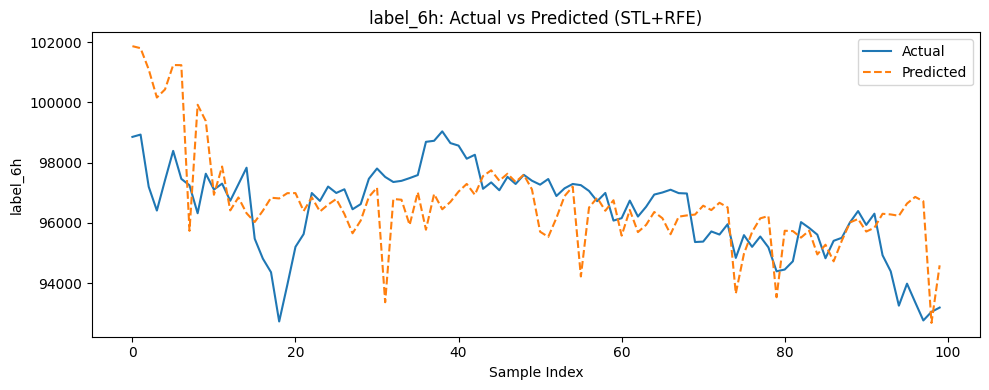


=== Processing label_12h with STL + RFE ===
Running RFE to select top 60 features for label_12h...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Selected 100 features: ['10y_treasury_yield', 'dxy_data', 'gold_price', 'google_trends_bitcoin', 'nasdaq_composite', 'oil_price_wti', 'qqq_etf', 'usd_try', 'vix_index', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'fed_balance_sheet_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'oil_price_brent_ret7d', 'oil_price_wti_ret7d', 'qqq_etf_ret7d', 'usd_ars_ret1d', 'usd_ars_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol1d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol1d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol1d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_v

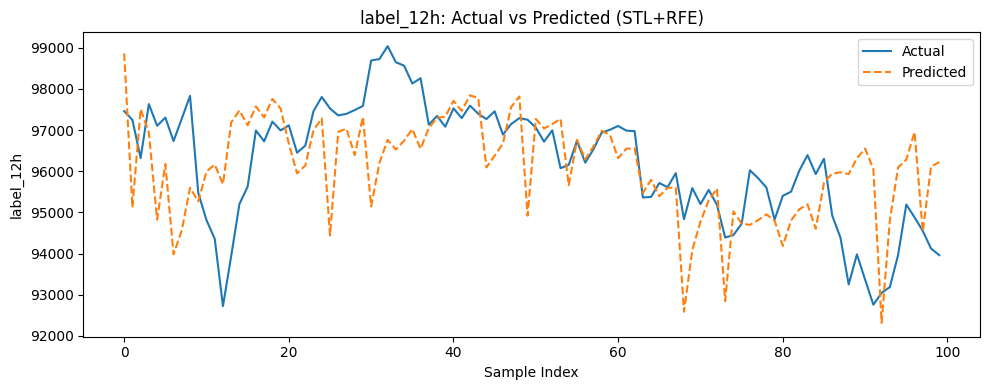


=== Processing label_1d with STL + RFE ===
Running RFE to select top 60 features for label_1d...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Selected 100 features: ['10y_treasury_yield', 'dxy_data', 'fed_funds_rate', 'google_trends_bitcoin', 'nasdaq_composite', 'oil_price_brent', 'qqq_etf', 'usd_ars', 'usd_try', 'vix_index', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'fed_balance_sheet_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'oil_price_brent_ret7d', 'oil_price_wti_ret7d', 'qqq_etf_ret7d', 'usd_ars_ret1d', 'usd_ars_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol1d', '10y_treasury_yield_vol7d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol1d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol1d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'oil_price_wti_

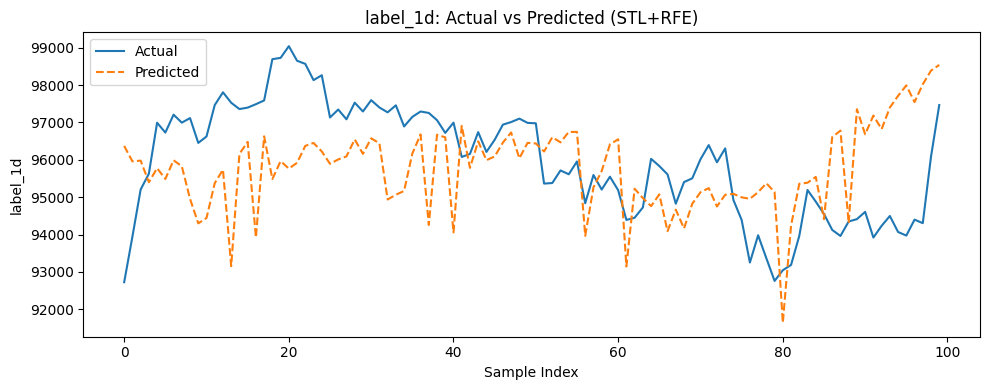


=== Processing label_3d with STL + RFE ===
Running RFE to select top 60 features for label_3d...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Selected 100 features: ['10y_treasury_yield', 'dxy_data', 'google_trends_bitcoin', 'nasdaq_composite', 'oil_price_brent', 'oil_price_wti', 'qqq_etf', 'usd_try', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'fed_balance_sheet_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'oil_price_brent_ret7d', 'oil_price_wti_ret7d', 'qqq_etf_ret7d', 'usd_ars_ret1d', 'usd_ars_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol1d', '10y_treasury_yield_vol7d', 'dxy_data_vol1d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol1d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol1d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol1d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 

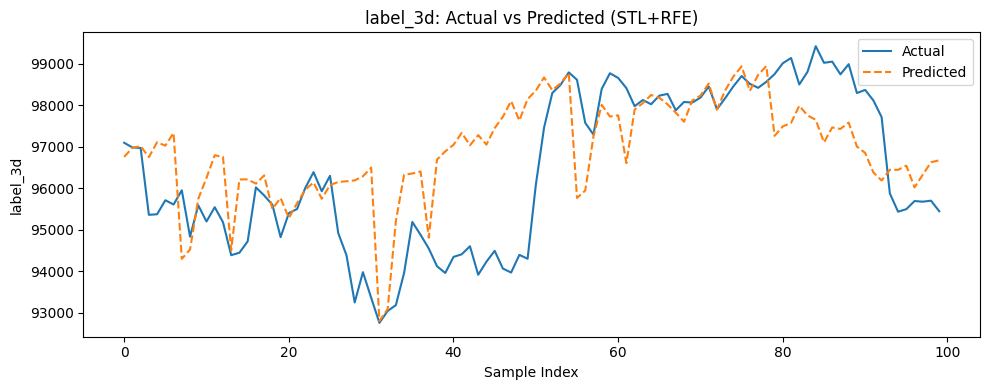


=== Processing label_7d with STL + RFE ===
Running RFE to select top 60 features for label_7d...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Selected 100 features: ['dxy_data', 'google_trends_bitcoin', 'nasdaq_composite', 'oil_price_brent', 'oil_price_wti', 'usd_try', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'qqq_etf_ret7d', 'usd_ars_ret1d', 'usd_ars_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol1d', '10y_treasury_yield_vol7d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol1d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol1d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol1d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol1d', 'qqq_etf_vol7d', 'usd_ars_vol1d', 'usd_ars_vol7d', 'usd_try_vol7d', 'vix_index_vol1

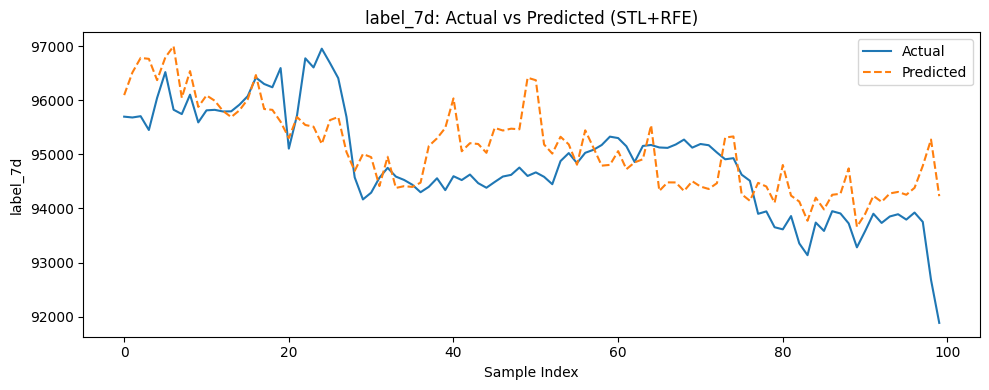


=== Processing label_15d with STL + RFE ===
Running RFE to select top 60 features for label_15d...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Selected 100 features: ['10y_treasury_yield', 'dxy_data', 'fed_balance_sheet', 'google_trends_bitcoin', 'nasdaq_composite', 'oil_price_brent', 'oil_price_wti', 'qqq_etf', 'vix_index', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'fed_balance_sheet_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'oil_price_brent_ret7d', 'oil_price_wti_ret7d', 'qqq_etf_ret7d', 'usd_ars_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol1d', '10y_treasury_yield_vol7d', 'dxy_data_vol1d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol1d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol1d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'oil_price_wti

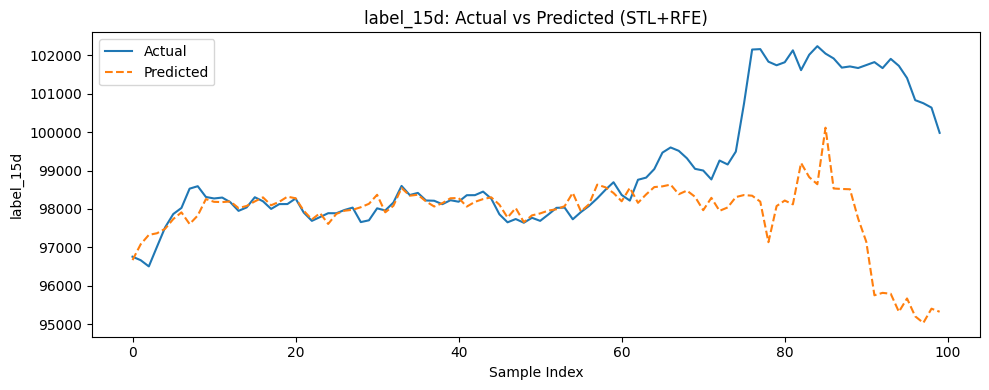


=== Processing label_30d with STL + RFE ===
Running RFE to select top 60 features for label_30d...
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Selected 100 features: ['10y_treasury_yield', 'dxy_data', 'estimated_global_m2', 'fed_funds_rate', 'gold_price', 'google_trends_bitcoin', 'nasdaq_composite', 'oil_price_brent', 'qqq_etf', 'usd_try', 'vix_index', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'oil_price_brent_ret7d', 'oil_price_wti_ret7d', 'qqq_etf_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'dxy_data_vol1d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol1d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol1d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol1d', '

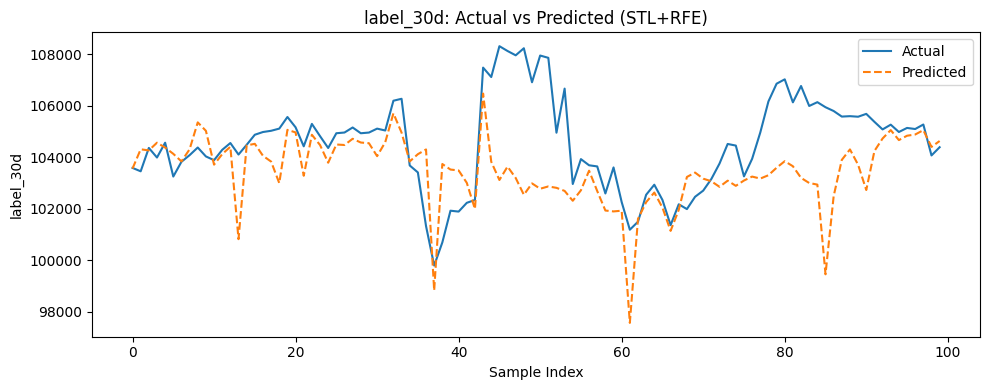

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL
from lightgbm import LGBMRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

# Paths & parameters
TRAIN_CSV = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV   = '/kaggle/input/data-btc/fix/val.csv'
horizons = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
labels    = [f'label_{h}' for h in horizons]
WINDOW_SEASON = 24  # period for STL seasonal component (e.g., daily seasonality)

# 1. Load data
df_tr = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])
df_all = pd.concat([df_tr, df_va], ignore_index=True)

# 2. Drop metadata columns
for df in [df_all, df_tr, df_va]:
    df.drop(columns=['timestamp','close_time'], inplace=True)

# 3. Define exogenous features (exclude all label columns)
features = [c for c in df_all.columns if not c.startswith('label_')]

results = {}
# 4. Loop through each horizon
for label in labels:
    print(f"\n=== Processing {label} with STL + RFE ===")
    series = df_all[label]
    # 4.1. STL decomposition on entire series
    dec = STL(series, period=WINDOW_SEASON, robust=True).fit()
    trend    = dec.trend.values
    seasonal = dec.seasonal.values
    resid    = dec.resid.values

    # 4.2. Split into train/validation for features and targets
    N_tr = len(df_tr)
    X_tr = df_tr[features].copy()
    X_va = df_va[features].copy()
    y_tr_resid = resid[:N_tr]
    y_va_resid = resid[N_tr:]

    # 4.3. RFE: select top 60 features to predict residual
    print(f"Running RFE to select top 60 features for {label}...")
    base_est = LGBMRegressor(objective='regression', n_estimators=100, learning_rate=0.05, random_state=42)
    n_select = min(100, len(features))
    selector = RFE(estimator=base_est, n_features_to_select=n_select, step=0.1, verbose=1)
    selector.fit(X_tr, y_tr_resid)
    selected_features = [f for f, keep in zip(features, selector.support_) if keep]
    print(f"Selected {len(selected_features)} features: {selected_features}\n")

    # 4.4. Train final model on residuals using selected features
    model = LGBMRegressor(objective='regression', n_estimators=200, learning_rate=0.05, random_state=42)
    model.fit(
        X_tr[selected_features], y_tr_resid,
        eval_set=[(X_va[selected_features], y_va_resid)],
        eval_metric='rmse'
    )

    # 4.5. Predict residuals and reconstruct final prediction
    y_resid_pred = model.predict(X_va[selected_features])
    y_pred = trend[N_tr:] + seasonal[N_tr:] + y_resid_pred
    y_true = df_va[label].values

    # 4.6. Evaluate performance
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100
    print(f"{label} - RMSE={rmse:.4f}, MAPE={mape:.2f}%")
    results[label] = {'true': y_true, 'pred': y_pred}

    # 4.7. Plot actual vs predicted for first 100 samples
    plt.figure(figsize=(10,4))
    plt.plot(y_true[:100], label='Actual')
    plt.plot(y_pred[:100], '--', label='Predicted')
    plt.title(f'{label}: Actual vs Predicted (STL+RFE)')
    plt.xlabel('Sample Index')
    plt.ylabel(label)
    plt.legend()
    plt.tight_layout()
    plt.show()


stl + embedded feature selection


Processing horizon: label_1h
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Selected features (60): ['10y_treasury_yield', 'dxy_data', 'fed_balance_sheet', 'google_trends_bitcoin', 'nasdaq_composite', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'fed_balance_sheet_ret7d', 'google_trends_bitcoin_ret1d', 'nasdaq_composite_ret7d', 'oil_price_wti_ret7d', 'usd_ars_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'dxy_data_vol1d', 'fed_balance_sheet_vol7d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol7d', 'usd_try_vol1d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'HashRate30d', 'TxCnt', 'TxTfrValAdjUSD', 'FeeMeanUSD', 'CapMVRVCur', 'SplyAct7d', 'FlowInExUSD', 'FlowOutExUSD', 'AdrActCn

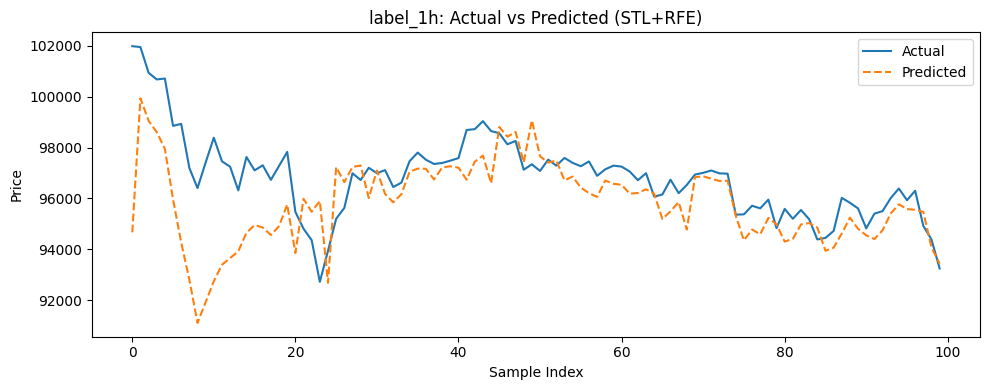


Processing horizon: label_2h
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Selected features (60): ['dxy_data', 'google_trends_bitcoin', 'nasdaq_composite', 'vix_index', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'usd_ars_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol1d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol1d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol7d', 'usd_try_vol7d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'HashRate', 'AdrActCnt', 'TxTfrValAdjUSD', 'FeeMeanUSD', 'CapMVRVCur', 'SplyAct30d', 'FlowInExUSD', 'FlowOutExUSD', 'TxCnt_ret1d', 'TxT

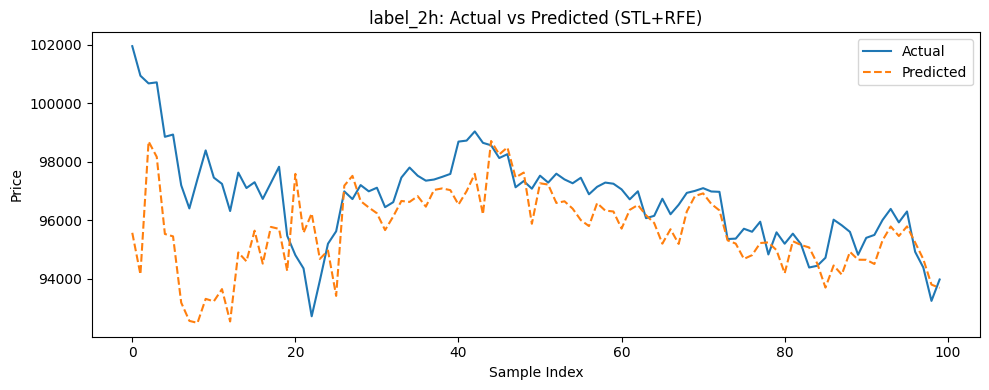


Processing horizon: label_3h
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Selected features (60): ['dxy_data', 'google_trends_bitcoin', 'nasdaq_composite', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'oil_price_brent_ret7d', 'usd_ars_ret7d', 'usd_try_ret1d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'dxy_data_vol1d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol1d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'usd_ars_vol7d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'HashRate', 'AdrActCnt', 'TxTfrValAdjUSD', 'FeeMeanUSD', 'CapMVRVCur', 'SplyAct30d', 'FlowInExUSD', 'FlowOutExUSD', 'HashRate_ret1d', 'Ad

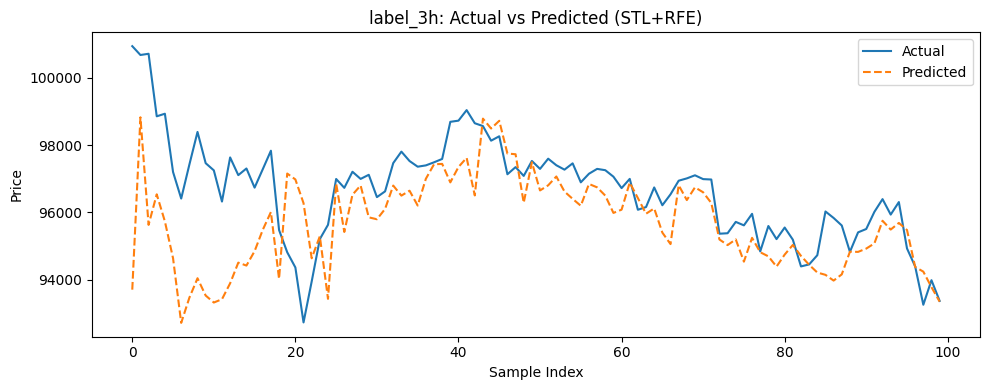


Processing horizon: label_6h
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Selected features (60): ['10y_treasury_yield', 'dxy_data', 'google_trends_bitcoin', 'nasdaq_composite', 'oil_price_wti', 'qqq_etf', 'usd_ars', 'vix_index', '10y_treasury_yield_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'nasdaq_composite_ret7d', 'oil_price_brent_ret7d', 'usd_try_ret1d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'dxy_data_vol1d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol1d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol1d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol7d', 'usd_try_vol1d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'AdrActCnt', 'TxTfrValAdjUSD', 'FeeMea

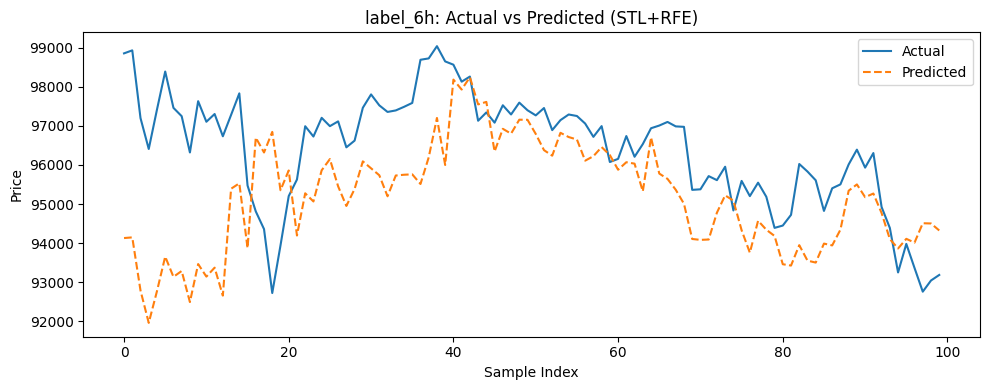


Processing horizon: label_12h
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Selected features (60): ['dxy_data', 'nasdaq_composite', 'qqq_etf', '10y_treasury_yield_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol1d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol7d', 'usd_try_vol1d', 'usd_try_vol7d', 'vix_index_vol1d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'AdrActCnt', 'TxTfrValAdjUSD', 'FeeMeanUSD', 'FeeTotUSD', 'CapMVRVCur', 'NVTAdj', 'SplyAct1d', 'FlowInExUSD', 'FlowOutExUSD', 'HashRate_ret1d', 'TxCnt_ret1d', 'T

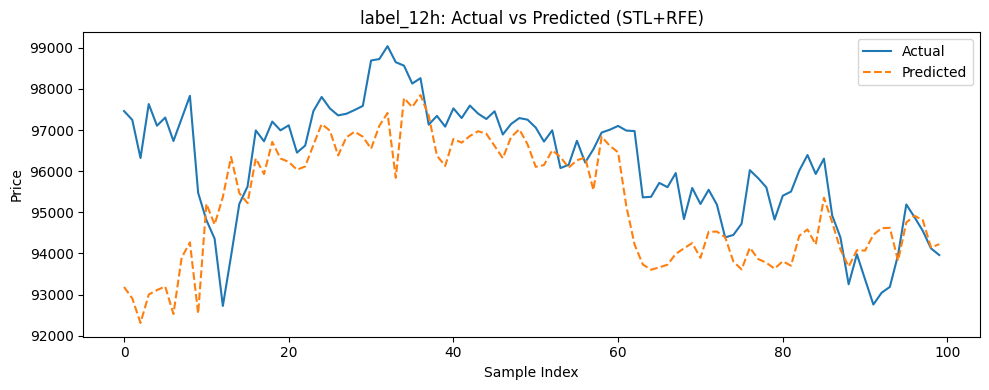


Processing horizon: label_1d
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Selected features (60): ['10y_treasury_yield', 'dxy_data', 'google_trends_bitcoin', 'oil_price_brent', 'qqq_etf', 'usd_ars', 'dxy_data_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'usd_ars_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol7d', 'usd_try_vol1d', 'usd_try_vol7d', 'vix_index_vol1d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'AdrActCnt', 'TxCnt', 'TxTfrValAdjUSD', 'FeeMeanUSD', 'CapMVRVCur', 'NVTAdj', 'SplyAct1d', 'FlowInExUSD', 'FlowOutExUSD', 'AdrActCnt_ret1d', 'TxCnt_ret1d', 'TxT

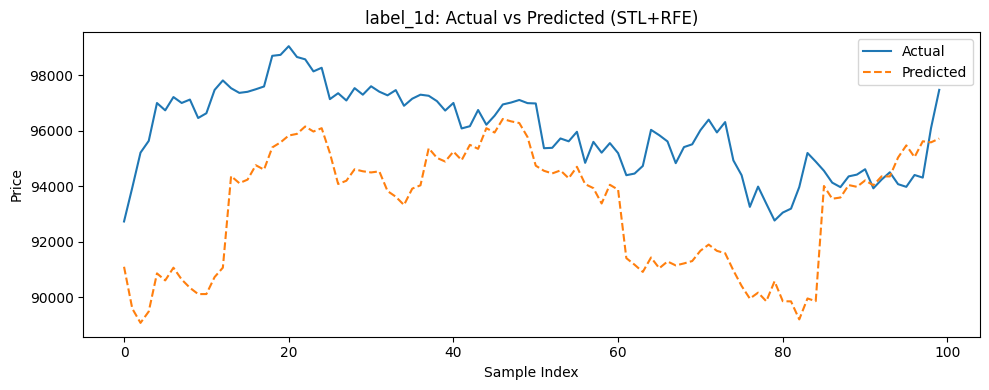


Processing horizon: label_3d
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Selected features (60): ['10y_treasury_yield', 'dxy_data', 'nasdaq_composite', 'qqq_etf', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'oil_price_wti_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', '10y_treasury_yield_vol7d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol1d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol7d', 'usd_try_vol1d', 'usd_try_vol7d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'HashRate', 'AdrActCnt', 'TxCnt', 'TxTfrValAdjUSD', 'FeeMeanUSD', 'CapMVRVCur', 'SplyAct1d', 'IssContPctDay', 'FlowInExUSD', 'FlowOutExUS

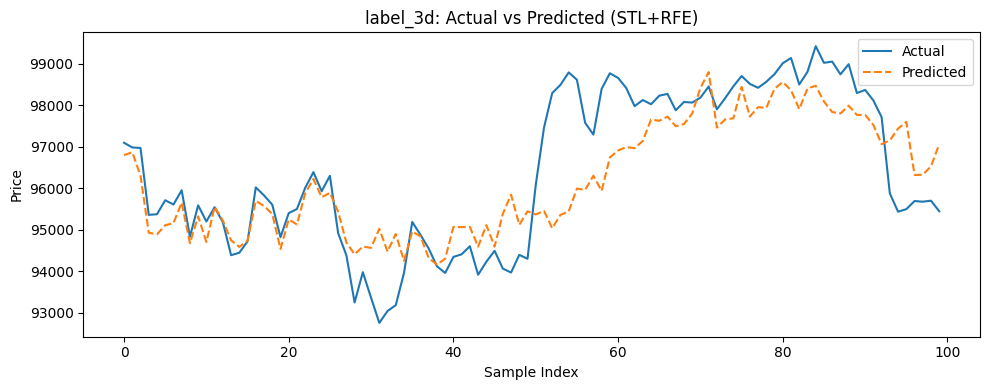


Processing horizon: label_7d
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Selected features (60): ['dxy_data', 'google_trends_bitcoin', 'nasdaq_composite', 'oil_price_wti', 'usd_try', 'dxy_data_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'usd_ars_ret7d', 'usd_try_ret1d', '10y_treasury_yield_vol1d', '10y_treasury_yield_vol7d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol1d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol1d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol1d', 'usd_ars_vol7d', 'usd_try_vol1d', 'usd_try_vol7d', 'vix_index_vol1d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'AdrActCnt', 'TxTfrValAdjUSD', 'FeeMeanUSD', 'CapMVRVCur', 'IssContPctDay', 'F

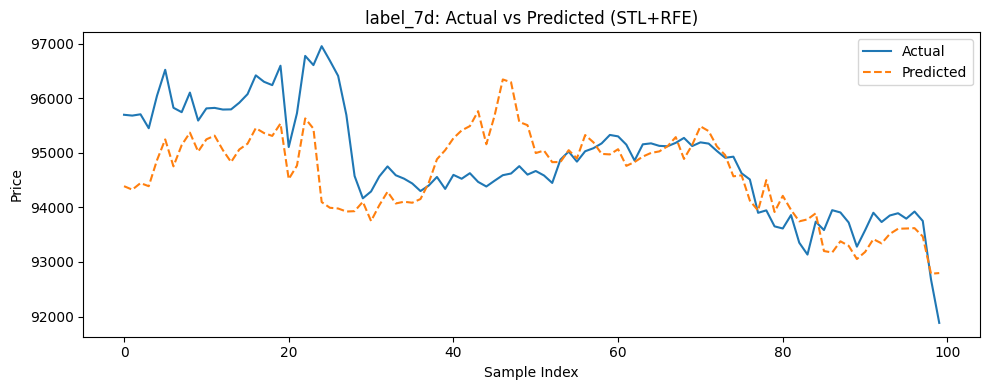


Processing horizon: label_15d
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Selected features (60): ['10y_treasury_yield', 'core_pce', 'dxy_data', 'google_trends_bitcoin', 'nasdaq_composite', '10y_treasury_yield_ret7d', 'dxy_data_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'oil_price_brent_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol1d', '10y_treasury_yield_vol7d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol7d', 'usd_try_vol7d', 'vix_index_vol7d', 'fed_balance_sheet_z21d', 'AdrActCnt', 'TxCnt', 'TxTfrValAdjUSD', 'FeeMeanUSD', 'CapMVRVCur', 'NVTAdj', 'SplyAct1d', 'SplyAct7d', 'Flow

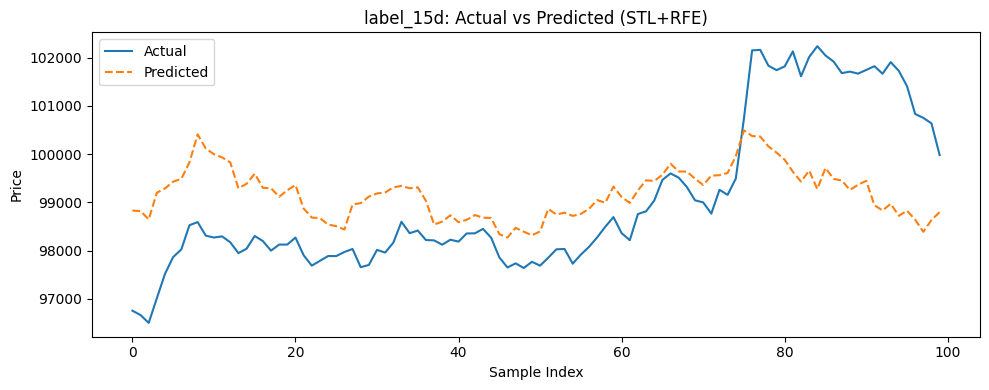


Processing horizon: label_30d
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
Selected features (60): ['10y_treasury_yield', 'google_trends_bitcoin', 'nasdaq_composite', 'usd_try', 'dxy_data_ret7d', 'google_trends_bitcoin_ret1d', 'google_trends_bitcoin_ret7d', 'qqq_etf_ret7d', 'usd_try_ret1d', 'usd_try_ret7d', 'vix_index_ret7d', '10y_treasury_yield_vol7d', 'dxy_data_vol7d', 'fed_balance_sheet_vol7d', 'google_trends_bitcoin_vol7d', 'nasdaq_composite_vol7d', 'oil_price_brent_vol7d', 'oil_price_wti_vol7d', 'qqq_etf_vol7d', 'usd_ars_vol1d', 'usd_ars_vol7d', 'usd_try_vol7d', 'vix_index_vol7d', 'vix_index_lag7d', 'fed_balance_sheet_z21d', 'HashRate', 'AdrActCnt', 'TxCnt', 'TxTfrValAdjUSD', 'FeeMeanUSD', 'CapMVRVCur', 'NVTAdj', 'SplyAct1d', 'IssContPctDay', 'FlowOutExUSD', 'TxCnt_ret1d',

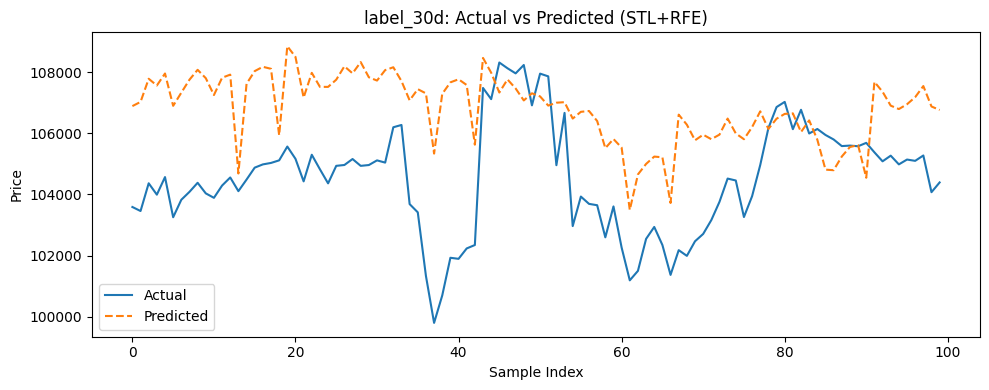

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL
from lightgbm import LGBMRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

# 1. Load train and validation separately
TRAIN_CSV = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV   = '/kaggle/input/data-btc/fix/val.csv'
df_tr = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp'])
df_va = pd.read_csv(VAL_CSV,   parse_dates=['timestamp'])

# 2. Drop non-feature columns
for df in [df_tr, df_va]:
    df.drop(columns=['timestamp','close_time'], inplace=True)

# 3. Define horizons and base feature set (exclude all labels)
horizons = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
labels   = [f'label_{h}' for h in horizons]
features = [c for c in df_tr.columns if not c.startswith('label_')]

# 4. Loop per horizon: STL decomposition, RFE, train, predict, evaluate
for label in labels:
    print(f"\nProcessing horizon: {label}")
    # 4.1. STL on train subset
    stl_tr = STL(df_tr[label], period=24, robust=True).fit()
    trend_tr, seasonal_tr, resid_tr = stl_tr.trend, stl_tr.seasonal, stl_tr.resid
    # 4.2. STL on validation subset
    stl_va = STL(df_va[label], period=24, robust=True).fit()
    trend_va, seasonal_va, resid_va = stl_va.trend, stl_va.seasonal, stl_va.resid

    # 5. RFE: select top 60 features to predict residual on train
    X_tr = df_tr[features]
    y_tr = resid_tr.values
    selector = RFE(
        estimator=LGBMRegressor(objective='regression', n_estimators=100, learning_rate=0.05, random_state=42),
        n_features_to_select=min(60, len(features)),
        step=0.1,
        verbose=1
    )
    selector.fit(X_tr, y_tr)
    selected_feats = [f for f, keep in zip(features, selector.support_) if keep]
    print(f"Selected features ({len(selected_feats)}): {selected_feats}")

    # 6. Train final model on residual using selected features
    model = LGBMRegressor(objective='regression', n_estimators=200, learning_rate=0.05, random_state=42)
    model.fit(
        X_tr[selected_feats], y_tr,
        eval_set=[(df_va[selected_feats], resid_va.values)],
        eval_metric='rmse'
    )

    # 7. Predict residual on validation and reconstruct
    resid_pred = model.predict(df_va[selected_feats])
    y_pred = trend_va.values + seasonal_va.values + resid_pred
    y_true = df_va[label].values

    # 8. Evaluate
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100
    print(f"{label} -> RMSE: {rmse:.4f}, MAPE: {mape:.2f}%")

    # 9. Plot actual vs predicted
    plt.figure(figsize=(10,4))
    plt.plot(y_true[:100], label='Actual')
    plt.plot(y_pred[:100], '--', label='Predicted')
    plt.title(f'{label}: Actual vs Predicted (STL+RFE)')
    plt.xlabel('Sample Index')
    plt.ylabel('Price')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Note: Data is never concatenated; STL is applied separately on train and validation to avoid leakage.


Bebas leakage

In [33]:
!pip install git+https://github.com/xiao-he/OneShotSTL.git

  Cloning https://github.com/xiao-he/OneShotSTL.git to /tmp/pip-req-build-7oe5qfb8
  Running command git clone --filter=blob:none --quiet https://github.com/xiao-he/OneShotSTL.git /tmp/pip-req-build-7oe5qfb8
  Resolved https://github.com/xiao-he/OneShotSTL.git to commit efc28ef801be4703205ae8daacb21b5c423d792b
ERROR: git+https://github.com/xiao-he/OneShotSTL.git does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.


Computing trend/seasonal via STL jump ...

=== Modeling label_1h ===
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
 Selected 60 features
 label_1h: RMSE=579.0150, MAPE=0.40%


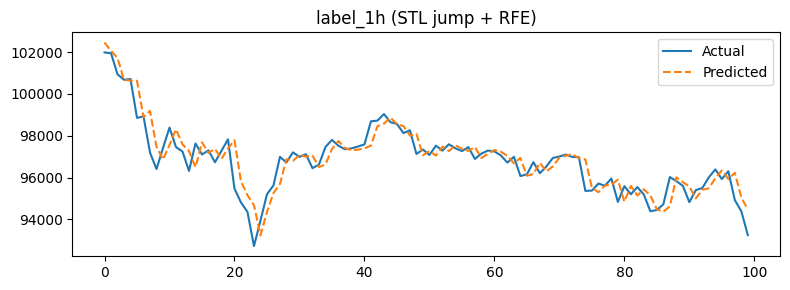


=== Modeling label_2h ===
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
 Selected 60 features
 label_2h: RMSE=784.5215, MAPE=0.56%


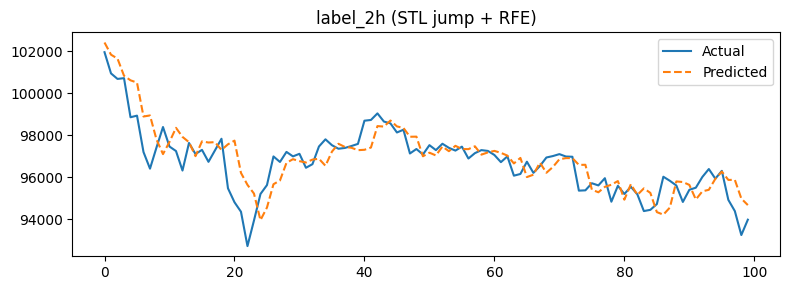


=== Modeling label_3h ===
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
 Selected 60 features
 label_3h: RMSE=932.6498, MAPE=0.67%


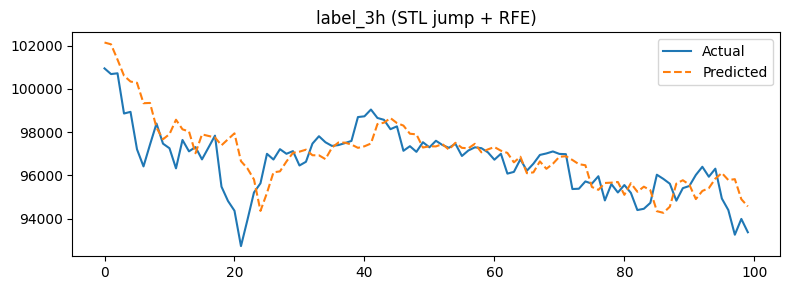


=== Modeling label_6h ===
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
 Selected 60 features
 label_6h: RMSE=1206.5974, MAPE=0.88%


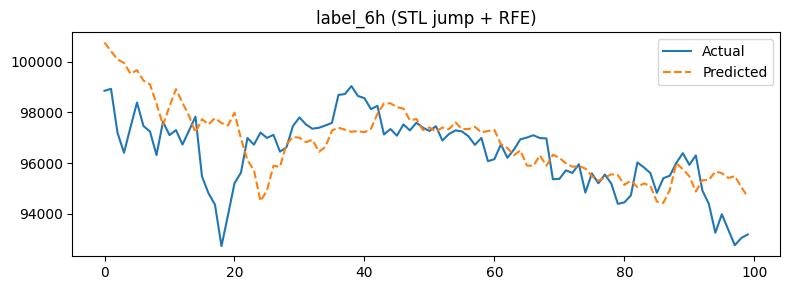


=== Modeling label_12h ===
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
 Selected 60 features
 label_12h: RMSE=1535.8742, MAPE=1.17%


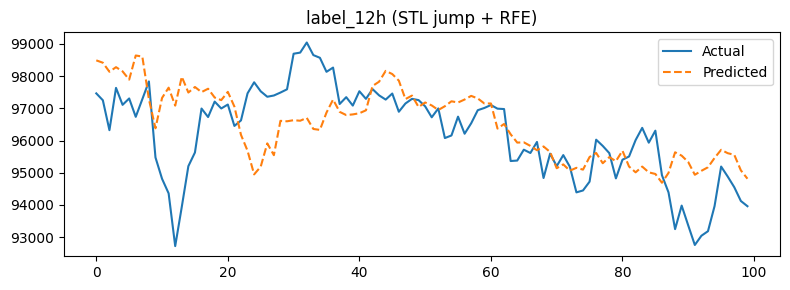


=== Modeling label_1d ===
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
 Selected 60 features
 label_1d: RMSE=2143.7149, MAPE=1.65%


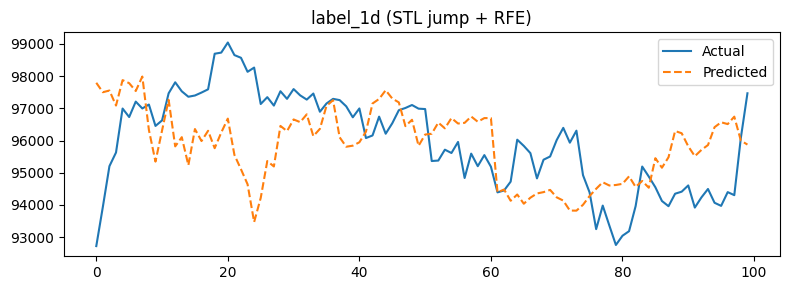


=== Modeling label_3d ===
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
 Selected 60 features
 label_3d: RMSE=3912.0159, MAPE=3.27%


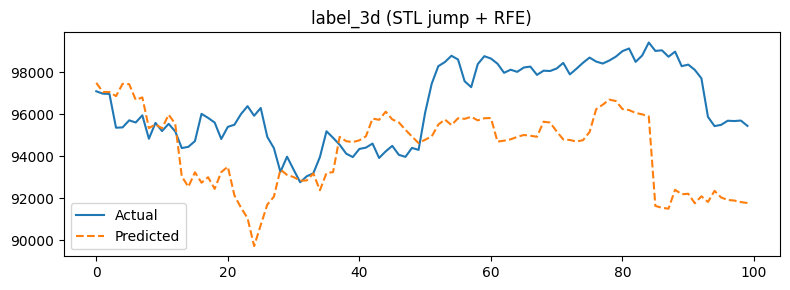


=== Modeling label_7d ===
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
 Selected 60 features
 label_7d: RMSE=7829.4525, MAPE=6.58%


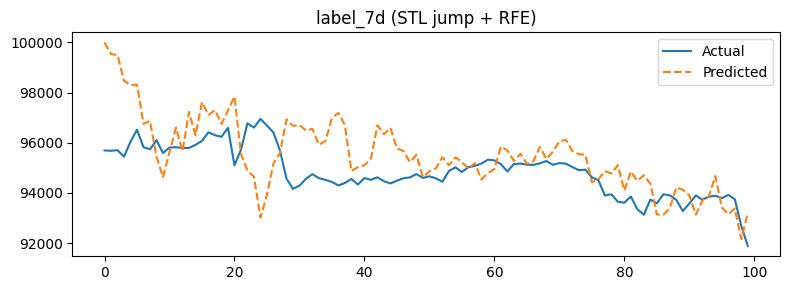


=== Modeling label_15d ===
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
 Selected 60 features
 label_15d: RMSE=14393.7751, MAPE=13.53%


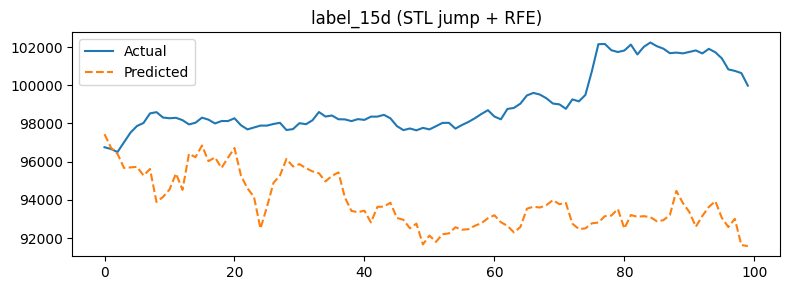


=== Modeling label_30d ===
Fitting estimator with 161 features.
Fitting estimator with 145 features.
Fitting estimator with 129 features.
Fitting estimator with 113 features.
Fitting estimator with 97 features.
Fitting estimator with 81 features.
Fitting estimator with 65 features.
 Selected 60 features
 label_30d: RMSE=20589.0060, MAPE=21.14%


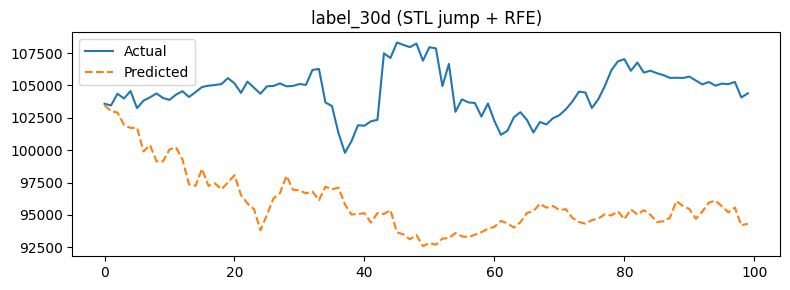

In [40]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import STL
from lightgbm import LGBMRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt

# 1) Load train & val
df_tr = pd.read_csv('/kaggle/input/data-btc/fix/train.csv',  parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_va = pd.read_csv('/kaggle/input/data-btc/fix/val.csv',    parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])

# 2) Define horizons & features
HORIZONS = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABELS   = [f'label_{h}' for h in HORIZONS]
FEATURES = [c for c in df_tr.columns if not c.startswith('label_')]

# 3) Online‐style STL with jump parameters
PERIOD     = 24            # daily seasonality
JUMP       = 24            # perform LOESS every 24 points
close_all  = pd.concat([df_tr['close'], df_va['close']], ignore_index=True)
trend_all  = np.zeros_like(close_all)
season_all = np.zeros_like(close_all)

# Precompute window length
window_len = PERIOD*2 + 1

print("Computing trend/seasonal via STL jump ...")
for t in range(len(close_all)):
    start = max(0, t - window_len + 1)
    sub    = close_all.iloc[start:t+1]
    dec    = STL(sub, period=PERIOD, trend_jump=JUMP, low_pass_jump=JUMP, robust=True).fit()
    trend_all[t]  = dec.trend.iloc[-1]
    season_all[t] = dec.seasonal.iloc[-1]

# Split back to train/val
n_tr = len(df_tr)
trend_tr, trend_va      = trend_all[:n_tr],      trend_all[n_tr:]
season_tr, season_va    = season_all[:n_tr],    season_all[n_tr:]

# 4) Loop untuk setiap horizon
results = {}
for label in LABELS:
    print(f"\n=== Modeling {label} ===")
    # 4.1) residuals on train/val
    y_tr_resid = df_tr[label].values - (trend_tr + season_tr)
    y_va_resid = df_va[label].values - (trend_va + season_va)

    # 4.2) RFE feature selection on residual_train
    selector = RFE(
        estimator=LGBMRegressor(n_estimators=100, learning_rate=0.05, random_state=42),
        n_features_to_select=min(60, len(FEATURES)),
        step=0.1, verbose=1
    )
    selector.fit(df_tr[FEATURES], y_tr_resid)
    feats_sel = [f for f, keep in zip(FEATURES, selector.support_) if keep]
    print(f" Selected {len(feats_sel)} features")

    # 4.3) Train final model (no early stopping / verbose)
    model = LGBMRegressor(n_estimators=200, learning_rate=0.05, random_state=42)
    model.fit(
        df_tr[feats_sel], y_tr_resid
    )

    # 4.4) Predict & reconstruct
    resid_pred = model.predict(df_va[feats_sel])
    y_pred      = trend_va + season_va + resid_pred
    y_true      = df_va[label].values

    # 4.5) Evaluate
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100
    print(f" {label}: RMSE={rmse:.4f}, MAPE={mape:.2f}%")

    # 4.6) Store & plot
    results[label] = (y_true, y_pred)
    plt.figure(figsize=(8,3))
    plt.plot(y_true[:100], label='Actual')
    plt.plot(y_pred[:100], '--', label='Predicted')
    plt.title(f'{label} (STL jump + RFE)')
    plt.legend()
    plt.tight_layout()
    plt.show()


LGBM FINAL

In [68]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import STL
from lightgbm import LGBMRegressor
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
import joblib

# Paths
TRAIN_CSV = '/kaggle/input/data-btc/fix/train.csv'
VAL_CSV   = '/kaggle/input/data-btc/fix/val.csv'
TEST_CSV  = '/kaggle/input/data-btc/fix/test.csv'

# 1) Load train, val, test
df_tr = pd.read_csv(TRAIN_CSV, parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_va = pd.read_csv(VAL_CSV,   parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_te = pd.read_csv(TEST_CSV,  parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])

# 2) Define horizons & features
HORIZONS = ['1h','2h','3h','6h','12h','1d','3d','7d','15d','30d']
LABELS   = [f'label_{h}' for h in HORIZONS]
FEATURES = [c for c in df_tr.columns if not c.startswith('label_')]

# 3) Compute STL trend+season for train+val+test
PERIOD    = 24
JUMP      = 24
close_all = pd.concat([df_tr['close'], df_va['close'], df_te['close']], ignore_index=True)
trend_all  = np.zeros_like(close_all)
season_all = np.zeros_like(close_all)
window_len = PERIOD * 2 + 1

print("Computing trend/seasonal via STL jump ...")
for t in range(len(close_all)):
    start = max(0, t - window_len + 1)
    sub   = close_all.iloc[start:t+1]
    dec   = STL(sub, period=PERIOD, trend_jump=JUMP,
                low_pass_jump=JUMP, robust=True).fit()
    trend_all[t]  = dec.trend.iloc[-1]
    season_all[t] = dec.seasonal.iloc[-1]

# split back
n_tr = len(df_tr)
n_va = len(df_va)
trend_tr, trend_va, trend_te     = trend_all[:n_tr], trend_all[n_tr:n_tr+n_va], trend_all[n_tr+n_va:]
season_tr, season_va, season_te = season_all[:n_tr], season_all[n_tr:n_tr+n_va], season_all[n_tr+n_va:]

results = {}

for label in LABELS:
    print(f"\n=== Horizon: {label} ===")
    # residual on train & val
    y_tr_resid = df_tr[label].values - (trend_tr + season_tr)
    y_va_resid = df_va[label].values - (trend_va + season_va)

    # 1) RFE on train only
    selector = RFE(
        estimator=LGBMRegressor(n_estimators=100, learning_rate=0.05, random_state=42),
        n_features_to_select=min(60, len(FEATURES)),
        step=0.1, verbose=0
    )
    selector.fit(df_tr[FEATURES], y_tr_resid)
    feats_sel = [f for f, keep in zip(FEATURES, selector.support_) if keep]
    print(f" Selected {len(feats_sel)} features.")

    # 2) Tuning via early stopping on val
    model = LGBMRegressor(
        n_estimators=1000,        # max
        learning_rate=0.05,
        random_state=42
    )
    model.fit(
        df_tr[feats_sel], y_tr_resid,
        eval_set=[(df_va[feats_sel], y_va_resid)],
        eval_metric='rmse'
    )
    best_it = model.best_iteration_
    print(f" Best iteration: {best_it}")

    # 3) Retrain final on train+val
    # prepare combined
    y_comb_resid = np.concatenate([y_tr_resid, y_va_resid], axis=0)
    df_comb = pd.concat([df_tr, df_va], ignore_index=True)
    final = LGBMRegressor(
        n_estimators=best_it,
        learning_rate=0.05,
        random_state=42
    )
    final.fit(df_comb[feats_sel], y_comb_resid)

    # simpan final model
    joblib.dump(final, f'LGBM_FINAL_{label}.pkl')
    print(f" Saved LGBM_FINAL_{label}.pkl")

    # 4) Predict & reconstruct on test
    y_te_resid = final.predict(df_te[feats_sel])
    y_pred     = trend_te + season_te + y_te_resid
    y_true     = df_te[label].values

    # eval
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    mape = mean_absolute_percentage_error(y_true, y_pred) * 100
    print(f" Test {label}: RMSE={rmse:.4f}, MAPE={mape:.2f}%")

    # simpan hasil & plot
    results[label] = (y_true, y_pred)
    plt.figure(figsize=(8,3))
    plt.plot(y_true[:100], label='Actual')
    plt.plot(y_pred[:100], '--', label='Predicted')
    plt.title(f'{label} (STL+RFE+LGBM)')
    plt.legend()
    plt.tight_layout()
    plt.show()


Computing trend/seasonal via STL jump ...

=== Horizon: label_1h ===
 Selected 60 features.
 Best iteration: 0


ValueError: Number of boosting rounds must be greater than 0. Got 0.

LGBM FIX FINAL

In [1]:
!pip install pmdarima --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 25.9 MB/s eta 0:00:0000:010:01


# Paths to CSV (95% train, 3% val, 2% test splits)
TRAIN_PATH = '/kaggle/input/data-btc/fix3/fix2/train.csv'
VAL_PATH   = '/kaggle/input/data-btc/fix3/fix2/val.csv'
TEST_PATH  = '/kaggle/input/data-btc/fix3/fix2/test.csv'


Horizons:   0%|          | 0/10 [00:00<?, ?it/s]

[ARIMA] Tuning 1h


Horizons:   0%|          | 0/10 [00:38<?, ?it/s]

  best_order = (4, 0, 0)
[LGBM ] Tuning 1h


Horizons:   0%|          | 0/10 [02:06<?, ?it/s]

  best_lgbm = {'n_estimators': 293, 'num_leaves': 17, 'max_depth': 13, 'learning_rate': 0.001155192396687909, 'feature_fraction': 0.6515967972758653, 'bagging_fraction': 0.8528383653866904, 'min_child_samples': 45}
[WFV  ] 1h (20 points)



WFV 1h: 100%|██████████| 20/20 [01:25<00:00,  4.26s/it]


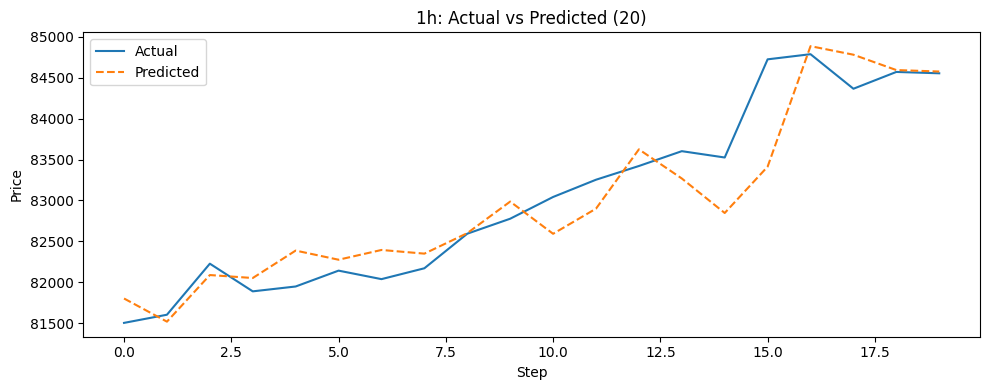

Horizons:  10%|█         | 1/10 [03:32<31:50, 212.24s/it]

1h: RMSE=412.32, MAPE=0.35%

[ARIMA] Tuning 2h


Horizons:  10%|█         | 1/10 [04:21<31:50, 212.24s/it]

  best_order = (4, 0, 0)
[LGBM ] Tuning 2h


Horizons:  10%|█         | 1/10 [05:49<31:50, 212.24s/it]

  best_lgbm = {'n_estimators': 102, 'num_leaves': 52, 'max_depth': 3, 'learning_rate': 0.0016489494781674221, 'feature_fraction': 0.6482154495691754, 'bagging_fraction': 0.9144770606049518, 'min_child_samples': 40}
[WFV  ] 2h (20 points)



WFV 2h: 100%|██████████| 20/20 [01:08<00:00,  3.44s/it]


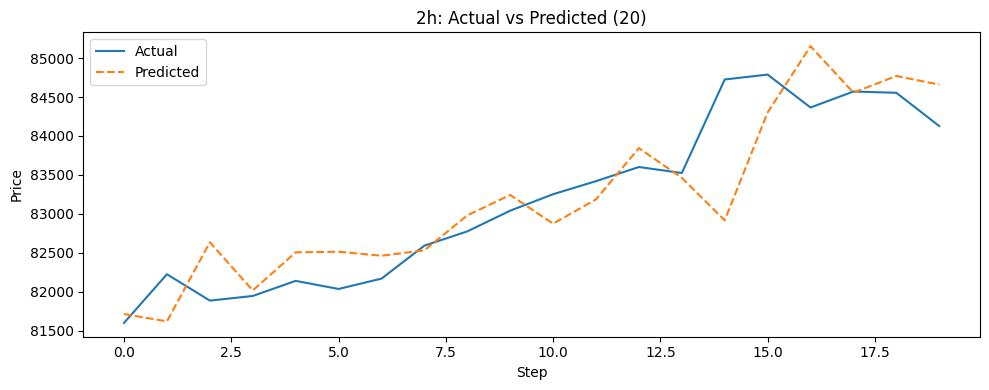

Horizons:  20%|██        | 2/10 [06:58<27:51, 208.88s/it]

2h: RMSE=556.12, MAPE=0.47%

[ARIMA] Tuning 3h


Horizons:  20%|██        | 2/10 [07:39<27:51, 208.88s/it]

  best_order = (5, 0, 0)
[LGBM ] Tuning 3h


Horizons:  20%|██        | 2/10 [09:38<27:51, 208.88s/it]

  best_lgbm = {'n_estimators': 240, 'num_leaves': 75, 'max_depth': 15, 'learning_rate': 0.0010084706437930376, 'feature_fraction': 0.7814337176518545, 'bagging_fraction': 0.7090078632129174, 'min_child_samples': 16}
[WFV  ] 3h (20 points)



WFV 3h: 100%|██████████| 20/20 [02:01<00:00,  6.07s/it]


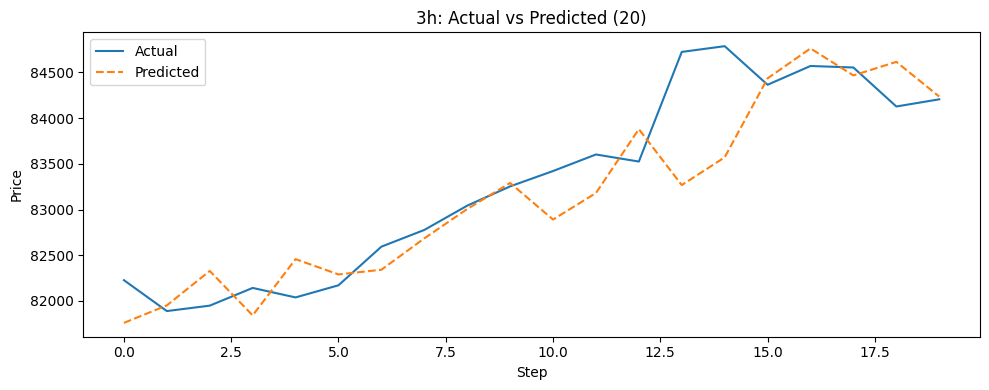

Horizons:  30%|███       | 3/10 [11:39<28:12, 241.73s/it]

3h: RMSE=509.84, MAPE=0.42%

[ARIMA] Tuning 6h


Horizons:  30%|███       | 3/10 [12:06<28:12, 241.73s/it]

  best_order = (5, 0, 0)
[LGBM ] Tuning 6h


Horizons:  30%|███       | 3/10 [13:32<28:12, 241.73s/it]

  best_lgbm = {'n_estimators': 109, 'num_leaves': 63, 'max_depth': 3, 'learning_rate': 0.001486063921063587, 'feature_fraction': 0.8177583268672535, 'bagging_fraction': 0.8221277920102469, 'min_child_samples': 45}
[WFV  ] 6h (20 points)



WFV 6h: 100%|██████████| 20/20 [01:22<00:00,  4.12s/it]


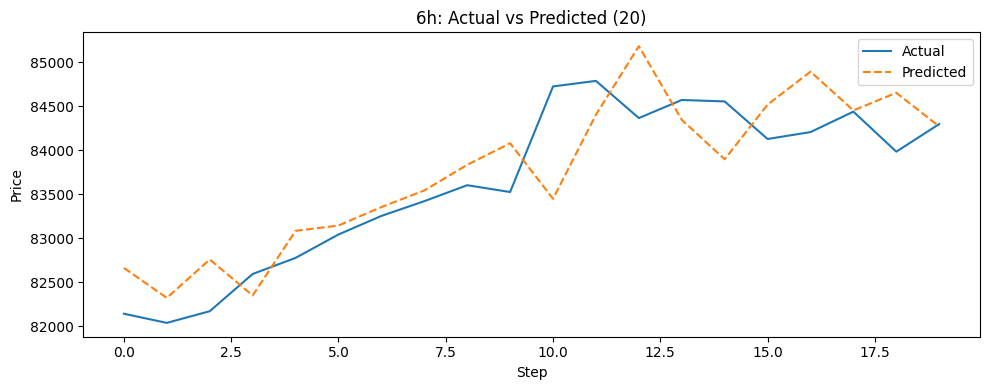

Horizons:  40%|████      | 4/10 [14:54<22:20, 223.39s/it]

6h: RMSE=512.11, MAPE=0.49%

[ARIMA] Tuning 12h


Horizons:  40%|████      | 4/10 [15:36<22:20, 223.39s/it]

  best_order = (4, 0, 0)
[LGBM ] Tuning 12h


Horizons:  40%|████      | 4/10 [16:48<22:20, 223.39s/it]

  best_lgbm = {'n_estimators': 102, 'num_leaves': 56, 'max_depth': 3, 'learning_rate': 0.0010013004567097773, 'feature_fraction': 0.7101187388874707, 'bagging_fraction': 0.8586767885836215, 'min_child_samples': 15}
[WFV  ] 12h (20 points)



WFV 12h: 100%|██████████| 20/20 [01:07<00:00,  3.38s/it]


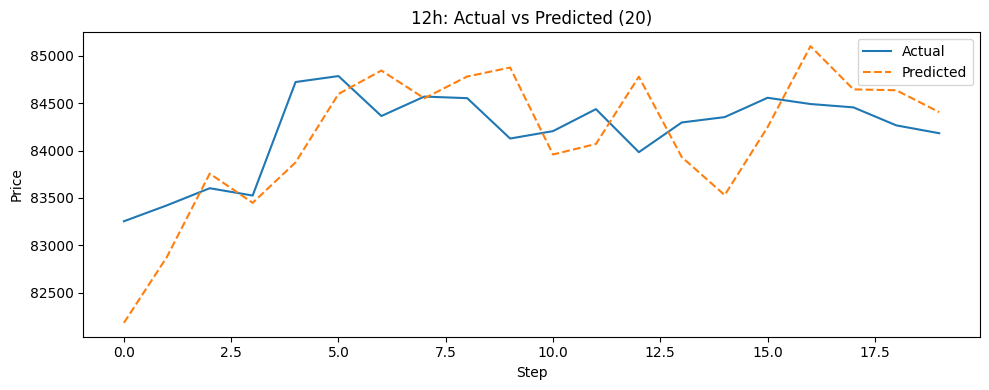

Horizons:  50%|█████     | 5/10 [17:55<17:20, 208.11s/it]

12h: RMSE=520.84, MAPE=0.52%

[ARIMA] Tuning 1d


Horizons:  50%|█████     | 5/10 [41:11<41:11, 494.35s/it]


KeyboardInterrupt: 

In [6]:
import warnings
warnings.filterwarnings('ignore')  # suppress warnings

import logging
logging.getLogger('lightgbm').setLevel(logging.WARNING)
logging.getLogger('pmdarima').setLevel(logging.WARNING)
logging.getLogger('statsmodels').setLevel(logging.ERROR)
import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

import pandas as pd
import numpy as np
import pmdarima as pm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.seasonal import STL
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import TimeSeriesSplit
from tqdm import tqdm
import matplotlib.pyplot as plt

# Paths to CSV (95% train, 3% val, 2% test splits)
TRAIN_PATH = '/kaggle/input/data-btc/fix3/fix2/train.csv'
VAL_PATH   = '/kaggle/input/data-btc/fix3/fix2/val.csv'
TEST_PATH  = '/kaggle/input/data-btc/fix3/fix2/test.csv'


# 1) Load ordered splits
df_tr_full = pd.read_csv(TRAIN_PATH, parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_va_full = pd.read_csv(VAL_PATH,   parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_te_full = pd.read_csv(TEST_PATH,  parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])

# 2) Compute STL once for entire series
PERIOD    = 24  # hourly seasonality
close_all = pd.concat([df_tr_full['close'], df_va_full['close'], df_te_full['close']], ignore_index=True)
stl_res   = STL(close_all, period=PERIOD, robust=True).fit()
trend_all = stl_res.trend.values
season_all= stl_res.seasonal.values

# 3) Slice STL into train/val/test
n_tr = len(df_tr_full)
n_va = len(df_va_full)
trend_tr, trend_va, trend_te = trend_all[:n_tr], trend_all[n_tr:n_tr+n_va], trend_all[n_tr+n_va:]
season_tr, season_va, season_te = season_all[:n_tr], season_all[n_tr:n_tr+n_va], season_all[n_tr+n_va:]

# 4) Define horizons mapping to shift steps (hours)
horizons = {'1h':1, '2h':2, '3h':3, '6h':6, '12h':12,
            '1d':24, '3d':72, '7d':168, '15d':360, '30d':720}

# Helper: shift label and drop last h rows
def prepare_split(df_full, trend_full, season_full, h):
    df = df_full.copy()
    df['label'] = df['close'].shift(-h)
    df.dropna(subset=['label'], inplace=True)
    df.reset_index(drop=True, inplace=True)
    tr = trend_full[:len(df)]
    se = season_full[:len(df)]
    return df, tr, se

# --- Main loop per horizon ---
for label, h in tqdm(horizons.items(), desc='Horizons'):
    # Prepare train, val, test subsets
    df_tr, tr_tr, se_tr = prepare_split(df_tr_full, trend_tr,  season_tr,  h)
    df_va, tr_va, se_va = prepare_split(df_va_full, trend_va,  season_va,  h)
    df_te, tr_te, se_te = prepare_split(df_te_full, trend_te,  season_te,  h)

    # Build history from train+val
    df_hist = pd.concat([df_tr, df_va], ignore_index=True)
    tr_hist = np.concatenate([tr_tr, tr_va])
    se_hist = np.concatenate([se_tr, se_va])

    # --- ARIMA tuning ---
    tqdm.write(f'[ARIMA] Tuning {label}')
    resid_hist = df_hist['label'].values - (tr_hist + se_hist)
    arima_auto = pm.auto_arima(
        resid_hist, start_p=0, start_q=0, max_p=5, max_q=5,
        seasonal=False, stepwise=True, suppress_warnings=True,
        error_action='ignore', trace=False
    )
    best_order = arima_auto.order
    tqdm.write(f'  best_order = {best_order}')

    # --- LightGBM tuning ---
    tqdm.write(f'[LGBM ] Tuning {label}')
    FEATURES = [c for c in df_hist.columns if c != 'label']
    X_hist, y_hist = df_hist[FEATURES], resid_hist
    def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 500),
            'num_leaves':    trial.suggest_int('num_leaves', 16, 128),
            'max_depth':     trial.suggest_int('max_depth', 3, 15),
            'learning_rate': trial.suggest_float('learning_rate', 1e-3, 1e-1, log=True),
            'feature_fraction': trial.suggest_float('feature_fraction', 0.6, 1.0),
            'bagging_fraction': trial.suggest_float('bagging_fraction', 0.6, 1.0),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 50),
            'verbose': -1,
            'device': 'gpu'
        }
        tss = TimeSeriesSplit(n_splits=3)
        mse_vals = []
        for tr_idx, va_idx in tss.split(X_hist):
            mdl = LGBMRegressor(random_state=42, **params)
            mdl.fit(X_hist.iloc[tr_idx], y_hist[tr_idx])
            preds = mdl.predict(X_hist.iloc[va_idx])
            mse_vals.append(mean_squared_error(y_hist[va_idx], preds))
        return np.mean(mse_vals)
    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=20, show_progress_bar=False)
    best_lgbm = study.best_trial.params
    tqdm.write(f'  best_lgbm = {best_lgbm}')

    # --- Walk-forward validation: first 20 test points ---
    tqdm.write(f'[WFV  ] {label} (20 points)')
    preds, trues = [], []
    max_pts = min(20, len(df_te))
    for i in tqdm(range(max_pts), desc=f'WFV {label}'):
        # Fit ARIMA on residual history
        resid_curr = df_hist['label'].values - (tr_hist + se_hist)
        arima = ARIMA(resid_curr, order=best_order).fit()
        ar_pred = arima.forecast(1)[0]

        # Fit LGBM on residual history
        lgbm = LGBMRegressor(random_state=42, **best_lgbm)
        lgbm.fit(df_hist[FEATURES], resid_curr)
        lb_pred = lgbm.predict(df_te[FEATURES].iloc[[i]])[0]

        # Combine components
        forecast = (tr_te[i] + se_te[i]) + ar_pred + lb_pred
        preds.append(forecast)
        trues.append(df_te['label'].iloc[i])

        # Update history with true observation
        new_row = df_te.iloc[[i]].copy()
        df_hist = pd.concat([df_hist, new_row], ignore_index=True)
        tr_hist = np.append(tr_hist, tr_te[i])
        se_hist = np.append(se_hist, se_te[i])

    # Plot Actual vs Predicted
    plt.figure(figsize=(10,4))
    plt.plot(trues, label='Actual')
    plt.plot(preds, '--', label='Predicted')
    plt.title(f'{label}: Actual vs Predicted (20)')
    plt.xlabel('Step')
    plt.ylabel('Price')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Report metrics
    rmse = mean_squared_error(trues, preds, squared=False)
    mape = mean_absolute_percentage_error(trues, preds)*100
    tqdm.write(f'{label}: RMSE={rmse:.2f}, MAPE={mape:.2f}%\n')


Horizons:   0%|          | 0/10 [00:00<?, ?it/s]

[ARIMA] Using fixed order (4, 0, 0) for 1h
[LGBM ] Tuning 1h


Horizons:   0%|          | 0/10 [00:44<?, ?it/s]

  best_lgbm = {'n_estimators': 105, 'num_leaves': 16, 'max_depth': 7, 'learning_rate': 0.0010315445320655148, 'feature_fraction': 0.9248116908334819, 'bagging_fraction': 0.9868241364850107, 'min_child_samples': 30}
[WFV  ] 1h (10 pts)



WFV 1h: 100%|██████████| 10/10 [00:35<00:00,  3.50s/it]


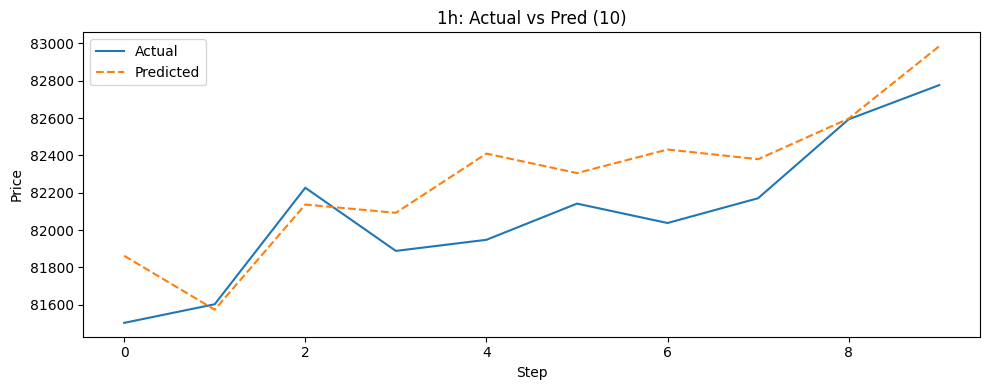

Horizons:  10%|█         | 1/10 [01:19<11:55, 79.48s/it]

1h: RMSE=257.20, MAPE=0.26%

[ARIMA] Using fixed order (4, 0, 0) for 2h
[LGBM ] Tuning 2h


Horizons:  10%|█         | 1/10 [02:06<11:55, 79.48s/it]

  best_lgbm = {'n_estimators': 473, 'num_leaves': 34, 'max_depth': 3, 'learning_rate': 0.0010308828955965692, 'feature_fraction': 0.6039371246526083, 'bagging_fraction': 0.6006782009115189, 'min_child_samples': 23}
[WFV  ] 2h (10 pts)



WFV 2h: 100%|██████████| 10/10 [00:44<00:00,  4.46s/it]


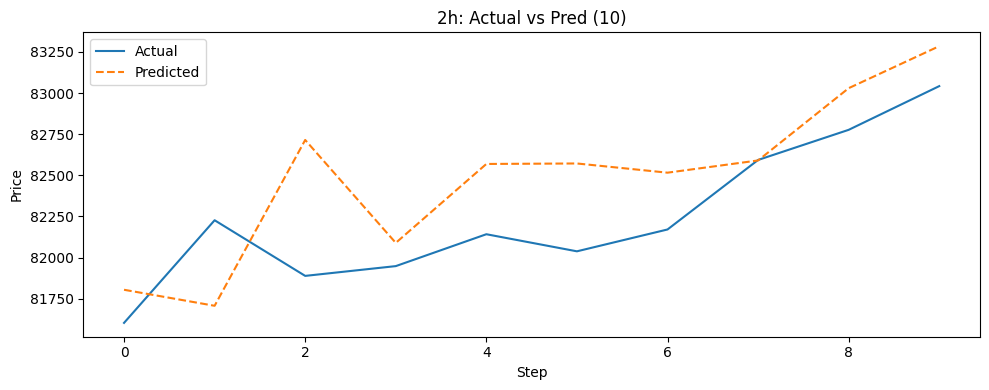

Horizons:  20%|██        | 2/10 [02:51<11:33, 86.67s/it]

2h: RMSE=415.12, MAPE=0.43%

[ARIMA] Using fixed order (5, 0, 0) for 3h
[LGBM ] Tuning 3h


Horizons:  20%|██        | 2/10 [03:49<11:33, 86.67s/it]

  best_lgbm = {'n_estimators': 412, 'num_leaves': 49, 'max_depth': 5, 'learning_rate': 0.0011001182106700985, 'feature_fraction': 0.7333995537010036, 'bagging_fraction': 0.8573559368542076, 'min_child_samples': 12}
[WFV  ] 3h (10 pts)



WFV 3h: 100%|██████████| 10/10 [00:54<00:00,  5.42s/it]


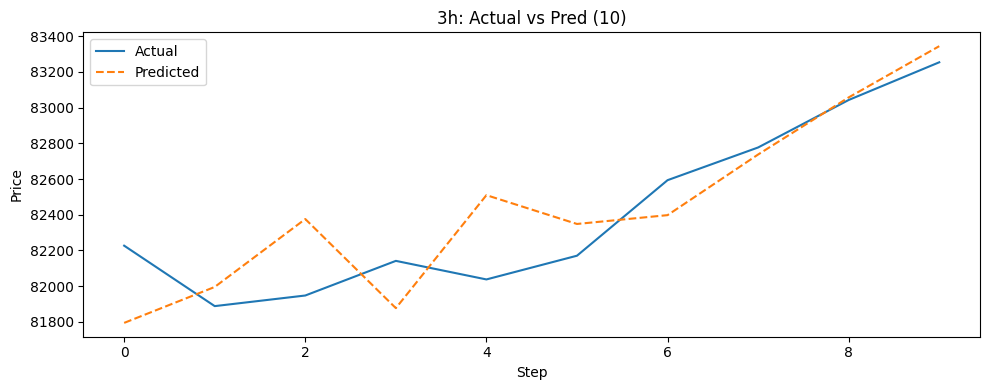

Horizons:  30%|███       | 3/10 [04:43<11:30, 98.59s/it]

3h: RMSE=274.45, MAPE=0.27%

[ARIMA] Using fixed order (5, 0, 0) for 6h
[LGBM ] Tuning 6h


Horizons:  30%|███       | 3/10 [05:32<11:30, 98.59s/it]

  best_lgbm = {'n_estimators': 364, 'num_leaves': 63, 'max_depth': 3, 'learning_rate': 0.0010405835495807365, 'feature_fraction': 0.9966774328190351, 'bagging_fraction': 0.9005163192185085, 'min_child_samples': 26}
[WFV  ] 6h (10 pts)



WFV 6h: 100%|██████████| 10/10 [00:48<00:00,  4.86s/it]


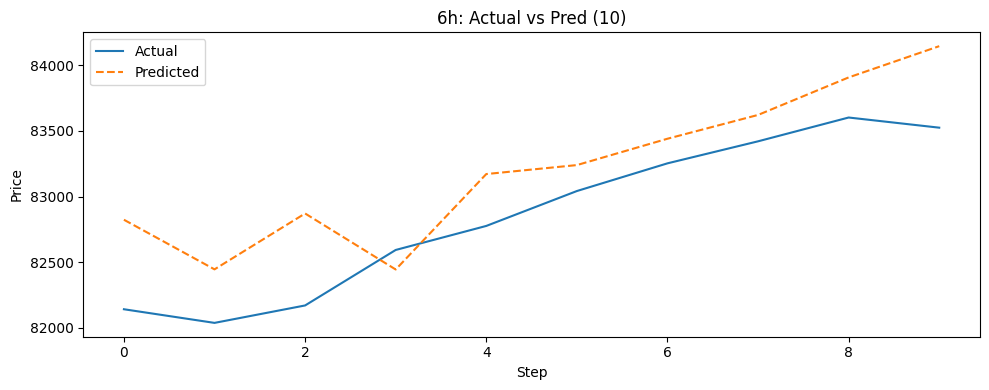

Horizons:  40%|████      | 4/10 [06:20<09:47, 97.94s/it]

6h: RMSE=435.08, MAPE=0.46%

[ARIMA] Using fixed order (4, 0, 0) for 12h
[LGBM ] Tuning 12h


Horizons:  40%|████      | 4/10 [07:09<09:47, 97.94s/it]

  best_lgbm = {'n_estimators': 115, 'num_leaves': 47, 'max_depth': 6, 'learning_rate': 0.0010139263751096942, 'feature_fraction': 0.8893724062975737, 'bagging_fraction': 0.608820588173447, 'min_child_samples': 11}
[WFV  ] 12h (10 pts)



WFV 12h: 100%|██████████| 10/10 [00:36<00:00,  3.62s/it]


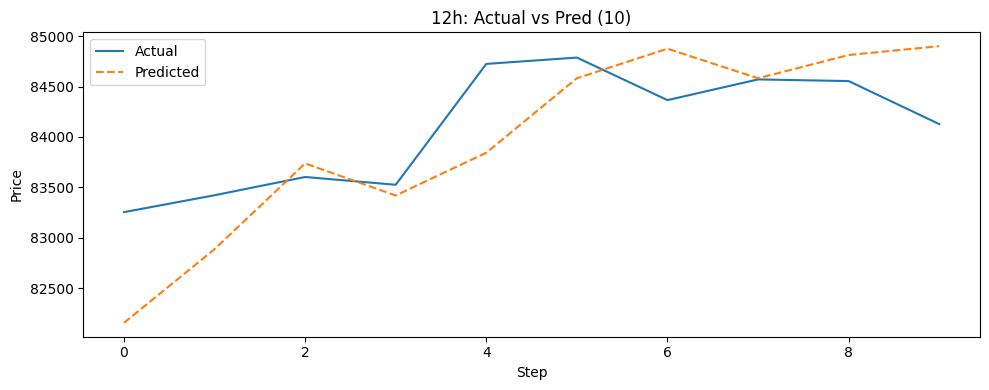

Horizons:  50%|█████     | 5/10 [07:45<07:46, 93.23s/it]

12h: RMSE=571.77, MAPE=0.54%

[SARIMA] Tuning 1d (p,q≤3, P,Q≤2, m=24)


In [ ]:
import warnings
warnings.filterwarnings('ignore')  # suppress warnings

import logging
logging.getLogger('lightgbm').setLevel(logging.WARNING)
logging.getLogger('pmdarima').setLevel(logging.WARNING)
logging.getLogger('statsmodels').setLevel(logging.ERROR)
import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

import pandas as pd
import numpy as np
import pmdarima as pm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.seasonal import STL
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import TimeSeriesSplit
from tqdm import tqdm
import matplotlib.pyplot as plt

# Paths to CSV (95% train, 3% val, 2% test splits)
TRAIN_PATH = '/kaggle/input/data-btc/fix3/fix2/train.csv'
VAL_PATH   = '/kaggle/input/data-btc/fix3/fix2/val.csv'
TEST_PATH  = '/kaggle/input/data-btc/fix3/fix2/test.csv'


# 1) Load train/val/test splits
df_tr_full = pd.read_csv(TRAIN_PATH, parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_va_full = pd.read_csv(VAL_PATH,   parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_te_full = pd.read_csv(TEST_PATH,  parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])

# 2) Compute STL decomposition once (daily seasonality m=24)
PERIOD = 24
close_all = pd.concat([df_tr_full['close'], df_va_full['close'], df_te_full['close']], ignore_index=True)
stl_res   = STL(close_all, period=PERIOD, robust=True).fit()
trend_all = stl_res.trend.values
season_all= stl_res.seasonal.values

# 3) Slice STL into splits
n_tr = len(df_tr_full); n_va = len(df_va_full)
trend_tr, trend_va, trend_te = trend_all[:n_tr], trend_all[n_tr:n_tr+n_va], trend_all[n_tr+n_va:]
season_tr, season_va, season_te = season_all[:n_tr], season_all[n_tr:n_tr+n_va], season_all[n_tr+n_va:]

# 4) Define horizons and fixed ARIMA orders for short horizons
horizons = {'1h':1, '2h':2, '3h':3, '6h':6, '12h':12,
            '1d':24, '3d':72, '7d':168, '15d':360, '30d':720}
fixed_orders = {'1h':(4,0,0), '2h':(4,0,0), '3h':(5,0,0), '6h':(5,0,0), '12h':(4,0,0)}

# Helper: prepare split and trim last h rows
def prepare_split(df_full, trend_full, season_full, h):
    df = df_full.copy()
    df['label'] = df['close'].shift(-h)
    df.dropna(subset=['label'], inplace=True)
    df.reset_index(drop=True, inplace=True)
    return df, trend_full[:len(df)], season_full[:len(df)]

# --- Main loop per horizon ---
for label, h in tqdm(horizons.items(), desc='Horizons'):
    # prepare data slices
    df_tr, tr_tr, se_tr = prepare_split(df_tr_full, trend_tr,  season_tr,  h)
    df_va, tr_va, se_va = prepare_split(df_va_full, trend_va,  season_va,  h)
    df_te, tr_te, se_te = prepare_split(df_te_full, trend_te,  season_te,  h)

    # combine train+val for history
    df_hist = pd.concat([df_tr, df_va], ignore_index=True)
    tr_hist = np.concatenate([tr_tr, tr_va])
    se_hist = np.concatenate([se_tr, se_va])
    resid_hist = df_hist['label'].values - (tr_hist + se_hist)

    # --- ARIMA/SARIMAX: fixed for short horizons, auto for long ---
    if label in fixed_orders:
        best_order = fixed_orders[label]
        seasonal_order = (0,0,0,0)
        tqdm.write(f'[ARIMA] Using fixed order {best_order} for {label}')
    else:
        tqdm.write(f'[SARIMA] Tuning {label} (p,q≤3, P,Q≤2, m={PERIOD})')
        sarima_auto = pm.auto_arima(
            resid_hist,
            start_p=0, start_q=0, max_p=3, max_q=3,
            seasonal=True, m=PERIOD,
            start_P=0, start_Q=0, max_P=2, max_Q=2,
            stepwise=True, suppress_warnings=True,
            error_action='ignore', trace=False
        )
        best_order = sarima_auto.order
        seasonal_order = sarima_auto.seasonal_order
        tqdm.write(f'  order={best_order}, seasonal_order={seasonal_order}')

    # --- LightGBM tuning via Optuna (unchanged) ---
    tqdm.write(f'[LGBM ] Tuning {label}')
    FEATURES = [c for c in df_hist.columns if c != 'label']
    X_hist, y_hist = df_hist[FEATURES], resid_hist

    def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 500),
            'num_leaves':    trial.suggest_int('num_leaves', 16, 64),
            'max_depth':     trial.suggest_int('max_depth', 3, 10),
            'learning_rate': trial.suggest_float('learning_rate', 1e-3, 1e-1, log=True),
            'feature_fraction': trial.suggest_float('feature_fraction', 0.6, 1.0),
            'bagging_fraction': trial.suggest_float('bagging_fraction', 0.6, 1.0),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 30),
            'verbose': -1, 'device': 'gpu'
        }
        tss = TimeSeriesSplit(n_splits=3)
        mses = []
        for tr_idx, va_idx in tss.split(X_hist):
            mdl = LGBMRegressor(random_state=42, **params)
            mdl.fit(X_hist.iloc[tr_idx], y_hist[tr_idx])
            preds = mdl.predict(X_hist.iloc[va_idx])
            mses.append(mean_squared_error(y_hist[va_idx], preds))
        return np.mean(mses)

    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=15, show_progress_bar=False)
    best_lgbm = study.best_trial.params
    tqdm.write(f'  best_lgbm = {best_lgbm}')

    # --- Walk-forward validation: predict first 10 test points ---
    tqdm.write(f'[WFV  ] {label} (10 pts)')
    preds, trues = [], []
    max_pts = min(10, len(df_te))
    for i in tqdm(range(max_pts), desc=f'WFV {label}'):
        resid_curr = df_hist['label'].values - (tr_hist + se_hist)
        if seasonal_order != (0,0,0,0):
            model_ts = SARIMAX(resid_curr, order=best_order, seasonal_order=seasonal_order).fit()
        else:
            model_ts = ARIMA(resid_curr, order=best_order).fit()
        ar_pred = model_ts.forecast(1)[0]

        lgbm = LGBMRegressor(random_state=42, **best_lgbm)
        lgbm.fit(df_hist[FEATURES], resid_curr)
        lb_pred = lgbm.predict(df_te[FEATURES].iloc[[i]])[0]

        forecast = (tr_te[i] + se_te[i]) + ar_pred + lb_pred
        preds.append(forecast); trues.append(df_te['label'].iloc[i])

        # update history with ground truth
        new_row = df_te.iloc[[i]].copy()
        df_hist = pd.concat([df_hist, new_row], ignore_index=True)
        tr_hist = np.append(tr_hist, tr_te[i]); se_hist = np.append(se_hist, se_te[i])

    # Plot actual vs predicted
    plt.figure(figsize=(10,4))
    plt.plot(trues, label='Actual')
    plt.plot(preds, '--', label='Predicted')
    plt.title(f'{label}: Actual vs Pred (10)')
    plt.xlabel('Step'); plt.ylabel('Price')
    plt.legend(); plt.tight_layout(); plt.show()

    # Metrics
    rmse = mean_squared_error(trues, preds, squared=False)
    mape = mean_absolute_percentage_error(trues, preds)*100
    tqdm.write(f'{label}: RMSE={rmse:.2f}, MAPE={mape:.2f}%\n')


LGBM

Horizons:   0%|          | 0/10 [00:00<?, ?it/s]

[LGBM Tune] 1h


Horizons:   0%|          | 0/10 [00:45<?, ?it/s]

  best_lgbm = {'n_estimators': 319, 'num_leaves': 41, 'max_depth': 6, 'learning_rate': 0.05380815148063916, 'feature_fraction': 0.9025688431715367, 'bagging_fraction': 0.7722988764410265, 'min_child_samples': 25}
[WFV] 1h (10 pts)



WFV 1h: 100%|██████████| 10/10 [00:04<00:00,  2.01it/s]


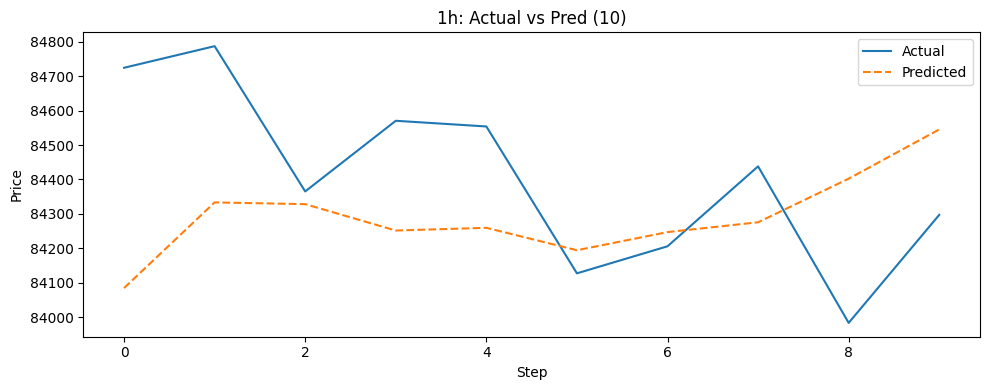

Horizons:  10%|█         | 1/10 [00:50<07:33, 50.39s/it]

1h: RMSE=327.98, MAPE=0.32%
[LGBM Tune] 2h


Horizons:  10%|█         | 1/10 [01:32<07:33, 50.39s/it]

  best_lgbm = {'n_estimators': 379, 'num_leaves': 42, 'max_depth': 3, 'learning_rate': 0.08315925053599856, 'feature_fraction': 0.9925105029140446, 'bagging_fraction': 0.6015683313730795, 'min_child_samples': 12}
[WFV] 2h (10 pts)



WFV 2h: 100%|██████████| 10/10 [00:03<00:00,  2.66it/s]


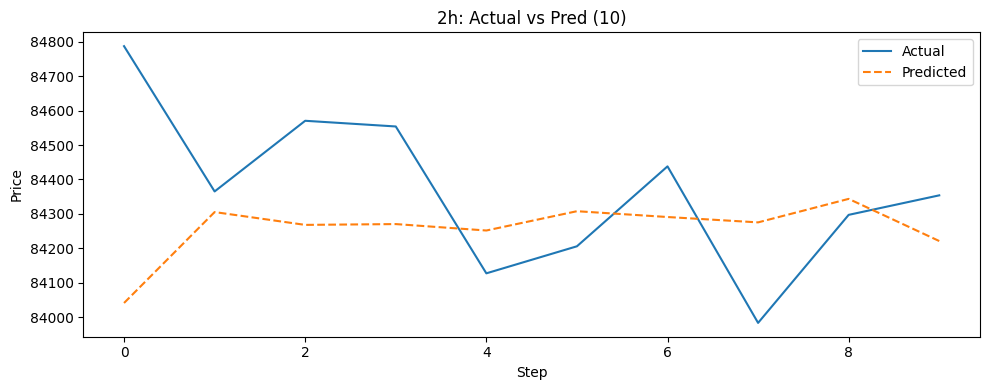

Horizons:  20%|██        | 2/10 [01:36<06:22, 47.78s/it]

2h: RMSE=297.54, MAPE=0.26%
[LGBM Tune] 3h


Horizons:  20%|██        | 2/10 [02:17<06:22, 47.78s/it]

  best_lgbm = {'n_estimators': 122, 'num_leaves': 17, 'max_depth': 10, 'learning_rate': 0.09392189192425288, 'feature_fraction': 0.8883410210726503, 'bagging_fraction': 0.7925255167890347, 'min_child_samples': 6}
[WFV] 3h (10 pts)



WFV 3h: 100%|██████████| 10/10 [00:01<00:00,  5.46it/s]


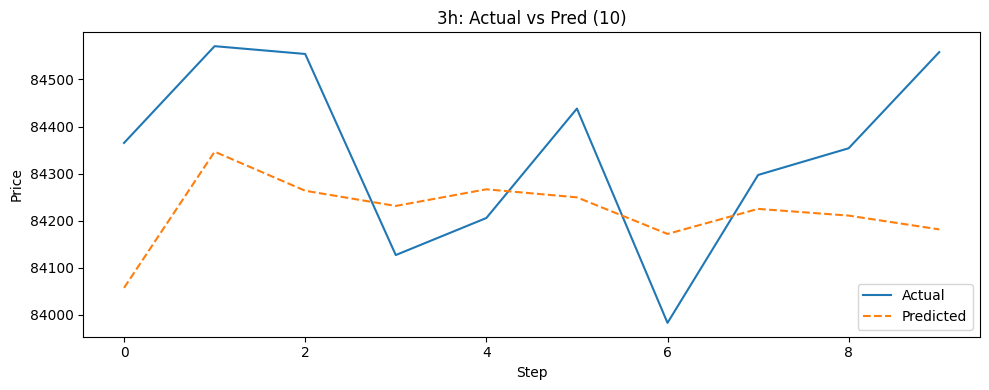

Horizons:  30%|███       | 3/10 [02:19<05:19, 45.62s/it]

3h: RMSE=219.57, MAPE=0.23%
[LGBM Tune] 6h


Horizons:  30%|███       | 3/10 [03:05<05:19, 45.62s/it]

  best_lgbm = {'n_estimators': 103, 'num_leaves': 26, 'max_depth': 8, 'learning_rate': 0.04937913044613302, 'feature_fraction': 0.8852032211026093, 'bagging_fraction': 0.7218478136739763, 'min_child_samples': 21}
[WFV] 6h (10 pts)



WFV 6h: 100%|██████████| 10/10 [00:01<00:00,  5.11it/s]


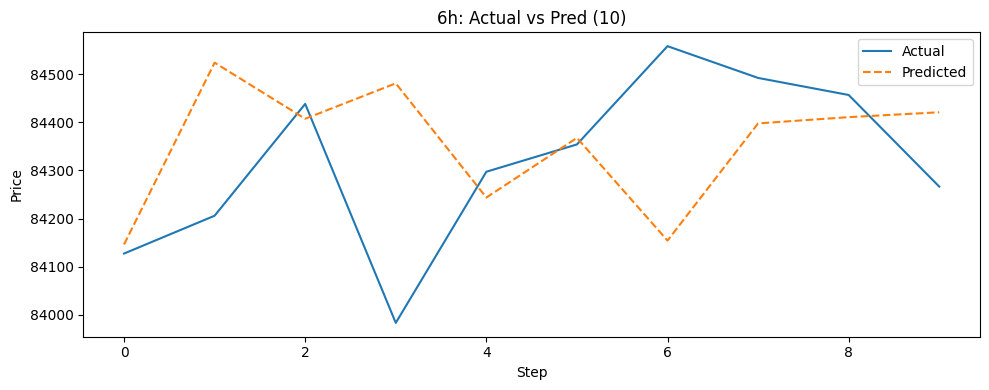

Horizons:  40%|████      | 4/10 [03:07<04:40, 46.76s/it]

6h: RMSE=234.71, MAPE=0.19%
[LGBM Tune] 12h


Horizons:  40%|████      | 4/10 [03:47<04:40, 46.76s/it]

  best_lgbm = {'n_estimators': 229, 'num_leaves': 56, 'max_depth': 3, 'learning_rate': 0.005880778039493421, 'feature_fraction': 0.9316254177309639, 'bagging_fraction': 0.6481245994883167, 'min_child_samples': 27}
[WFV] 12h (10 pts)



WFV 12h: 100%|██████████| 10/10 [00:02<00:00,  3.94it/s]


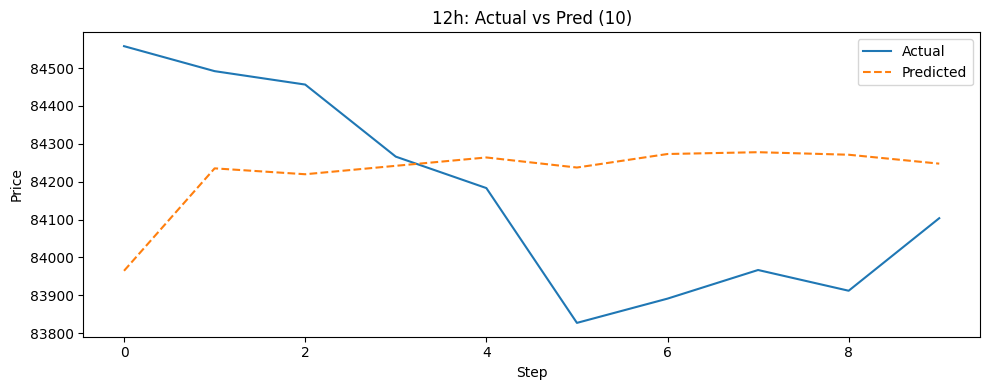

Horizons:  50%|█████     | 5/10 [03:50<03:45, 45.18s/it]

12h: RMSE=322.70, MAPE=0.33%
[LGBM Tune] 1d


Horizons:  50%|█████     | 5/10 [04:28<03:45, 45.18s/it]

  best_lgbm = {'n_estimators': 202, 'num_leaves': 17, 'max_depth': 8, 'learning_rate': 0.001159115443939908, 'feature_fraction': 0.6018877644879195, 'bagging_fraction': 0.6955775166802711, 'min_child_samples': 5}
[WFV] 1d (10 pts)



WFV 1d: 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]


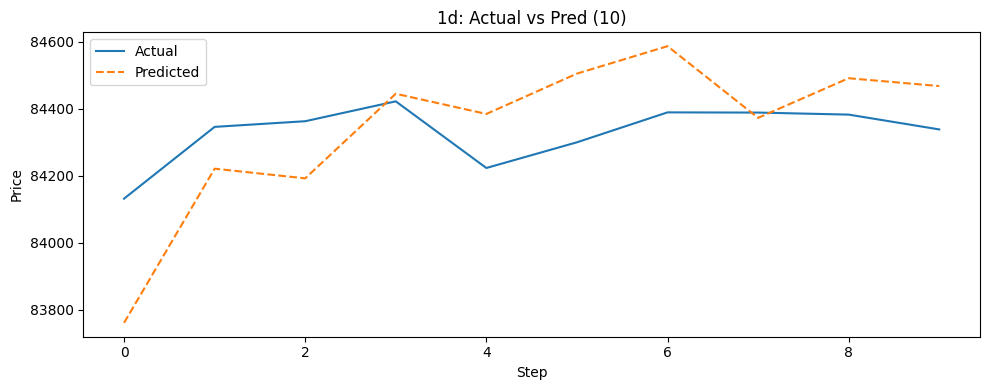

Horizons:  60%|██████    | 6/10 [04:31<02:55, 43.95s/it]

1d: RMSE=178.52, MAPE=0.18%
[LGBM Tune] 3d


Horizons:  60%|██████    | 6/10 [05:06<02:55, 43.95s/it]

  best_lgbm = {'n_estimators': 110, 'num_leaves': 23, 'max_depth': 3, 'learning_rate': 0.0011490456831547652, 'feature_fraction': 0.9050177226643623, 'bagging_fraction': 0.8481070985952764, 'min_child_samples': 6}
[WFV] 3d (10 pts)



WFV 3d: 100%|██████████| 10/10 [00:01<00:00,  7.79it/s]


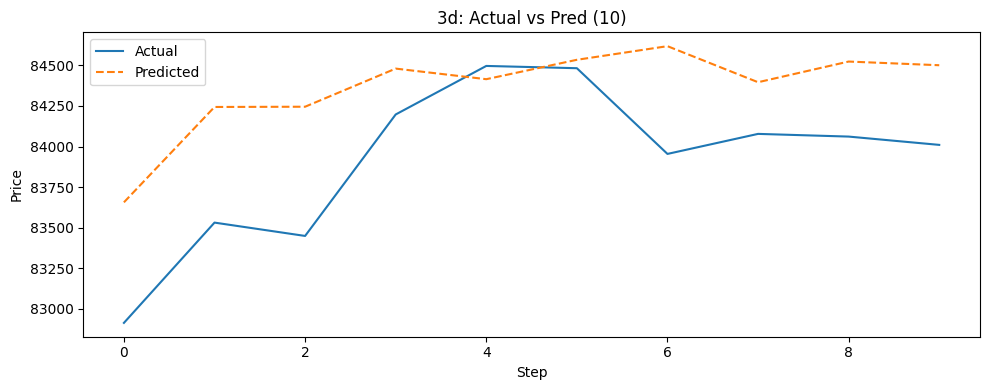

Horizons:  70%|███████   | 7/10 [05:07<02:03, 41.29s/it]

3d: RMSE=527.30, MAPE=0.55%
[LGBM Tune] 7d


Horizons:  70%|███████   | 7/10 [05:58<02:03, 41.29s/it]

  best_lgbm = {'n_estimators': 103, 'num_leaves': 55, 'max_depth': 7, 'learning_rate': 0.0010462484650099729, 'feature_fraction': 0.6684651815225673, 'bagging_fraction': 0.7915806204819233, 'min_child_samples': 21}
[WFV] 7d (10 pts)



WFV 7d: 100%|██████████| 10/10 [00:02<00:00,  4.25it/s]


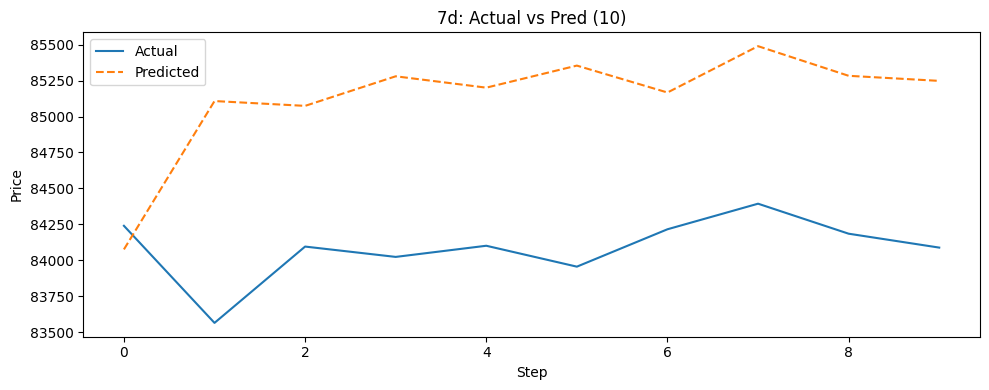

Horizons:  80%|████████  | 8/10 [06:01<01:30, 45.29s/it]

7d: RMSE=1129.10, MAPE=1.28%
[LGBM Tune] 15d


Horizons:  80%|████████  | 8/10 [06:37<01:30, 45.29s/it]

  best_lgbm = {'n_estimators': 199, 'num_leaves': 57, 'max_depth': 3, 'learning_rate': 0.0010367761688627136, 'feature_fraction': 0.6248860416767335, 'bagging_fraction': 0.740865783182344, 'min_child_samples': 21}
[WFV] 15d (10 pts)



WFV 15d: 100%|██████████| 10/10 [00:01<00:00,  5.91it/s]


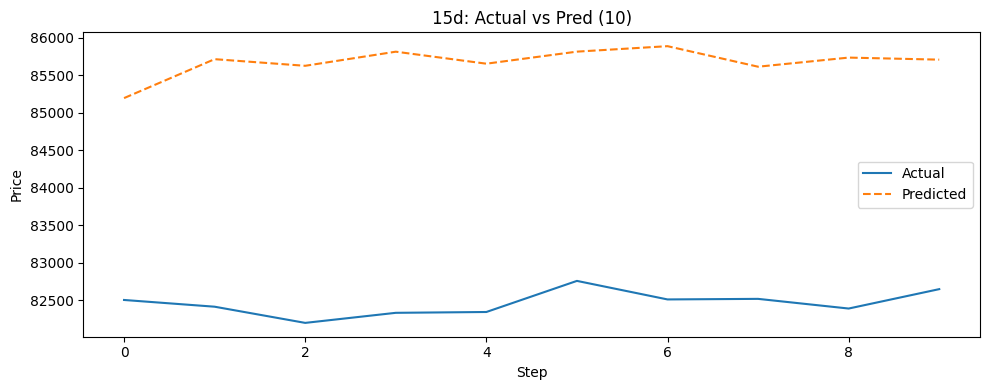

Horizons:  90%|█████████ | 9/10 [06:39<00:42, 42.97s/it]

15d: RMSE=3223.24, MAPE=3.90%
[LGBM Tune] 30d


Horizons:  90%|█████████ | 9/10 [07:18<00:42, 42.97s/it]

  best_lgbm = {'n_estimators': 107, 'num_leaves': 20, 'max_depth': 3, 'learning_rate': 0.0010046862227835864, 'feature_fraction': 0.7717367035550611, 'bagging_fraction': 0.7345628625739851, 'min_child_samples': 5}
[WFV] 30d (10 pts)



WFV 30d: 100%|██████████| 10/10 [00:01<00:00,  9.48it/s]


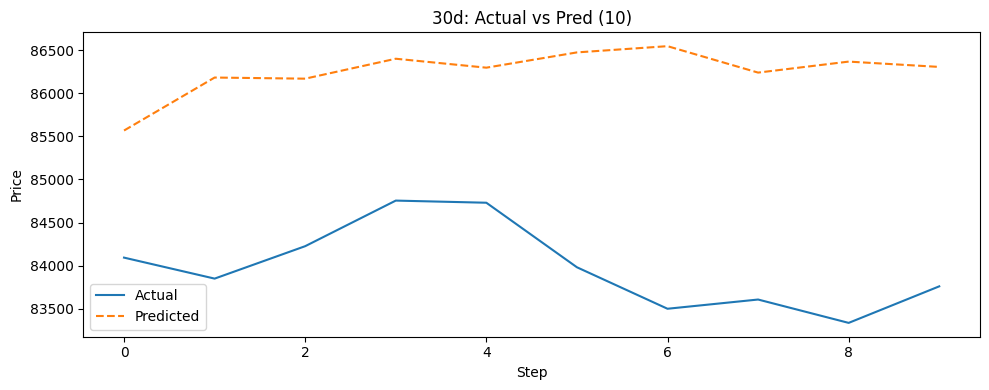

Horizons: 100%|██████████| 10/10 [07:20<00:00, 44.02s/it]

30d: RMSE=2337.83, MAPE=2.71%


In [2]:
import warnings
warnings.filterwarnings('ignore')

import logging
logging.getLogger('lightgbm').setLevel(logging.WARNING)
import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import STL
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import TimeSeriesSplit
from tqdm import tqdm
import matplotlib.pyplot as plt

# --- Paths to pre-split CSVs (95% train, 3% val, 2% test) ---
TRAIN_PATH = '/kaggle/input/data-btc/fix2/fix2/train.csv'
VAL_PATH   = '/kaggle/input/data-btc/fix2/fix2/val.csv'
TEST_PATH  = '/kaggle/input/data-btc/fix2/fix2/test.csv'

# 1) Load splits
df_tr = pd.read_csv(TRAIN_PATH, parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_va = pd.read_csv(VAL_PATH,   parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])
df_te = pd.read_csv(TEST_PATH,  parse_dates=['timestamp']).drop(columns=['timestamp','close_time'])

# 2) STL decomposition once (daily seasonality m=24)
PERIOD = 24
close_all = pd.concat([df_tr['close'], df_va['close'], df_te['close']], ignore_index=True)
stl_res   = STL(close_all, period=PERIOD, robust=True).fit()
trend_all = stl_res.trend.values
season_all= stl_res.seasonal.values

# 3) Slice STL into splits
n_tr, n_va = len(df_tr), len(df_va)
trend_tr, trend_va, trend_te = trend_all[:n_tr], trend_all[n_tr:n_tr+n_va], trend_all[n_tr+n_va:]
season_tr, season_va, season_te = season_all[:n_tr], season_all[n_tr:n_tr+n_va], season_all[n_tr+n_va:]

# 4) Define horizons (in hours)
horizons = {
    '1h':1, '2h':2, '3h':3, '6h':6, '12h':12,
    '1d':24, '3d':72, '7d':168, '15d':360, '30d':720
}

# Helper: prepare split with label shift and trimming
def prepare_split(df_full, trend_full, season_full, h):
    df = df_full.copy()
    df['label'] = df['close'].shift(-h)
    df['trend'] = trend_full[:len(df)]
    df['season'] = season_full[:len(df)]
    df.dropna(subset=['label'], inplace=True)
    df.reset_index(drop=True, inplace=True)
    return df

# --- Main loop per horizon ---
for label, h in tqdm(horizons.items(), desc='Horizons'):
    # Prepare splits
    df_train = prepare_split(df_tr, trend_tr,  season_tr,  h)
    df_val   = prepare_split(df_va, trend_va,  season_va,  h)
    df_test  = prepare_split(df_te, trend_te,  season_te,  h)

    # Combine train+val history
    df_hist = pd.concat([df_train, df_val], ignore_index=True)
    # Compute residual target = label - (trend+season)
    df_hist['residual'] = df_hist['label'] - (df_hist['trend'] + df_hist['season'])

    # Features and target
    FEATURES = ['close', 'trend', 'season']
    X_hist = df_hist[FEATURES]
    y_hist = df_hist['residual'].values

    # --- LightGBM tuning via Optuna ---
    tqdm.write(f'[LGBM Tune] {label}')
    def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 500),
            'num_leaves':    trial.suggest_int('num_leaves', 16, 64),
            'max_depth':     trial.suggest_int('max_depth', 3, 10),
            'learning_rate': trial.suggest_float('learning_rate', 1e-3, 1e-1, log=True),
            'feature_fraction': trial.suggest_float('feature_fraction', 0.6, 1.0),
            'bagging_fraction': trial.suggest_float('bagging_fraction', 0.6, 1.0),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 30),
            'verbose': -1, 'device': 'gpu'
        }
        tss = TimeSeriesSplit(n_splits=3)
        mses = []
        for tr_idx, va_idx in tss.split(X_hist):
            mdl = LGBMRegressor(random_state=42, **params)
            mdl.fit(X_hist.iloc[tr_idx], y_hist[tr_idx])
            preds = mdl.predict(X_hist.iloc[va_idx])
            mses.append(mean_squared_error(y_hist[va_idx], preds))
        return np.mean(mses)

    study = optuna.create_study(direction='minimize')
    study.optimize(objective, n_trials=20, show_progress_bar=False)
    best_lgbm = study.best_trial.params
    tqdm.write(f'  best_lgbm = {best_lgbm}')

    # --- Walk-forward validation: predict first 10 test points ---
    tqdm.write(f'[WFV] {label} (10 pts)')
    preds, trues = [], []
    df_hist_local = df_hist.copy()
    X_hist_local = X_hist.copy()
    y_hist_local = y_hist.copy()
    max_pts = min(10, len(df_test))
    for i in tqdm(range(max_pts), desc=f'WFV {label}'):
        # Prepare feature for test point
        feat = pd.DataFrame({
            'close':  [df_test['close'].iloc[i]],
            'trend':  [df_test['trend'].iloc[i]],
            'season': [df_test['season'].iloc[i]]
        })
        # Fit LGBM on history
        lgbm = LGBMRegressor(random_state=42, **best_lgbm)
        lgbm.fit(X_hist_local, y_hist_local)
        res_pred = lgbm.predict(feat)[0]
        # Reconstruct forecast
        forecast = df_test['trend'].iloc[i] + df_test['season'].iloc[i] + res_pred
        preds.append(forecast)
        trues.append(df_test['label'].iloc[i])
        # Update history with ground truth
        new_row = df_test.iloc[[i]].copy()
        new_row['residual'] = new_row['label'] - (new_row['trend'] + new_row['season'])
        df_hist_local = pd.concat([df_hist_local, new_row], ignore_index=True)
        X_hist_local = df_hist_local[FEATURES]
        y_hist_local = df_hist_local['residual'].values

    # Plot actual vs predicted
    plt.figure(figsize=(10,4))
    plt.plot(trues, label='Actual')
    plt.plot(preds, '--', label='Predicted')
    plt.title(f'{label}: Actual vs Pred (10)')
    plt.xlabel('Step'); plt.ylabel('Price')
    plt.legend(); plt.tight_layout(); plt.show()

    # Metrics
    rmse = mean_squared_error(trues, preds, squared=False)
    mape = mean_absolute_percentage_error(trues, preds)*100
    tqdm.write(f'{label}: RMSE={rmse:.2f}, MAPE={mape:.2f}%')
